In [1]:
import os 
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.models import Sequential 
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import MAE
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import MaxAbsScaler
from keras.callbacks import EarlyStopping
import math 

# 1개의 Model을 만드는 class이다.
# 목적은 아래의 class를 사용해 24개의 모델을 만들고 
# 이후, 24개의 모델의 평가지표 MAE를 산술평균을 구한다. 

class drift_LSTM:
    
    def __init__(self, train_dataset_list: list, test_dataset: pd.DataFrame, window_size):

        self.train_dataset_list = train_dataset_list # len(23)
        self.test_dataset = test_dataset # len(1)
        self.window_size = window_size
        
        self.feature_name = ['wind_y', 'wind_x', 'water_velocity_y', 'water_velocity_x']
        # 23개 train
        self.train_features = []
        self.train_lon = []
        self.train_lat = []
        # 1개 validaition
        self.test_features = None
        self.test_lon = None
        self.test_lat = None
        self.X = None
        # cross-validation으로  LOOCV를 사용한다.
        # window가 나눠진 train set 
        self.X_train_list = []
        self.y_train_lon_list = []
        self.y_train_lat_list = []
        
        # window가 나눠진 test set (Not List) 
        self.X_test = None
        self.y_test_lon = None
        self.y_test_lat = None
        
        # plot 및 NCLS 사용하는 예측 경도 위도 좌표 (변화량이 아니다.)
        self.lon_pred = None # 크기는 : (lon_len, )
        self.lat_pred = None # 크기는 : (lat_len, )
        
        # Model 담기
        self.model_lon = None
        self.model_lat = None
        
        # 지표
        self. basemodel_mae = None
        self. basemodel_NCLS = None
        self. LSTM_mae = None
        self. LSTM_NCLS = None
        
        # 스케일링 모델
        self.scaler = None
    
    def maxabs_scaler(self):
        df = self.train_dataset_list[0][self.feature_name]
        for i in range (1,len(self.train_dataset_list)):
            df = pd.concat([df,self.train_dataset_list[i][self.feature_name]], ignore_index=True)
        maxabs_scaler = MaxAbsScaler()
        maxabs_scaler.fit(df)
        self.scaler = maxabs_scaler
            
    
    # train_dataset_list, test_dataset에 diff columns을 만드는 함수 
    def make_diff(self):
        # train
        for i in range(len(self.train_dataset_list)): # 0 ~ 23
            # 변화량 columns 생성
            self.train_dataset_list[i]['diff_lon'] = 0
            self.train_dataset_list[i]['diff_lat'] = 0
            # print(self.train_dataset_list[i]) # 13번 출력하고 나가리  
            for j in range(len(self.train_dataset_list[i])-1,0,-1):
                self.train_dataset_list[i].loc[j,'diff_lon'] = self.train_dataset_list[i].loc[j,'obs_x1_lon'] - self.train_dataset_list[i].loc[j-1,'obs_x1_lon']
                self.train_dataset_list[i].loc[j,'diff_lat'] = self.train_dataset_list[i].loc[j,'obs_x1_lat'] - self.train_dataset_list[i].loc[j-1,'obs_x1_lat']
        # test 
        self.test_dataset['diff_lon'] = 0
        self.test_dataset['diff_lat'] = 0
        for k in range(len(self.test_dataset)-1,0,-1):
                self.test_dataset.loc[k,'diff_lon'] = self.test_dataset.loc[k,'obs_x1_lon'] - self.test_dataset.loc[k-1,'obs_x1_lon']
                self.test_dataset.loc[k,'diff_lat'] = self.test_dataset.loc[k,'obs_x1_lat'] - self.test_dataset.loc[k-1,'obs_x1_lat']
            
    # 훈련때 사용하는 feature와 label만을 남겨두는 함수(window 나누기 전이다.)
    def split_feature_label(self): 
        # X_train
        # seq을 담을 List 
        for i in range(len(self.train_dataset_list)):
            self.train_features.append(self.train_dataset_list[i][self.feature_name])
            self.train_lon.append(self.train_dataset_list[i]['diff_lon'])
            self.train_lat.append(self.train_dataset_list[i]['diff_lat'])
        
        # test
        self.test_features = self.test_dataset[self.feature_name]
        self.test_lon = self.test_dataset['diff_lon']
        self.test_lat = self.test_dataset['diff_lat']
                
    def make_dataset(self):
        self.maxabs_scaler() # 정규화
        self.make_diff() # 변화량
        self.split_feature_label() # 훈련 때 사용하는 것들만 빼오기
        # train
        
        for i in range(len(self.train_features)):
            # feature에는 24개의 case가 존재 (len(self.feature) = 24)
            # case 한 개씩 접근하면서 window size만큼의 dataset 만들기 
            self.train_features[i] = self.scaler.transform(self.train_features[i])

            train_X, train_y_lon, train_y_lat = list(), list(), list()
            
            # case 당 크기를 계산한다. 
            for j in range(len(self.train_features[i])):
                # numpy로 변환
                train_X_tmp = self.train_features[i]
                train_y_tmp_lon = self.train_lon[i].values
                train_y_tmp_lat = self.train_lat[i].values
                
                start = j
                end = start + self.window_size
                if(end < self.train_features[i].shape[0]):
                    train_X.append(train_X_tmp[start:end][:])
                    train_y_lon.append(train_y_tmp_lon[end])
                    train_y_lat.append(train_y_tmp_lat[end]) 
            self.X_train_list.append(np.array(train_X))
            self.y_train_lon_list.append(np.array(train_y_lon))
            self.y_train_lat_list.append(np.array(train_y_lat))
        
        self.X = self.X_train_list[0]
        self.y_lon = self.y_train_lon_list[0]
        self.y_lat = self.y_train_lat_list[0]
        
        for i in range(1,len(self.train_features)):
            self.X = np.concatenate((self.X, self.X_train_list[i]),axis = 0)
            self.y_lon = np.concatenate((self.y_lon, self.y_train_lon_list[i]),axis = 0)
            self.y_lat = np.concatenate((self.y_lat, self.y_train_lat_list[i]),axis = 0)
            
        
        # test 
        test_X, test_y_lon, test_y_lat = list(), list(), list()
        for k in range(len(self.test_features)):
            
            test_X_tmp = self.scaler.transform(self.test_features)
            # numpy로 변환
            test_y_tmp_lon = self.test_lon.values
            test_y_tmp_lat = self.test_lat.values
                
            start = k
            end = start + self.window_size
            if(end < self.test_features.shape[0]):
                test_X.append(test_X_tmp[start:end][:])
                test_y_lon.append(test_y_tmp_lon[end])
                test_y_lat.append(test_y_tmp_lat[end]) 
        self.X_test = np.array(test_X)
        self.y_test_lon = np.array(test_y_lon)
        self.y_test_lat = np.array(test_y_lat)
        return self.y_lon
        
        
    def bulid_LSTM(self, window_size: int, n_features: int, LSTM_layer_units: list, Dense_layer_units: list, activation: str ,learning_rate: int):
        model = Sequential()
         
        # LSTM layer 
        if len(LSTM_layer_units) > 1:
            model.add(LSTM(units = LSTM_layer_units[0],
                           activation = activation,
                           return_sequences = True,
                           input_shape = (window_size,n_features))
                     )
            LSTM_layer_units = LSTM_layer_units[1:]
            for i, unit in enumerate(LSTM_layer_units, start = 1):
                if i == len(LSTM_layer_units):
                    model.add(LSTM(units = unit,
                                  activation = activation,
                                  return_sequences = False)
                             )
                else:
                    model.add(LSTM(units = LSTM_layer_units[i],
                                  activation = activation,
                                  return_sequences = True)
                             )
        else:
            model.add(LSTM(units = LSTM_layer_units[0],
                          activation = activation,
                          return_sequences = False,
                          input_shape = (window_size, n_features))
                     )
                
        # Dence Layer
        if len(Dense_layer_units)>0 :
            for unit in Dense_layer_units:
                model.add(Dense(units = unit, activation = activation))
            model.add(Dense(1))    
        else:  
            model.add(Dense(1))
        optimizer = Adam(learning_rate = learning_rate)
        model.compile(optimizer = optimizer, loss = MAE, metrics = ['mae','mse'])
        # model 저장 
        self.model = model
        return model
    
    def model_fit(self,window_size, n_features, LSTM_layer_units: list, Dense_layer_units: list, learning_rate ):
        
        # model 생성
        model_lon = self.bulid_LSTM(window_size, n_features, LSTM_layer_units, Dense_layer_units, 'relu', learning_rate)
        model_lat = self.bulid_LSTM(window_size, n_features, LSTM_layer_units, Dense_layer_units, 'relu', learning_rate)     
        model_lon.summary()
        # 이거 바꾸기 
        print('---------------------------------- lat_model_train  ----------------------------------------------------------')
        model_lon.fit(self.X,self.y_lon,epochs=300)
        print('---------------------------------- lat_model_train  ----------------------------------------------------------')
        model_lat.fit(self.X,self.y_lat,epochs=300) 
        
        self.model_lon = model_lon 
        self.model_lat = model_lat
        
        return model_lon, model_lat 
    
    # 모델 평가하기
    def model_evaluation(self):
        
#         q = self.y_test_lon.reshape((self.y_test_lon.shape[0],1))
#         p = self.y_test_lat.reshape((self.y_test_lat.shape[0],1))
#         y = np.concatenate((q,p),axis= 1)
        
#         self.lon_pred = self.model_lon.predict(self.X_test)
#         self.lat_pred = self.model_lat.predict(self.X_test)
#         lon_pred = self.lon_pred.reshape((self.lon_pred.shape[0],1))
#         lat_pred = self.lat_pred.reshape((self.lat_pred.shape[0],1))
#         lstm_y = np.concatenate((lon_pred, lat_pred),axis = 1)
#         LSTM_mae = mean_absolute_error(y, lstm_y)
        
#         model_lon_diff = np.zeros((len(self.test_dataset),))
#         model_lat_diff = np.zeros((len(self.test_dataset),))
#         for k in range(len(self.test_dataset)-1,0,-1):
#                 model_lon_diff[k] = self.test_dataset.loc[k,'model_x2_lon'] - self.test_dataset.loc[k-1,'model_x2_lon']
#                 model_lon_diff[k] = self.test_dataset.loc[k,'model_x2_lat'] - self.test_dataset.loc[k-1,'model_x2_lat']
    
#         baseline_lon = model_lon_diff[self.window_size:]
#         baseline_lat = model_lat_diff[self.window_size:] 
#         baseline_lon = baseline_lon.reshape((baseline_lon.shape[0],1))
#         baseline_lat = baseline_lat.reshape((baseline_lat.shape[0],1))

        self.lon_pred = self.model_lon.predict(self.X_test)
        self.lat_pred = self.model_lat.predict(self.X_test)
        value_lon = self.test_dataset['obs_x1_lon']
        value_lon = np.array(value_lon[self.window_size:])
        value_lon = np.insert(value_lon,0,self.test_dataset['obs_x1_lon'][self.window_size-1])
        value_lon = value_lon.reshape(value_lon.shape[0],1)
        value_lat = self.test_dataset['obs_x1_lat']
        value_lat = np.array(value_lat[self.window_size:])
        value_lat = np.insert(value_lat,0,self.test_dataset['obs_x1_lat'][self.window_size-1])
        value_lat = value_lat.reshape(value_lat.shape[0],1)
        y = np.concatenate((value_lon, value_lat),axis= 1)
        
        baseline_lon = self.test_dataset['model_x2_lon']
        baseline_lon = np.array(baseline_lon[self.window_size:])
        baseline_lon = np.insert(baseline_lon,0,self.test_dataset['obs_x1_lon'][self.window_size-1])
        baseline_lon = baseline_lon.reshape(baseline_lon.shape[0],1)
        baseline_lat = self.test_dataset['model_x2_lat']
        baseline_lat = np.array(baseline_lat[self.window_size:])
        baseline_lat = np.insert(baseline_lat,0,self.test_dataset['obs_x1_lat'][self.window_size-1])
        baseline_lat = baseline_lat.reshape(baseline_lat.shape[0],1)
        base_y = np.concatenate((baseline_lon, baseline_lat),axis= 1)
        
        # 예측값 
        first_lon = self.test_dataset['obs_x1_lon']
        first_lon = first_lon[self.window_size-1]
        first_lat = self.test_dataset['obs_x1_lat']
        first_lat = first_lat[self.window_size-1]
    
        lon_pred = np.zeros((self.lon_pred.shape[0],))
        lat_pred = np.zeros((self.lat_pred.shape[0],))
        
        lon_pred[0] = first_lon + self.lon_pred[0]
        lat_pred[0] = first_lat + self.lat_pred[0]
        
        for i in range(1,self.lon_pred.shape[0]):
            lon_pred[i] = lon_pred[i-1] + self.lon_pred[i]
            lat_pred[i] = lat_pred[i-1] + self.lat_pred[i]
        lon_pred = np.insert(lon_pred,0,self.test_dataset['obs_x1_lon'][self.window_size-1])
        lat_pred = np.insert(lat_pred,0,self.test_dataset['obs_x1_lat'][self.window_size-1])
        lon_pred = lon_pred.reshape(lon_pred.shape[0],1)
        lat_pred = lat_pred.reshape(lat_pred.shape[0],1)
        LSTM_y = np.concatenate((lon_pred, lat_pred),axis= 1)
        
        
        Basemodel_mae = mean_absolute_error(y, base_y)
        LSTM_mae = mean_absolute_error(y, LSTM_y)
        

        # MAE
        print('Basemodel_mae : ',Basemodel_mae)
        print('LSTM_mae : ',LSTM_mae)
#         print('LSTM_lat_mae : ',LSTM_lat_mae)
        
        # NCLS
        basemodel_NCLS, LSTM_NCLS = self.NCLS_score()
        print('baseline_NCLS : ',basemodel_NCLS)
        print('LSTM_NCLS : ',LSTM_NCLS)
        
        self.basemodel_mae = Basemodel_mae 
        self.basemodel_NCLS = basemodel_NCLS
        self.LSTM_mae =  LSTM_mae
        self.LSTM_NCLS = LSTM_NCLS
        
        return Basemodel_mae, LSTM_mae, basemodel_NCLS, LSTM_NCLS
        
    
    def drift_trajection_show(self): 
        import matplotlib.pyplot as plt
        %matplotlib inline
        print("BaseModel의 Mean_Absolute_Error : ", self.basemodel_mae)
        print("LSTM의 Mean_Absolute_Error : ", self.LSTM_mae)
        print("BaseModel의 NCLS : ", self.basemodel_NCLS)
        print("LSTM의 NCLS : ", self.LSTM_NCLS)
        
        value_lon = self.test_dataset['obs_x1_lon']
        value_lon = np.array(value_lon[self.window_size:])
        value_lon = np.insert(value_lon,0,self.test_dataset['obs_x1_lon'][self.window_size-1])
    
        value_lat = self.test_dataset['obs_x1_lat']
        value_lat = np.array(value_lat[self.window_size:])
        value_lat = np.insert(value_lat,0,self.test_dataset['obs_x1_lat'][self.window_size-1])
        
        baseline_lon = self.test_dataset['model_x2_lon']
        baseline_lon = np.array(baseline_lon[self.window_size:])
        baseline_lon = np.insert(baseline_lon,0,self.test_dataset['obs_x1_lon'][self.window_size-1])
        
        baseline_lat = self.test_dataset['model_x2_lat']
        baseline_lat = np.array(baseline_lat[self.window_size:])
        baseline_lat = np.insert(baseline_lat,0,self.test_dataset['obs_x1_lat'][self.window_size-1])
        
        # 예측값 
        first_lon = self.test_dataset['obs_x1_lon']
        first_lon = first_lon[self.window_size-1]
        first_lat = self.test_dataset['obs_x1_lat']
        first_lat = first_lat[self.window_size-1]
    
        lon_pred = np.zeros((self.lon_pred.shape[0],))
        lat_pred = np.zeros((self.lat_pred.shape[0],))
        
        lon_pred[0] = first_lon + self.lon_pred[0]
        lat_pred[0] = first_lat + self.lat_pred[0]
        
        for i in range(1,self.lon_pred.shape[0]):
            lon_pred[i] = lon_pred[i-1] + self.lon_pred[i]
            lat_pred[i] = lat_pred[i-1] + self.lat_pred[i]
        lon_pred = np.insert(lon_pred,0,self.test_dataset['obs_x1_lon'][self.window_size-1])
        lat_pred = np.insert(lat_pred,0,self.test_dataset['obs_x1_lat'][self.window_size-1])
        
        plt.plot(value_lon, value_lat,'r-' ,baseline_lon, baseline_lat, 'g-', lon_pred, lat_pred, 'skyblue')
        
    def NCLS_score(self): # 1시간 
        # 실제값 
        value_lon = self.test_dataset['obs_x1_lon']
        value_lon = np.array(value_lon[self.window_size:])
        value_lat = self.test_dataset['obs_x1_lat']
        value_lat = np.array(value_lat[self.window_size:])
        
        # baseline의 NCLS 구하기
        pre_lon = self.test_dataset['model_x2_lon']
        pre_lon = np.array(pre_lon[self.window_size:])
        pre_lat = self.test_dataset['model_x2_lat']
        pre_lat = np.array(pre_lat[self.window_size:])
        
        # 공통 dl_i 구하기 
        dl_list, dl_sum, o_sum = list(), list(), 0
        for i in range(1,value_lon.shape[0]):
            # 위도 1도는 111.321  # 경도 1도는 55.802km
            height = value_lon[i] - value_lon[i-1]
            d_lon = 55.802 * height
            width = value_lat[i] - value_lat[i-1]
            d_lat = 111.321 * width
            # 거리 구하기
            point_distance = np.sqrt(np.power(d_lon,2) + np.power(d_lat,2))
            dl_list.append(point_distance)
        for i in range(len(dl_list)):
            temp = 0
            for j in range(i+1):
                temp += dl_list[j]
            dl_sum.append(temp)

        for i in range(len(dl_sum)):
            o_sum += dl_sum[i]
        
        # basemodel의 d_i 구하기
        basemodel_d_list = list()
        for i in range(1,value_lon.shape[0]):
            # 위도 1도는 111.321 # 경도 1도는 55.802km
            height = value_lon[i] - pre_lon[i]
            d_lon = 55.802 * height
            width = value_lat[i] - pre_lat[i]
            d_lat = 111.321 * width
            # 거리 구하기
            point_distance = np.sqrt(np.power(d_lon,2) + np.power(d_lat,2))
            basemodel_d_list.append(point_distance)

        # basemodel_s 구하기
        basemodel_d_sum, basemodel_s = 0, 0

        for i in range(len(basemodel_d_list)):
            basemodel_d_sum += basemodel_d_list[i]

        basemodel_s = basemodel_d_sum/o_sum
        
        if basemodel_s > 1:
                basemodel_ss_score = 0
        else:
            basemodel_ss_score = 1-basemodel_s
        
        # my model 예측값 구하기
        np.set_printoptions(threshold=1200,linewidth=np.inf)
        
        first_lon = self.test_dataset['obs_x1_lon']
        first_lon = first_lon[self.window_size-1]
        
        first_lat = self.test_dataset['obs_x1_lat']
        first_lat = first_lat[self.window_size-1]
        
        # 실제 위도경도 구하기
        lon_pred = np.zeros((len(pre_lon),))
        lat_pred = np.zeros((len(pre_lat),))
        
        lon_pred[0] = first_lon + self.lon_pred[0]
        lat_pred[0] = first_lat + self.lat_pred[0]
        
        for i in range(1,len(pre_lon)):
            lon_pred[i] = lon_pred[i-1] + self.lon_pred[i]
            lat_pred[i] = lat_pred[i-1] + self.lat_pred[i]
        
        # d_i 구하기
        LSTM_d_list = list()
        
        for i in range(1,pre_lon.shape[0]):
            # 위도 1도는 111.321, 경도 1도는 55.802km
            # 시작이 4번째 index이다. 
            height = value_lon[i] - lon_pred[i]
            d_lon = 55.802 * height  
            width = value_lat[i] - lat_pred[i]
            d_lat = 111.321 * width 
            # 거리 구하기
            point_distance = np.sqrt(np.power(d_lon,2) + np.power(d_lat,2))
            LSTM_d_list.append(point_distance)
        
# lightgbm (overfitting 문제가 있다.)
# 모델 차이 or 데이터의 자체의 feature 
# dl_i 구하기 
        
        # s 구하기
        LSTM_d_sum, LSTM_s = 0, 0
        
        for i in range(len(LSTM_d_list)):
            LSTM_d_sum += LSTM_d_list[i]
                
        LSTM_s = LSTM_d_sum/o_sum
        if LSTM_s >1 :
            LSTM_ss_score = 0
        else:
            LSTM_ss_score = 1-(LSTM_s)
        
        return basemodel_ss_score, LSTM_ss_score

In [2]:
import os
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt

dir_path = 'C:\\Users\\gusrl\\opendrift\\drift_trajection'

dataset_list = list()
# train 
train_list = list()

#test
test = None

# 2016 (case 7)
dataset_list.append(pd.read_csv(os.path.join(dir_path,'2016_case_003.csv')))
dataset_list.append(pd.read_csv(os.path.join(dir_path,'2016_case_005.csv')))
dataset_list.append(pd.read_csv(os.path.join(dir_path,'2016_case_010.csv')))
dataset_list.append(pd.read_csv(os.path.join(dir_path,'2016_case_011.csv')))
dataset_list.append(pd.read_csv(os.path.join(dir_path,'2016_case_015.csv')))
dataset_list.append(pd.read_csv(os.path.join(dir_path,'2016_case_016.csv')))
dataset_list.append(pd.read_csv(os.path.join(dir_path,'2016_case_040.csv')))

# 2018(case 14)
dataset_list.append(pd.read_csv(os.path.join(dir_path,'2018_case_005.csv')))
# dataset_list.append(pd.read_csv(os.path.join(dir_path,'2018_case_008.csv')))
dataset_list.append(pd.read_csv(os.path.join(dir_path,'2018_case_017.csv')))
dataset_list.append(pd.read_csv(os.path.join(dir_path,'2018_case_027.csv')))
dataset_list.append(pd.read_csv(os.path.join(dir_path,'2018_case_032.csv')))
dataset_list.append(pd.read_csv(os.path.join(dir_path,'2018_case_034.csv')))
# dataset_list.append(pd.read_csv(os.path.join(dir_path,'2018_case_045.csv')))
dataset_list.append(pd.read_csv(os.path.join(dir_path,'2018_case_047.csv')))
dataset_list.append(pd.read_csv(os.path.join(dir_path,'2018_case_082.csv')))
dataset_list.append(pd.read_csv(os.path.join(dir_path,'2018_case_083.csv')))
dataset_list.append(pd.read_csv(os.path.join(dir_path,'2018_case_090.csv')))
dataset_list.append(pd.read_csv(os.path.join(dir_path,'2018_case_095.csv')))
dataset_list.append(pd.read_csv(os.path.join(dir_path,'2018_case_097.csv')))

# 2019(case 5)
dataset_list.append(pd.read_csv(os.path.join(dir_path,'2019_case_000.csv')))
dataset_list.append(pd.read_csv(os.path.join(dir_path,'2019_case_001.csv')))
dataset_list.append(pd.read_csv(os.path.join(dir_path,'2019_case_006.csv')))
# df_2019_list.append(pd.read_csv(os.path.join(dir_path,'2019_case_007.csv'))) (제외)
dataset_list.append(pd.read_csv(os.path.join(dir_path,'2019_case_005.csv')))

dataset_list[5]

,time,obs_x1_lon,obs_x1_lat,model_x2_lon,model_x2_lat,wind_y,wind_x,water_velocity_y,water_velocity_x
0,2016-02-12 15:00,129.94164,37.33764,129.96169,37.344300,8.686428,3.829966,0.003480,0.406080
1,2016-02-12 16:00,129.95497,37.35394,129.98099,37.350990,7.952411,2.870588,-0.018331,0.403051
2,2016-02-12 17:00,129.97040,37.37006,129.99889,37.356600,7.666597,1.976911,-0.044330,0.393772
3,2016-02-12 18:00,129.98650,37.38218,130.01633,37.361620,7.629689,1.392242,-0.074577,0.382194
4,2016-02-12 19:00,130.00127,37.39033,130.03374,37.366467,7.631970,2.142313,-0.073813,0.373700
...,...,...,...,...,...,...,...,...,...
67,2016-02-15 10:00,131.00049,37.38454,130.66078,37.445568,-3.870946,7.753403,0.174699,0.112541
68,2016-02-15 11:00,131.03621,37.38204,130.66553,37.450966,-3.822586,8.063922,0.169211,0.115128
69,2016-02-15 12:00,131.06995,37.37869,130.67035,37.456170,-4.127720,8.206757,0.161889,0.119003
70,2016-02-15 13:00,131.10228,37.37473,130.67499,37.461360,-1.837945,7.447971,0.159763,0.116035


In [3]:
# preprocessing 결측치 제거하기 

num = 0
for df in dataset_list:
    s = df['obs_x1_lon'].isnull().value_counts()
    if len(s) > 1:
        print('index of dataset_case containing missing values(lon) : ', num,'index')
    num += 1
    
for i in range(len(dataset_list)):
    dataset_list[i] = dataset_list[i].dropna(axis=0)
    dataset_list[i] = dataset_list[i].reset_index(drop=True)

index of dataset_case containing missing values(lon) :  3 index
index of dataset_case containing missing values(lon) :  12 index
index of dataset_case containing missing values(lon) :  19 index
index of dataset_case containing missing values(lon) :  20 index


In [65]:
dataset_list[10]

,time,obs_x1_lon,obs_x1_lat,model_x2_lon,model_x2_lat,wind_y,wind_x,water_velocity_y,water_velocity_x
0,2018-11-18 15:00,125.6262,35.10049,125.625380,35.103867,-0.921028,-0.918791,0.240709,0.054791
1,2018-11-18 16:00,125.6253,35.09720,125.620056,35.098330,-1.451840,-1.525544,-0.009906,-0.046977
2,2018-11-18 17:00,125.6208,35.08480,125.611720,35.083960,-2.211263,-1.705997,-0.266707,-0.138901
3,2018-11-18 18:00,125.6132,35.06380,125.602356,35.061928,-3.237454,-1.730063,-0.486857,-0.179809
4,2018-11-18 19:00,125.6042,35.03600,125.593630,35.035423,-5.016811,-1.666796,-0.643801,-0.187544
...,...,...,...,...,...,...,...,...,...
67,2018-11-21 10:00,125.1388,34.84449,125.604790,34.884907,-10.385021,-4.728918,-0.700375,-0.035955
68,2018-11-21 11:00,125.1257,34.81669,125.603264,34.877132,-12.576258,-5.707587,-0.399743,-0.026221
69,2018-11-21 12:00,125.1098,34.79820,125.601460,34.882153,-12.174225,-6.275246,-0.007480,-0.049058
70,2018-11-21 13:00,125.0928,34.78949,125.600380,34.898540,-11.450141,-7.226152,0.372682,-0.039278


In [84]:
# 연습코드
model_list, evaluation_list  = list(), list()
test = dataset_list[16]
train_list = dataset_list[0:16] + dataset_list[17:len(dataset_list)]
model = drift_LSTM(train_list, test, 5)
model.make_dataset() # error
# window_size, num_feature, num_LSTM_units_list, num_Dense_units_list, learning_rate 
lon_model, lat_model = model.model_fit(5, 4, [100],[50], 0.001)
model_list.append(model)
basemodel_mae, LSTM_mae, basemodel_NCLS, LSTM_NCLS = model.model_evaluation()
li = [basemodel_mae, LSTM_mae, basemodel_NCLS, LSTM_NCLS]
evaluation_list.append(li)

Model: "sequential_90"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_90 (LSTM)              (None, 100)               42000     
                                                                 
 dense_180 (Dense)           (None, 50)                5050      
                                                                 
 dense_181 (Dense)           (None, 1)                 51        
                                                                 
Total params: 47,101
Trainable params: 47,101
Non-trainable params: 0
_________________________________________________________________
---------------------------------- lat_model_train  ----------------------------------------------------------
Epoch 1/300
44/44 [==============================] - 2s 3ms/step - loss: 0.0099 - mae: 0.0099 - mse: 1.6807e-04
Epoch 2/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0081 - mae: 0.0

44/44 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0020 - mse: 8.5764e-06
Epoch 138/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0024 - mae: 0.0024 - mse: 1.0911e-05
Epoch 139/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0023 - mae: 0.0023 - mse: 1.0548e-05
Epoch 140/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0022 - mse: 9.5538e-06
Epoch 141/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0025 - mae: 0.0025 - mse: 1.1576e-05
Epoch 142/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0023 - mae: 0.0023 - mse: 1.0547e-05
Epoch 143/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0022 - mse: 9.6403e-06
Epoch 144/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0020 - mse: 8.7747e-06
Epoch 145/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0021 - mse:

Epoch 209/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.2019e-06
Epoch 210/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.9840e-06
Epoch 211/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.9361e-06
Epoch 212/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.5008e-06
Epoch 213/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.8835e-06
Epoch 214/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.8180e-06
Epoch 215/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.9743e-06
Epoch 216/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0018 - mse: 5.9916e-06
Epoch 217/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0016 - mae:

44/44 [==============================] - 0s 3ms/step - loss: 0.0033 - mae: 0.0033 - mse: 2.4949e-05
Epoch 52/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0036 - mae: 0.0036 - mse: 2.7622e-05
Epoch 53/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0033 - mae: 0.0033 - mse: 2.4354e-05
Epoch 54/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0036 - mae: 0.0036 - mse: 2.6312e-05
Epoch 55/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0032 - mae: 0.0032 - mse: 2.2318e-05
Epoch 56/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0032 - mae: 0.0032 - mse: 2.2277e-05
Epoch 57/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0033 - mae: 0.0033 - mse: 2.3229e-05
Epoch 58/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0034 - mae: 0.0034 - mse: 2.3557e-05
Epoch 59/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0038 - mae: 0.0038 - mse: 2.7445e

Epoch 195/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.7184e-06
Epoch 196/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.8561e-06
Epoch 197/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.1631e-06
Epoch 198/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.2560e-06 
Epoch 199/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.3908e-06
Epoch 200/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.0562e-06
Epoch 201/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.4221e-06
Epoch 202/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.2673e-06
Epoch 203/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0014 - mae

BaseModel의 Mean_Absolute_Error :  0.22028712499999972
LSTM의 Mean_Absolute_Error :  0.09420131187887743
BaseModel의 NCLS :  0.39533692110583707
LSTM의 NCLS :  0.7267598552081056


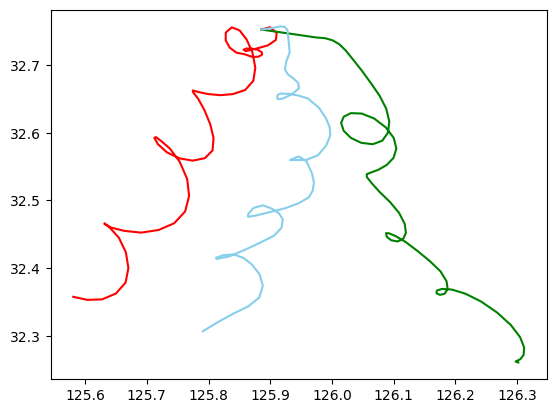

In [85]:
model.drift_trajection_show()

In [4]:
model_list, evaluation_list  = list(), list()
# Basemodel_lon_mae, Basemodel_lat_mae, LSTM_lon_mae, LSTM_lat_mae, basemodel_NCLS, LSTM_NCLS
for i in range(len(dataset_list)):
    print( '--------------------- Model_', i,' ----------------------')
    test = dataset_list[i]
    train_list = dataset_list[0:i] + dataset_list[i+1:len(dataset_list)]
    model = drift_LSTM(train_list, test, 5)
    model.make_dataset() # error
    # window_size, num_feature, num_LSTM_units_list, num_Dense_units_list, learning_rate 
    lon_model, lat_model = model.model_fit(5, 4, [100],[70], 0.001)
    model_list.append(model)
    basemodel_mae, LSTM_mae, basemodel_NCLS, LSTM_NCLS = model.model_evaluation()
    li = [basemodel_mae, LSTM_mae, basemodel_NCLS, LSTM_NCLS]
    evaluation_list.append(li)

--------------------- Model_ 0  ----------------------
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 100)               42000     
                                                                 
 dense (Dense)               (None, 70)                7070      
                                                                 
 dense_1 (Dense)             (None, 1)                 71        
                                                                 
Total params: 49,141
Trainable params: 49,141
Non-trainable params: 0
_________________________________________________________________
---------------------------------- lat_model_train  ----------------------------------------------------------
Epoch 1/300
44/44 [==============================] - 2s 3ms/step - loss: 0.0104 - mae: 0.0104 - mse: 1.8223e-04
Epoch 2/300
44/44 [===================

44/44 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0021 - mse: 9.1210e-06
Epoch 137/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0021 - mse: 8.6264e-06
Epoch 138/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0021 - mse: 8.3753e-06
Epoch 139/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0018 - mse: 7.0202e-06
Epoch 140/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0021 - mae: 0.0021 - mse: 8.4221e-06
Epoch 141/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0020 - mse: 8.2904e-06
Epoch 142/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0020 - mae: 0.0020 - mse: 8.4622e-06
Epoch 143/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0019 - mse: 7.2412e-06
Epoch 144/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0019 - mse:

Epoch 208/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.3603e-06
Epoch 209/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.7607e-06
Epoch 210/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.7313e-06
Epoch 211/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0014 - mae: 0.0014 - mse: 3.8234e-06
Epoch 212/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.0267e-06
Epoch 213/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.0894e-06
Epoch 214/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0014 - mae: 0.0014 - mse: 3.9540e-06
Epoch 215/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.0896e-06
Epoch 216/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae:

44/44 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0036 - mse: 2.7523e-05
Epoch 51/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0034 - mae: 0.0034 - mse: 2.6313e-05
Epoch 52/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0037 - mse: 2.8473e-05
Epoch 53/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0035 - mse: 2.6562e-05
Epoch 54/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0034 - mae: 0.0034 - mse: 2.5425e-05
Epoch 55/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0035 - mse: 2.5832e-05
Epoch 56/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0032 - mae: 0.0032 - mse: 2.3528e-05
Epoch 57/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0031 - mse: 2.2635e-05
Epoch 58/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0035 - mse: 2.5825e

Epoch 194/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.8081e-06
Epoch 195/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.3943e-06
Epoch 196/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 3.9434e-06 
Epoch 197/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.2991e-06
Epoch 198/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.8848e-06
Epoch 199/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.4563e-06
Epoch 200/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.6866e-06
Epoch 201/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.8530e-06
Epoch 202/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae

44/44 [==============================] - 0s 4ms/step - loss: 0.0044 - mae: 0.0044 - mse: 3.7629e-05
Epoch 27/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0042 - mae: 0.0042 - mse: 3.6156e-05
Epoch 28/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0045 - mae: 0.0045 - mse: 3.8964e-05
Epoch 29/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0043 - mae: 0.0043 - mse: 3.5175e-05
Epoch 30/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0044 - mae: 0.0044 - mse: 3.5525e-05
Epoch 31/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0043 - mae: 0.0043 - mse: 3.4939e-05
Epoch 32/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0039 - mse: 3.0287e-05
Epoch 33/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0040 - mse: 3.1490e-05
Epoch 34/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0043 - mae: 0.0043 - mse: 3.3949e

Epoch 170/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.6947e-06
Epoch 171/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.5780e-06
Epoch 172/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0018 - mae: 0.0018 - mse: 5.9445e-06
Epoch 173/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.4777e-06
Epoch 174/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0019 - mse: 7.0643e-06
Epoch 175/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.1913e-06
Epoch 176/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.0418e-06
Epoch 177/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0021 - mse: 8.0218e-06
Epoch 178/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae:

44/44 [==============================] - 0s 4ms/step - loss: 0.0050 - mae: 0.0050 - mse: 5.0408e-05
Epoch 13/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0051 - mae: 0.0051 - mse: 4.8713e-05
Epoch 14/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0051 - mae: 0.0051 - mse: 5.1572e-05
Epoch 15/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0050 - mae: 0.0050 - mse: 4.8833e-05
Epoch 16/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0047 - mae: 0.0047 - mse: 4.5118e-05
Epoch 17/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0048 - mae: 0.0048 - mse: 4.5658e-05
Epoch 18/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0044 - mae: 0.0044 - mse: 4.1024e-05
Epoch 19/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0044 - mae: 0.0044 - mse: 4.1584e-05
Epoch 20/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0043 - mae: 0.0043 - mse: 3.9988e

44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.9063e-06
Epoch 157/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.9925e-06
Epoch 158/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.6045e-06
Epoch 159/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 5.3132e-06
Epoch 160/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.7919e-06
Epoch 161/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.7564e-06
Epoch 162/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.7257e-06
Epoch 163/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.3808e-06
Epoch 164/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse:

44/44 [==============================] - 0s 4ms/step - loss: 0.0010 - mae: 0.0010 - mse: 2.5600e-06  
Epoch 299/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0011 - mse: 2.7777e-06
Epoch 300/300
3/3 [==============================] - 0s 3ms/step
Basemodel_mae :  0.4323410882352962
LSTM_mae :  0.2858188707957566
baseline_NCLS :  0
LSTM_NCLS :  0.19892266761086974
--------------------- Model_ 2  ----------------------
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, 100)               42000     
                                                                 
 dense_8 (Dense)             (None, 70)                7070      
                                                                 
 dense_9 (Dense)             (None, 1)                 71        
                                                             

Epoch 60/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0033 - mse: 2.2376e-05
Epoch 61/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0033 - mse: 2.2294e-05
Epoch 62/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0031 - mse: 2.1349e-05
Epoch 63/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0035 - mse: 2.4086e-05
Epoch 64/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0032 - mae: 0.0032 - mse: 2.1826e-05
Epoch 65/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0032 - mae: 0.0032 - mse: 2.1621e-05
Epoch 66/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0030 - mse: 1.9445e-05
Epoch 67/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0031 - mse: 2.0354e-05
Epoch 68/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0031 -

Epoch 204/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.3390e-06
Epoch 205/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.0867e-06
Epoch 206/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 5.7328e-06
Epoch 207/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.9444e-06
Epoch 208/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.2180e-06
Epoch 209/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.9231e-06
Epoch 210/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.3747e-06
Epoch 211/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.2063e-06
Epoch 212/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae:

44/44 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0033 - mse: 2.6002e-05
Epoch 47/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0032 - mae: 0.0032 - mse: 2.5409e-05
Epoch 48/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0033 - mse: 2.4691e-05
Epoch 49/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0033 - mse: 2.4689e-05
Epoch 50/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0033 - mse: 2.4643e-05
Epoch 51/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0033 - mse: 2.4299e-05
Epoch 52/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0034 - mae: 0.0034 - mse: 2.5036e-05
Epoch 53/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0031 - mse: 2.2586e-05
Epoch 54/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0032 - mae: 0.0032 - mse: 2.3635e

Epoch 190/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.3582e-06
Epoch 191/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.8856e-06
Epoch 192/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.9955e-06
Epoch 193/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.7227e-06
Epoch 194/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.6094e-06
Epoch 195/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.4593e-06
Epoch 196/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0012 - mse: 3.4743e-06
Epoch 197/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 4.1970e-06
Epoch 198/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae:

44/44 [==============================] - 0s 3ms/step - loss: 0.0060 - mae: 0.0060 - mse: 6.3477e-05
Epoch 10/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0059 - mae: 0.0059 - mse: 6.2062e-05
Epoch 11/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0056 - mae: 0.0056 - mse: 5.7813e-05
Epoch 12/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0056 - mae: 0.0056 - mse: 5.5952e-05
Epoch 13/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0054 - mae: 0.0054 - mse: 5.4619e-05
Epoch 14/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0056 - mae: 0.0056 - mse: 5.6658e-05
Epoch 15/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0050 - mae: 0.0050 - mse: 4.8577e-05
Epoch 16/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0053 - mae: 0.0053 - mse: 5.2466e-05
Epoch 17/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0054 - mae: 0.0054 - mse: 5.4470e

44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 5.8660e-06
Epoch 154/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0020 - mse: 7.0673e-06
Epoch 155/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0020 - mse: 6.9979e-06
Epoch 156/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.9855e-06
Epoch 157/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.5175e-06
Epoch 158/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0020 - mse: 7.3574e-06
Epoch 159/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.5890e-06
Epoch 160/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 5.5791e-06
Epoch 161/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse:

44/44 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0012 - mse: 2.7625e-06
Epoch 296/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.2445e-06
Epoch 297/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0012 - mae: 0.0012 - mse: 2.9161e-06
Epoch 298/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0012 - mse: 2.7726e-06
Epoch 299/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0012 - mse: 2.8892e-06
Epoch 300/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0012 - mse: 2.5210e-06
---------------------------------- lat_model_train  ----------------------------------------------------------
Epoch 1/300
44/44 [==============================] - 2s 3ms/step - loss: 0.0084 - mae: 0.0084 - mse: 1.2428e-04
Epoch 2/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0063 - mae: 0.0063 - mse: 7.1867

44/44 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0019 - mse: 7.0022e-06
Epoch 139/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.8525e-06
Epoch 140/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0019 - mse: 6.6162e-06
Epoch 141/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 6.3786e-06
Epoch 142/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.8214e-06
Epoch 143/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.9771e-06
Epoch 144/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.5776e-06
Epoch 145/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.8318e-06
Epoch 146/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse:

Epoch 210/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.2496e-06
Epoch 211/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.5653e-06
Epoch 212/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0012 - mse: 3.0370e-06
Epoch 213/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.7479e-06
Epoch 214/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0012 - mse: 3.0766e-06
Epoch 215/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0012 - mse: 3.0693e-06
Epoch 216/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0012 - mse: 3.2500e-06 
Epoch 217/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.3848e-06
Epoch 218/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae

44/44 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0040 - mse: 3.2623e-05
Epoch 43/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0039 - mse: 3.1851e-05
Epoch 44/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0044 - mae: 0.0044 - mse: 3.7322e-05
Epoch 45/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0039 - mse: 3.0233e-05
Epoch 46/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0039 - mse: 3.1077e-05
Epoch 47/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0040 - mse: 3.1229e-05
Epoch 48/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0041 - mae: 0.0041 - mse: 3.2698e-05
Epoch 49/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0037 - mse: 2.8076e-05
Epoch 50/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0039 - mse: 3.0630e

Epoch 186/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.5378e-06
Epoch 187/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.0423e-06
Epoch 188/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.3175e-06
Epoch 189/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.5535e-06
Epoch 190/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.0533e-06
Epoch 191/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0019 - mse: 6.9407e-06
Epoch 192/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0019 - mse: 6.8500e-06
Epoch 193/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.0536e-06
Epoch 194/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0017 - mae:

44/44 [==============================] - 0s 4ms/step - loss: 0.0042 - mae: 0.0042 - mse: 3.4609e-05
Epoch 29/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0046 - mae: 0.0046 - mse: 3.9029e-05
Epoch 30/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0039 - mse: 3.1964e-05
Epoch 31/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0041 - mae: 0.0041 - mse: 3.3143e-05
Epoch 32/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0041 - mae: 0.0041 - mse: 3.4794e-05
Epoch 33/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0042 - mae: 0.0042 - mse: 3.4577e-05
Epoch 34/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0038 - mae: 0.0038 - mse: 3.0594e-05
Epoch 35/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0040 - mae: 0.0040 - mse: 3.1971e-05
Epoch 36/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0039 - mae: 0.0039 - mse: 3.1184e

Epoch 172/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.3039e-06
Epoch 173/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.5803e-06 
Epoch 174/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.7078e-06
Epoch 175/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.9867e-06
Epoch 176/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.6800e-06
Epoch 177/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.4243e-06
Epoch 178/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.9236e-06
Epoch 179/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.2918e-06
Epoch 180/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0015 - mae

44/44 [==============================] - 0s 3ms/step - loss: 0.0070 - mae: 0.0070 - mse: 8.0886e-05
Epoch 4/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0066 - mae: 0.0066 - mse: 7.2786e-05
Epoch 5/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0062 - mae: 0.0062 - mse: 6.6164e-05
Epoch 6/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0060 - mae: 0.0060 - mse: 6.2207e-05
Epoch 7/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0060 - mae: 0.0060 - mse: 6.2185e-05
Epoch 8/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0064 - mae: 0.0064 - mse: 6.9197e-05
Epoch 9/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0056 - mae: 0.0056 - mse: 5.5982e-05
Epoch 10/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0053 - mae: 0.0053 - mse: 5.0916e-05
Epoch 11/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0056 - mae: 0.0056 - mse: 5.3990e-05
Ep

44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 7.2481e-06
Epoch 148/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 7.3958e-06
Epoch 149/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0019 - mse: 7.8308e-06
Epoch 150/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 6.7114e-06
Epoch 151/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 7.2994e-06
Epoch 152/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0019 - mse: 7.7439e-06
Epoch 153/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0020 - mse: 8.1245e-06
Epoch 154/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0020 - mse: 7.8517e-06
Epoch 155/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse:

44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.2814e-06
Epoch 290/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 3.4069e-06
Epoch 291/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0012 - mse: 2.7177e-06
Epoch 292/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.3737e-06
Epoch 293/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0012 - mse: 2.8487e-06
Epoch 294/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0012 - mse: 2.9007e-06
Epoch 295/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 3.6132e-06
Epoch 296/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 3.3529e-06
Epoch 297/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse:

44/44 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0020 - mse: 8.4258e-06
Epoch 133/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0019 - mse: 8.1753e-06
Epoch 134/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0019 - mse: 8.0755e-06
Epoch 135/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 7.7149e-06
Epoch 136/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0019 - mse: 7.9630e-06
Epoch 137/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0019 - mse: 7.4482e-06
Epoch 138/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 7.3210e-06
Epoch 139/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0019 - mse: 7.9347e-06
Epoch 140/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0020 - mse:

Epoch 204/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 3.9678e-06
Epoch 205/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.3097e-06 
Epoch 206/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.6394e-06
Epoch 207/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.5308e-06
Epoch 208/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 3.9942e-06
Epoch 209/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0014 - mae: 0.0014 - mse: 3.9691e-06
Epoch 210/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.6282e-06
Epoch 211/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.5654e-06
Epoch 212/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae

44/44 [==============================] - 0s 5ms/step - loss: 0.0037 - mae: 0.0037 - mse: 2.8571e-05
Epoch 37/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0039 - mae: 0.0039 - mse: 3.0612e-05
Epoch 38/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0038 - mae: 0.0038 - mse: 2.8713e-05
Epoch 39/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0037 - mse: 2.8190e-05
Epoch 40/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0037 - mae: 0.0037 - mse: 2.7776e-05
Epoch 41/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0035 - mae: 0.0035 - mse: 2.5892e-05
Epoch 42/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0039 - mse: 2.9489e-05
Epoch 43/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0033 - mae: 0.0033 - mse: 2.3534e-05
Epoch 44/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0034 - mae: 0.0034 - mse: 2.3944e

Epoch 180/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.3576e-06
Epoch 181/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.1872e-06
Epoch 182/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0019 - mse: 6.3443e-06
Epoch 183/300
44/44 [==============================] - 0s 6ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.1784e-06
Epoch 184/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.9408e-06
Epoch 185/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.2302e-06
Epoch 186/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0019 - mse: 6.7665e-06
Epoch 187/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0018 - mse: 5.9583e-06
Epoch 188/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae:

44/44 [==============================] - 0s 4ms/step - loss: 0.0042 - mae: 0.0042 - mse: 3.4626e-05
Epoch 23/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0040 - mse: 3.0635e-05
Epoch 24/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0037 - mae: 0.0037 - mse: 2.7694e-05
Epoch 25/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0036 - mse: 2.7072e-05
Epoch 26/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0036 - mse: 2.6774e-05
Epoch 27/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0036 - mse: 2.6116e-05
Epoch 28/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0038 - mse: 2.8642e-05
Epoch 29/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0039 - mse: 2.9839e-05
Epoch 30/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0035 - mse: 2.5348e

44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 6.1137e-06
Epoch 167/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.7087e-06
Epoch 168/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.2114e-06
Epoch 169/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.5336e-06
Epoch 170/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 5.0724e-06
Epoch 171/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.3046e-06
Epoch 172/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.3432e-06
Epoch 173/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.9735e-06
Epoch 174/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse:

                                                                 
Total params: 49,141
Trainable params: 49,141
Non-trainable params: 0
_________________________________________________________________
---------------------------------- lat_model_train  ----------------------------------------------------------
Epoch 1/300
44/44 [==============================] - 2s 3ms/step - loss: 0.0109 - mae: 0.0109 - mse: 1.8841e-04
Epoch 2/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0078 - mae: 0.0078 - mse: 1.0068e-04
Epoch 3/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0072 - mae: 0.0072 - mse: 8.7224e-05
Epoch 4/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0071 - mae: 0.0071 - mse: 8.5270e-05
Epoch 5/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0068 - mae: 0.0068 - mse: 7.9015e-05
Epoch 6/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0064 - mae: 0.0064 - mse: 7.2637e-05
Epoch 7/300
44/

44/44 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0019 - mse: 7.7676e-06
Epoch 143/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0019 - mse: 7.4103e-06
Epoch 144/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.9251e-06
Epoch 145/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0020 - mse: 7.7162e-06
Epoch 146/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0020 - mse: 8.2804e-06
Epoch 147/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0020 - mae: 0.0020 - mse: 8.0565e-06
Epoch 148/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.5704e-06
Epoch 149/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0019 - mse: 7.2264e-06
Epoch 150/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0019 - mse:

Epoch 214/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 3.9348e-06
Epoch 215/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.2346e-06
Epoch 216/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 3.9576e-06
Epoch 217/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 3.9172e-06
Epoch 218/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.4280e-06
Epoch 219/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.5296e-06
Epoch 220/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.0072e-06
Epoch 221/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.0301e-06
Epoch 222/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae:

44/44 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0031 - mse: 1.9946e-05
Epoch 57/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0030 - mse: 1.9720e-05
Epoch 58/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0030 - mse: 1.8919e-05
Epoch 59/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0030 - mse: 1.9047e-05
Epoch 60/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0033 - mse: 2.1671e-05
Epoch 61/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0031 - mse: 1.9520e-05
Epoch 62/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0031 - mse: 2.0169e-05
Epoch 63/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0029 - mae: 0.0029 - mse: 1.8594e-05
Epoch 64/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0030 - mse: 1.8537e

Epoch 200/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.7074e-06 
Epoch 201/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 3.8920e-06 
Epoch 202/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.9400e-06
Epoch 203/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.9051e-06
Epoch 204/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.5839e-06
Epoch 205/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.5687e-06
Epoch 206/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.1584e-06
Epoch 207/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0012 - mse: 3.2786e-06
Epoch 208/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - ma

44/44 [==============================] - 0s 4ms/step - loss: 0.0041 - mae: 0.0041 - mse: 3.5766e-05
Epoch 33/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0040 - mse: 3.3782e-05
Epoch 34/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0040 - mse: 3.2957e-05
Epoch 35/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0042 - mae: 0.0042 - mse: 3.5433e-05
Epoch 36/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0039 - mse: 3.1745e-05
Epoch 37/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0036 - mse: 2.7962e-05
Epoch 38/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0041 - mae: 0.0041 - mse: 3.4157e-05
Epoch 39/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0040 - mae: 0.0040 - mse: 3.2547e-05
Epoch 40/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0038 - mae: 0.0038 - mse: 3.0229e

Epoch 176/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.3026e-06
Epoch 177/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.4881e-06
Epoch 178/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0019 - mse: 6.8450e-06
Epoch 179/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.6042e-06
Epoch 180/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.9677e-06
Epoch 181/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.6397e-06
Epoch 182/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.4151e-06
Epoch 183/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.2056e-06
Epoch 184/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae:

44/44 [==============================] - 0s 5ms/step - loss: 0.0048 - mae: 0.0048 - mse: 4.3901e-05
Epoch 19/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0045 - mae: 0.0045 - mse: 4.0916e-05
Epoch 20/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0045 - mae: 0.0045 - mse: 4.1492e-05
Epoch 21/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0050 - mae: 0.0050 - mse: 4.7342e-05
Epoch 22/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0045 - mae: 0.0045 - mse: 4.1579e-05
Epoch 23/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0044 - mae: 0.0044 - mse: 3.9832e-05
Epoch 24/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0044 - mae: 0.0044 - mse: 4.0324e-05
Epoch 25/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0041 - mae: 0.0041 - mse: 3.6908e-05
Epoch 26/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0044 - mae: 0.0044 - mse: 3.9941e

44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.4588e-06
Epoch 163/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.4538e-06
Epoch 164/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.5065e-06
Epoch 165/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.4558e-06
Epoch 166/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.2311e-06
Epoch 167/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.9976e-06
Epoch 168/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.8226e-06
Epoch 169/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.2657e-06
Epoch 170/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0015 - mse:

 lstm_18 (LSTM)              (None, 100)               42000     
                                                                 
 dense_36 (Dense)            (None, 70)                7070      
                                                                 
 dense_37 (Dense)            (None, 1)                 71        
                                                                 
Total params: 49,141
Trainable params: 49,141
Non-trainable params: 0
_________________________________________________________________
---------------------------------- lat_model_train  ----------------------------------------------------------
Epoch 1/300
44/44 [==============================] - 2s 3ms/step - loss: 0.0106 - mae: 0.0106 - mse: 1.8726e-04
Epoch 2/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0084 - mae: 0.0084 - mse: 1.1462e-04
Epoch 3/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0074 - mae: 0.0074 - mse: 9.1020e-05
Epoch 4/300
44/44 [==

44/44 [==============================] - 0s 5ms/step - loss: 0.0023 - mae: 0.0023 - mse: 9.0393e-06
Epoch 139/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0023 - mae: 0.0023 - mse: 9.4306e-06
Epoch 140/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0022 - mae: 0.0022 - mse: 8.4130e-06
Epoch 141/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0019 - mse: 6.9597e-06
Epoch 142/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0021 - mae: 0.0021 - mse: 8.2145e-06
Epoch 143/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0019 - mse: 6.8816e-06
Epoch 144/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0019 - mae: 0.0019 - mse: 6.7664e-06
Epoch 145/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0021 - mae: 0.0021 - mse: 8.2820e-06
Epoch 146/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0021 - mae: 0.0021 - mse:

Epoch 210/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.3209e-06
Epoch 211/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0018 - mse: 5.2955e-06
Epoch 212/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0018 - mse: 5.4142e-06
Epoch 213/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0018 - mse: 5.9927e-06
Epoch 214/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.9655e-06
Epoch 215/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0017 - mae: 0.0017 - mse: 4.8868e-06
Epoch 216/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.5085e-06
Epoch 217/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0014 - mae: 0.0014 - mse: 3.8954e-06
Epoch 218/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0017 - mae:

44/44 [==============================] - 0s 5ms/step - loss: 0.0036 - mae: 0.0036 - mse: 2.7341e-05
Epoch 53/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0038 - mae: 0.0038 - mse: 2.8914e-05
Epoch 54/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0038 - mae: 0.0038 - mse: 2.9646e-05
Epoch 55/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0033 - mse: 2.4577e-05
Epoch 56/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0031 - mse: 2.2413e-05
Epoch 57/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0030 - mse: 2.1773e-05
Epoch 58/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0032 - mae: 0.0032 - mse: 2.2433e-05
Epoch 59/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0033 - mse: 2.3807e-05
Epoch 60/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0031 - mae: 0.0031 - mse: 2.1277e

Epoch 196/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 5.0234e-06
Epoch 197/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.8728e-06
Epoch 198/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.7252e-06 
Epoch 199/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 5.6339e-06
Epoch 200/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 5.2779e-06
Epoch 201/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 5.2583e-06
Epoch 202/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 5.2925e-06
Epoch 203/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 5.4342e-06
Epoch 204/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae

44/44 [==============================] - 0s 4ms/step - loss: 0.0047 - mae: 0.0047 - mse: 4.3035e-05
Epoch 29/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0045 - mae: 0.0045 - mse: 4.0814e-05
Epoch 30/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0047 - mae: 0.0047 - mse: 4.3871e-05
Epoch 31/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0045 - mae: 0.0045 - mse: 3.9807e-05
Epoch 32/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0051 - mae: 0.0051 - mse: 4.9176e-05
Epoch 33/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0046 - mae: 0.0046 - mse: 4.0749e-05
Epoch 34/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0044 - mae: 0.0044 - mse: 3.8560e-05
Epoch 35/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0042 - mae: 0.0042 - mse: 3.5174e-05
Epoch 36/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0043 - mae: 0.0043 - mse: 3.6959e

Epoch 172/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.1020e-06
Epoch 173/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.1807e-06
Epoch 174/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.2052e-06
Epoch 175/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0021 - mse: 7.8291e-06
Epoch 176/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.0707e-06
Epoch 177/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.8254e-06
Epoch 178/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.8093e-06
Epoch 179/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.8050e-06
Epoch 180/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae:

44/44 [==============================] - 0s 4ms/step - loss: 0.0049 - mae: 0.0049 - mse: 4.7876e-05
Epoch 15/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0050 - mae: 0.0050 - mse: 4.7788e-05
Epoch 16/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0047 - mae: 0.0047 - mse: 4.4764e-05
Epoch 17/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0048 - mae: 0.0048 - mse: 4.5712e-05
Epoch 18/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0045 - mae: 0.0045 - mse: 4.2948e-05
Epoch 19/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0047 - mae: 0.0047 - mse: 4.2418e-05
Epoch 20/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0046 - mae: 0.0046 - mse: 4.2760e-05
Epoch 21/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0044 - mae: 0.0044 - mse: 4.0384e-05
Epoch 22/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0042 - mae: 0.0042 - mse: 3.8412e

44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.5111e-06
Epoch 159/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.5076e-06
Epoch 160/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 5.3206e-06
Epoch 161/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.8935e-06
Epoch 162/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.6683e-06
Epoch 163/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.7098e-06
Epoch 164/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 5.3666e-06
Epoch 165/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.8449e-06
Epoch 166/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse:

3/3 [==============================] - 0s 3ms/step
Basemodel_mae :  0.14954903676470602
LSTM_mae :  0.1001960396890083
baseline_NCLS :  0.6856708512297864
LSTM_NCLS :  0.7928751885454377
--------------------- Model_ 11  ----------------------
Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_22 (LSTM)              (None, 100)               42000     
                                                                 
 dense_44 (Dense)            (None, 70)                7070      
                                                                 
 dense_45 (Dense)            (None, 1)                 71        
                                                                 
Total params: 49,141
Trainable params: 49,141
Non-trainable params: 0
_________________________________________________________________
---------------------------------- lat_model_train  ------------------

44/44 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0021 - mse: 8.4497e-06
Epoch 134/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0021 - mse: 8.5213e-06
Epoch 135/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0022 - mse: 9.6668e-06
Epoch 136/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0021 - mse: 9.1040e-06
Epoch 137/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0021 - mse: 8.5824e-06
Epoch 138/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0019 - mse: 7.8377e-06
Epoch 139/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0022 - mse: 9.5694e-06
Epoch 140/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0022 - mse: 9.1816e-06
Epoch 141/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0019 - mse:

Epoch 205/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.3964e-06
Epoch 206/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.6368e-06
Epoch 207/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.8311e-06
Epoch 208/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.9920e-06
Epoch 209/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 5.7575e-06
Epoch 210/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.4049e-06
Epoch 211/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.3415e-06
Epoch 212/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.3656e-06
Epoch 213/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae:

44/44 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0040 - mse: 3.2725e-05
Epoch 48/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0037 - mse: 3.0042e-05
Epoch 49/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0038 - mse: 3.1089e-05
Epoch 50/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0038 - mse: 3.0105e-05
Epoch 51/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0037 - mse: 2.9535e-05
Epoch 52/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0036 - mse: 2.9142e-05
Epoch 53/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0036 - mse: 2.7819e-05
Epoch 54/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0036 - mse: 2.7947e-05
Epoch 55/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0035 - mse: 2.7701e

Epoch 191/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.8186e-06
Epoch 192/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.1837e-06
Epoch 193/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.7582e-06
Epoch 194/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.7893e-06
Epoch 195/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.9247e-06
Epoch 196/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.9234e-06
Epoch 197/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 4.0924e-06
Epoch 198/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.3917e-06
Epoch 199/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0015 - mae:

44/44 [==============================] - 0s 3ms/step - loss: 0.0047 - mae: 0.0047 - mse: 4.4520e-05
Epoch 24/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0047 - mae: 0.0047 - mse: 4.3487e-05
Epoch 25/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0045 - mae: 0.0045 - mse: 4.0712e-05
Epoch 26/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0043 - mae: 0.0043 - mse: 3.9512e-05
Epoch 27/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0044 - mae: 0.0044 - mse: 3.8731e-05
Epoch 28/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0046 - mae: 0.0046 - mse: 4.1262e-05
Epoch 29/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0048 - mae: 0.0048 - mse: 4.3764e-05
Epoch 30/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0045 - mae: 0.0045 - mse: 3.9226e-05
Epoch 31/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0047 - mae: 0.0047 - mse: 4.1266e

44/44 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0019 - mse: 6.8553e-06
Epoch 168/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.4243e-06
Epoch 169/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0019 - mse: 6.9210e-06
Epoch 170/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0020 - mse: 7.7102e-06
Epoch 171/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0020 - mse: 7.8421e-06
Epoch 172/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0021 - mse: 8.3740e-06
Epoch 173/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.8768e-06
Epoch 174/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0019 - mse: 6.9914e-06
Epoch 175/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse:

Epoch 239/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.1016e-06
Epoch 240/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 4.8475e-06
Epoch 241/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.0563e-06
Epoch 242/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.5306e-06
Epoch 243/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.6534e-06 
Epoch 244/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.3689e-06
Epoch 245/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.7001e-06
Epoch 246/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 3.4971e-06
Epoch 247/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae

44/44 [==============================] - 0s 3ms/step - loss: 0.0052 - mae: 0.0052 - mse: 5.0987e-05
Epoch 11/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0049 - mae: 0.0049 - mse: 4.6647e-05
Epoch 12/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0047 - mae: 0.0047 - mse: 4.3898e-05
Epoch 13/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0047 - mae: 0.0047 - mse: 4.1819e-05
Epoch 14/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0051 - mae: 0.0051 - mse: 4.8988e-05
Epoch 15/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0049 - mae: 0.0049 - mse: 4.5214e-05
Epoch 16/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0048 - mae: 0.0048 - mse: 4.3161e-05
Epoch 17/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0049 - mae: 0.0049 - mse: 4.6369e-05
Epoch 18/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0049 - mae: 0.0049 - mse: 4.4974e

44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.7535e-06
Epoch 155/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.6536e-06
Epoch 156/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.7153e-06
Epoch 157/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.9746e-06
Epoch 158/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.9292e-06
Epoch 159/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 6.0566e-06
Epoch 160/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 6.0364e-06
Epoch 161/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.8279e-06
Epoch 162/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse:

44/44 [==============================] - 0s 4ms/step - loss: 0.0010 - mae: 0.0010 - mse: 2.6040e-06
Epoch 297/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0010 - mae: 0.0010 - mse: 2.4365e-06 
Epoch 298/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0011 - mse: 2.6611e-06 
Epoch 299/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0011 - mse: 2.7867e-06 
Epoch 300/300
3/3 [==============================] - 0s 4ms/step
Basemodel_mae :  0.07419817910447747
LSTM_mae :  0.18229433143729587
baseline_NCLS :  0.7283513249489495
LSTM_NCLS :  0.20607267551593522
--------------------- Model_ 13  ----------------------
Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_26 (LSTM)              (None, 100)               42000     
                                                                 
 dense_52

44/44 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0022 - mse: 9.7920e-06
Epoch 130/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0021 - mse: 9.8013e-06
Epoch 131/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0021 - mse: 9.7117e-06
Epoch 132/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0023 - mae: 0.0023 - mse: 1.0899e-05
Epoch 133/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0024 - mae: 0.0024 - mse: 1.1771e-05
Epoch 134/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0022 - mse: 9.8425e-06
Epoch 135/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0022 - mse: 9.7465e-06
Epoch 136/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0022 - mse: 1.0263e-05
Epoch 137/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0020 - mse:

Epoch 201/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.7244e-06
Epoch 202/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.0560e-06
Epoch 203/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.2494e-06
Epoch 204/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.0639e-06
Epoch 205/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.3118e-06
Epoch 206/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0019 - mse: 6.3646e-06
Epoch 207/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0020 - mse: 7.2188e-06
Epoch 208/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.7526e-06
Epoch 209/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae:

44/44 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0035 - mse: 2.6816e-05
Epoch 44/300
44/44 [==============================] - 0s 5ms/step - loss: 0.0036 - mae: 0.0036 - mse: 2.8644e-05
Epoch 45/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0036 - mse: 2.9272e-05
Epoch 46/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0035 - mse: 2.7299e-05
Epoch 47/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0035 - mse: 2.6575e-05
Epoch 48/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0034 - mae: 0.0034 - mse: 2.6446e-05
Epoch 49/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0035 - mse: 2.7268e-05
Epoch 50/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0033 - mse: 2.4984e-05
Epoch 51/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0033 - mse: 2.4628e

Epoch 187/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.5470e-06
Epoch 188/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.9800e-06
Epoch 189/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.5241e-06
Epoch 190/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 4.2141e-06
Epoch 191/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.6748e-06
Epoch 192/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.3689e-06
Epoch 193/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.5696e-06
Epoch 194/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.0699e-06
Epoch 195/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae:

44/44 [==============================] - 0s 4ms/step - loss: 0.0049 - mae: 0.0049 - mse: 4.7234e-05
Epoch 20/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0047 - mae: 0.0047 - mse: 4.4809e-05
Epoch 21/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0045 - mae: 0.0045 - mse: 4.1193e-05
Epoch 22/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0045 - mae: 0.0045 - mse: 4.1252e-05
Epoch 23/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0048 - mae: 0.0048 - mse: 4.4536e-05
Epoch 24/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0045 - mae: 0.0045 - mse: 4.0658e-05
Epoch 25/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0043 - mae: 0.0043 - mse: 3.8392e-05
Epoch 26/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0043 - mae: 0.0043 - mse: 3.8463e-05
Epoch 27/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0043 - mae: 0.0043 - mse: 3.7775e

44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.8308e-06
Epoch 164/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.5200e-06
Epoch 165/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.2037e-06
Epoch 166/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.1911e-06
Epoch 167/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.4688e-06
Epoch 168/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.2265e-06
Epoch 169/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.7688e-06
Epoch 170/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.1065e-06
Epoch 171/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse:

Epoch 235/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 3.9167e-06
Epoch 236/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.2701e-06
Epoch 237/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.6155e-06
Epoch 238/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 3.9946e-06
Epoch 239/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.6017e-06
Epoch 240/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.7179e-06
Epoch 241/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.3750e-06
Epoch 242/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.3574e-06
Epoch 243/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae:

44/44 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0026 - mse: 1.4892e-05
Epoch 78/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0026 - mse: 1.4121e-05
Epoch 79/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0025 - mae: 0.0025 - mse: 1.4666e-05
Epoch 80/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0024 - mae: 0.0024 - mse: 1.3175e-05
Epoch 81/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0027 - mse: 1.5240e-05
Epoch 82/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0026 - mse: 1.4259e-05
Epoch 83/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0025 - mae: 0.0025 - mse: 1.4029e-05
Epoch 84/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0024 - mae: 0.0024 - mse: 1.3427e-05
Epoch 85/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0026 - mse: 1.4807e

44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.0448e-06
Epoch 221/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0012 - mse: 3.4697e-06
Epoch 222/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.6343e-06
Epoch 223/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0012 - mse: 3.4419e-06
Epoch 224/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0012 - mse: 3.5011e-06
Epoch 225/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0012 - mse: 3.4071e-06
Epoch 226/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0011 - mse: 3.0520e-06
Epoch 227/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0011 - mse: 2.9134e-06 
Epoch 228/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0012 - mse

44/44 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0037 - mse: 2.7049e-05
Epoch 53/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0039 - mse: 2.7677e-05
Epoch 54/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0033 - mse: 2.4008e-05
Epoch 55/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0034 - mae: 0.0034 - mse: 2.3641e-05
Epoch 56/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0034 - mae: 0.0034 - mse: 2.3059e-05
Epoch 57/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0033 - mse: 2.2170e-05
Epoch 58/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0033 - mae: 0.0033 - mse: 2.2331e-05
Epoch 59/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0030 - mae: 0.0030 - mse: 2.0470e-05
Epoch 60/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0032 - mae: 0.0032 - mse: 2.1802e

Epoch 196/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.5952e-06
Epoch 197/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.3490e-06
Epoch 198/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.1292e-06
Epoch 199/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 5.9419e-06
Epoch 200/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 3.9252e-06
Epoch 201/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.4125e-06
Epoch 202/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.4880e-06
Epoch 203/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.5543e-06
Epoch 204/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae:

44/44 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0037 - mse: 2.9385e-05
Epoch 39/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0039 - mse: 3.1054e-05
Epoch 40/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0037 - mse: 2.9306e-05
Epoch 41/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0039 - mse: 3.1111e-05
Epoch 42/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0036 - mse: 2.8083e-05
Epoch 43/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0035 - mse: 2.6157e-05
Epoch 44/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0036 - mse: 2.7213e-05
Epoch 45/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0035 - mse: 2.6740e-05
Epoch 46/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0035 - mae: 0.0035 - mse: 2.6762e

Epoch 182/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.0197e-06
Epoch 183/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.0342e-06
Epoch 184/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.6644e-06
Epoch 185/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.4826e-06
Epoch 186/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.0899e-06
Epoch 187/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.3661e-06
Epoch 188/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.1683e-06
Epoch 189/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.4759e-06
Epoch 190/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0013 - mae:

44/44 [==============================] - 0s 4ms/step - loss: 0.0058 - mae: 0.0058 - mse: 6.3288e-05
Epoch 15/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0054 - mae: 0.0054 - mse: 5.6053e-05
Epoch 16/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0052 - mae: 0.0052 - mse: 5.2925e-05
Epoch 17/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0050 - mae: 0.0050 - mse: 5.0370e-05
Epoch 18/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0050 - mae: 0.0050 - mse: 4.9963e-05
Epoch 19/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0051 - mae: 0.0051 - mse: 4.9279e-05
Epoch 20/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0052 - mae: 0.0052 - mse: 5.1876e-05
Epoch 21/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0049 - mae: 0.0049 - mse: 4.6996e-05
Epoch 22/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0048 - mae: 0.0048 - mse: 4.6532e

44/44 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0020 - mse: 7.5125e-06
Epoch 159/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.3286e-06
Epoch 160/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.3048e-06
Epoch 161/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.5989e-06
Epoch 162/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 6.0174e-06
Epoch 163/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.3554e-06
Epoch 164/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.3393e-06
Epoch 165/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.3455e-06
Epoch 166/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0022 - mse:

Epoch 230/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 3.6057e-06
Epoch 231/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.2895e-06
Epoch 232/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 3.6403e-06
Epoch 233/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 3.6926e-06
Epoch 234/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 3.7352e-06
Epoch 235/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.4916e-06
Epoch 236/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.2136e-06
Epoch 237/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 2.9788e-06
Epoch 238/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae:

Epoch 1/300
44/44 [==============================] - 2s 3ms/step - loss: 0.0092 - mae: 0.0092 - mse: 1.4163e-04
Epoch 2/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0072 - mae: 0.0072 - mse: 8.6228e-05
Epoch 3/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0062 - mae: 0.0062 - mse: 6.6742e-05
Epoch 4/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0059 - mae: 0.0059 - mse: 5.9953e-05
Epoch 5/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0057 - mae: 0.0057 - mse: 5.8782e-05
Epoch 6/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0054 - mae: 0.0054 - mse: 5.4201e-05
Epoch 7/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0055 - mae: 0.0055 - mse: 5.6661e-05
Epoch 8/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0051 - mae: 0.0051 - mse: 5.0895e-05
Epoch 9/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0051 - mae: 0.0051 - mse: 4.9

44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.8769e-06
Epoch 146/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.5510e-06
Epoch 147/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.9963e-06
Epoch 148/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.8478e-06
Epoch 149/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.9882e-06
Epoch 150/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.4715e-06
Epoch 151/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 5.0873e-06
Epoch 152/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.4253e-06
Epoch 153/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse:

44/44 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0011 - mse: 2.6205e-06
Epoch 288/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0011 - mse: 2.7891e-06   
Epoch 289/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0011 - mse: 2.8821e-06
Epoch 290/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0012 - mse: 2.8800e-06 
Epoch 291/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0011 - mse: 2.5484e-06
Epoch 292/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0011 - mse: 2.7628e-06 
Epoch 293/300
44/44 [==============================] - 0s 4ms/step - loss: 9.9899e-04 - mae: 9.9899e-04 - mse: 2.5517e-06
Epoch 294/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0011 - mae: 0.0011 - mse: 2.8198e-06  
Epoch 295/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0011 - mae

44/44 [==============================] - 0s 4ms/step - loss: 0.0023 - mae: 0.0023 - mse: 1.0449e-05
Epoch 121/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0023 - mae: 0.0023 - mse: 1.0337e-05
Epoch 122/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0026 - mse: 1.2099e-05
Epoch 123/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0023 - mae: 0.0023 - mse: 1.0048e-05
Epoch 124/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0022 - mse: 9.9338e-06
Epoch 125/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0022 - mse: 9.4217e-06
Epoch 126/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0022 - mae: 0.0022 - mse: 9.7583e-06
Epoch 127/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0020 - mse: 8.3014e-06
Epoch 128/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0020 - mse:

Epoch 192/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.1365e-06
Epoch 193/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.9535e-06
Epoch 194/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 5.7197e-06
Epoch 195/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0019 - mae: 0.0019 - mse: 6.4084e-06
Epoch 196/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.6234e-06
Epoch 197/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.0437e-06
Epoch 198/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.6975e-06
Epoch 199/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.1679e-06
Epoch 200/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae:

44/44 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0039 - mse: 3.2636e-05
Epoch 35/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0037 - mse: 3.0882e-05
Epoch 36/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0039 - mse: 3.1111e-05
Epoch 37/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0040 - mse: 3.1601e-05
Epoch 38/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0039 - mse: 3.0277e-05
Epoch 39/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0037 - mse: 2.8432e-05
Epoch 40/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0036 - mse: 2.7996e-05
Epoch 41/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0038 - mse: 2.9351e-05
Epoch 42/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0034 - mae: 0.0034 - mse: 2.5311e

Epoch 178/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.1702e-06 
Epoch 179/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.7430e-06
Epoch 180/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.3101e-06
Epoch 181/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.2278e-06
Epoch 182/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.3898e-06
Epoch 183/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.5319e-06
Epoch 184/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.1979e-06
Epoch 185/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.7780e-06 
Epoch 186/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - ma

44/44 [==============================] - 0s 3ms/step - loss: 0.0058 - mae: 0.0058 - mse: 6.2949e-05
Epoch 11/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0057 - mae: 0.0057 - mse: 5.9647e-05
Epoch 12/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0057 - mae: 0.0057 - mse: 6.0284e-05
Epoch 13/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0060 - mae: 0.0060 - mse: 6.3963e-05
Epoch 14/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0053 - mae: 0.0053 - mse: 5.3387e-05
Epoch 15/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0054 - mae: 0.0054 - mse: 5.4742e-05
Epoch 16/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0055 - mae: 0.0055 - mse: 5.7217e-05
Epoch 17/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0054 - mae: 0.0054 - mse: 5.3774e-05
Epoch 18/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0052 - mae: 0.0052 - mse: 5.1495e

44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.8133e-06
Epoch 155/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.7818e-06
Epoch 156/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0020 - mse: 7.6367e-06
Epoch 157/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0020 - mse: 8.3021e-06
Epoch 158/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0019 - mse: 7.5058e-06
Epoch 159/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0022 - mae: 0.0022 - mse: 8.8222e-06
Epoch 160/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0020 - mse: 7.7915e-06
Epoch 161/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0019 - mse: 7.7027e-06
Epoch 162/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse:

Epoch 226/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.6398e-06
Epoch 227/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.6428e-06
Epoch 228/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 3.8918e-06 
Epoch 229/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 3.9093e-06
Epoch 230/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.1432e-06
Epoch 231/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.6768e-06
Epoch 232/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.3133e-06
Epoch 233/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.3641e-06
Epoch 234/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae

44/44 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0028 - mse: 1.6809e-05
Epoch 69/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0026 - mse: 1.5720e-05
Epoch 70/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0027 - mse: 1.6367e-05
Epoch 71/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0026 - mse: 1.5127e-05
Epoch 72/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0025 - mae: 0.0025 - mse: 1.4382e-05
Epoch 73/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0027 - mse: 1.5574e-05
Epoch 74/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0029 - mae: 0.0029 - mse: 1.6391e-05
Epoch 75/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0026 - mse: 1.4279e-05
Epoch 76/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0026 - mse: 1.4189e

Epoch 212/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.8249e-06
Epoch 213/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0012 - mse: 3.4825e-06 
Epoch 214/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.6141e-06
Epoch 215/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.7980e-06
Epoch 216/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0012 - mse: 3.6782e-06 
Epoch 217/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.2185e-06
Epoch 218/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0012 - mae: 0.0012 - mse: 3.3666e-06
Epoch 219/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.5060e-06
Epoch 220/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - ma

44/44 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0040 - mse: 3.3647e-05
Epoch 45/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0039 - mse: 3.1927e-05
Epoch 46/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0039 - mse: 3.2592e-05
Epoch 47/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0040 - mse: 3.3275e-05
Epoch 48/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0038 - mse: 3.0509e-05
Epoch 49/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0037 - mse: 2.9995e-05
Epoch 50/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0037 - mse: 3.0278e-05
Epoch 51/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0036 - mse: 2.7990e-05
Epoch 52/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0036 - mae: 0.0036 - mse: 2.8513e

Epoch 188/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.2084e-06
Epoch 189/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.2019e-06
Epoch 190/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 6.5127e-06
Epoch 191/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.7256e-06
Epoch 192/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.4606e-06
Epoch 193/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.5241e-06
Epoch 194/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.6426e-06
Epoch 195/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.4087e-06
Epoch 196/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae:

44/44 [==============================] - 0s 4ms/step - loss: 0.0043 - mae: 0.0043 - mse: 3.7778e-05
Epoch 31/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0040 - mse: 3.4838e-05
Epoch 32/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0042 - mae: 0.0042 - mse: 3.6367e-05
Epoch 33/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0039 - mse: 3.3833e-05
Epoch 34/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0041 - mae: 0.0041 - mse: 3.4730e-05
Epoch 35/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0040 - mse: 3.3623e-05
Epoch 36/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0038 - mse: 3.2206e-05
Epoch 37/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0039 - mse: 3.3127e-05
Epoch 38/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0037 - mae: 0.0037 - mse: 3.0636e

Epoch 174/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.1825e-06
Epoch 175/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 5.2317e-06
Epoch 176/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.4534e-06
Epoch 177/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.8766e-06
Epoch 178/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.7138e-06
Epoch 179/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.7925e-06
Epoch 180/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 5.0321e-06
Epoch 181/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.2623e-06
Epoch 182/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae:

44/44 [==============================] - 0s 3ms/step - loss: 0.0067 - mae: 0.0067 - mse: 7.7404e-05
Epoch 7/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0063 - mae: 0.0063 - mse: 7.2423e-05
Epoch 8/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0062 - mae: 0.0062 - mse: 7.0510e-05
Epoch 9/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0060 - mae: 0.0060 - mse: 6.8980e-05
Epoch 10/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0062 - mae: 0.0062 - mse: 6.9919e-05
Epoch 11/300
44/44 [==============================] - 0s 3ms/step - loss: 0.0058 - mae: 0.0058 - mse: 6.3063e-05
Epoch 12/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0055 - mae: 0.0055 - mse: 5.9074e-05
Epoch 13/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0056 - mae: 0.0056 - mse: 6.0661e-05
Epoch 14/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0055 - mae: 0.0055 - mse: 5.8906e-05

44/44 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0020 - mse: 8.6398e-06
Epoch 151/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0021 - mse: 8.5215e-06
Epoch 152/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0020 - mae: 0.0020 - mse: 8.2746e-06
Epoch 153/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0019 - mse: 7.3368e-06
Epoch 154/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0021 - mae: 0.0021 - mse: 8.7718e-06
Epoch 155/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 7.3925e-06
Epoch 156/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 7.0438e-06
Epoch 157/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0018 - mae: 0.0018 - mse: 7.0714e-06
Epoch 158/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0019 - mae: 0.0019 - mse:

Epoch 222/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.2175e-06
Epoch 223/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.3650e-06
Epoch 224/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.4736e-06
Epoch 225/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.3023e-06
Epoch 226/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 3.6080e-06
Epoch 227/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.1009e-06
Epoch 228/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 3.9167e-06
Epoch 229/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.4944e-06
Epoch 230/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae:

44/44 [==============================] - 0s 4ms/step - loss: 0.0029 - mae: 0.0029 - mse: 1.8264e-05
Epoch 65/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0028 - mse: 1.7414e-05
Epoch 66/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0027 - mse: 1.5946e-05
Epoch 67/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0029 - mae: 0.0029 - mse: 1.7621e-05
Epoch 68/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0028 - mae: 0.0028 - mse: 1.7462e-05
Epoch 69/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0026 - mse: 1.5372e-05
Epoch 70/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0027 - mae: 0.0027 - mse: 1.5864e-05
Epoch 71/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0024 - mae: 0.0024 - mse: 1.4475e-05
Epoch 72/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0026 - mae: 0.0026 - mse: 1.5735e

Epoch 208/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.8409e-06
Epoch 209/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.4094e-06
Epoch 210/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 4.8916e-06
Epoch 211/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.1640e-06
Epoch 212/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.8153e-06
Epoch 213/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.3002e-06
Epoch 214/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.6388e-06
Epoch 215/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 3.8393e-06
Epoch 216/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae:

44/44 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0038 - mse: 2.9951e-05
Epoch 41/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0040 - mse: 3.1291e-05
Epoch 42/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0042 - mae: 0.0042 - mse: 3.3406e-05
Epoch 43/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0039 - mse: 3.1310e-05
Epoch 44/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0038 - mse: 2.8249e-05
Epoch 45/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0038 - mae: 0.0038 - mse: 2.8897e-05
Epoch 46/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0039 - mse: 3.0070e-05
Epoch 47/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0041 - mae: 0.0041 - mse: 3.1073e-05
Epoch 48/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0039 - mse: 2.9643e

Epoch 184/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.1100e-06
Epoch 185/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.4324e-06
Epoch 186/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 4.9186e-06
Epoch 187/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.8773e-06
Epoch 188/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.4784e-06
Epoch 189/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 5.3128e-06
Epoch 190/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0017 - mae: 0.0017 - mse: 4.9707e-06
Epoch 191/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 4.5228e-06
Epoch 192/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae:

44/44 [==============================] - 0s 4ms/step - loss: 0.0042 - mae: 0.0042 - mse: 3.8150e-05
Epoch 27/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0043 - mae: 0.0043 - mse: 3.8362e-05
Epoch 28/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0043 - mae: 0.0043 - mse: 3.8373e-05
Epoch 29/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0044 - mae: 0.0044 - mse: 4.0648e-05
Epoch 30/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0042 - mae: 0.0042 - mse: 3.7600e-05
Epoch 31/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0039 - mse: 3.4469e-05
Epoch 32/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0039 - mae: 0.0039 - mse: 3.3960e-05
Epoch 33/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0040 - mse: 3.3044e-05
Epoch 34/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0040 - mae: 0.0040 - mse: 3.4271e

Epoch 170/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 5.0884e-06
Epoch 171/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0015 - mae: 0.0015 - mse: 5.1561e-06
Epoch 172/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.5160e-06
Epoch 173/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0016 - mae: 0.0016 - mse: 5.5014e-06
Epoch 174/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.8028e-06
Epoch 175/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.9581e-06
Epoch 176/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0013 - mae: 0.0013 - mse: 4.4678e-06
Epoch 177/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae: 0.0014 - mse: 4.6573e-06
Epoch 178/300
44/44 [==============================] - 0s 4ms/step - loss: 0.0014 - mae:

In [5]:
sum_LSTM_NCLS, sum_BaseModel_NCLS, sum_LSTM_mae, sum_BaseModel_mae = 0, 0, 0, 0
# basemodel_lon_mae, basemodel_lat_mae, LSTM_lon_mae, LSTM_lat_mae, basemodel_NCLS, LSTM_NCLS
Best_LSTM_Model = 0
Best_LSTM_NCLS = 0
for i in range(22): 
    
    if evaluation_list[i][3] > Best_LSTM_NCLS :
        Best_LSTM_NCLS  = evaluation_list[i][3]
        Best_LSTM_Model = i+1
    print('------------------Model',i+1,'-------------------')
    print('BaseModel의 mae : ',evaluation_list[i][0])
    print('LSTM의 mae : ',evaluation_list[i][1])
    print('BaseModel의 NCLS:  : ',evaluation_list[i][2])
    print('LSTM의 NCLS : ',evaluation_list[i][3])
    
    # 평균 구하기
    sum_BaseModel_mae += evaluation_list[i][0]
    sum_LSTM_mae += evaluation_list[i][1]
    sum_BaseModel_NCLS += evaluation_list[i][2]
    sum_LSTM_NCLS += evaluation_list[i][3]
    print('----------------------------------------')
    print('')

# mae, NCLS 
print('BaseModel의 mae 평균 : ', sum_BaseModel_mae/len(evaluation_list))
print('LSTM의 mae 평균 : ', sum_LSTM_mae/len(evaluation_list))
print('BaseModel의 NCLS 평균 : ', sum_BaseModel_NCLS/len(evaluation_list))
print('LSTM의 NCLS 평균 : ', sum_LSTM_NCLS/len(evaluation_list))

print('Best LSTM Model : ', Best_LSTM_Model, '번')

------------------Model 1 -------------------
BaseModel의 mae :  0.29351827205882425
LSTM의 mae :  0.3614544359274473
BaseModel의 NCLS:  :  0.3020261042183907
LSTM의 NCLS :  0.13800593086082324
----------------------------------------

------------------Model 2 -------------------
BaseModel의 mae :  0.4323410882352962
LSTM의 mae :  0.2858188707957566
BaseModel의 NCLS:  :  0
LSTM의 NCLS :  0.19892266761086974
----------------------------------------

------------------Model 3 -------------------
BaseModel의 mae :  0.37116533088235537
LSTM의 mae :  0.19433513178208423
BaseModel의 NCLS:  :  0.2608420316890123
LSTM의 NCLS :  0.5109604665649112
----------------------------------------

------------------Model 4 -------------------
BaseModel의 mae :  0.2514520522388049
LSTM의 mae :  0.10772818510596387
BaseModel의 NCLS:  :  0.03255692540305899
LSTM의 NCLS :  0.4649510311873666
----------------------------------------

------------------Model 5 -------------------
BaseModel의 mae :  0.1508515671641784
LSTM의 m

BaseModel의 Mean_Absolute_Error :  0.22028712499999972
LSTM의 Mean_Absolute_Error :  0.1457267672729491
BaseModel의 NCLS :  0.39533692110583707
LSTM의 NCLS :  0.5988081047040632


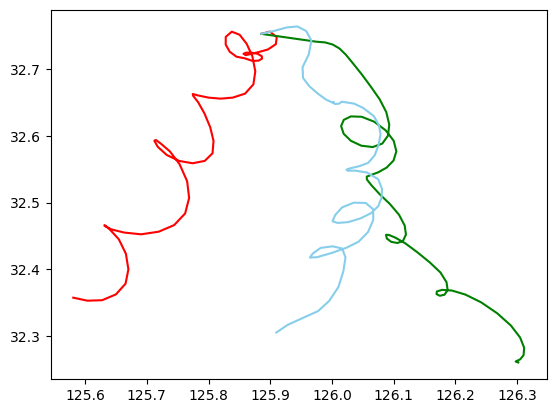

In [77]:
model_list[0].drift_trajection_show()

In [78]:
model_list[1].drift_trajection_show()

IndexError: list index out of range

In [79]:
model_list[2].drift_trajection_show()

IndexError: list index out of range

In [80]:
model_list[3].drift_trajection_show()

IndexError: list index out of range

BaseModel의 Mean_Absolute_Error :  0.01695970454545449
LSTM의 Mean_Absolute_Error :  0.010967266153782464
BaseModel의 NCLS :  0.6315569644462518
LSTM의 NCLS :  0.18166285133014037


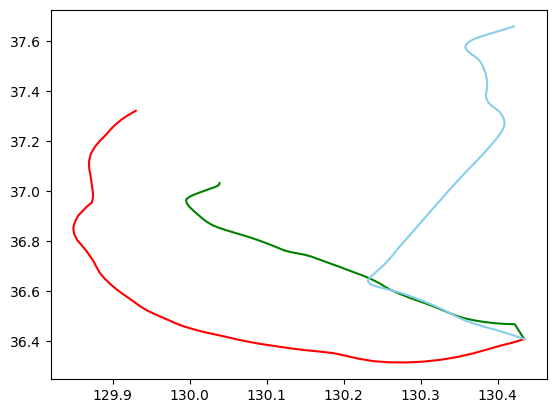

In [294]:
model_list[4].drift_trajection_show()

BaseModel의 Mean_Absolute_Error :  0.010500619402985342
LSTM의 Mean_Absolute_Error :  0.01209755627207867
BaseModel의 NCLS :  0.6031742951499692
LSTM의 NCLS :  0.37712053158729053


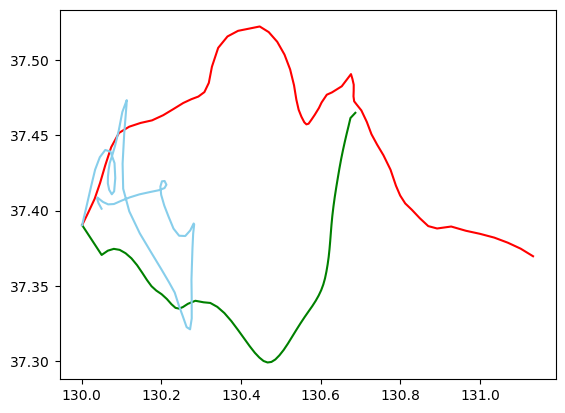

In [295]:
model_list[5].drift_trajection_show()

BaseModel의 Mean_Absolute_Error :  0.016787835820896307
LSTM의 Mean_Absolute_Error :  0.01575858832064248
BaseModel의 NCLS :  0.03934354968292231
LSTM의 NCLS :  0.04149980922072449


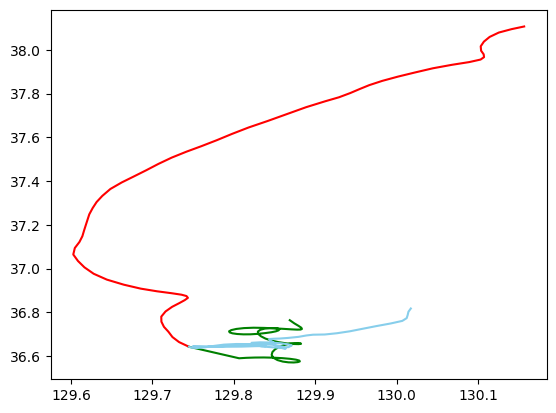

In [296]:
model_list[6].drift_trajection_show()

BaseModel의 Mean_Absolute_Error :  0.013070500000000415
LSTM의 Mean_Absolute_Error :  0.012049169920550227
BaseModel의 NCLS :  0.7389719103389834
LSTM의 NCLS :  0.7842378156230015


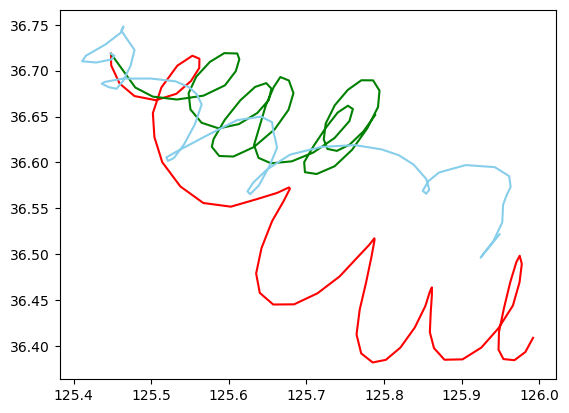

In [297]:
model_list[7].drift_trajection_show()

BaseModel의 Mean_Absolute_Error :  0.012179552238805937
LSTM의 Mean_Absolute_Error :  0.010555979812824745
BaseModel의 NCLS :  0.789323409239856
LSTM의 NCLS :  0.7784708808972203


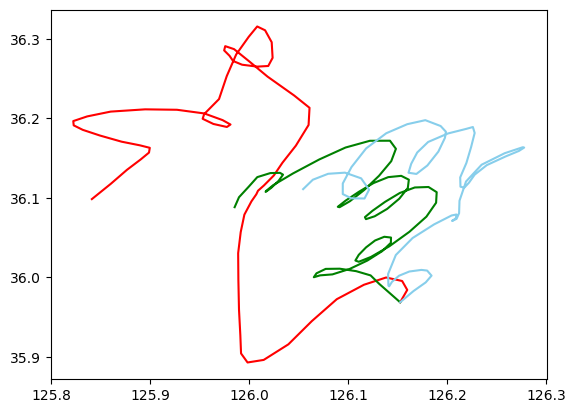

In [298]:
model_list[8].drift_trajection_show()

BaseModel의 Mean_Absolute_Error :  0.039584544117646975
LSTM의 Mean_Absolute_Error :  0.044699265154670584
BaseModel의 NCLS :  0.9030879538088521
LSTM의 NCLS :  0.8646508600832502


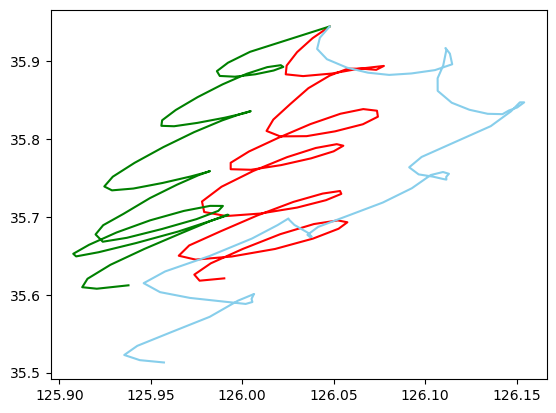

In [27]:
model_list[9].drift_trajection_show()

BaseModel의 Mean_Absolute_Error :  0.015513835820895626
LSTM의 Mean_Absolute_Error :  0.009352784156989681
BaseModel의 NCLS :  0.6856708512297864
LSTM의 NCLS :  0.8077803886492991


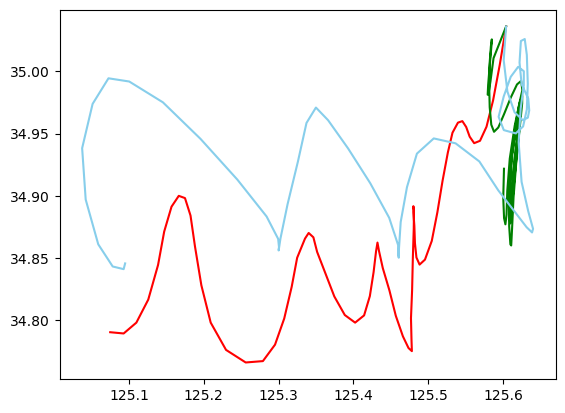

In [300]:
model_list[10].drift_trajection_show()

BaseModel의 Mean_Absolute_Error :  0.012884388059701405
LSTM의 Mean_Absolute_Error :  0.005870440446202448
BaseModel의 NCLS :  0.7396518146717175
LSTM의 NCLS :  0.654016497516007


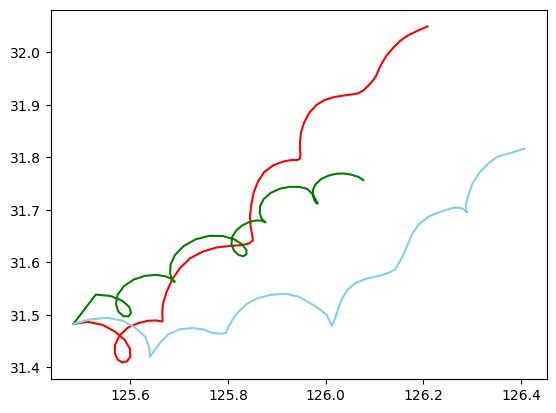

In [301]:
model_list[11].drift_trajection_show()

BaseModel의 Mean_Absolute_Error :  0.01277099999999973
LSTM의 Mean_Absolute_Error :  0.011527041597097576
BaseModel의 NCLS :  0.7283513249489495
LSTM의 NCLS :  0.3551736091508024


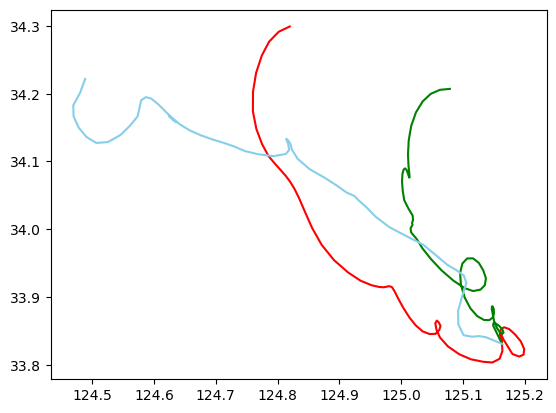

In [302]:
model_list[12].drift_trajection_show()

BaseModel의 Mean_Absolute_Error :  0.009599828358209075
LSTM의 Mean_Absolute_Error :  0.005783136990179414
BaseModel의 NCLS :  0.5663451420490453
LSTM의 NCLS :  0.6823725476659837


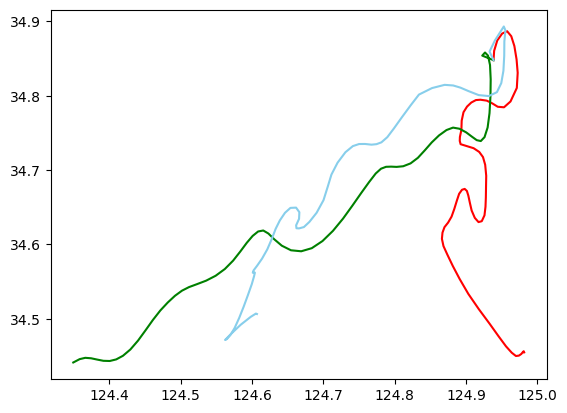

In [303]:
model_list[13].drift_trajection_show()

BaseModel의 Mean_Absolute_Error :  0.013702962686566941
LSTM의 Mean_Absolute_Error :  0.013536129507236035
BaseModel의 NCLS :  0.472525715514327
LSTM의 NCLS :  0.2809516267870643


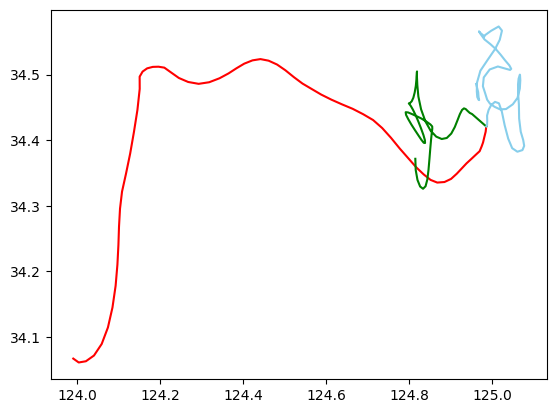

In [304]:
model_list[14].drift_trajection_show()

BaseModel의 Mean_Absolute_Error :  0.010044611940298365
LSTM의 Mean_Absolute_Error :  0.005636045829916778
BaseModel의 NCLS :  0.8631418386250488
LSTM의 NCLS :  0.510633135935881


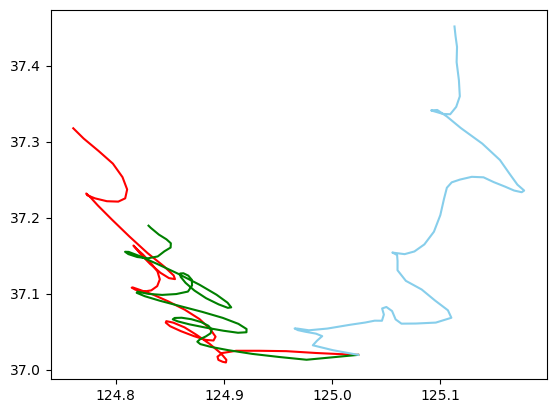

In [305]:
model_list[15].drift_trajection_show()

BaseModel의 Mean_Absolute_Error :  0.22028712499999972
LSTM의 Mean_Absolute_Error :  0.16403330026963167
BaseModel의 NCLS :  0.39533692110583707
LSTM의 NCLS :  0.5435588854029776


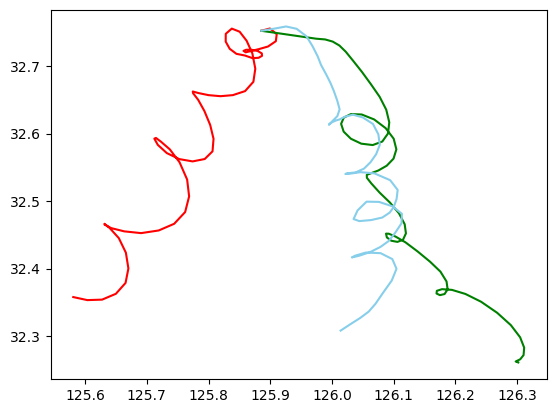

In [6]:
model_list[16].drift_trajection_show()

BaseModel의 Mean_Absolute_Error :  0.2604831691176478
LSTM의 Mean_Absolute_Error :  0.2041688238076606
BaseModel의 NCLS :  0.44709306844668817
LSTM의 NCLS :  0.650811719205295


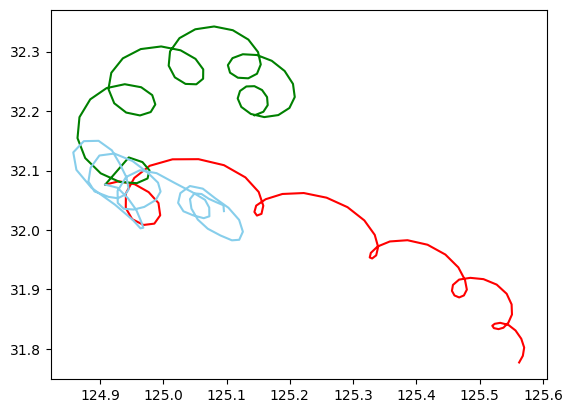

In [29]:
model_list[17].drift_trajection_show()

BaseModel의 Mean_Absolute_Error :  0.00892993283582082
LSTM의 Mean_Absolute_Error :  0.008848463126813862
BaseModel의 NCLS :  0.28323974204360025
LSTM의 NCLS :  0.4388908565322578


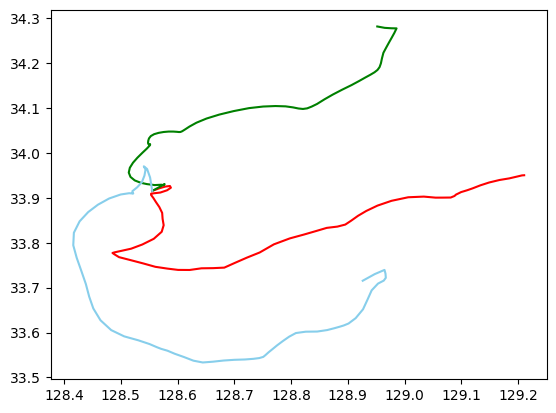

In [308]:
model_list[18].drift_trajection_show()

BaseModel의 Mean_Absolute_Error :  0.007600181818181841
LSTM의 Mean_Absolute_Error :  0.008474298822481397
BaseModel의 NCLS :  0.7190331553710132
LSTM의 NCLS :  0.7346414299932924


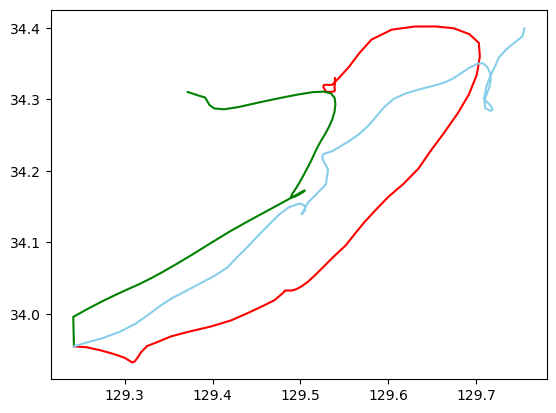

In [309]:
model_list[19].drift_trajection_show()

BaseModel의 Mean_Absolute_Error :  0.006906871212120887
LSTM의 Mean_Absolute_Error :  0.01207794174930781
BaseModel의 NCLS :  0.34404444336443907
LSTM의 NCLS :  0


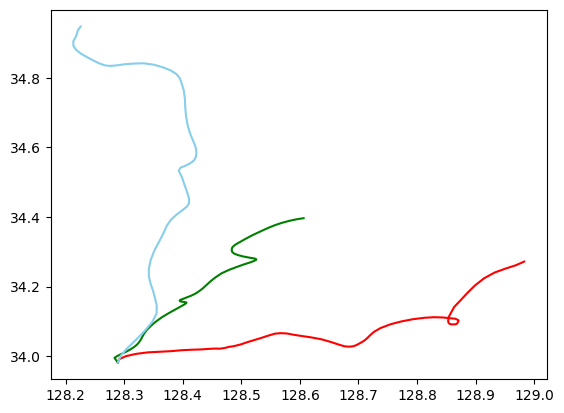

In [310]:
model_list[20].drift_trajection_show()

BaseModel의 Mean_Absolute_Error :  0.009581179104477729
LSTM의 Mean_Absolute_Error :  0.006939953656587134
BaseModel의 NCLS :  0.609002120812029
LSTM의 NCLS :  0.6753907055922245


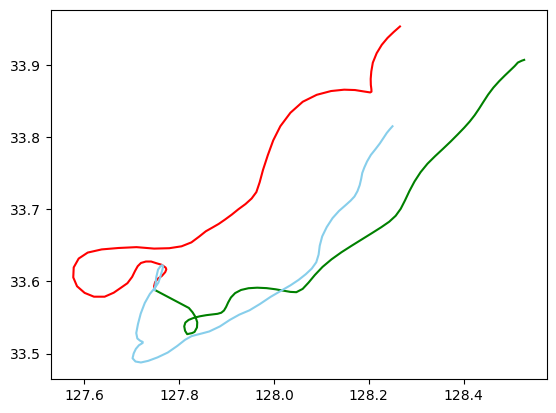

In [311]:
model_list[21].drift_trajection_show()

In [35]:
sum_LSTM_NCLS, sum_BaseModel_NCLS, sum_LSTM_lon_mae, sum_LSTM_lat_mae, sum_BaseModel_lon_mae, sum_BaseModel_lat_mae = 0, 0, 0, 0, 0, 0
# basemodel_lon_mae, basemodel_lat_mae, LSTM_lon_mae, LSTM_lat_mae, basemodel_NCLS, LSTM_NCLS
for i in range(22): 
    print('------------------Model',i+1,'-------------------')
    print('BaseModel의 lon_mae : ',evaluation_list[i][0])
    print('BaseModel의 lat_mae : ',evaluation_list[i][1])
    print('LSTM의 lon_mae :  : ',evaluation_list[i][2])
    print('LSTM의 lon_mae : ',evaluation_list[i][3])
    
    print('BaseModel의 NCLS : ',evaluation_list[i][4])
    print('LSTM의 NCLS : ',evaluation_list[i][5])
    
    # 평균 구하기
    sum_BaseModel_lon_mae += evaluation_list[i][0]
    sum_BaseModel_lat_mae += evaluation_list[i][1]
    sum_LSTM_lon_mae += evaluation_list[i][2]
    sum_LSTM_lat_mae += evaluation_list[i][3]
    sum_LSTM_NCLS += evaluation_list[i][4]
    sum_BaseModel_NCLS += evaluation_list[i][5]
    print('----------------------------------------')
    print('')

print('BaseModel의 lon_mae 평균 : ', sum_BaseModel_lon_mae/len(evaluation_list))
print('BaseModel의 lat_mae 평균 : ', sum_BaseModel_lat_mae/len(evaluation_list))
print('LSTM의 lon_mae 평균 : ', sum_LSTM_lon_mae/len(evaluation_list))
print('LSTM의 lat_mae 평균 : ', sum_LSTM_lat_mae/len(evaluation_list))
print('LSTM의 NCLS 평균 : ', sum_LSTM_NCLS/len(evaluation_list))
print('BaseModel의 NCLS 평균 : ', sum_BaseModel_NCLS/len(evaluation_list))


------------------Model 1 -------------------
BaseModel의 lon_mae :  0.014200104477611988
BaseModel의 lat_mae :  0.00978373134328347
LSTM의 lon_mae :  :  0.015931435900004922
LSTM의 lon_mae :  0.009483955456826381
BaseModel의 NCLS :  0
LSTM의 NCLS :  0
----------------------------------------

------------------Model 2 -------------------
BaseModel의 lon_mae :  0.011265014925372928
BaseModel의 lat_mae :  0.00703343283582092
LSTM의 lon_mae :  :  0.009935474902459109
LSTM의 lon_mae :  0.009438893365564796
BaseModel의 NCLS :  0
LSTM의 NCLS :  0.5329295580542384
----------------------------------------

------------------Model 3 -------------------
BaseModel의 lon_mae :  0.010255462686567211
BaseModel의 lat_mae :  0.015300746268656663
LSTM의 lon_mae :  :  0.00750501572202562
LSTM의 lon_mae :  0.014280954963035442
BaseModel의 NCLS :  0
LSTM의 NCLS :  0.32378939678606244
----------------------------------------

------------------Model 4 -------------------
BaseModel의 lon_mae :  0.01284892424242527
BaseModel의

3/3 [==============================] - 0s 3ms/step
Basemodel_lon_mae :  0.014200104477611988
Basemodel_lon_mae :  0.00978373134328347
LSTM_lon_mae :  0.020775756380393817
LSTM_lat_mae :  0.007731519034251733
baseline_NCLS :  0
LSTM_NCLS :  0
baseline_lon :  67
self.lon_pred.shape[0] :  67
0.020775756380393817
0.007731519034251733
0.014200104477611988
0.00978373134328347


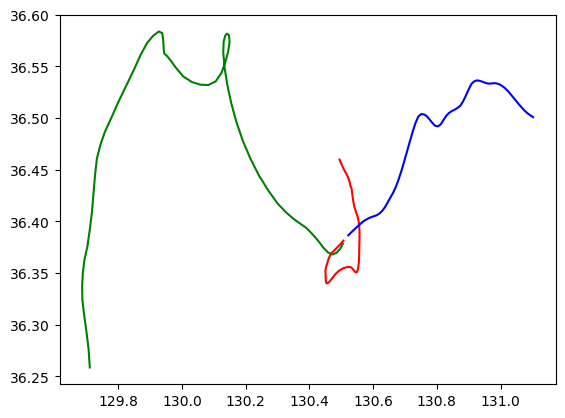

In [35]:
# 모델 2개와 1개 비교해보기.

mae_lon,mae_lat, base, lstm, Basemodel_lon_mae, Basemodel_lat_mae = model.model_evaluation()
model.drift_trajection_show()

print(mae_lon)
print(mae_lat)
print(Basemodel_lon_mae)
print(Basemodel_lat_mae)


In [46]:
lstm

0.8372560585379871

In [42]:
len(dataset_list)

24

In [51]:
model_list, evaluation_list  = list(), list()
# EPOCH == 5로 성능을 일단 도출하기 
# 성능셀을 만들어놓고 다음에 튜닝하기
# 한 것과 할 것 만들어놓기

for i in range(len(dataset_list)):
    print( '--------------------- Model_', i+1,' ----------------------')
    test = dataset_list[i]
    train_list = dataset_list[0:i] + dataset_list[i+1:]
    model = drift_LSTM(train_list, test, 5)
    model.make_dataset() # error
    # window_size, num_feature, num_LSTM_units_list, num_Dense_units_list, learning_rate 
    lon_model, lat_model = model.model_fit(5, 4, [500,250], [100], 0.001)
    model_list.append(model)
    basemodel_lon_mae, basemodel_lat_mae, LSTM_lon_mae, LSTM_lat_mae, basemodel_NCLS, LSTM_NCLS = model.model_evaluation()
    li = [basemodel_lon_mae, basemodel_lat_mae, LSTM_lon_mae, LSTM_lat_mae, basemodel_NCLS, LSTM_NCLS]
    evaluation_list.append(li)

--------------------- Model_ 1  ----------------------
Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_72 (LSTM)              (None, 5, 30)             4200      
                                                                 
 dropout_72 (Dropout)        (None, 5, 30)             0         
                                                                 
 lstm_73 (LSTM)              (None, 5, 10)             1640      
                                                                 
 dropout_73 (Dropout)        (None, 5, 10)             0         
                                                                 
 lstm_74 (LSTM)              (None, 10)                840       
                                                                 
 dense_48 (Dense)            (None, 8)                 88        
                                                                

14/14 [==============================] - 0s 5ms/step - loss: 6.1622e-05 - mae: 0.0066 - mse: 6.1622e-05
Epoch 6/60
14/14 [==============================] - 0s 5ms/step - loss: 6.4917e-05 - mae: 0.0071 - mse: 6.4917e-05
Epoch 7/60
14/14 [==============================] - 0s 5ms/step - loss: 5.7335e-05 - mae: 0.0060 - mse: 5.7335e-05
Epoch 8/60
14/14 [==============================] - 0s 5ms/step - loss: 5.1388e-05 - mae: 0.0060 - mse: 5.1388e-05
Epoch 9/60
14/14 [==============================] - 0s 5ms/step - loss: 7.8128e-05 - mae: 0.0072 - mse: 7.8128e-05
Epoch 10/60
14/14 [==============================] - 0s 5ms/step - loss: 7.5104e-05 - mae: 0.0072 - mse: 7.5104e-05
Epoch 11/60
14/14 [==============================] - 0s 5ms/step - loss: 6.7591e-05 - mae: 0.0069 - mse: 6.7591e-05
Epoch 12/60
14/14 [==============================] - 0s 5ms/step - loss: 8.7221e-05 - mae: 0.0074 - mse: 8.7221e-05
Epoch 13/60
14/14 [==============================] - 0s 5ms/step - loss: 4.6776e-05 - ma

14/14 [==============================] - 0s 5ms/step - loss: 7.9013e-05 - mae: 0.0076 - mse: 7.9013e-05
Epoch 24/60
14/14 [==============================] - 0s 5ms/step - loss: 6.8754e-05 - mae: 0.0068 - mse: 6.8754e-05
Epoch 25/60
14/14 [==============================] - 0s 5ms/step - loss: 5.7517e-05 - mae: 0.0059 - mse: 5.7517e-05
Epoch 26/60
14/14 [==============================] - 0s 5ms/step - loss: 5.4910e-05 - mae: 0.0060 - mse: 5.4910e-05
Epoch 27/60
14/14 [==============================] - 0s 5ms/step - loss: 5.7378e-05 - mae: 0.0062 - mse: 5.7378e-05
Epoch 28/60
14/14 [==============================] - 0s 5ms/step - loss: 6.4855e-05 - mae: 0.0063 - mse: 6.4855e-05
Epoch 29/60
14/14 [==============================] - 0s 5ms/step - loss: 6.4071e-05 - mae: 0.0063 - mse: 6.4071e-05
Epoch 30/60
14/14 [==============================] - 0s 5ms/step - loss: 6.8640e-05 - mae: 0.0066 - mse: 6.8640e-05
Epoch 31/60
14/14 [==============================] - 0s 5ms/step - loss: 6.3606e-05 

14/14 [==============================] - 0s 6ms/step - loss: 2.7058e-05 - mae: 0.0040 - mse: 2.7058e-05
Epoch 42/60
14/14 [==============================] - 0s 6ms/step - loss: 4.0054e-05 - mae: 0.0048 - mse: 4.0054e-05
Epoch 43/60
14/14 [==============================] - 0s 6ms/step - loss: 3.0543e-05 - mae: 0.0040 - mse: 3.0543e-05
Epoch 44/60
14/14 [==============================] - 0s 6ms/step - loss: 3.8000e-05 - mae: 0.0043 - mse: 3.8000e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8380e-05 - mae: 0.0052 - mse: 4.8380e-05
Epoch 46/60
14/14 [==============================] - 0s 6ms/step - loss: 4.5509e-05 - mae: 0.0052 - mse: 4.5509e-05
Epoch 47/60
14/14 [==============================] - 0s 7ms/step - loss: 4.0150e-05 - mae: 0.0047 - mse: 4.0150e-05
Epoch 48/60
14/14 [==============================] - 0s 6ms/step - loss: 3.3895e-05 - mae: 0.0045 - mse: 3.3895e-05
Epoch 49/60
14/14 [==============================] - 0s 6ms/step - loss: 4.3583e-05 

14/14 [==============================] - 0s 6ms/step - loss: 5.5172e-05 - mae: 0.0058 - mse: 5.5172e-05
Epoch 60/60
14/14 [==============================] - 0s 6ms/step - loss: 4.9767e-05 - mae: 0.0053 - mse: 4.9767e-05
---------------------------------- lat_model_train  4  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 1.3694e-04 - mae: 0.0100 - mse: 1.3694e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 5.9102e-05 - mae: 0.0065 - mse: 5.9102e-05
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6903e-05 - mae: 0.0051 - mse: 3.6903e-05
Epoch 4/60
14/14 [==============================] - 0s 6ms/step - loss: 3.7144e-05 - mae: 0.0052 - mse: 3.7144e-05
Epoch 5/60
14/14 [==============================] - 0s 6ms/step - loss: 3.3974e-05 - mae: 0.0050 - mse: 3.3974e-05
Epoch 6/60
14/14 [==============================] - 0s 6ms/step - loss: 3.3502e-05 - mae: 0

14/14 [==============================] - 0s 6ms/step - loss: 4.0125e-05 - mae: 0.0052 - mse: 4.0125e-05
Epoch 17/60
14/14 [==============================] - 0s 6ms/step - loss: 4.0890e-05 - mae: 0.0053 - mse: 4.0890e-05
Epoch 18/60
14/14 [==============================] - 0s 6ms/step - loss: 4.1323e-05 - mae: 0.0055 - mse: 4.1323e-05
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 4.1417e-05 - mae: 0.0054 - mse: 4.1417e-05
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 4.0805e-05 - mae: 0.0053 - mse: 4.0805e-05
Epoch 21/60
14/14 [==============================] - 0s 6ms/step - loss: 3.4721e-05 - mae: 0.0050 - mse: 3.4721e-05
Epoch 22/60
14/14 [==============================] - 0s 6ms/step - loss: 3.1064e-05 - mae: 0.0047 - mse: 3.1064e-05
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 3.5664e-05 - mae: 0.0048 - mse: 3.5664e-05
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 3.0694e-05 

14/14 [==============================] - 0s 7ms/step - loss: 1.2052e-04 - mae: 0.0088 - mse: 1.2052e-04
Epoch 35/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0463e-04 - mae: 0.0080 - mse: 1.0463e-04
Epoch 36/60
14/14 [==============================] - 0s 6ms/step - loss: 9.4673e-05 - mae: 0.0076 - mse: 9.4673e-05
Epoch 37/60
14/14 [==============================] - 0s 6ms/step - loss: 9.1825e-05 - mae: 0.0078 - mse: 9.1825e-05
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2179e-04 - mae: 0.0086 - mse: 1.2179e-04
Epoch 39/60
14/14 [==============================] - 0s 6ms/step - loss: 8.3981e-05 - mae: 0.0075 - mse: 8.3981e-05
Epoch 40/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2673e-04 - mae: 0.0088 - mse: 1.2673e-04
Epoch 41/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2880e-04 - mae: 0.0090 - mse: 1.2880e-04
Epoch 42/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0295e-04 

14/14 [==============================] - 0s 7ms/step - loss: 3.7619e-05 - mae: 0.0048 - mse: 3.7619e-05
Epoch 53/60
14/14 [==============================] - 0s 6ms/step - loss: 3.5345e-05 - mae: 0.0049 - mse: 3.5345e-05
Epoch 54/60
14/14 [==============================] - 0s 6ms/step - loss: 5.0007e-05 - mae: 0.0054 - mse: 5.0007e-05
Epoch 55/60
14/14 [==============================] - 0s 6ms/step - loss: 3.9023e-05 - mae: 0.0049 - mse: 3.9023e-05
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 4.9822e-05 - mae: 0.0059 - mse: 4.9822e-05
Epoch 57/60
14/14 [==============================] - 0s 6ms/step - loss: 5.7701e-05 - mae: 0.0059 - mse: 5.7701e-05
Epoch 58/60
14/14 [==============================] - 0s 6ms/step - loss: 3.7316e-05 - mae: 0.0048 - mse: 3.7316e-05
Epoch 59/60
14/14 [==============================] - 0s 6ms/step - loss: 4.3548e-05 - mae: 0.0050 - mse: 4.3548e-05
Epoch 60/60
14/14 [==============================] - 0s 6ms/step - loss: 5.2616e-05 

Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 1.7122e-04 - mae: 0.0102 - mse: 1.7122e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0480e-04 - mae: 0.0080 - mse: 1.0480e-04
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5839e-04 - mae: 0.0098 - mse: 1.5839e-04
Epoch 4/60
14/14 [==============================] - 0s 6ms/step - loss: 4.6674e-04 - mae: 0.0120 - mse: 4.6674e-04
Epoch 5/60
14/14 [==============================] - 0s 6ms/step - loss: 1.7652e-04 - mae: 0.0110 - mse: 1.7652e-04
Epoch 6/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4600e-04 - mae: 0.0100 - mse: 1.4600e-04
Epoch 7/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6922e-04 - mae: 0.0104 - mse: 1.6922e-04
Epoch 8/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2534e-04 - mae: 0.0084 - mse: 1.2534e-04
Epoch 9/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1507e-

14/14 [==============================] - 0s 6ms/step - loss: 3.9689e-05 - mae: 0.0051 - mse: 3.9689e-05
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 3.2360e-05 - mae: 0.0049 - mse: 3.2360e-05
Epoch 21/60
14/14 [==============================] - 0s 6ms/step - loss: 4.2043e-05 - mae: 0.0052 - mse: 4.2043e-05
Epoch 22/60
14/14 [==============================] - 0s 6ms/step - loss: 4.4511e-05 - mae: 0.0055 - mse: 4.4511e-05
Epoch 23/60
14/14 [==============================] - 0s 6ms/step - loss: 3.5629e-05 - mae: 0.0049 - mse: 3.5629e-05
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 3.5581e-05 - mae: 0.0048 - mse: 3.5581e-05
Epoch 25/60
14/14 [==============================] - 0s 6ms/step - loss: 4.4126e-05 - mae: 0.0054 - mse: 4.4126e-05
Epoch 26/60
14/14 [==============================] - 0s 6ms/step - loss: 3.7639e-05 - mae: 0.0051 - mse: 3.7639e-05
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 3.5788e-05 

14/14 [==============================] - 0s 7ms/step - loss: 1.0319e-04 - mae: 0.0078 - mse: 1.0319e-04
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 7.2129e-05 - mae: 0.0064 - mse: 7.2129e-05
Epoch 39/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1087e-04 - mae: 0.0080 - mse: 1.1087e-04
Epoch 40/60
14/14 [==============================] - 0s 6ms/step - loss: 9.3548e-05 - mae: 0.0078 - mse: 9.3548e-05
Epoch 41/60
14/14 [==============================] - 0s 6ms/step - loss: 9.3189e-05 - mae: 0.0072 - mse: 9.3189e-05
Epoch 42/60
14/14 [==============================] - 0s 6ms/step - loss: 9.9450e-05 - mae: 0.0073 - mse: 9.9450e-05
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 6.5161e-05 - mae: 0.0064 - mse: 6.5161e-05
Epoch 44/60
14/14 [==============================] - 0s 6ms/step - loss: 9.4657e-05 - mae: 0.0077 - mse: 9.4657e-05
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 7.9129e-05 

14/14 [==============================] - 0s 7ms/step - loss: 3.9243e-05 - mae: 0.0048 - mse: 3.9243e-05
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 4.6195e-05 - mae: 0.0052 - mse: 4.6195e-05
Epoch 57/60
14/14 [==============================] - 0s 6ms/step - loss: 3.9929e-05 - mae: 0.0049 - mse: 3.9929e-05
Epoch 58/60
14/14 [==============================] - 0s 6ms/step - loss: 4.7905e-05 - mae: 0.0055 - mse: 4.7905e-05
Epoch 59/60
14/14 [==============================] - 0s 6ms/step - loss: 5.5879e-05 - mae: 0.0056 - mse: 5.5879e-05
Epoch 60/60
14/14 [==============================] - 0s 6ms/step - loss: 5.2679e-05 - mae: 0.0052 - mse: 5.2679e-05
---------------------------------- lon_model_train  12  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 2.7055e-04 - mae: 0.0138 - mse: 2.7055e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 2.2035e-04 - m

14/14 [==============================] - 0s 7ms/step - loss: 6.1026e-05 - mae: 0.0062 - mse: 6.1026e-05
Epoch 13/60
14/14 [==============================] - 0s 6ms/step - loss: 6.2399e-05 - mae: 0.0061 - mse: 6.2399e-05
Epoch 14/60
14/14 [==============================] - 0s 6ms/step - loss: 5.5903e-05 - mae: 0.0059 - mse: 5.5903e-05
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 4.7259e-05 - mae: 0.0053 - mse: 4.7259e-05
Epoch 16/60
14/14 [==============================] - 0s 6ms/step - loss: 4.7754e-05 - mae: 0.0053 - mse: 4.7754e-05
Epoch 17/60
14/14 [==============================] - 0s 6ms/step - loss: 4.2379e-05 - mae: 0.0051 - mse: 4.2379e-05
Epoch 18/60
14/14 [==============================] - 0s 6ms/step - loss: 4.8852e-05 - mae: 0.0055 - mse: 4.8852e-05
Epoch 19/60
14/14 [==============================] - 0s 6ms/step - loss: 4.5662e-05 - mae: 0.0054 - mse: 4.5662e-05
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 4.2409e-05 

14/14 [==============================] - 0s 6ms/step - loss: 3.8792e-05 - mae: 0.0052 - mse: 3.8792e-05
Epoch 31/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6183e-05 - mae: 0.0048 - mse: 3.6183e-05
Epoch 32/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6181e-05 - mae: 0.0048 - mse: 3.6181e-05
Epoch 33/60
14/14 [==============================] - 0s 6ms/step - loss: 3.5683e-05 - mae: 0.0049 - mse: 3.5683e-05
Epoch 34/60
14/14 [==============================] - 0s 6ms/step - loss: 3.5564e-05 - mae: 0.0048 - mse: 3.5564e-05
Epoch 35/60
14/14 [==============================] - 0s 6ms/step - loss: 3.7015e-05 - mae: 0.0051 - mse: 3.7015e-05
Epoch 36/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6023e-05 - mae: 0.0049 - mse: 3.6023e-05
Epoch 37/60
14/14 [==============================] - 0s 6ms/step - loss: 3.5947e-05 - mae: 0.0049 - mse: 3.5947e-05
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6934e-05 

14/14 [==============================] - 0s 6ms/step - loss: 4.2790e-05 - mae: 0.0056 - mse: 4.2790e-05
Epoch 49/60
14/14 [==============================] - 0s 6ms/step - loss: 4.1218e-05 - mae: 0.0055 - mse: 4.1218e-05
Epoch 50/60
14/14 [==============================] - 0s 6ms/step - loss: 4.7698e-05 - mae: 0.0059 - mse: 4.7698e-05
Epoch 51/60
14/14 [==============================] - 0s 6ms/step - loss: 4.3700e-05 - mae: 0.0056 - mse: 4.3700e-05
Epoch 52/60
14/14 [==============================] - 0s 6ms/step - loss: 4.2866e-05 - mae: 0.0055 - mse: 4.2866e-05
Epoch 53/60
14/14 [==============================] - 0s 6ms/step - loss: 4.4412e-05 - mae: 0.0056 - mse: 4.4412e-05
Epoch 54/60
14/14 [==============================] - 0s 6ms/step - loss: 4.5797e-05 - mae: 0.0060 - mse: 4.5797e-05
Epoch 55/60
14/14 [==============================] - 0s 6ms/step - loss: 4.9074e-05 - mae: 0.0055 - mse: 4.9074e-05
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 5.4010e-05 

14/14 [==============================] - 0s 7ms/step - loss: 5.3902e-05 - mae: 0.0059 - mse: 5.3902e-05
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8238e-05 - mae: 0.0053 - mse: 4.8238e-05
Epoch 7/60
14/14 [==============================] - 0s 6ms/step - loss: 5.1859e-05 - mae: 0.0059 - mse: 5.1859e-05
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 4.2971e-05 - mae: 0.0052 - mse: 4.2971e-05
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 4.3236e-05 - mae: 0.0053 - mse: 4.3236e-05
Epoch 10/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6283e-05 - mae: 0.0053 - mse: 4.6283e-05
Epoch 11/60
14/14 [==============================] - 0s 7ms/step - loss: 3.3326e-05 - mae: 0.0047 - mse: 3.3326e-05
Epoch 12/60
14/14 [==============================] - 0s 6ms/step - loss: 5.0598e-05 - mae: 0.0055 - mse: 5.0598e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 4.2728e-05 - ma

14/14 [==============================] - 0s 6ms/step - loss: 4.5285e-05 - mae: 0.0052 - mse: 4.5285e-05
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 4.8851e-05 - mae: 0.0057 - mse: 4.8851e-05
Epoch 25/60
14/14 [==============================] - 0s 6ms/step - loss: 4.4689e-05 - mae: 0.0051 - mse: 4.4689e-05
Epoch 26/60
14/14 [==============================] - 0s 6ms/step - loss: 4.2218e-05 - mae: 0.0052 - mse: 4.2218e-05
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 4.6175e-05 - mae: 0.0053 - mse: 4.6175e-05
Epoch 28/60
14/14 [==============================] - 0s 7ms/step - loss: 4.4416e-05 - mae: 0.0052 - mse: 4.4416e-05
Epoch 29/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6841e-05 - mae: 0.0048 - mse: 3.6841e-05
Epoch 30/60
14/14 [==============================] - 0s 6ms/step - loss: 4.4593e-05 - mae: 0.0053 - mse: 4.4593e-05
Epoch 31/60
14/14 [==============================] - 0s 6ms/step - loss: 3.1935e-05 

14/14 [==============================] - 0s 6ms/step - loss: 4.7555e-05 - mae: 0.0051 - mse: 4.7555e-05
Epoch 42/60
14/14 [==============================] - 0s 6ms/step - loss: 5.5218e-05 - mae: 0.0055 - mse: 5.5218e-05
Epoch 43/60
14/14 [==============================] - 0s 6ms/step - loss: 5.4113e-05 - mae: 0.0053 - mse: 5.4113e-05
Epoch 44/60
14/14 [==============================] - 0s 6ms/step - loss: 3.8424e-05 - mae: 0.0046 - mse: 3.8424e-05
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 5.3294e-05 - mae: 0.0056 - mse: 5.3294e-05
Epoch 46/60
14/14 [==============================] - 0s 6ms/step - loss: 4.9487e-05 - mae: 0.0050 - mse: 4.9487e-05
Epoch 47/60
14/14 [==============================] - 0s 7ms/step - loss: 4.1659e-05 - mae: 0.0050 - mse: 4.1659e-05
Epoch 48/60
14/14 [==============================] - 0s 7ms/step - loss: 3.5699e-05 - mae: 0.0043 - mse: 3.5699e-05
Epoch 49/60
14/14 [==============================] - 0s 6ms/step - loss: 4.8409e-05 

14/14 [==============================] - 0s 8ms/step - loss: 2.2000e-05 - mae: 0.0035 - mse: 2.2000e-05
Epoch 60/60
14/14 [==============================] - 0s 6ms/step - loss: 2.7326e-05 - mae: 0.0039 - mse: 2.7326e-05
---------------------------------- lon_model_train  20  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1594e-04 - mae: 0.0078 - mse: 1.1594e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1000e-04 - mae: 0.0078 - mse: 1.1000e-04
Epoch 3/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0157e-04 - mae: 0.0076 - mse: 1.0157e-04
Epoch 4/60
14/14 [==============================] - 0s 6ms/step - loss: 9.4043e-05 - mae: 0.0074 - mse: 9.4043e-05
Epoch 5/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1029e-04 - mae: 0.0081 - mse: 1.1029e-04
Epoch 6/60
14/14 [==============================] - 0s 6ms/step - loss: 7.9630e-05 - mae: 

14/14 [==============================] - 0s 6ms/step - loss: 3.4243e-05 - mae: 0.0049 - mse: 3.4243e-05
Epoch 17/60
14/14 [==============================] - 0s 6ms/step - loss: 3.1815e-05 - mae: 0.0046 - mse: 3.1815e-05
Epoch 18/60
14/14 [==============================] - 0s 6ms/step - loss: 3.8116e-05 - mae: 0.0051 - mse: 3.8116e-05
Epoch 19/60
14/14 [==============================] - 0s 6ms/step - loss: 3.8932e-05 - mae: 0.0053 - mse: 3.8932e-05
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 3.9656e-05 - mae: 0.0052 - mse: 3.9656e-05
Epoch 21/60
14/14 [==============================] - 0s 6ms/step - loss: 3.7549e-05 - mae: 0.0052 - mse: 3.7549e-05
Epoch 22/60
14/14 [==============================] - 0s 6ms/step - loss: 3.4195e-05 - mae: 0.0049 - mse: 3.4195e-05
Epoch 23/60
14/14 [==============================] - 0s 6ms/step - loss: 3.1172e-05 - mae: 0.0047 - mse: 3.1172e-05
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 3.1463e-05 

14/14 [==============================] - 0s 6ms/step - loss: 8.5042e-05 - mae: 0.0079 - mse: 8.5042e-05
Epoch 35/60
14/14 [==============================] - 0s 6ms/step - loss: 9.6637e-05 - mae: 0.0081 - mse: 9.6637e-05
Epoch 36/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0133e-04 - mae: 0.0081 - mse: 1.0133e-04
Epoch 37/60
14/14 [==============================] - 0s 6ms/step - loss: 7.3808e-05 - mae: 0.0071 - mse: 7.3808e-05
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 9.1026e-05 - mae: 0.0081 - mse: 9.1026e-05
Epoch 39/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1393e-04 - mae: 0.0084 - mse: 1.1393e-04
Epoch 40/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0238e-04 - mae: 0.0081 - mse: 1.0238e-04
Epoch 41/60
14/14 [==============================] - 0s 6ms/step - loss: 7.9428e-05 - mae: 0.0072 - mse: 7.9428e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0603e-04 

14/14 [==============================] - 0s 5ms/step - loss: 7.5858e-05 - mae: 0.0068 - mse: 7.5858e-05
Epoch 38/60
14/14 [==============================] - 0s 5ms/step - loss: 7.1711e-05 - mae: 0.0065 - mse: 7.1711e-05
Epoch 39/60
14/14 [==============================] - 0s 5ms/step - loss: 6.9519e-05 - mae: 0.0066 - mse: 6.9519e-05
Epoch 40/60
14/14 [==============================] - 0s 5ms/step - loss: 6.3655e-05 - mae: 0.0063 - mse: 6.3655e-05
Epoch 41/60
14/14 [==============================] - 0s 5ms/step - loss: 6.6392e-05 - mae: 0.0066 - mse: 6.6392e-05
Epoch 42/60
14/14 [==============================] - 0s 5ms/step - loss: 7.7059e-05 - mae: 0.0072 - mse: 7.7059e-05
Epoch 43/60
14/14 [==============================] - 0s 5ms/step - loss: 6.4241e-05 - mae: 0.0063 - mse: 6.4241e-05
Epoch 44/60
14/14 [==============================] - 0s 5ms/step - loss: 7.2067e-05 - mae: 0.0067 - mse: 7.2067e-05
Epoch 45/60
14/14 [==============================] - 0s 5ms/step - loss: 6.4543e-05 

14/14 [==============================] - 0s 7ms/step - loss: 2.1929e-05 - mae: 0.0037 - mse: 2.1929e-05
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 3.4077e-05 - mae: 0.0041 - mse: 3.4077e-05
Epoch 57/60
14/14 [==============================] - 0s 6ms/step - loss: 4.2704e-05 - mae: 0.0048 - mse: 4.2704e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 2.5205e-05 - mae: 0.0037 - mse: 2.5205e-05
Epoch 59/60
14/14 [==============================] - 0s 6ms/step - loss: 2.5738e-05 - mae: 0.0039 - mse: 2.5738e-05
Epoch 60/60
14/14 [==============================] - 0s 6ms/step - loss: 2.7225e-05 - mae: 0.0039 - mse: 2.7225e-05
---------------------------------- lat_model_train  1  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 1.8250e-04 - mae: 0.0118 - mse: 1.8250e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6248e-04 - ma

14/14 [==============================] - 0s 7ms/step - loss: 5.9251e-05 - mae: 0.0053 - mse: 5.9251e-05
Epoch 13/60
14/14 [==============================] - 0s 6ms/step - loss: 4.6397e-05 - mae: 0.0047 - mse: 4.6397e-05
Epoch 14/60
14/14 [==============================] - 0s 6ms/step - loss: 5.7046e-05 - mae: 0.0052 - mse: 5.7046e-05
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 5.7528e-05 - mae: 0.0054 - mse: 5.7528e-05
Epoch 16/60
14/14 [==============================] - 0s 6ms/step - loss: 4.8805e-05 - mae: 0.0048 - mse: 4.8805e-05
Epoch 17/60
14/14 [==============================] - 0s 6ms/step - loss: 5.0577e-05 - mae: 0.0048 - mse: 5.0577e-05
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 5.2226e-05 - mae: 0.0050 - mse: 5.2226e-05
Epoch 19/60
14/14 [==============================] - 0s 6ms/step - loss: 5.1831e-05 - mae: 0.0049 - mse: 5.1831e-05
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 5.0115e-05 

14/14 [==============================] - 0s 7ms/step - loss: 1.6065e-04 - mae: 0.0099 - mse: 1.6065e-04
Epoch 31/60
14/14 [==============================] - 0s 6ms/step - loss: 1.7137e-04 - mae: 0.0099 - mse: 1.7137e-04
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6049e-04 - mae: 0.0098 - mse: 1.6049e-04
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5668e-04 - mae: 0.0097 - mse: 1.5668e-04
Epoch 34/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6005e-04 - mae: 0.0096 - mse: 1.6005e-04
Epoch 35/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5851e-04 - mae: 0.0097 - mse: 1.5851e-04
Epoch 36/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5756e-04 - mae: 0.0096 - mse: 1.5756e-04
Epoch 37/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5592e-04 - mae: 0.0097 - mse: 1.5592e-04
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5690e-04 

14/14 [==============================] - 0s 7ms/step - loss: 1.8673e-05 - mae: 0.0034 - mse: 1.8673e-05
Epoch 49/60
14/14 [==============================] - 0s 6ms/step - loss: 1.7759e-05 - mae: 0.0034 - mse: 1.7759e-05
Epoch 50/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1836e-05 - mae: 0.0038 - mse: 2.1836e-05
Epoch 51/60
14/14 [==============================] - 0s 6ms/step - loss: 1.8873e-05 - mae: 0.0034 - mse: 1.8873e-05
Epoch 52/60
14/14 [==============================] - 0s 6ms/step - loss: 2.2570e-05 - mae: 0.0038 - mse: 2.2570e-05
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 2.5010e-05 - mae: 0.0038 - mse: 2.5010e-05
Epoch 54/60
14/14 [==============================] - 0s 6ms/step - loss: 2.0421e-05 - mae: 0.0036 - mse: 2.0421e-05
Epoch 55/60
14/14 [==============================] - 0s 6ms/step - loss: 1.9032e-05 - mae: 0.0033 - mse: 1.9032e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 1.8609e-05 

14/14 [==============================] - 0s 7ms/step - loss: 1.8774e-04 - mae: 0.0117 - mse: 1.8774e-04
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 1.8740e-04 - mae: 0.0117 - mse: 1.8740e-04
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 1.8711e-04 - mae: 0.0117 - mse: 1.8711e-04
Epoch 8/60
14/14 [==============================] - 0s 6ms/step - loss: 1.8732e-04 - mae: 0.0117 - mse: 1.8732e-04
Epoch 9/60
14/14 [==============================] - 0s 6ms/step - loss: 1.8897e-04 - mae: 0.0117 - mse: 1.8897e-04
Epoch 10/60
14/14 [==============================] - 0s 6ms/step - loss: 1.8959e-04 - mae: 0.0117 - mse: 1.8959e-04
Epoch 11/60
14/14 [==============================] - 0s 6ms/step - loss: 1.8772e-04 - mae: 0.0117 - mse: 1.8772e-04
Epoch 12/60
14/14 [==============================] - 0s 7ms/step - loss: 1.9671e-04 - mae: 0.0120 - mse: 1.9671e-04
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 1.9410e-04 - ma

14/14 [==============================] - 0s 7ms/step - loss: 7.0290e-05 - mae: 0.0062 - mse: 7.0290e-05
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 7.3509e-05 - mae: 0.0063 - mse: 7.3509e-05
Epoch 25/60
14/14 [==============================] - 0s 6ms/step - loss: 7.0626e-05 - mae: 0.0062 - mse: 7.0626e-05
Epoch 26/60
14/14 [==============================] - 0s 6ms/step - loss: 7.0302e-05 - mae: 0.0063 - mse: 7.0302e-05
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 7.0793e-05 - mae: 0.0064 - mse: 7.0793e-05
Epoch 28/60
14/14 [==============================] - 0s 7ms/step - loss: 7.0883e-05 - mae: 0.0062 - mse: 7.0883e-05
Epoch 29/60
14/14 [==============================] - 0s 6ms/step - loss: 7.0575e-05 - mae: 0.0062 - mse: 7.0575e-05
Epoch 30/60
14/14 [==============================] - 0s 6ms/step - loss: 7.0247e-05 - mae: 0.0063 - mse: 7.0247e-05
Epoch 31/60
14/14 [==============================] - 0s 6ms/step - loss: 7.0082e-05 

14/14 [==============================] - 0s 6ms/step - loss: 1.8694e-04 - mae: 0.0117 - mse: 1.8694e-04
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 1.8799e-04 - mae: 0.0116 - mse: 1.8799e-04
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 1.8649e-04 - mae: 0.0117 - mse: 1.8649e-04
Epoch 44/60
14/14 [==============================] - 0s 6ms/step - loss: 1.8736e-04 - mae: 0.0117 - mse: 1.8736e-04
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 1.9017e-04 - mae: 0.0116 - mse: 1.9017e-04
Epoch 46/60
14/14 [==============================] - 0s 6ms/step - loss: 1.8648e-04 - mae: 0.0116 - mse: 1.8648e-04
Epoch 47/60
14/14 [==============================] - 0s 6ms/step - loss: 1.8662e-04 - mae: 0.0116 - mse: 1.8662e-04
Epoch 48/60
14/14 [==============================] - 0s 6ms/step - loss: 1.8907e-04 - mae: 0.0117 - mse: 1.8907e-04
Epoch 49/60
14/14 [==============================] - 0s 6ms/step - loss: 1.8741e-04 

14/14 [==============================] - 0s 7ms/step - loss: 1.6995e-04 - mae: 0.0116 - mse: 1.6995e-04
Epoch 60/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6968e-04 - mae: 0.0116 - mse: 1.6968e-04
---------------------------------- lat_model_train  9  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4801e-04 - mae: 0.0098 - mse: 1.4801e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 8.8021e-05 - mae: 0.0075 - mse: 8.8021e-05
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 4.8976e-05 - mae: 0.0058 - mse: 4.8976e-05
Epoch 4/60
14/14 [==============================] - 0s 6ms/step - loss: 4.9722e-05 - mae: 0.0058 - mse: 4.9722e-05
Epoch 5/60
14/14 [==============================] - 0s 6ms/step - loss: 4.0878e-05 - mae: 0.0054 - mse: 4.0878e-05
Epoch 6/60
14/14 [==============================] - 0s 6ms/step - loss: 3.7751e-05 - mae: 0

14/14 [==============================] - 0s 7ms/step - loss: 1.7092e-04 - mae: 0.0105 - mse: 1.7092e-04
Epoch 17/60
14/14 [==============================] - 0s 6ms/step - loss: 1.3455e-04 - mae: 0.0098 - mse: 1.3455e-04
Epoch 18/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2894e-04 - mae: 0.0090 - mse: 1.2894e-04
Epoch 19/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1555e-04 - mae: 0.0088 - mse: 1.1555e-04
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0342e-04 - mae: 0.0079 - mse: 1.0342e-04
Epoch 21/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4667e-04 - mae: 0.0095 - mse: 1.4667e-04
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 1.7209e-04 - mae: 0.0101 - mse: 1.7209e-04
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4745e-04 - mae: 0.0102 - mse: 1.4745e-04
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2545e-04 

14/14 [==============================] - 0s 6ms/step - loss: 9.0550e-05 - mae: 0.0075 - mse: 9.0550e-05
Epoch 35/60
14/14 [==============================] - 0s 6ms/step - loss: 9.0441e-05 - mae: 0.0074 - mse: 9.0441e-05
Epoch 36/60
14/14 [==============================] - 0s 6ms/step - loss: 8.9798e-05 - mae: 0.0074 - mse: 8.9798e-05
Epoch 37/60
14/14 [==============================] - 0s 6ms/step - loss: 9.0513e-05 - mae: 0.0074 - mse: 9.0513e-05
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 9.0676e-05 - mae: 0.0074 - mse: 9.0676e-05
Epoch 39/60
14/14 [==============================] - 0s 6ms/step - loss: 9.0678e-05 - mae: 0.0075 - mse: 9.0678e-05
Epoch 40/60
14/14 [==============================] - 0s 6ms/step - loss: 9.0815e-05 - mae: 0.0075 - mse: 9.0815e-05
Epoch 41/60
14/14 [==============================] - 0s 6ms/step - loss: 9.0364e-05 - mae: 0.0074 - mse: 9.0364e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 9.0278e-05 

14/14 [==============================] - 0s 6ms/step - loss: 3.7489e-04 - mae: 0.0157 - mse: 3.7489e-04
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7602e-04 - mae: 0.0158 - mse: 3.7602e-04
Epoch 54/60
14/14 [==============================] - 0s 6ms/step - loss: 3.9735e-04 - mae: 0.0162 - mse: 3.9735e-04
Epoch 55/60
14/14 [==============================] - 0s 6ms/step - loss: 3.8354e-04 - mae: 0.0159 - mse: 3.8354e-04
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 3.7485e-04 - mae: 0.0156 - mse: 3.7485e-04
Epoch 57/60
14/14 [==============================] - 0s 6ms/step - loss: 3.8741e-04 - mae: 0.0160 - mse: 3.8741e-04
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 3.8449e-04 - mae: 0.0159 - mse: 3.8449e-04
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7687e-04 - mae: 0.0155 - mse: 3.7687e-04
Epoch 60/60
14/14 [==============================] - 0s 6ms/step - loss: 3.7132e-04 

Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 2.4103e-04 - mae: 0.0125 - mse: 2.4103e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1733e-04 - mae: 0.0090 - mse: 1.1733e-04
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2320e-04 - mae: 0.0091 - mse: 1.2320e-04
Epoch 4/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1512e-04 - mae: 0.0089 - mse: 1.1512e-04
Epoch 5/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1544e-04 - mae: 0.0088 - mse: 1.1544e-04
Epoch 6/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1413e-04 - mae: 0.0088 - mse: 1.1413e-04
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1429e-04 - mae: 0.0088 - mse: 1.1429e-04
Epoch 8/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1417e-04 - mae: 0.0088 - mse: 1.1417e-04
Epoch 9/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1389e-

14/14 [==============================] - 0s 6ms/step - loss: 3.6056e-05 - mae: 0.0049 - mse: 3.6056e-05
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 5.3505e-05 - mae: 0.0059 - mse: 5.3505e-05
Epoch 21/60
14/14 [==============================] - 0s 5ms/step - loss: 4.8936e-05 - mae: 0.0057 - mse: 4.8936e-05
Epoch 22/60
14/14 [==============================] - 0s 6ms/step - loss: 4.9419e-05 - mae: 0.0057 - mse: 4.9419e-05
Epoch 23/60
14/14 [==============================] - 0s 6ms/step - loss: 4.0671e-05 - mae: 0.0052 - mse: 4.0671e-05
Epoch 24/60
14/14 [==============================] - 0s 5ms/step - loss: 3.8908e-05 - mae: 0.0051 - mse: 3.8908e-05
Epoch 25/60
14/14 [==============================] - 0s 5ms/step - loss: 3.4562e-05 - mae: 0.0048 - mse: 3.4562e-05
Epoch 26/60
14/14 [==============================] - 0s 6ms/step - loss: 4.0941e-05 - mae: 0.0052 - mse: 4.0941e-05
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 5.2988e-05 

14/14 [==============================] - 0s 5ms/step - loss: 7.5193e-05 - mae: 0.0066 - mse: 7.5193e-05
Epoch 38/60
14/14 [==============================] - 0s 5ms/step - loss: 7.0586e-05 - mae: 0.0067 - mse: 7.0586e-05
Epoch 39/60
14/14 [==============================] - 0s 5ms/step - loss: 6.4331e-05 - mae: 0.0061 - mse: 6.4331e-05
Epoch 40/60
14/14 [==============================] - 0s 5ms/step - loss: 7.7148e-05 - mae: 0.0065 - mse: 7.7148e-05
Epoch 41/60
14/14 [==============================] - 0s 5ms/step - loss: 6.0840e-05 - mae: 0.0060 - mse: 6.0840e-05
Epoch 42/60
14/14 [==============================] - 0s 5ms/step - loss: 4.7985e-05 - mae: 0.0052 - mse: 4.7985e-05
Epoch 43/60
14/14 [==============================] - 0s 5ms/step - loss: 5.5396e-05 - mae: 0.0058 - mse: 5.5396e-05
Epoch 44/60
14/14 [==============================] - 0s 5ms/step - loss: 4.9270e-05 - mae: 0.0055 - mse: 4.9270e-05
Epoch 45/60
14/14 [==============================] - 0s 5ms/step - loss: 7.3919e-05 

14/14 [==============================] - 0s 5ms/step - loss: 3.4809e-05 - mae: 0.0044 - mse: 3.4809e-05
Epoch 56/60
14/14 [==============================] - 0s 5ms/step - loss: 3.4758e-05 - mae: 0.0045 - mse: 3.4758e-05
Epoch 57/60
14/14 [==============================] - 0s 5ms/step - loss: 2.7963e-05 - mae: 0.0042 - mse: 2.7963e-05
Epoch 58/60
14/14 [==============================] - 0s 5ms/step - loss: 3.1486e-05 - mae: 0.0045 - mse: 3.1486e-05
Epoch 59/60
14/14 [==============================] - 0s 5ms/step - loss: 3.2527e-05 - mae: 0.0043 - mse: 3.2527e-05
Epoch 60/60
14/14 [==============================] - 0s 5ms/step - loss: 3.0421e-05 - mae: 0.0044 - mse: 3.0421e-05
---------------------------------- lon_model_train  17  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 5ms/step - loss: 1.6031e-04 - mae: 0.0111 - mse: 1.6031e-04
Epoch 2/60
14/14 [==============================] - 0s 5ms/step - loss: 1.6443e-04 - m

14/14 [==============================] - 0s 6ms/step - loss: 2.2563e-04 - mae: 0.0128 - mse: 2.2563e-04
Epoch 13/60
14/14 [==============================] - 0s 6ms/step - loss: 2.2701e-04 - mae: 0.0128 - mse: 2.2701e-04
Epoch 14/60
14/14 [==============================] - 0s 6ms/step - loss: 2.2726e-04 - mae: 0.0128 - mse: 2.2726e-04
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 2.2514e-04 - mae: 0.0128 - mse: 2.2514e-04
Epoch 16/60
14/14 [==============================] - 0s 6ms/step - loss: 2.2555e-04 - mae: 0.0127 - mse: 2.2555e-04
Epoch 17/60
14/14 [==============================] - 0s 6ms/step - loss: 2.2751e-04 - mae: 0.0129 - mse: 2.2751e-04
Epoch 18/60
14/14 [==============================] - 0s 6ms/step - loss: 2.2473e-04 - mae: 0.0128 - mse: 2.2473e-04
Epoch 19/60
14/14 [==============================] - 0s 6ms/step - loss: 2.2662e-04 - mae: 0.0130 - mse: 2.2662e-04
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 2.2786e-04 

14/14 [==============================] - 0s 6ms/step - loss: 1.4742e-04 - mae: 0.0100 - mse: 1.4742e-04
Epoch 31/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5491e-04 - mae: 0.0104 - mse: 1.5491e-04
Epoch 32/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5224e-04 - mae: 0.0101 - mse: 1.5224e-04
Epoch 33/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4864e-04 - mae: 0.0099 - mse: 1.4864e-04
Epoch 34/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5009e-04 - mae: 0.0101 - mse: 1.5009e-04
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4942e-04 - mae: 0.0101 - mse: 1.4942e-04
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5016e-04 - mae: 0.0100 - mse: 1.5016e-04
Epoch 37/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4950e-04 - mae: 0.0100 - mse: 1.4950e-04
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4756e-04 

14/14 [==============================] - 0s 6ms/step - loss: 1.2896e-04 - mae: 0.0088 - mse: 1.2896e-04
Epoch 49/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2943e-04 - mae: 0.0088 - mse: 1.2943e-04
Epoch 50/60
14/14 [==============================] - 0s 6ms/step - loss: 1.3402e-04 - mae: 0.0090 - mse: 1.3402e-04
Epoch 51/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2960e-04 - mae: 0.0087 - mse: 1.2960e-04
Epoch 52/60
14/14 [==============================] - 0s 6ms/step - loss: 1.3068e-04 - mae: 0.0088 - mse: 1.3068e-04
Epoch 53/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2941e-04 - mae: 0.0088 - mse: 1.2941e-04
Epoch 54/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2865e-04 - mae: 0.0087 - mse: 1.2865e-04
Epoch 55/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2919e-04 - mae: 0.0087 - mse: 1.2919e-04
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2885e-04 

14/14 [==============================] - 0s 6ms/step - loss: 4.1519e-05 - mae: 0.0052 - mse: 4.1519e-05
Epoch 6/60
14/14 [==============================] - 0s 6ms/step - loss: 3.7803e-05 - mae: 0.0048 - mse: 3.7803e-05
Epoch 7/60
14/14 [==============================] - 0s 6ms/step - loss: 3.5776e-05 - mae: 0.0048 - mse: 3.5776e-05
Epoch 8/60
14/14 [==============================] - 0s 6ms/step - loss: 3.4806e-05 - mae: 0.0046 - mse: 3.4806e-05
Epoch 9/60
14/14 [==============================] - 0s 6ms/step - loss: 3.4555e-05 - mae: 0.0047 - mse: 3.4555e-05
Epoch 10/60
14/14 [==============================] - 0s 6ms/step - loss: 3.4685e-05 - mae: 0.0048 - mse: 3.4685e-05
Epoch 11/60
14/14 [==============================] - 0s 6ms/step - loss: 3.0640e-05 - mae: 0.0043 - mse: 3.0640e-05
Epoch 12/60
14/14 [==============================] - 0s 6ms/step - loss: 3.0911e-05 - mae: 0.0045 - mse: 3.0911e-05
Epoch 13/60
14/14 [==============================] - 0s 6ms/step - loss: 3.1028e-05 - ma

14/14 [==============================] - 0s 7ms/step - loss: 3.4698e-05 - mae: 0.0045 - mse: 3.4698e-05
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 3.7289e-05 - mae: 0.0048 - mse: 3.7289e-05
Epoch 25/60
14/14 [==============================] - 0s 7ms/step - loss: 3.4064e-05 - mae: 0.0046 - mse: 3.4064e-05
Epoch 26/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6197e-05 - mae: 0.0048 - mse: 3.6197e-05
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 2.9292e-05 - mae: 0.0043 - mse: 2.9292e-05
Epoch 28/60
14/14 [==============================] - 0s 6ms/step - loss: 3.3697e-05 - mae: 0.0047 - mse: 3.3697e-05
Epoch 29/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6276e-05 - mae: 0.0047 - mse: 3.6276e-05
Epoch 30/60
14/14 [==============================] - 0s 6ms/step - loss: 3.7111e-05 - mae: 0.0048 - mse: 3.7111e-05
Epoch 31/60
14/14 [==============================] - 0s 6ms/step - loss: 3.4689e-05 

14/14 [==============================] - 0s 5ms/step - loss: 6.0052e-05 - mae: 0.0062 - mse: 6.0052e-05
Epoch 26/60
14/14 [==============================] - 0s 5ms/step - loss: 5.0762e-05 - mae: 0.0055 - mse: 5.0762e-05
Epoch 27/60
14/14 [==============================] - 0s 5ms/step - loss: 5.3096e-05 - mae: 0.0057 - mse: 5.3096e-05
Epoch 28/60
14/14 [==============================] - 0s 6ms/step - loss: 6.5881e-05 - mae: 0.0065 - mse: 6.5881e-05
Epoch 29/60
14/14 [==============================] - 0s 6ms/step - loss: 5.2634e-05 - mae: 0.0059 - mse: 5.2634e-05
Epoch 30/60
14/14 [==============================] - 0s 6ms/step - loss: 5.5997e-05 - mae: 0.0060 - mse: 5.5997e-05
Epoch 31/60
14/14 [==============================] - 0s 6ms/step - loss: 4.3831e-05 - mae: 0.0054 - mse: 4.3831e-05
Epoch 32/60
14/14 [==============================] - 0s 6ms/step - loss: 4.5756e-05 - mae: 0.0051 - mse: 4.5756e-05
Epoch 33/60
14/14 [==============================] - 0s 6ms/step - loss: 6.0143e-05 

14/14 [==============================] - 0s 7ms/step - loss: 4.9871e-05 - mae: 0.0061 - mse: 4.9871e-05
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 5.3714e-05 - mae: 0.0064 - mse: 5.3714e-05
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 4.2911e-05 - mae: 0.0054 - mse: 4.2911e-05
Epoch 46/60
14/14 [==============================] - 0s 6ms/step - loss: 4.9281e-05 - mae: 0.0058 - mse: 4.9281e-05
Epoch 47/60
14/14 [==============================] - 0s 7ms/step - loss: 5.1814e-05 - mae: 0.0062 - mse: 5.1814e-05
Epoch 48/60
14/14 [==============================] - 0s 6ms/step - loss: 5.5305e-05 - mae: 0.0064 - mse: 5.5305e-05
Epoch 49/60
14/14 [==============================] - 0s 6ms/step - loss: 5.4479e-05 - mae: 0.0065 - mse: 5.4479e-05
Epoch 50/60
14/14 [==============================] - 0s 6ms/step - loss: 4.9266e-05 - mae: 0.0061 - mse: 4.9266e-05
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 4.5419e-05 

Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 1.7128e-04 - mae: 0.0110 - mse: 1.7128e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0375e-04 - mae: 0.0083 - mse: 1.0375e-04
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 8.9824e-05 - mae: 0.0078 - mse: 8.9824e-05
Epoch 4/60
14/14 [==============================] - 0s 6ms/step - loss: 8.9091e-05 - mae: 0.0082 - mse: 8.9091e-05
Epoch 5/60
14/14 [==============================] - 0s 6ms/step - loss: 8.8349e-05 - mae: 0.0081 - mse: 8.8349e-05
Epoch 6/60
14/14 [==============================] - 0s 6ms/step - loss: 8.7916e-05 - mae: 0.0079 - mse: 8.7916e-05
Epoch 7/60
14/14 [==============================] - 0s 6ms/step - loss: 9.3894e-05 - mae: 0.0083 - mse: 9.3894e-05
Epoch 8/60
14/14 [==============================] - 0s 6ms/step - loss: 8.8131e-05 - mae: 0.0079 - mse: 8.8131e-05
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 8.8412e-

14/14 [==============================] - 0s 7ms/step - loss: 9.1616e-05 - mae: 0.0080 - mse: 9.1616e-05
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 9.1970e-05 - mae: 0.0079 - mse: 9.1970e-05
Epoch 21/60
14/14 [==============================] - 0s 6ms/step - loss: 9.1536e-05 - mae: 0.0080 - mse: 9.1536e-05
Epoch 22/60
14/14 [==============================] - 0s 6ms/step - loss: 9.2671e-05 - mae: 0.0081 - mse: 9.2671e-05
Epoch 23/60
14/14 [==============================] - 0s 6ms/step - loss: 9.2280e-05 - mae: 0.0079 - mse: 9.2280e-05
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 9.1584e-05 - mae: 0.0079 - mse: 9.1584e-05
Epoch 25/60
14/14 [==============================] - 0s 6ms/step - loss: 9.1383e-05 - mae: 0.0081 - mse: 9.1383e-05
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 9.1794e-05 - mae: 0.0079 - mse: 9.1794e-05
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 9.1222e-05 

14/14 [==============================] - 0s 7ms/step - loss: 1.4911e-04 - mae: 0.0101 - mse: 1.4911e-04
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5066e-04 - mae: 0.0102 - mse: 1.5066e-04
Epoch 39/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4795e-04 - mae: 0.0101 - mse: 1.4795e-04
Epoch 40/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4989e-04 - mae: 0.0101 - mse: 1.4989e-04
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4833e-04 - mae: 0.0101 - mse: 1.4833e-04
Epoch 42/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4794e-04 - mae: 0.0101 - mse: 1.4794e-04
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5057e-04 - mae: 0.0102 - mse: 1.5057e-04
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4964e-04 - mae: 0.0101 - mse: 1.4964e-04
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5135e-04 

14/14 [==============================] - 0s 7ms/step - loss: 1.8780e-04 - mae: 0.0117 - mse: 1.8780e-04
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 1.8772e-04 - mae: 0.0117 - mse: 1.8772e-04
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 1.8836e-04 - mae: 0.0117 - mse: 1.8836e-04
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 1.8818e-04 - mae: 0.0117 - mse: 1.8818e-04
Epoch 59/60
14/14 [==============================] - 0s 6ms/step - loss: 1.8703e-04 - mae: 0.0117 - mse: 1.8703e-04
Epoch 60/60
14/14 [==============================] - 0s 6ms/step - loss: 1.9208e-04 - mae: 0.0119 - mse: 1.9208e-04
---------------------------------- lat_model_train  6  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 5.4430e-04 - mae: 0.0188 - mse: 5.4430e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 2.8598e-04 - ma

14/14 [==============================] - 0s 7ms/step - loss: 6.2890e-05 - mae: 0.0066 - mse: 6.2890e-05
Epoch 13/60
14/14 [==============================] - 0s 6ms/step - loss: 7.3398e-05 - mae: 0.0067 - mse: 7.3398e-05
Epoch 14/60
14/14 [==============================] - 0s 7ms/step - loss: 8.0247e-05 - mae: 0.0073 - mse: 8.0247e-05
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 6.9416e-05 - mae: 0.0068 - mse: 6.9416e-05
Epoch 16/60
14/14 [==============================] - 0s 6ms/step - loss: 6.1900e-05 - mae: 0.0063 - mse: 6.1900e-05
Epoch 17/60
14/14 [==============================] - 0s 6ms/step - loss: 6.8315e-05 - mae: 0.0067 - mse: 6.8315e-05
Epoch 18/60
14/14 [==============================] - 0s 6ms/step - loss: 7.0019e-05 - mae: 0.0067 - mse: 7.0019e-05
Epoch 19/60
14/14 [==============================] - 0s 6ms/step - loss: 6.9109e-05 - mae: 0.0067 - mse: 6.9109e-05
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 7.2215e-05 

14/14 [==============================] - 0s 7ms/step - loss: 1.2289e-04 - mae: 0.0086 - mse: 1.2289e-04
Epoch 31/60
14/14 [==============================] - 0s 6ms/step - loss: 1.3809e-04 - mae: 0.0086 - mse: 1.3809e-04
Epoch 32/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1025e-04 - mae: 0.0084 - mse: 1.1025e-04
Epoch 33/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5041e-04 - mae: 0.0095 - mse: 1.5041e-04
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0904e-04 - mae: 0.0083 - mse: 1.0904e-04
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0745e-04 - mae: 0.0080 - mse: 1.0745e-04
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2657e-04 - mae: 0.0091 - mse: 1.2657e-04
Epoch 37/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1681e-04 - mae: 0.0083 - mse: 1.1681e-04
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1122e-04 

14/14 [==============================] - 0s 7ms/step - loss: 4.0683e-05 - mae: 0.0052 - mse: 4.0683e-05
Epoch 49/60
14/14 [==============================] - 0s 6ms/step - loss: 3.5596e-05 - mae: 0.0049 - mse: 3.5596e-05
Epoch 50/60
14/14 [==============================] - 0s 6ms/step - loss: 4.8162e-05 - mae: 0.0052 - mse: 4.8162e-05
Epoch 51/60
14/14 [==============================] - 0s 6ms/step - loss: 4.0903e-05 - mae: 0.0052 - mse: 4.0903e-05
Epoch 52/60
14/14 [==============================] - 0s 7ms/step - loss: 3.4786e-05 - mae: 0.0047 - mse: 3.4786e-05
Epoch 53/60
14/14 [==============================] - 0s 6ms/step - loss: 3.4724e-05 - mae: 0.0048 - mse: 3.4724e-05
Epoch 54/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6879e-05 - mae: 0.0047 - mse: 3.6879e-05
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 4.1907e-05 - mae: 0.0050 - mse: 4.1907e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 3.5197e-05 

14/14 [==============================] - 0s 7ms/step - loss: 9.4751e-05 - mae: 0.0080 - mse: 9.4751e-05
Epoch 6/60
14/14 [==============================] - 0s 6ms/step - loss: 9.7187e-05 - mae: 0.0081 - mse: 9.7187e-05
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 9.5597e-05 - mae: 0.0080 - mse: 9.5597e-05
Epoch 8/60
14/14 [==============================] - 0s 6ms/step - loss: 9.4910e-05 - mae: 0.0080 - mse: 9.4910e-05
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4302e-05 - mae: 0.0080 - mse: 9.4302e-05
Epoch 10/60
14/14 [==============================] - 0s 6ms/step - loss: 9.6378e-05 - mae: 0.0081 - mse: 9.6378e-05
Epoch 11/60
14/14 [==============================] - 0s 7ms/step - loss: 9.5588e-05 - mae: 0.0081 - mse: 9.5588e-05
Epoch 12/60
14/14 [==============================] - 0s 7ms/step - loss: 9.3955e-05 - mae: 0.0080 - mse: 9.3955e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4510e-05 - ma

14/14 [==============================] - 0s 7ms/step - loss: 2.0700e-04 - mae: 0.0118 - mse: 2.0700e-04
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 2.0907e-04 - mae: 0.0120 - mse: 2.0907e-04
Epoch 25/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0908e-04 - mae: 0.0119 - mse: 2.0908e-04
Epoch 26/60
14/14 [==============================] - 0s 6ms/step - loss: 2.0791e-04 - mae: 0.0118 - mse: 2.0791e-04
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0954e-04 - mae: 0.0117 - mse: 2.0954e-04
Epoch 28/60
14/14 [==============================] - 0s 6ms/step - loss: 2.0929e-04 - mae: 0.0118 - mse: 2.0929e-04
Epoch 29/60
14/14 [==============================] - 0s 6ms/step - loss: 2.0969e-04 - mae: 0.0119 - mse: 2.0969e-04
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0638e-04 - mae: 0.0118 - mse: 2.0638e-04
Epoch 31/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1045e-04 

14/14 [==============================] - 0s 6ms/step - loss: 8.0406e-05 - mae: 0.0072 - mse: 8.0406e-05
Epoch 42/60
14/14 [==============================] - 0s 6ms/step - loss: 7.9122e-05 - mae: 0.0070 - mse: 7.9122e-05
Epoch 43/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8772e-05 - mae: 0.0070 - mse: 7.8772e-05
Epoch 44/60
14/14 [==============================] - 0s 6ms/step - loss: 7.9416e-05 - mae: 0.0070 - mse: 7.9416e-05
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8718e-05 - mae: 0.0070 - mse: 7.8718e-05
Epoch 46/60
14/14 [==============================] - 0s 6ms/step - loss: 8.0063e-05 - mae: 0.0070 - mse: 8.0063e-05
Epoch 47/60
14/14 [==============================] - 0s 6ms/step - loss: 8.0080e-05 - mae: 0.0072 - mse: 8.0080e-05
Epoch 48/60
14/14 [==============================] - 0s 6ms/step - loss: 8.0455e-05 - mae: 0.0071 - mse: 8.0455e-05
Epoch 49/60
14/14 [==============================] - 0s 6ms/step - loss: 7.9212e-05 

14/14 [==============================] - 0s 6ms/step - loss: 3.6867e-05 - mae: 0.0050 - mse: 3.6867e-05
Epoch 60/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6670e-05 - mae: 0.0050 - mse: 3.6670e-05
---------------------------------- lat_model_train  14  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 1.9783e-04 - mae: 0.0112 - mse: 1.9783e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0583e-04 - mae: 0.0086 - mse: 1.0583e-04
Epoch 3/60
14/14 [==============================] - 0s 7ms/step - loss: 7.4526e-05 - mae: 0.0068 - mse: 7.4526e-05
Epoch 4/60
14/14 [==============================] - 0s 6ms/step - loss: 5.6493e-05 - mae: 0.0060 - mse: 5.6493e-05
Epoch 5/60
14/14 [==============================] - 0s 6ms/step - loss: 6.2705e-05 - mae: 0.0061 - mse: 6.2705e-05
Epoch 6/60
14/14 [==============================] - 0s 6ms/step - loss: 5.8957e-05 - mae: 

14/14 [==============================] - 0s 5ms/step - loss: 8.6073e-05 - mae: 0.0076 - mse: 8.6073e-05
Epoch 17/60
14/14 [==============================] - 0s 5ms/step - loss: 6.7988e-05 - mae: 0.0071 - mse: 6.7988e-05
Epoch 18/60
14/14 [==============================] - 0s 5ms/step - loss: 8.6630e-05 - mae: 0.0071 - mse: 8.6630e-05
Epoch 19/60
14/14 [==============================] - 0s 5ms/step - loss: 8.9816e-05 - mae: 0.0079 - mse: 8.9816e-05
Epoch 20/60
14/14 [==============================] - 0s 5ms/step - loss: 6.0686e-05 - mae: 0.0065 - mse: 6.0686e-05
Epoch 21/60
14/14 [==============================] - 0s 6ms/step - loss: 9.5401e-05 - mae: 0.0081 - mse: 9.5401e-05
Epoch 22/60
14/14 [==============================] - 0s 6ms/step - loss: 6.8036e-05 - mae: 0.0069 - mse: 6.8036e-05
Epoch 23/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0529e-04 - mae: 0.0081 - mse: 1.0529e-04
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 8.8116e-05 

14/14 [==============================] - 0s 6ms/step - loss: 2.9904e-05 - mae: 0.0044 - mse: 2.9904e-05
Epoch 35/60
14/14 [==============================] - 0s 6ms/step - loss: 4.0168e-05 - mae: 0.0050 - mse: 4.0168e-05
Epoch 36/60
14/14 [==============================] - 0s 6ms/step - loss: 3.3976e-05 - mae: 0.0046 - mse: 3.3976e-05
Epoch 37/60
14/14 [==============================] - 0s 5ms/step - loss: 3.3428e-05 - mae: 0.0046 - mse: 3.3428e-05
Epoch 38/60
14/14 [==============================] - 0s 5ms/step - loss: 3.5665e-05 - mae: 0.0043 - mse: 3.5665e-05
Epoch 39/60
14/14 [==============================] - 0s 6ms/step - loss: 2.6446e-05 - mae: 0.0042 - mse: 2.6446e-05
Epoch 40/60
14/14 [==============================] - 0s 6ms/step - loss: 3.2272e-05 - mae: 0.0046 - mse: 3.2272e-05
Epoch 41/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6659e-05 - mae: 0.0047 - mse: 3.6659e-05
Epoch 42/60
14/14 [==============================] - 0s 5ms/step - loss: 2.2112e-05 

14/14 [==============================] - 0s 5ms/step - loss: 4.0788e-05 - mae: 0.0051 - mse: 4.0788e-05
Epoch 53/60
14/14 [==============================] - 0s 5ms/step - loss: 3.5264e-05 - mae: 0.0047 - mse: 3.5264e-05
Epoch 54/60
14/14 [==============================] - 0s 5ms/step - loss: 4.3019e-05 - mae: 0.0052 - mse: 4.3019e-05
Epoch 55/60
14/14 [==============================] - 0s 5ms/step - loss: 4.1511e-05 - mae: 0.0050 - mse: 4.1511e-05
Epoch 56/60
14/14 [==============================] - 0s 5ms/step - loss: 3.8779e-05 - mae: 0.0049 - mse: 3.8779e-05
Epoch 57/60
14/14 [==============================] - 0s 5ms/step - loss: 4.2957e-05 - mae: 0.0054 - mse: 4.2957e-05
Epoch 58/60
14/14 [==============================] - 0s 5ms/step - loss: 3.2256e-05 - mae: 0.0044 - mse: 3.2256e-05
Epoch 59/60
14/14 [==============================] - 0s 5ms/step - loss: 4.1782e-05 - mae: 0.0048 - mse: 4.1782e-05
Epoch 60/60
14/14 [==============================] - 0s 5ms/step - loss: 5.3449e-05 

Epoch 1/60
14/14 [==============================] - 0s 5ms/step - loss: 1.3589e-04 - mae: 0.0097 - mse: 1.3589e-04
Epoch 2/60
14/14 [==============================] - 0s 5ms/step - loss: 8.6894e-05 - mae: 0.0070 - mse: 8.6894e-05
Epoch 3/60
14/14 [==============================] - 0s 5ms/step - loss: 8.0546e-05 - mae: 0.0066 - mse: 8.0546e-05
Epoch 4/60
14/14 [==============================] - 0s 5ms/step - loss: 7.9284e-05 - mae: 0.0069 - mse: 7.9284e-05
Epoch 5/60
14/14 [==============================] - 0s 5ms/step - loss: 6.3174e-05 - mae: 0.0060 - mse: 6.3174e-05
Epoch 6/60
14/14 [==============================] - 0s 5ms/step - loss: 7.8195e-05 - mae: 0.0066 - mse: 7.8195e-05
Epoch 7/60
14/14 [==============================] - 0s 6ms/step - loss: 6.9635e-05 - mae: 0.0066 - mse: 6.9635e-05
Epoch 8/60
14/14 [==============================] - 0s 6ms/step - loss: 8.1024e-05 - mae: 0.0068 - mse: 8.1024e-05
Epoch 9/60
14/14 [==============================] - 0s 6ms/step - loss: 6.0806e-

14/14 [==============================] - 0s 6ms/step - loss: 2.7410e-05 - mae: 0.0041 - mse: 2.7410e-05
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 2.6026e-05 - mae: 0.0041 - mse: 2.6026e-05
Epoch 21/60
14/14 [==============================] - 0s 6ms/step - loss: 2.6165e-05 - mae: 0.0040 - mse: 2.6165e-05
Epoch 22/60
14/14 [==============================] - 0s 6ms/step - loss: 3.2570e-05 - mae: 0.0044 - mse: 3.2570e-05
Epoch 23/60
14/14 [==============================] - 0s 6ms/step - loss: 2.9180e-05 - mae: 0.0041 - mse: 2.9180e-05
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1666e-05 - mae: 0.0037 - mse: 2.1666e-05
Epoch 25/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0951e-05 - mae: 0.0045 - mse: 3.0951e-05
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 2.7763e-05 - mae: 0.0042 - mse: 2.7763e-05
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 2.7159e-05 

14/14 [==============================] - 0s 8ms/step - loss: 6.3741e-05 - mae: 0.0060 - mse: 6.3741e-05
Epoch 38/60
14/14 [==============================] - 0s 8ms/step - loss: 7.3810e-05 - mae: 0.0068 - mse: 7.3810e-05
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 6.8949e-05 - mae: 0.0064 - mse: 6.8949e-05
Epoch 40/60
14/14 [==============================] - 0s 8ms/step - loss: 6.9041e-05 - mae: 0.0065 - mse: 6.9041e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 7.0322e-05 - mae: 0.0066 - mse: 7.0322e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 7.5526e-05 - mae: 0.0068 - mse: 7.5526e-05
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 7.6579e-05 - mae: 0.0067 - mse: 7.6579e-05
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 6.2756e-05 - mae: 0.0062 - mse: 6.2756e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 7.2881e-05 

14/14 [==============================] - 0s 7ms/step - loss: 2.2405e-05 - mae: 0.0037 - mse: 2.2405e-05
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 3.3108e-05 - mae: 0.0044 - mse: 3.3108e-05
Epoch 57/60
14/14 [==============================] - 0s 6ms/step - loss: 2.5450e-05 - mae: 0.0040 - mse: 2.5450e-05
Epoch 58/60
14/14 [==============================] - 0s 6ms/step - loss: 2.8801e-05 - mae: 0.0044 - mse: 2.8801e-05
Epoch 59/60
14/14 [==============================] - 0s 6ms/step - loss: 2.7017e-05 - mae: 0.0041 - mse: 2.7017e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0930e-05 - mae: 0.0044 - mse: 3.0930e-05
---------------------------------- lon_model_train  22  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1949e-04 - mae: 0.0119 - mse: 2.1949e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 2.2283e-04 - m

 dense_61 (Dense)            (None, 1)                 9         
                                                                 
Total params: 6,777
Trainable params: 6,777
Non-trainable params: 0
_________________________________________________________________
---------------------------------- lon_model_train  0  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 4s 5ms/step - loss: 1.2782e-04 - mae: 0.0088 - mse: 1.2782e-04
Epoch 2/60
14/14 [==============================] - 0s 5ms/step - loss: 1.1211e-04 - mae: 0.0088 - mse: 1.1211e-04
Epoch 3/60
14/14 [==============================] - 0s 5ms/step - loss: 9.4741e-05 - mae: 0.0081 - mse: 9.4741e-05
Epoch 4/60
14/14 [==============================] - 0s 5ms/step - loss: 9.6087e-05 - mae: 0.0080 - mse: 9.6087e-05
Epoch 5/60
14/14 [==============================] - 0s 5ms/step - loss: 9.0180e-05 - mae: 0.0079 - mse: 9.0180e-05
Epoch 6/60
14/14 [===========================

14/14 [==============================] - 0s 7ms/step - loss: 7.8326e-05 - mae: 0.0075 - mse: 7.8326e-05
Epoch 16/60
14/14 [==============================] - 0s 7ms/step - loss: 7.3960e-05 - mae: 0.0074 - mse: 7.3960e-05
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 8.1318e-05 - mae: 0.0078 - mse: 8.1318e-05
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 7.7933e-05 - mae: 0.0075 - mse: 7.7933e-05
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 8.5013e-05 - mae: 0.0080 - mse: 8.5013e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 8.0758e-05 - mae: 0.0076 - mse: 8.0758e-05
Epoch 21/60
14/14 [==============================] - 0s 7ms/step - loss: 7.9207e-05 - mae: 0.0076 - mse: 7.9207e-05
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 7.7817e-05 - mae: 0.0075 - mse: 7.7817e-05
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 7.8462e-05 

14/14 [==============================] - 0s 7ms/step - loss: 6.1031e-05 - mae: 0.0059 - mse: 6.1031e-05
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 6.5009e-05 - mae: 0.0063 - mse: 6.5009e-05
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 5.7978e-05 - mae: 0.0063 - mse: 5.7978e-05
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 6.7095e-05 - mae: 0.0064 - mse: 6.7095e-05
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 5.5103e-05 - mae: 0.0058 - mse: 5.5103e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 5.6809e-05 - mae: 0.0058 - mse: 5.6809e-05
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 6.9952e-05 - mae: 0.0068 - mse: 6.9952e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 6.4958e-05 - mae: 0.0062 - mse: 6.4958e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 6.2945e-05 

14/14 [==============================] - 0s 8ms/step - loss: 4.9864e-05 - mae: 0.0054 - mse: 4.9864e-05
Epoch 52/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7796e-05 - mae: 0.0050 - mse: 4.7796e-05
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 5.9770e-05 - mae: 0.0056 - mse: 5.9770e-05
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 4.5656e-05 - mae: 0.0053 - mse: 4.5656e-05
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 5.2789e-05 - mae: 0.0056 - mse: 5.2789e-05
Epoch 56/60
14/14 [==============================] - 0s 9ms/step - loss: 3.4645e-05 - mae: 0.0045 - mse: 3.4645e-05
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 3.4491e-05 - mae: 0.0044 - mse: 3.4491e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0391e-05 - mae: 0.0040 - mse: 3.0391e-05
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 4.4907e-05 

14/14 [==============================] - 0s 7ms/step - loss: 2.2981e-05 - mae: 0.0039 - mse: 2.2981e-05
Epoch 9/60
14/14 [==============================] - 0s 6ms/step - loss: 2.2207e-05 - mae: 0.0038 - mse: 2.2207e-05
Epoch 10/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6920e-05 - mae: 0.0032 - mse: 1.6920e-05
Epoch 11/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1455e-05 - mae: 0.0037 - mse: 2.1455e-05
Epoch 12/60
14/14 [==============================] - 0s 7ms/step - loss: 2.3196e-05 - mae: 0.0038 - mse: 2.3196e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1046e-05 - mae: 0.0035 - mse: 2.1046e-05
Epoch 14/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0058e-05 - mae: 0.0035 - mse: 2.0058e-05
Epoch 15/60
14/14 [==============================] - 0s 7ms/step - loss: 1.8559e-05 - mae: 0.0034 - mse: 1.8559e-05
Epoch 16/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5426e-05 -

14/14 [==============================] - 0s 7ms/step - loss: 4.9825e-05 - mae: 0.0059 - mse: 4.9825e-05
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7889e-05 - mae: 0.0059 - mse: 4.7889e-05
Epoch 28/60
14/14 [==============================] - 0s 6ms/step - loss: 4.8289e-05 - mae: 0.0058 - mse: 4.8289e-05
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 4.9317e-05 - mae: 0.0059 - mse: 4.9317e-05
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6589e-05 - mae: 0.0058 - mse: 4.6589e-05
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7242e-05 - mae: 0.0058 - mse: 4.7242e-05
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8827e-05 - mae: 0.0058 - mse: 4.8827e-05
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 5.1243e-05 - mae: 0.0060 - mse: 5.1243e-05
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6500e-05 

14/14 [==============================] - 0s 7ms/step - loss: 1.1720e-04 - mae: 0.0086 - mse: 1.1720e-04
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 7.5946e-05 - mae: 0.0070 - mse: 7.5946e-05
Epoch 46/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2087e-04 - mae: 0.0085 - mse: 1.2087e-04
Epoch 47/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3522e-04 - mae: 0.0090 - mse: 1.3522e-04
Epoch 48/60
14/14 [==============================] - 0s 7ms/step - loss: 7.1849e-05 - mae: 0.0068 - mse: 7.1849e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 8.7226e-05 - mae: 0.0075 - mse: 8.7226e-05
Epoch 50/60
14/14 [==============================] - 0s 8ms/step - loss: 1.0310e-04 - mae: 0.0084 - mse: 1.0310e-04
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 9.7705e-05 - mae: 0.0075 - mse: 9.7705e-05
Epoch 52/60
14/14 [==============================] - 0s 7ms/step - loss: 8.1160e-05 

14/14 [==============================] - 0s 7ms/step - loss: 1.3813e-04 - mae: 0.0092 - mse: 1.3813e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2195e-04 - mae: 0.0090 - mse: 1.2195e-04
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 1.3830e-04 - mae: 0.0091 - mse: 1.3830e-04
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2585e-04 - mae: 0.0089 - mse: 1.2585e-04
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0774e-04 - mae: 0.0081 - mse: 1.0774e-04
Epoch 6/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1972e-04 - mae: 0.0086 - mse: 1.1972e-04
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0662e-04 - mae: 0.0082 - mse: 1.0662e-04
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1314e-04 - mae: 0.0087 - mse: 1.1314e-04
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3572e-04 - mae: 0

14/14 [==============================] - 0s 8ms/step - loss: 7.0115e-05 - mae: 0.0066 - mse: 7.0115e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 5.9825e-05 - mae: 0.0059 - mse: 5.9825e-05
Epoch 21/60
14/14 [==============================] - 0s 7ms/step - loss: 5.1625e-05 - mae: 0.0057 - mse: 5.1625e-05
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 5.1945e-05 - mae: 0.0059 - mse: 5.1945e-05
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 6.0143e-05 - mae: 0.0062 - mse: 6.0143e-05
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 5.5907e-05 - mae: 0.0061 - mse: 5.5907e-05
Epoch 25/60
14/14 [==============================] - 0s 7ms/step - loss: 4.9354e-05 - mae: 0.0057 - mse: 4.9354e-05
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 5.4703e-05 - mae: 0.0055 - mse: 5.4703e-05
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8126e-05 

14/14 [==============================] - 0s 7ms/step - loss: 3.1249e-05 - mae: 0.0041 - mse: 3.1249e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1978e-05 - mae: 0.0042 - mse: 3.1978e-05
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1696e-05 - mae: 0.0043 - mse: 3.1696e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1142e-05 - mae: 0.0041 - mse: 3.1142e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0994e-05 - mae: 0.0041 - mse: 3.0994e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0751e-05 - mae: 0.0041 - mse: 3.0751e-05
Epoch 43/60
14/14 [==============================] - 0s 8ms/step - loss: 3.4603e-05 - mae: 0.0044 - mse: 3.4603e-05
Epoch 44/60
14/14 [==============================] - 0s 8ms/step - loss: 3.1855e-05 - mae: 0.0043 - mse: 3.1855e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 3.2596e-05 

14/14 [==============================] - 0s 7ms/step - loss: 9.4512e-05 - mae: 0.0080 - mse: 9.4512e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 9.5301e-05 - mae: 0.0080 - mse: 9.5301e-05
Epoch 57/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0025e-04 - mae: 0.0082 - mse: 1.0025e-04
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 9.5447e-05 - mae: 0.0081 - mse: 9.5447e-05
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4260e-05 - mae: 0.0080 - mse: 9.4260e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4816e-05 - mae: 0.0080 - mse: 9.4816e-05
---------------------------------- lat_model_train  11  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 2.7092e-04 - mae: 0.0132 - mse: 2.7092e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 9.9475e-05 - m

14/14 [==============================] - 0s 7ms/step - loss: 2.8040e-04 - mae: 0.0140 - mse: 2.8040e-04
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 2.6330e-04 - mae: 0.0131 - mse: 2.6330e-04
Epoch 14/60
14/14 [==============================] - 0s 7ms/step - loss: 2.8467e-04 - mae: 0.0133 - mse: 2.8467e-04
Epoch 15/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2429e-04 - mae: 0.0125 - mse: 2.2429e-04
Epoch 16/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0607e-04 - mae: 0.0143 - mse: 3.0607e-04
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 2.3252e-04 - mae: 0.0128 - mse: 2.3252e-04
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0350e-04 - mae: 0.0139 - mse: 3.0350e-04
Epoch 19/60
14/14 [==============================] - 0s 6ms/step - loss: 2.6278e-04 - mae: 0.0129 - mse: 2.6278e-04
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 2.6529e-04 

14/14 [==============================] - 0s 7ms/step - loss: 5.1874e-05 - mae: 0.0057 - mse: 5.1874e-05
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 4.3287e-05 - mae: 0.0054 - mse: 4.3287e-05
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 4.2998e-05 - mae: 0.0049 - mse: 4.2998e-05
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 4.3152e-05 - mae: 0.0052 - mse: 4.3152e-05
Epoch 34/60
14/14 [==============================] - 0s 6ms/step - loss: 5.1324e-05 - mae: 0.0055 - mse: 5.1324e-05
Epoch 35/60
14/14 [==============================] - 0s 6ms/step - loss: 4.6329e-05 - mae: 0.0053 - mse: 4.6329e-05
Epoch 36/60
14/14 [==============================] - 0s 6ms/step - loss: 4.0647e-05 - mae: 0.0050 - mse: 4.0647e-05
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 6.0803e-05 - mae: 0.0059 - mse: 6.0803e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 5.3947e-05 

14/14 [==============================] - 0s 7ms/step - loss: 3.2347e-05 - mae: 0.0044 - mse: 3.2347e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0774e-05 - mae: 0.0044 - mse: 3.0774e-05
Epoch 50/60
14/14 [==============================] - 0s 7ms/step - loss: 4.4038e-05 - mae: 0.0056 - mse: 4.4038e-05
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0867e-05 - mae: 0.0042 - mse: 3.0867e-05
Epoch 52/60
14/14 [==============================] - 0s 7ms/step - loss: 2.7950e-05 - mae: 0.0042 - mse: 2.7950e-05
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7739e-05 - mae: 0.0048 - mse: 3.7739e-05
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 4.0875e-05 - mae: 0.0050 - mse: 4.0875e-05
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 2.8652e-05 - mae: 0.0043 - mse: 2.8652e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 3.4457e-05 

14/14 [==============================] - 0s 7ms/step - loss: 5.8659e-05 - mae: 0.0061 - mse: 5.8659e-05
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 7.1094e-05 - mae: 0.0067 - mse: 7.1094e-05
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 5.9626e-05 - mae: 0.0060 - mse: 5.9626e-05
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 5.9067e-05 - mae: 0.0061 - mse: 5.9067e-05
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 4.5847e-05 - mae: 0.0050 - mse: 4.5847e-05
Epoch 10/60
14/14 [==============================] - 0s 7ms/step - loss: 6.5547e-05 - mae: 0.0064 - mse: 6.5547e-05
Epoch 11/60
14/14 [==============================] - 0s 7ms/step - loss: 5.7899e-05 - mae: 0.0060 - mse: 5.7899e-05
Epoch 12/60
14/14 [==============================] - 0s 7ms/step - loss: 5.2653e-05 - mae: 0.0057 - mse: 5.2653e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 5.1530e-05 - ma

14/14 [==============================] - 0s 7ms/step - loss: 9.2681e-05 - mae: 0.0076 - mse: 9.2681e-05
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 7.7175e-05 - mae: 0.0076 - mse: 7.7175e-05
Epoch 25/60
14/14 [==============================] - 0s 7ms/step - loss: 7.1824e-05 - mae: 0.0072 - mse: 7.1824e-05
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 6.9292e-05 - mae: 0.0067 - mse: 6.9292e-05
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 7.4946e-05 - mae: 0.0067 - mse: 7.4946e-05
Epoch 28/60
14/14 [==============================] - 0s 7ms/step - loss: 7.0356e-05 - mae: 0.0070 - mse: 7.0356e-05
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 8.2083e-05 - mae: 0.0073 - mse: 8.2083e-05
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 9.5229e-05 - mae: 0.0079 - mse: 9.5229e-05
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 7.1262e-05 

14/14 [==============================] - 0s 7ms/step - loss: 7.8549e-05 - mae: 0.0070 - mse: 7.8549e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 7.8328e-05 - mae: 0.0064 - mse: 7.8328e-05
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 6.8407e-05 - mae: 0.0059 - mse: 6.8407e-05
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 8.5004e-05 - mae: 0.0063 - mse: 8.5004e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 8.7441e-05 - mae: 0.0065 - mse: 8.7441e-05
Epoch 46/60
14/14 [==============================] - 0s 7ms/step - loss: 8.1483e-05 - mae: 0.0064 - mse: 8.1483e-05
Epoch 47/60
14/14 [==============================] - 0s 7ms/step - loss: 8.1426e-05 - mae: 0.0067 - mse: 8.1426e-05
Epoch 48/60
14/14 [==============================] - 0s 7ms/step - loss: 6.5083e-05 - mae: 0.0059 - mse: 6.5083e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 6.5604e-05 

14/14 [==============================] - 0s 7ms/step - loss: 6.0641e-05 - mae: 0.0058 - mse: 6.0641e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 5.7707e-05 - mae: 0.0061 - mse: 5.7707e-05
---------------------------------- lat_model_train  19  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2438e-04 - mae: 0.0089 - mse: 1.2438e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 5.0891e-05 - mae: 0.0058 - mse: 5.0891e-05
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 4.0098e-05 - mae: 0.0051 - mse: 4.0098e-05
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 2.6214e-05 - mae: 0.0041 - mse: 2.6214e-05
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0014e-05 - mae: 0.0044 - mse: 3.0014e-05
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 2.6284e-05 - mae: 

14/14 [==============================] - 0s 7ms/step - loss: 5.6389e-05 - mae: 0.0059 - mse: 5.6389e-05
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6566e-05 - mae: 0.0052 - mse: 4.6566e-05
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 6.1574e-05 - mae: 0.0061 - mse: 6.1574e-05
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 5.1089e-05 - mae: 0.0056 - mse: 5.1089e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 6.4919e-05 - mae: 0.0059 - mse: 6.4919e-05
Epoch 21/60
14/14 [==============================] - 0s 6ms/step - loss: 5.0886e-05 - mae: 0.0055 - mse: 5.0886e-05
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7324e-05 - mae: 0.0055 - mse: 4.7324e-05
Epoch 23/60
14/14 [==============================] - 0s 6ms/step - loss: 4.8038e-05 - mae: 0.0056 - mse: 4.8038e-05
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 6.4893e-05 

14/14 [==============================] - 0s 7ms/step - loss: 2.0831e-05 - mae: 0.0037 - mse: 2.0831e-05
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 2.6007e-05 - mae: 0.0041 - mse: 2.6007e-05
Epoch 36/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1151e-05 - mae: 0.0035 - mse: 2.1151e-05
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 1.9895e-05 - mae: 0.0035 - mse: 1.9895e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 1.9854e-05 - mae: 0.0034 - mse: 1.9854e-05
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0133e-05 - mae: 0.0032 - mse: 2.0133e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1060e-05 - mae: 0.0036 - mse: 2.1060e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 2.4288e-05 - mae: 0.0037 - mse: 2.4288e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 1.7603e-05 

14/14 [==============================] - 0s 7ms/step - loss: 1.5773e-05 - mae: 0.0032 - mse: 1.5773e-05
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2647e-05 - mae: 0.0037 - mse: 2.2647e-05
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2525e-05 - mae: 0.0037 - mse: 2.2525e-05
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 1.7410e-05 - mae: 0.0032 - mse: 1.7410e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0854e-05 - mae: 0.0033 - mse: 2.0854e-05
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4846e-05 - mae: 0.0029 - mse: 1.4846e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 2.3778e-05 - mae: 0.0039 - mse: 2.3778e-05
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 2.4414e-05 - mae: 0.0038 - mse: 2.4414e-05
Epoch 60/60
3/3 [==============================] - 1s 3ms/step
Basemodel_lon_mae :  

14/14 [==============================] - 0s 7ms/step - loss: 5.8026e-05 - mae: 0.0063 - mse: 5.8026e-05
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6504e-05 - mae: 0.0057 - mse: 4.6504e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 5.3408e-05 - mae: 0.0057 - mse: 5.3408e-05
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 5.6280e-05 - mae: 0.0061 - mse: 5.6280e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 6.7366e-05 - mae: 0.0067 - mse: 6.7366e-05
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 5.0107e-05 - mae: 0.0055 - mse: 5.0107e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7224e-05 - mae: 0.0053 - mse: 4.7224e-05
---------------------------------- lon_model_train  1  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0796e-04 - m

14/14 [==============================] - 0s 7ms/step - loss: 5.1834e-05 - mae: 0.0059 - mse: 5.1834e-05
Epoch 12/60
14/14 [==============================] - 0s 7ms/step - loss: 4.9527e-05 - mae: 0.0058 - mse: 4.9527e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 5.6987e-05 - mae: 0.0063 - mse: 5.6987e-05
Epoch 14/60
14/14 [==============================] - 0s 7ms/step - loss: 4.5090e-05 - mae: 0.0056 - mse: 4.5090e-05
Epoch 15/60
14/14 [==============================] - 0s 7ms/step - loss: 5.2327e-05 - mae: 0.0061 - mse: 5.2327e-05
Epoch 16/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7940e-05 - mae: 0.0058 - mse: 4.7940e-05
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 5.5247e-05 - mae: 0.0060 - mse: 5.5247e-05
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 5.1462e-05 - mae: 0.0062 - mse: 5.1462e-05
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 4.1203e-05 

14/14 [==============================] - 0s 7ms/step - loss: 3.9729e-05 - mae: 0.0049 - mse: 3.9729e-05
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 3.5990e-05 - mae: 0.0048 - mse: 3.5990e-05
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 4.2380e-05 - mae: 0.0051 - mse: 4.2380e-05
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 2.8693e-05 - mae: 0.0042 - mse: 2.8693e-05
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 3.3167e-05 - mae: 0.0044 - mse: 3.3167e-05
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 2.5689e-05 - mae: 0.0040 - mse: 2.5689e-05
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 5.0205e-05 - mae: 0.0055 - mse: 5.0205e-05
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 3.6995e-05 - mae: 0.0050 - mse: 3.6995e-05
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 3.5865e-05 

14/14 [==============================] - 0s 7ms/step - loss: 4.0768e-05 - mae: 0.0052 - mse: 4.0768e-05
Epoch 48/60
14/14 [==============================] - 0s 7ms/step - loss: 4.3691e-05 - mae: 0.0051 - mse: 4.3691e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 5.2055e-05 - mae: 0.0057 - mse: 5.2055e-05
Epoch 50/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7789e-05 - mae: 0.0049 - mse: 3.7789e-05
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8732e-05 - mae: 0.0056 - mse: 4.8732e-05
Epoch 52/60
14/14 [==============================] - 0s 7ms/step - loss: 4.4446e-05 - mae: 0.0055 - mse: 4.4446e-05
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 4.2549e-05 - mae: 0.0053 - mse: 4.2549e-05
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 4.0104e-05 - mae: 0.0048 - mse: 4.0104e-05
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 3.4439e-05 

14/14 [==============================] - 0s 7ms/step - loss: 4.7855e-05 - mae: 0.0058 - mse: 4.7855e-05
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6940e-05 - mae: 0.0058 - mse: 4.6940e-05
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6850e-05 - mae: 0.0057 - mse: 4.6850e-05
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6659e-05 - mae: 0.0057 - mse: 4.6659e-05
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6954e-05 - mae: 0.0058 - mse: 4.6954e-05
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6823e-05 - mae: 0.0058 - mse: 4.6823e-05
Epoch 10/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6822e-05 - mae: 0.0057 - mse: 4.6822e-05
Epoch 11/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7087e-05 - mae: 0.0058 - mse: 4.7087e-05
Epoch 12/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6807e-05 - mae

14/14 [==============================] - 0s 7ms/step - loss: 8.7372e-05 - mae: 0.0069 - mse: 8.7372e-05
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0856e-04 - mae: 0.0077 - mse: 1.0856e-04
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 7.6797e-05 - mae: 0.0069 - mse: 7.6797e-05
Epoch 25/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0127e-04 - mae: 0.0079 - mse: 1.0127e-04
Epoch 26/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1676e-04 - mae: 0.0088 - mse: 1.1676e-04
Epoch 27/60
14/14 [==============================] - 0s 8ms/step - loss: 7.1741e-05 - mae: 0.0063 - mse: 7.1741e-05
Epoch 28/60
14/14 [==============================] - 0s 9ms/step - loss: 8.0173e-05 - mae: 0.0071 - mse: 8.0173e-05
Epoch 29/60
14/14 [==============================] - 0s 11ms/step - loss: 8.5074e-05 - mae: 0.0072 - mse: 8.5074e-05
Epoch 30/60
14/14 [==============================] - 0s 9ms/step - loss: 8.9558e-05

14/14 [==============================] - 0s 6ms/step - loss: 5.6613e-05 - mae: 0.0058 - mse: 5.6613e-05
Epoch 41/60
14/14 [==============================] - 0s 6ms/step - loss: 5.7161e-05 - mae: 0.0060 - mse: 5.7161e-05
Epoch 42/60
14/14 [==============================] - 0s 6ms/step - loss: 5.8419e-05 - mae: 0.0063 - mse: 5.8419e-05
Epoch 43/60
14/14 [==============================] - 0s 6ms/step - loss: 5.0976e-05 - mae: 0.0053 - mse: 5.0976e-05
Epoch 44/60
14/14 [==============================] - 0s 6ms/step - loss: 5.7338e-05 - mae: 0.0061 - mse: 5.7338e-05
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 5.4906e-05 - mae: 0.0060 - mse: 5.4906e-05
Epoch 46/60
14/14 [==============================] - 0s 6ms/step - loss: 5.5544e-05 - mae: 0.0061 - mse: 5.5544e-05
Epoch 47/60
14/14 [==============================] - 0s 6ms/step - loss: 5.5825e-05 - mae: 0.0062 - mse: 5.5825e-05
Epoch 48/60
14/14 [==============================] - 0s 6ms/step - loss: 6.3763e-05 

14/14 [==============================] - 0s 6ms/step - loss: 8.0151e-05 - mae: 0.0068 - mse: 8.0151e-05
Epoch 59/60
14/14 [==============================] - 0s 6ms/step - loss: 8.7944e-05 - mae: 0.0074 - mse: 8.7944e-05
Epoch 60/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0222e-04 - mae: 0.0075 - mse: 1.0222e-04
---------------------------------- lon_model_train  9  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1502e-04 - mae: 0.0086 - mse: 1.1502e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2316e-04 - mae: 0.0093 - mse: 1.2316e-04
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 9.0830e-05 - mae: 0.0078 - mse: 9.0830e-05
Epoch 4/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0652e-04 - mae: 0.0085 - mse: 1.0652e-04
Epoch 5/60
14/14 [==============================] - 0s 6ms/step - loss: 9.9869e-05 - mae: 

14/14 [==============================] - 0s 6ms/step - loss: 3.1466e-05 - mae: 0.0043 - mse: 3.1466e-05
Epoch 16/60
14/14 [==============================] - 0s 6ms/step - loss: 3.0760e-05 - mae: 0.0041 - mse: 3.0760e-05
Epoch 17/60
14/14 [==============================] - 0s 5ms/step - loss: 3.1829e-05 - mae: 0.0042 - mse: 3.1829e-05
Epoch 18/60
14/14 [==============================] - 0s 5ms/step - loss: 3.0599e-05 - mae: 0.0041 - mse: 3.0599e-05
Epoch 19/60
14/14 [==============================] - 0s 5ms/step - loss: 3.1499e-05 - mae: 0.0042 - mse: 3.1499e-05
Epoch 20/60
14/14 [==============================] - 0s 5ms/step - loss: 3.3587e-05 - mae: 0.0043 - mse: 3.3587e-05
Epoch 21/60
14/14 [==============================] - 0s 5ms/step - loss: 3.2288e-05 - mae: 0.0043 - mse: 3.2288e-05
Epoch 22/60
14/14 [==============================] - 0s 5ms/step - loss: 3.2595e-05 - mae: 0.0043 - mse: 3.2595e-05
Epoch 23/60
14/14 [==============================] - 0s 5ms/step - loss: 3.1017e-05 

14/14 [==============================] - 0s 8ms/step - loss: 9.7868e-05 - mae: 0.0080 - mse: 9.7868e-05
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4136e-05 - mae: 0.0080 - mse: 9.4136e-05
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 9.6361e-05 - mae: 0.0081 - mse: 9.6361e-05
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 9.8417e-05 - mae: 0.0082 - mse: 9.8417e-05
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 9.6636e-05 - mae: 0.0081 - mse: 9.6636e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 9.5685e-05 - mae: 0.0081 - mse: 9.5685e-05
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 9.3078e-05 - mae: 0.0079 - mse: 9.3078e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 9.5603e-05 - mae: 0.0081 - mse: 9.5603e-05
Epoch 41/60
14/14 [==============================] - 0s 6ms/step - loss: 9.5398e-05 

14/14 [==============================] - 0s 7ms/step - loss: 2.1338e-04 - mae: 0.0119 - mse: 2.1338e-04
Epoch 52/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0860e-04 - mae: 0.0119 - mse: 2.0860e-04
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1098e-04 - mae: 0.0121 - mse: 2.1098e-04
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0866e-04 - mae: 0.0118 - mse: 2.0866e-04
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0989e-04 - mae: 0.0118 - mse: 2.0989e-04
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1008e-04 - mae: 0.0119 - mse: 2.1008e-04
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0721e-04 - mae: 0.0118 - mse: 2.0721e-04
Epoch 58/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1117e-04 - mae: 0.0119 - mse: 2.1117e-04
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0797e-04 

14/14 [==============================] - 0s 7ms/step - loss: 6.3042e-05 - mae: 0.0065 - mse: 6.3042e-05
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 6.7639e-05 - mae: 0.0065 - mse: 6.7639e-05
Epoch 10/60
14/14 [==============================] - 0s 7ms/step - loss: 6.3025e-05 - mae: 0.0064 - mse: 6.3025e-05
Epoch 11/60
14/14 [==============================] - 0s 7ms/step - loss: 7.0337e-05 - mae: 0.0068 - mse: 7.0337e-05
Epoch 12/60
14/14 [==============================] - 0s 7ms/step - loss: 5.7171e-05 - mae: 0.0059 - mse: 5.7171e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 7.0986e-05 - mae: 0.0066 - mse: 7.0986e-05
Epoch 14/60
14/14 [==============================] - 0s 7ms/step - loss: 6.3544e-05 - mae: 0.0063 - mse: 6.3544e-05
Epoch 15/60
14/14 [==============================] - 0s 7ms/step - loss: 8.0542e-05 - mae: 0.0073 - mse: 8.0542e-05
Epoch 16/60
14/14 [==============================] - 0s 7ms/step - loss: 5.9941e-05 -

14/14 [==============================] - 0s 7ms/step - loss: 3.7075e-05 - mae: 0.0047 - mse: 3.7075e-05
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 3.3647e-05 - mae: 0.0046 - mse: 3.3647e-05
Epoch 28/60
14/14 [==============================] - 0s 7ms/step - loss: 4.0016e-05 - mae: 0.0052 - mse: 4.0016e-05
Epoch 29/60
14/14 [==============================] - 0s 6ms/step - loss: 4.8231e-05 - mae: 0.0055 - mse: 4.8231e-05
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 4.9194e-05 - mae: 0.0057 - mse: 4.9194e-05
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 4.1314e-05 - mae: 0.0052 - mse: 4.1314e-05
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 3.6671e-05 - mae: 0.0049 - mse: 3.6671e-05
Epoch 33/60
14/14 [==============================] - 0s 6ms/step - loss: 4.0556e-05 - mae: 0.0053 - mse: 4.0556e-05
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 3.3543e-05 

14/14 [==============================] - 0s 7ms/step - loss: 6.1270e-05 - mae: 0.0062 - mse: 6.1270e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 4.0815e-05 - mae: 0.0050 - mse: 4.0815e-05
Epoch 46/60
14/14 [==============================] - 0s 7ms/step - loss: 4.0042e-05 - mae: 0.0050 - mse: 4.0042e-05
Epoch 47/60
14/14 [==============================] - 0s 7ms/step - loss: 5.7289e-05 - mae: 0.0059 - mse: 5.7289e-05
Epoch 48/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6944e-05 - mae: 0.0052 - mse: 4.6944e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7803e-05 - mae: 0.0044 - mse: 3.7803e-05
Epoch 50/60
14/14 [==============================] - 0s 7ms/step - loss: 7.9845e-05 - mae: 0.0065 - mse: 7.9845e-05
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 4.2056e-05 - mae: 0.0052 - mse: 4.2056e-05
Epoch 52/60
14/14 [==============================] - 0s 7ms/step - loss: 4.9423e-05 

14/14 [==============================] - 0s 7ms/step - loss: 1.6266e-04 - mae: 0.0112 - mse: 1.6266e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6085e-04 - mae: 0.0111 - mse: 1.6085e-04
Epoch 3/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6159e-04 - mae: 0.0112 - mse: 1.6159e-04
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5990e-04 - mae: 0.0111 - mse: 1.5990e-04
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6280e-04 - mae: 0.0112 - mse: 1.6280e-04
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5566e-04 - mae: 0.0109 - mse: 1.5566e-04
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5554e-04 - mae: 0.0109 - mse: 1.5554e-04
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6142e-04 - mae: 0.0112 - mse: 1.6142e-04
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5964e-04 - mae: 0

14/14 [==============================] - 0s 7ms/step - loss: 7.7866e-05 - mae: 0.0065 - mse: 7.7866e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 7.3194e-05 - mae: 0.0064 - mse: 7.3194e-05
Epoch 21/60
14/14 [==============================] - 0s 7ms/step - loss: 7.2446e-05 - mae: 0.0068 - mse: 7.2446e-05
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 7.0357e-05 - mae: 0.0067 - mse: 7.0357e-05
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 7.2760e-05 - mae: 0.0066 - mse: 7.2760e-05
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 6.4401e-05 - mae: 0.0061 - mse: 6.4401e-05
Epoch 25/60
14/14 [==============================] - 0s 7ms/step - loss: 6.9882e-05 - mae: 0.0064 - mse: 6.9882e-05
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 8.1255e-05 - mae: 0.0064 - mse: 8.1255e-05
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 3.9091e-05 

14/14 [==============================] - 0s 7ms/step - loss: 5.4229e-05 - mae: 0.0060 - mse: 5.4229e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 4.0157e-05 - mae: 0.0048 - mse: 4.0157e-05
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 6.4026e-05 - mae: 0.0055 - mse: 6.4026e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 5.1609e-05 - mae: 0.0056 - mse: 5.1609e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 5.8350e-05 - mae: 0.0059 - mse: 5.8350e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 4.9779e-05 - mae: 0.0058 - mse: 4.9779e-05
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7283e-05 - mae: 0.0048 - mse: 3.7283e-05
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7678e-05 - mae: 0.0048 - mse: 3.7678e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 3.5893e-05 

14/14 [==============================] - 0s 7ms/step - loss: 6.4375e-05 - mae: 0.0063 - mse: 6.4375e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8998e-05 - mae: 0.0054 - mse: 4.8998e-05
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8636e-05 - mae: 0.0054 - mse: 4.8636e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 3.5932e-05 - mae: 0.0049 - mse: 3.5932e-05
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 4.4023e-05 - mae: 0.0056 - mse: 4.4023e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 4.2868e-05 - mae: 0.0052 - mse: 4.2868e-05
---------------------------------- lat_model_train  20  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0883e-04 - mae: 0.0081 - mse: 1.0883e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 9.1866e-05 - m

14/14 [==============================] - 0s 7ms/step - loss: 2.9923e-05 - mae: 0.0042 - mse: 2.9923e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 2.3130e-05 - mae: 0.0039 - mse: 2.3130e-05
Epoch 14/60
14/14 [==============================] - 0s 7ms/step - loss: 2.3054e-05 - mae: 0.0039 - mse: 2.3054e-05
Epoch 15/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2303e-05 - mae: 0.0038 - mse: 2.2303e-05
Epoch 16/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1488e-05 - mae: 0.0037 - mse: 2.1488e-05
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 2.7852e-05 - mae: 0.0042 - mse: 2.7852e-05
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2960e-05 - mae: 0.0037 - mse: 2.2960e-05
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1949e-05 - mae: 0.0037 - mse: 2.1949e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 1.9760e-05 

14/14 [==============================] - 0s 7ms/step - loss: 2.3341e-05 - mae: 0.0039 - mse: 2.3341e-05
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 1.9221e-05 - mae: 0.0033 - mse: 1.9221e-05
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 2.3004e-05 - mae: 0.0038 - mse: 2.3004e-05
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 2.5693e-05 - mae: 0.0042 - mse: 2.5693e-05
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 2.5413e-05 - mae: 0.0040 - mse: 2.5413e-05
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2646e-05 - mae: 0.0036 - mse: 2.2646e-05
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 2.3034e-05 - mae: 0.0037 - mse: 2.3034e-05
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2609e-05 - mae: 0.0038 - mse: 2.2609e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2520e-05 

14/14 [==============================] - 0s 7ms/step - loss: 5.6439e-05 - mae: 0.0062 - mse: 5.6439e-05
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 8.8963e-05 - mae: 0.0076 - mse: 8.8963e-05
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 7.9922e-05 - mae: 0.0072 - mse: 7.9922e-05
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 8.8109e-05 - mae: 0.0075 - mse: 8.8109e-05
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 9.7027e-05 - mae: 0.0079 - mse: 9.7027e-05
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 6.9883e-05 - mae: 0.0066 - mse: 6.9883e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 5.9152e-05 - mae: 0.0062 - mse: 5.9152e-05
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 6.3208e-05 - mae: 0.0068 - mse: 6.3208e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 6.5286e-05 

14/14 [==============================] - 0s 7ms/step - loss: 6.0793e-05 - mae: 0.0070 - mse: 6.0793e-05
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 6.0171e-05 - mae: 0.0069 - mse: 6.0171e-05
Epoch 52/60
14/14 [==============================] - 0s 7ms/step - loss: 6.2440e-05 - mae: 0.0070 - mse: 6.2440e-05
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 5.9850e-05 - mae: 0.0069 - mse: 5.9850e-05
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 6.0658e-05 - mae: 0.0069 - mse: 6.0658e-05
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 5.9062e-05 - mae: 0.0069 - mse: 5.9062e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 5.9893e-05 - mae: 0.0069 - mse: 5.9893e-05
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 6.0507e-05 - mae: 0.0069 - mse: 6.0507e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 6.2052e-05 

14/14 [==============================] - 0s 7ms/step - loss: 9.5410e-05 - mae: 0.0079 - mse: 9.5410e-05
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 8.6777e-05 - mae: 0.0080 - mse: 8.6777e-05
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 7.7507e-05 - mae: 0.0074 - mse: 7.7507e-05
Epoch 10/60
14/14 [==============================] - 0s 7ms/step - loss: 7.8311e-05 - mae: 0.0076 - mse: 7.8311e-05
Epoch 11/60
14/14 [==============================] - 0s 7ms/step - loss: 6.9818e-05 - mae: 0.0070 - mse: 6.9818e-05
Epoch 12/60
14/14 [==============================] - 0s 7ms/step - loss: 7.3358e-05 - mae: 0.0070 - mse: 7.3358e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 7.5271e-05 - mae: 0.0071 - mse: 7.5271e-05
Epoch 14/60
14/14 [==============================] - 0s 7ms/step - loss: 6.3664e-05 - mae: 0.0068 - mse: 6.3664e-05
Epoch 15/60
14/14 [==============================] - 0s 7ms/step - loss: 7.0142e-05 - 

14/14 [==============================] - 0s 7ms/step - loss: 2.4066e-05 - mae: 0.0036 - mse: 2.4066e-05
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 4.5549e-05 - mae: 0.0051 - mse: 4.5549e-05
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 3.5362e-05 - mae: 0.0045 - mse: 3.5362e-05
Epoch 28/60
14/14 [==============================] - 0s 7ms/step - loss: 3.9192e-05 - mae: 0.0049 - mse: 3.9192e-05
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 3.8837e-05 - mae: 0.0046 - mse: 3.8837e-05
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 2.8789e-05 - mae: 0.0041 - mse: 2.8789e-05
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 3.3937e-05 - mae: 0.0047 - mse: 3.3937e-05
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 2.5900e-05 - mae: 0.0039 - mse: 2.5900e-05
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 3.4202e-05 

14/14 [==============================] - 0s 7ms/step - loss: 6.8264e-05 - mae: 0.0061 - mse: 6.8264e-05
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 5.9143e-05 - mae: 0.0059 - mse: 5.9143e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 5.2660e-05 - mae: 0.0055 - mse: 5.2660e-05
Epoch 46/60
14/14 [==============================] - 0s 7ms/step - loss: 7.4494e-05 - mae: 0.0065 - mse: 7.4494e-05
Epoch 47/60
14/14 [==============================] - 0s 7ms/step - loss: 6.4579e-05 - mae: 0.0059 - mse: 6.4579e-05
Epoch 48/60
14/14 [==============================] - 0s 7ms/step - loss: 7.4268e-05 - mae: 0.0065 - mse: 7.4268e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 7.3749e-05 - mae: 0.0065 - mse: 7.3749e-05
Epoch 50/60
14/14 [==============================] - 0s 7ms/step - loss: 5.5031e-05 - mae: 0.0058 - mse: 5.5031e-05
Epoch 51/60
14/14 [==============================] - 0s 6ms/step - loss: 6.2215e-05 

Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 5.7924e-04 - mae: 0.0200 - mse: 5.7924e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 2.9996e-04 - mae: 0.0152 - mse: 2.9996e-04
Epoch 3/60
14/14 [==============================] - 0s 7ms/step - loss: 2.5260e-04 - mae: 0.0127 - mse: 2.5260e-04
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 2.4331e-04 - mae: 0.0131 - mse: 2.4331e-04
Epoch 5/60
14/14 [==============================] - 0s 8ms/step - loss: 2.5659e-04 - mae: 0.0139 - mse: 2.5659e-04
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 1.8742e-04 - mae: 0.0113 - mse: 1.8742e-04
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6689e-04 - mae: 0.0104 - mse: 1.6689e-04
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 2.3177e-04 - mae: 0.0122 - mse: 2.3177e-04
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 1.9039e-

14/14 [==============================] - 0s 7ms/step - loss: 1.1337e-04 - mae: 0.0090 - mse: 1.1337e-04
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 9.3521e-05 - mae: 0.0079 - mse: 9.3521e-05
Epoch 21/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0027e-04 - mae: 0.0081 - mse: 1.0027e-04
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 9.9373e-05 - mae: 0.0081 - mse: 9.9373e-05
Epoch 23/60
14/14 [==============================] - 0s 9ms/step - loss: 7.8751e-05 - mae: 0.0072 - mse: 7.8751e-05
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 8.7553e-05 - mae: 0.0075 - mse: 8.7553e-05
Epoch 25/60
14/14 [==============================] - 0s 6ms/step - loss: 8.5756e-05 - mae: 0.0073 - mse: 8.5756e-05
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0564e-04 - mae: 0.0083 - mse: 1.0564e-04
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 8.4277e-05 

14/14 [==============================] - 0s 7ms/step - loss: 1.4735e-04 - mae: 0.0092 - mse: 1.4735e-04
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 1.3566e-04 - mae: 0.0084 - mse: 1.3566e-04
Epoch 39/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2872e-04 - mae: 0.0080 - mse: 1.2872e-04
Epoch 40/60
14/14 [==============================] - 0s 6ms/step - loss: 9.0228e-05 - mae: 0.0068 - mse: 9.0228e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6436e-04 - mae: 0.0088 - mse: 1.6436e-04
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 8.4601e-05 - mae: 0.0062 - mse: 8.4601e-05
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2737e-04 - mae: 0.0079 - mse: 1.2737e-04
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0467e-04 - mae: 0.0069 - mse: 1.0467e-04
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4330e-04 

14/14 [==============================] - 0s 5ms/step - loss: 4.5406e-05 - mae: 0.0052 - mse: 4.5406e-05
Epoch 56/60
14/14 [==============================] - 0s 5ms/step - loss: 5.0536e-05 - mae: 0.0058 - mse: 5.0536e-05
Epoch 57/60
14/14 [==============================] - 0s 5ms/step - loss: 6.5962e-05 - mae: 0.0060 - mse: 6.5962e-05
Epoch 58/60
14/14 [==============================] - 0s 5ms/step - loss: 4.8462e-05 - mae: 0.0054 - mse: 4.8462e-05
Epoch 59/60
14/14 [==============================] - 0s 5ms/step - loss: 6.9537e-05 - mae: 0.0068 - mse: 6.9537e-05
Epoch 60/60
14/14 [==============================] - 0s 5ms/step - loss: 5.3273e-05 - mae: 0.0056 - mse: 5.3273e-05
---------------------------------- lon_model_train  10  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 5ms/step - loss: 2.3856e-04 - mae: 0.0122 - mse: 2.3856e-04
Epoch 2/60
14/14 [==============================] - 0s 5ms/step - loss: 4.8259e-05 - m

14/14 [==============================] - 0s 5ms/step - loss: 1.0515e-04 - mae: 0.0084 - mse: 1.0515e-04
Epoch 13/60
14/14 [==============================] - 0s 5ms/step - loss: 9.5322e-05 - mae: 0.0081 - mse: 9.5322e-05
Epoch 14/60
14/14 [==============================] - 0s 5ms/step - loss: 9.8840e-05 - mae: 0.0082 - mse: 9.8840e-05
Epoch 15/60
14/14 [==============================] - 0s 5ms/step - loss: 9.7207e-05 - mae: 0.0081 - mse: 9.7207e-05
Epoch 16/60
14/14 [==============================] - 0s 5ms/step - loss: 9.5787e-05 - mae: 0.0081 - mse: 9.5787e-05
Epoch 17/60
14/14 [==============================] - 0s 5ms/step - loss: 9.4295e-05 - mae: 0.0081 - mse: 9.4295e-05
Epoch 18/60
14/14 [==============================] - 0s 6ms/step - loss: 9.5207e-05 - mae: 0.0080 - mse: 9.5207e-05
Epoch 19/60
14/14 [==============================] - 0s 5ms/step - loss: 9.4729e-05 - mae: 0.0080 - mse: 9.4729e-05
Epoch 20/60
14/14 [==============================] - 0s 5ms/step - loss: 9.5335e-05 

14/14 [==============================] - 0s 7ms/step - loss: 2.0822e-04 - mae: 0.0119 - mse: 2.0822e-04
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1273e-04 - mae: 0.0121 - mse: 2.1273e-04
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1666e-04 - mae: 0.0121 - mse: 2.1666e-04
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2011e-04 - mae: 0.0123 - mse: 2.2011e-04
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1336e-04 - mae: 0.0119 - mse: 2.1336e-04
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0672e-04 - mae: 0.0118 - mse: 2.0672e-04
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1043e-04 - mae: 0.0120 - mse: 2.1043e-04
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0976e-04 - mae: 0.0119 - mse: 2.0976e-04
Epoch 38/60
14/14 [==============================] - 0s 8ms/step - loss: 2.0738e-04 

14/14 [==============================] - 0s 7ms/step - loss: 8.0514e-05 - mae: 0.0070 - mse: 8.0514e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 8.2442e-05 - mae: 0.0072 - mse: 8.2442e-05
Epoch 50/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8198e-05 - mae: 0.0071 - mse: 7.8198e-05
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 8.0758e-05 - mae: 0.0070 - mse: 8.0758e-05
Epoch 52/60
14/14 [==============================] - 0s 7ms/step - loss: 8.0563e-05 - mae: 0.0072 - mse: 8.0563e-05
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 8.0634e-05 - mae: 0.0071 - mse: 8.0634e-05
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 7.9758e-05 - mae: 0.0071 - mse: 7.9758e-05
Epoch 55/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8918e-05 - mae: 0.0070 - mse: 7.8918e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 8.2011e-05 

14/14 [==============================] - 0s 7ms/step - loss: 7.7389e-05 - mae: 0.0072 - mse: 7.7389e-05
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 7.9298e-05 - mae: 0.0074 - mse: 7.9298e-05
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 7.6998e-05 - mae: 0.0071 - mse: 7.6998e-05
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 7.6255e-05 - mae: 0.0071 - mse: 7.6255e-05
Epoch 9/60
14/14 [==============================] - 0s 6ms/step - loss: 7.7593e-05 - mae: 0.0073 - mse: 7.7593e-05
Epoch 10/60
14/14 [==============================] - 0s 7ms/step - loss: 7.5439e-05 - mae: 0.0071 - mse: 7.5439e-05
Epoch 11/60
14/14 [==============================] - 0s 6ms/step - loss: 7.5922e-05 - mae: 0.0071 - mse: 7.5922e-05
Epoch 12/60
14/14 [==============================] - 0s 7ms/step - loss: 7.6273e-05 - mae: 0.0071 - mse: 7.6273e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 7.5802e-05 - ma

14/14 [==============================] - 0s 7ms/step - loss: 2.0914e-04 - mae: 0.0114 - mse: 2.0914e-04
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0880e-04 - mae: 0.0115 - mse: 2.0880e-04
Epoch 25/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1406e-04 - mae: 0.0116 - mse: 2.1406e-04
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0956e-04 - mae: 0.0114 - mse: 2.0956e-04
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1518e-04 - mae: 0.0117 - mse: 2.1518e-04
Epoch 28/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0822e-04 - mae: 0.0115 - mse: 2.0822e-04
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0645e-04 - mae: 0.0114 - mse: 2.0645e-04
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0815e-04 - mae: 0.0114 - mse: 2.0815e-04
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0655e-04 

14/14 [==============================] - 0s 7ms/step - loss: 4.6934e-05 - mae: 0.0055 - mse: 4.6934e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 4.2359e-05 - mae: 0.0053 - mse: 4.2359e-05
Epoch 43/60
14/14 [==============================] - 0s 6ms/step - loss: 5.0025e-05 - mae: 0.0056 - mse: 5.0025e-05
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 5.0459e-05 - mae: 0.0058 - mse: 5.0459e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6599e-05 - mae: 0.0055 - mse: 4.6599e-05
Epoch 46/60
14/14 [==============================] - 0s 7ms/step - loss: 4.5744e-05 - mae: 0.0055 - mse: 4.5744e-05
Epoch 47/60
14/14 [==============================] - 0s 7ms/step - loss: 5.6317e-05 - mae: 0.0062 - mse: 5.6317e-05
Epoch 48/60
14/14 [==============================] - 0s 7ms/step - loss: 5.0890e-05 - mae: 0.0057 - mse: 5.0890e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 5.8175e-05 

14/14 [==============================] - 0s 7ms/step - loss: 1.0569e-04 - mae: 0.0088 - mse: 1.0569e-04
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0596e-04 - mae: 0.0088 - mse: 1.0596e-04
---------------------------------- lon_model_train  18  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1940e-04 - mae: 0.0138 - mse: 3.1940e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 2.4598e-04 - mae: 0.0134 - mse: 2.4598e-04
Epoch 3/60
14/14 [==============================] - 0s 7ms/step - loss: 2.3882e-04 - mae: 0.0133 - mse: 2.3882e-04
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2857e-04 - mae: 0.0128 - mse: 2.2857e-04
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2997e-04 - mae: 0.0130 - mse: 2.2997e-04
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2261e-04 - mae: 

14/14 [==============================] - 0s 7ms/step - loss: 1.4827e-04 - mae: 0.0100 - mse: 1.4827e-04
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5135e-04 - mae: 0.0102 - mse: 1.5135e-04
Epoch 18/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4707e-04 - mae: 0.0100 - mse: 1.4707e-04
Epoch 19/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6209e-04 - mae: 0.0101 - mse: 1.6209e-04
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4557e-04 - mae: 0.0099 - mse: 1.4557e-04
Epoch 21/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4960e-04 - mae: 0.0101 - mse: 1.4960e-04
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5507e-04 - mae: 0.0103 - mse: 1.5507e-04
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4929e-04 - mae: 0.0101 - mse: 1.4929e-04
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4733e-04 

14/14 [==============================] - 0s 7ms/step - loss: 1.2898e-04 - mae: 0.0087 - mse: 1.2898e-04
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3392e-04 - mae: 0.0089 - mse: 1.3392e-04
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2721e-04 - mae: 0.0088 - mse: 1.2721e-04
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3384e-04 - mae: 0.0090 - mse: 1.3384e-04
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2761e-04 - mae: 0.0088 - mse: 1.2761e-04
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2864e-04 - mae: 0.0088 - mse: 1.2864e-04
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3003e-04 - mae: 0.0088 - mse: 1.3003e-04
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3005e-04 - mae: 0.0089 - mse: 1.3005e-04
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3126e-04 

14/14 [==============================] - 0s 7ms/step - loss: 4.7945e-05 - mae: 0.0056 - mse: 4.7945e-05
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7387e-05 - mae: 0.0056 - mse: 4.7387e-05
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7330e-05 - mae: 0.0055 - mse: 4.7330e-05
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8383e-05 - mae: 0.0057 - mse: 4.8383e-05
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 4.8446e-05 - mae: 0.0056 - mse: 4.8446e-05
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7734e-05 - mae: 0.0057 - mse: 4.7734e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8137e-05 - mae: 0.0057 - mse: 4.8137e-05
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8211e-05 - mae: 0.0055 - mse: 4.8211e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7289e-05 

Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1996e-04 - mae: 0.0119 - mse: 2.1996e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1952e-04 - mae: 0.0119 - mse: 2.1952e-04
Epoch 3/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2751e-04 - mae: 0.0124 - mse: 2.2751e-04
Epoch 4/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1560e-04 - mae: 0.0120 - mse: 2.1560e-04
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1794e-04 - mae: 0.0119 - mse: 2.1794e-04
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1478e-04 - mae: 0.0119 - mse: 2.1478e-04
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1954e-04 - mae: 0.0121 - mse: 2.1954e-04
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1609e-04 - mae: 0.0120 - mse: 2.1609e-04
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1549e-

14/14 [==============================] - 0s 5ms/step - loss: 1.0538e-04 - mae: 0.0086 - mse: 1.0538e-04
Epoch 4/60
14/14 [==============================] - 0s 5ms/step - loss: 1.0337e-04 - mae: 0.0085 - mse: 1.0337e-04
Epoch 5/60
14/14 [==============================] - 0s 5ms/step - loss: 8.9139e-05 - mae: 0.0079 - mse: 8.9139e-05
Epoch 6/60
14/14 [==============================] - 0s 5ms/step - loss: 8.6341e-05 - mae: 0.0077 - mse: 8.6341e-05
Epoch 7/60
14/14 [==============================] - 0s 5ms/step - loss: 8.5630e-05 - mae: 0.0076 - mse: 8.5630e-05
Epoch 8/60
14/14 [==============================] - 0s 5ms/step - loss: 8.5970e-05 - mae: 0.0077 - mse: 8.5970e-05
Epoch 9/60
14/14 [==============================] - 0s 5ms/step - loss: 8.5515e-05 - mae: 0.0077 - mse: 8.5515e-05
Epoch 10/60
14/14 [==============================] - 0s 5ms/step - loss: 9.3490e-05 - mae: 0.0080 - mse: 9.3490e-05
Epoch 11/60
14/14 [==============================] - 0s 5ms/step - loss: 8.1687e-05 - mae:

14/14 [==============================] - 0s 7ms/step - loss: 7.9717e-05 - mae: 0.0076 - mse: 7.9717e-05
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 7.8092e-05 - mae: 0.0075 - mse: 7.8092e-05
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 8.1630e-05 - mae: 0.0077 - mse: 8.1630e-05
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8797e-05 - mae: 0.0075 - mse: 7.8797e-05
Epoch 25/60
14/14 [==============================] - 0s 7ms/step - loss: 7.8693e-05 - mae: 0.0075 - mse: 7.8693e-05
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 7.9745e-05 - mae: 0.0076 - mse: 7.9745e-05
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 7.9010e-05 - mae: 0.0076 - mse: 7.9010e-05
Epoch 28/60
14/14 [==============================] - 0s 7ms/step - loss: 7.8564e-05 - mae: 0.0076 - mse: 7.8564e-05
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 7.8514e-05 

14/14 [==============================] - 0s 7ms/step - loss: 5.2081e-05 - mae: 0.0060 - mse: 5.2081e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 5.7929e-05 - mae: 0.0059 - mse: 5.7929e-05
Epoch 41/60
14/14 [==============================] - 0s 8ms/step - loss: 5.4988e-05 - mae: 0.0063 - mse: 5.4988e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 6.7156e-05 - mae: 0.0068 - mse: 6.7156e-05
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 4.9835e-05 - mae: 0.0057 - mse: 4.9835e-05
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 5.3684e-05 - mae: 0.0059 - mse: 5.3684e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 4.9266e-05 - mae: 0.0061 - mse: 4.9266e-05
Epoch 46/60
14/14 [==============================] - 0s 7ms/step - loss: 4.0741e-05 - mae: 0.0051 - mse: 4.0741e-05
Epoch 47/60
14/14 [==============================] - 0s 7ms/step - loss: 5.0901e-05 

14/14 [==============================] - 0s 7ms/step - loss: 4.5075e-05 - mae: 0.0053 - mse: 4.5075e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 2.9660e-05 - mae: 0.0044 - mse: 2.9660e-05
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 3.4379e-05 - mae: 0.0047 - mse: 3.4379e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7401e-05 - mae: 0.0049 - mse: 3.7401e-05
---------------------------------- lat_model_train  3  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 6.5668e-05 - mae: 0.0054 - mse: 6.5668e-05
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 6.4244e-05 - mae: 0.0054 - mse: 6.4244e-05
Epoch 3/60
14/14 [==============================] - 0s 7ms/step - loss: 6.6243e-05 - mae: 0.0055 - mse: 6.6243e-05
Epoch 4/60
14/14 [==============================] - 0s 6ms/step - loss: 6.2895e-05 - mae:

14/14 [==============================] - 0s 9ms/step - loss: 1.5832e-04 - mae: 0.0097 - mse: 1.5832e-04
Epoch 15/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5823e-04 - mae: 0.0096 - mse: 1.5823e-04
Epoch 16/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5939e-04 - mae: 0.0095 - mse: 1.5939e-04
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5527e-04 - mae: 0.0096 - mse: 1.5527e-04
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6056e-04 - mae: 0.0099 - mse: 1.6056e-04
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6033e-04 - mae: 0.0099 - mse: 1.6033e-04
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5847e-04 - mae: 0.0098 - mse: 1.5847e-04
Epoch 21/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5542e-04 - mae: 0.0097 - mse: 1.5542e-04
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5688e-04 

14/14 [==============================] - 0s 7ms/step - loss: 3.7454e-05 - mae: 0.0053 - mse: 3.7454e-05
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7866e-05 - mae: 0.0053 - mse: 3.7866e-05
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7702e-05 - mae: 0.0053 - mse: 3.7702e-05
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7625e-05 - mae: 0.0053 - mse: 3.7625e-05
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 3.8032e-05 - mae: 0.0053 - mse: 3.8032e-05
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7663e-05 - mae: 0.0053 - mse: 3.7663e-05
Epoch 38/60
14/14 [==============================] - 0s 9ms/step - loss: 3.7755e-05 - mae: 0.0053 - mse: 3.7755e-05
Epoch 39/60
14/14 [==============================] - 0s 9ms/step - loss: 3.8211e-05 - mae: 0.0053 - mse: 3.8211e-05
Epoch 40/60
14/14 [==============================] - 0s 6ms/step - loss: 3.8346e-05 

14/14 [==============================] - 0s 6ms/step - loss: 2.8886e-04 - mae: 0.0152 - mse: 2.8886e-04
Epoch 51/60
14/14 [==============================] - 0s 6ms/step - loss: 2.9100e-04 - mae: 0.0152 - mse: 2.9100e-04
Epoch 52/60
14/14 [==============================] - 0s 6ms/step - loss: 2.9274e-04 - mae: 0.0152 - mse: 2.9274e-04
Epoch 53/60
14/14 [==============================] - 0s 6ms/step - loss: 2.9121e-04 - mae: 0.0151 - mse: 2.9121e-04
Epoch 54/60
14/14 [==============================] - 0s 6ms/step - loss: 2.8887e-04 - mae: 0.0151 - mse: 2.8887e-04
Epoch 55/60
14/14 [==============================] - 0s 6ms/step - loss: 2.9091e-04 - mae: 0.0151 - mse: 2.9091e-04
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 2.8772e-04 - mae: 0.0151 - mse: 2.8772e-04
Epoch 57/60
14/14 [==============================] - 0s 6ms/step - loss: 2.9534e-04 - mae: 0.0152 - mse: 2.9534e-04
Epoch 58/60
14/14 [==============================] - 0s 6ms/step - loss: 2.8707e-04 

14/14 [==============================] - 0s 7ms/step - loss: 1.5796e-04 - mae: 0.0102 - mse: 1.5796e-04
Epoch 8/60
14/14 [==============================] - 0s 6ms/step - loss: 1.3505e-04 - mae: 0.0095 - mse: 1.3505e-04
Epoch 9/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1063e-04 - mae: 0.0081 - mse: 1.1063e-04
Epoch 10/60
14/14 [==============================] - 0s 6ms/step - loss: 1.3280e-04 - mae: 0.0093 - mse: 1.3280e-04
Epoch 11/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1451e-04 - mae: 0.0082 - mse: 1.1451e-04
Epoch 12/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1260e-04 - mae: 0.0090 - mse: 1.1260e-04
Epoch 13/60
14/14 [==============================] - 0s 6ms/step - loss: 9.6916e-05 - mae: 0.0080 - mse: 9.6916e-05
Epoch 14/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0283e-04 - mae: 0.0082 - mse: 1.0283e-04
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4347e-04 - 

14/14 [==============================] - 0s 6ms/step - loss: 4.3434e-05 - mae: 0.0053 - mse: 4.3434e-05
Epoch 26/60
14/14 [==============================] - 0s 6ms/step - loss: 4.8415e-05 - mae: 0.0058 - mse: 4.8415e-05
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 5.2329e-05 - mae: 0.0055 - mse: 5.2329e-05
Epoch 28/60
14/14 [==============================] - 0s 5ms/step - loss: 4.5633e-05 - mae: 0.0055 - mse: 4.5633e-05
Epoch 29/60
14/14 [==============================] - 0s 6ms/step - loss: 3.2267e-05 - mae: 0.0046 - mse: 3.2267e-05
Epoch 30/60
14/14 [==============================] - 0s 6ms/step - loss: 5.4164e-05 - mae: 0.0060 - mse: 5.4164e-05
Epoch 31/60
14/14 [==============================] - 0s 5ms/step - loss: 3.6971e-05 - mae: 0.0050 - mse: 3.6971e-05
Epoch 32/60
14/14 [==============================] - 0s 5ms/step - loss: 2.9512e-05 - mae: 0.0043 - mse: 2.9512e-05
Epoch 33/60
14/14 [==============================] - 0s 5ms/step - loss: 4.0520e-05 

14/14 [==============================] - 0s 5ms/step - loss: 2.7906e-05 - mae: 0.0040 - mse: 2.7906e-05
Epoch 44/60
14/14 [==============================] - 0s 5ms/step - loss: 2.8305e-05 - mae: 0.0040 - mse: 2.8305e-05
Epoch 45/60
14/14 [==============================] - 0s 5ms/step - loss: 2.7249e-05 - mae: 0.0039 - mse: 2.7249e-05
Epoch 46/60
14/14 [==============================] - 0s 5ms/step - loss: 2.7859e-05 - mae: 0.0040 - mse: 2.7859e-05
Epoch 47/60
14/14 [==============================] - 0s 5ms/step - loss: 2.7244e-05 - mae: 0.0039 - mse: 2.7244e-05
Epoch 48/60
14/14 [==============================] - 0s 5ms/step - loss: 3.0331e-05 - mae: 0.0043 - mse: 3.0331e-05
Epoch 49/60
14/14 [==============================] - 0s 5ms/step - loss: 2.8374e-05 - mae: 0.0041 - mse: 2.8374e-05
Epoch 50/60
14/14 [==============================] - 0s 5ms/step - loss: 2.6709e-05 - mae: 0.0038 - mse: 2.6709e-05
Epoch 51/60
14/14 [==============================] - 0s 5ms/step - loss: 2.6663e-05 

Epoch 1/60
14/14 [==============================] - 0s 8ms/step - loss: 1.9025e-04 - mae: 0.0116 - mse: 1.9025e-04
Epoch 2/60
14/14 [==============================] - 0s 8ms/step - loss: 9.1619e-05 - mae: 0.0073 - mse: 9.1619e-05
Epoch 3/60
14/14 [==============================] - 0s 7ms/step - loss: 9.5564e-05 - mae: 0.0075 - mse: 9.5564e-05
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 8.9082e-05 - mae: 0.0073 - mse: 8.9082e-05
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 9.1989e-05 - mae: 0.0076 - mse: 9.1989e-05
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 9.0844e-05 - mae: 0.0074 - mse: 9.0844e-05
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 9.0004e-05 - mae: 0.0074 - mse: 9.0004e-05
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 9.0159e-05 - mae: 0.0074 - mse: 9.0159e-05
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 8.9124e-

14/14 [==============================] - 0s 5ms/step - loss: 4.0380e-04 - mae: 0.0166 - mse: 4.0380e-04
Epoch 20/60
14/14 [==============================] - 0s 5ms/step - loss: 4.0090e-04 - mae: 0.0165 - mse: 4.0090e-04
Epoch 21/60
14/14 [==============================] - 0s 5ms/step - loss: 4.0217e-04 - mae: 0.0165 - mse: 4.0217e-04
Epoch 22/60
14/14 [==============================] - 0s 5ms/step - loss: 3.9846e-04 - mae: 0.0165 - mse: 3.9846e-04
Epoch 23/60
14/14 [==============================] - 0s 5ms/step - loss: 4.0582e-04 - mae: 0.0166 - mse: 4.0582e-04
Epoch 24/60
14/14 [==============================] - 0s 5ms/step - loss: 4.0862e-04 - mae: 0.0166 - mse: 4.0862e-04
Epoch 25/60
14/14 [==============================] - 0s 5ms/step - loss: 4.0811e-04 - mae: 0.0167 - mse: 4.0811e-04
Epoch 26/60
14/14 [==============================] - 0s 5ms/step - loss: 4.0875e-04 - mae: 0.0167 - mse: 4.0875e-04
Epoch 27/60
14/14 [==============================] - 0s 5ms/step - loss: 3.9928e-04 

14/14 [==============================] - 0s 5ms/step - loss: 1.1600e-04 - mae: 0.0089 - mse: 1.1600e-04
Epoch 38/60
14/14 [==============================] - 0s 5ms/step - loss: 1.1359e-04 - mae: 0.0088 - mse: 1.1359e-04
Epoch 39/60
14/14 [==============================] - 0s 5ms/step - loss: 1.1425e-04 - mae: 0.0088 - mse: 1.1425e-04
Epoch 40/60
14/14 [==============================] - 0s 5ms/step - loss: 1.1500e-04 - mae: 0.0089 - mse: 1.1500e-04
Epoch 41/60
14/14 [==============================] - 0s 5ms/step - loss: 1.1553e-04 - mae: 0.0089 - mse: 1.1553e-04
Epoch 42/60
14/14 [==============================] - 0s 5ms/step - loss: 1.1314e-04 - mae: 0.0088 - mse: 1.1314e-04
Epoch 43/60
14/14 [==============================] - 0s 5ms/step - loss: 1.1449e-04 - mae: 0.0088 - mse: 1.1449e-04
Epoch 44/60
14/14 [==============================] - 0s 5ms/step - loss: 1.1491e-04 - mae: 0.0089 - mse: 1.1491e-04
Epoch 45/60
14/14 [==============================] - 0s 5ms/step - loss: 1.1410e-04 

14/14 [==============================] - 0s 5ms/step - loss: 7.6148e-05 - mae: 0.0071 - mse: 7.6148e-05
Epoch 56/60
14/14 [==============================] - 0s 5ms/step - loss: 7.5748e-05 - mae: 0.0071 - mse: 7.5748e-05
Epoch 57/60
14/14 [==============================] - 0s 5ms/step - loss: 7.5805e-05 - mae: 0.0072 - mse: 7.5805e-05
Epoch 58/60
14/14 [==============================] - 0s 5ms/step - loss: 7.6072e-05 - mae: 0.0072 - mse: 7.6072e-05
Epoch 59/60
14/14 [==============================] - 0s 5ms/step - loss: 7.5705e-05 - mae: 0.0071 - mse: 7.5705e-05
Epoch 60/60
14/14 [==============================] - 0s 5ms/step - loss: 7.6326e-05 - mae: 0.0071 - mse: 7.6326e-05
---------------------------------- lon_model_train  15  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 5ms/step - loss: 1.5813e-04 - mae: 0.0104 - mse: 1.5813e-04
Epoch 2/60
14/14 [==============================] - 0s 5ms/step - loss: 7.9603e-05 - m

14/14 [==============================] - 0s 5ms/step - loss: 9.5342e-05 - mae: 0.0083 - mse: 9.5342e-05
Epoch 13/60
14/14 [==============================] - 0s 5ms/step - loss: 9.3687e-05 - mae: 0.0082 - mse: 9.3687e-05
Epoch 14/60
14/14 [==============================] - 0s 5ms/step - loss: 9.5259e-05 - mae: 0.0083 - mse: 9.5259e-05
Epoch 15/60
14/14 [==============================] - 0s 5ms/step - loss: 9.4360e-05 - mae: 0.0083 - mse: 9.4360e-05
Epoch 16/60
14/14 [==============================] - 0s 5ms/step - loss: 9.6771e-05 - mae: 0.0084 - mse: 9.6771e-05
Epoch 17/60
14/14 [==============================] - 0s 5ms/step - loss: 9.4481e-05 - mae: 0.0083 - mse: 9.4481e-05
Epoch 18/60
14/14 [==============================] - 0s 5ms/step - loss: 9.5967e-05 - mae: 0.0083 - mse: 9.5967e-05
Epoch 19/60
14/14 [==============================] - 0s 5ms/step - loss: 9.4627e-05 - mae: 0.0083 - mse: 9.4627e-05
Epoch 20/60
14/14 [==============================] - 0s 5ms/step - loss: 9.4795e-05 

14/14 [==============================] - 0s 5ms/step - loss: 1.5998e-04 - mae: 0.0111 - mse: 1.5998e-04
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5994e-04 - mae: 0.0111 - mse: 1.5994e-04
Epoch 32/60
14/14 [==============================] - 0s 5ms/step - loss: 1.6064e-04 - mae: 0.0112 - mse: 1.6064e-04
Epoch 33/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6417e-04 - mae: 0.0112 - mse: 1.6417e-04
Epoch 34/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6979e-04 - mae: 0.0114 - mse: 1.6979e-04
Epoch 35/60
14/14 [==============================] - 0s 5ms/step - loss: 1.5835e-04 - mae: 0.0111 - mse: 1.5835e-04
Epoch 36/60
14/14 [==============================] - 0s 5ms/step - loss: 1.6486e-04 - mae: 0.0113 - mse: 1.6486e-04
Epoch 37/60
14/14 [==============================] - 0s 5ms/step - loss: 1.6082e-04 - mae: 0.0111 - mse: 1.6082e-04
Epoch 38/60
14/14 [==============================] - 0s 5ms/step - loss: 1.6008e-04 

14/14 [==============================] - 0s 6ms/step - loss: 1.2201e-04 - mae: 0.0080 - mse: 1.2201e-04
Epoch 49/60
14/14 [==============================] - 0s 5ms/step - loss: 7.8124e-05 - mae: 0.0068 - mse: 7.8124e-05
Epoch 50/60
14/14 [==============================] - 0s 5ms/step - loss: 7.2100e-05 - mae: 0.0066 - mse: 7.2100e-05
Epoch 51/60
14/14 [==============================] - 0s 5ms/step - loss: 1.0111e-04 - mae: 0.0076 - mse: 1.0111e-04
Epoch 52/60
14/14 [==============================] - 0s 5ms/step - loss: 8.1371e-05 - mae: 0.0071 - mse: 8.1371e-05
Epoch 53/60
14/14 [==============================] - 0s 5ms/step - loss: 8.9251e-05 - mae: 0.0065 - mse: 8.9251e-05
Epoch 54/60
14/14 [==============================] - 0s 5ms/step - loss: 7.4028e-05 - mae: 0.0064 - mse: 7.4028e-05
Epoch 55/60
14/14 [==============================] - 0s 5ms/step - loss: 6.9059e-05 - mae: 0.0064 - mse: 6.9059e-05
Epoch 56/60
14/14 [==============================] - 0s 5ms/step - loss: 8.7238e-05 

14/14 [==============================] - 0s 5ms/step - loss: 5.8570e-05 - mae: 0.0062 - mse: 5.8570e-05
Epoch 6/60
14/14 [==============================] - 0s 5ms/step - loss: 5.7905e-05 - mae: 0.0061 - mse: 5.7905e-05
Epoch 7/60
14/14 [==============================] - 0s 5ms/step - loss: 5.8277e-05 - mae: 0.0061 - mse: 5.8277e-05
Epoch 8/60
14/14 [==============================] - 0s 5ms/step - loss: 5.8144e-05 - mae: 0.0061 - mse: 5.8144e-05
Epoch 9/60
14/14 [==============================] - 0s 5ms/step - loss: 5.8636e-05 - mae: 0.0061 - mse: 5.8636e-05
Epoch 10/60
14/14 [==============================] - 0s 5ms/step - loss: 5.7905e-05 - mae: 0.0061 - mse: 5.7905e-05
Epoch 11/60
14/14 [==============================] - 0s 5ms/step - loss: 5.8292e-05 - mae: 0.0062 - mse: 5.8292e-05
Epoch 12/60
14/14 [==============================] - 0s 7ms/step - loss: 5.8631e-05 - mae: 0.0062 - mse: 5.8631e-05
Epoch 13/60
14/14 [==============================] - 0s 5ms/step - loss: 5.7987e-05 - ma

14/14 [==============================] - 0s 5ms/step - loss: 1.1354e-04 - mae: 0.0084 - mse: 1.1354e-04
Epoch 24/60
14/14 [==============================] - 0s 5ms/step - loss: 1.1360e-04 - mae: 0.0084 - mse: 1.1360e-04
Epoch 25/60
14/14 [==============================] - 0s 5ms/step - loss: 1.1597e-04 - mae: 0.0085 - mse: 1.1597e-04
Epoch 26/60
14/14 [==============================] - 0s 5ms/step - loss: 1.1466e-04 - mae: 0.0084 - mse: 1.1466e-04
Epoch 27/60
14/14 [==============================] - 0s 5ms/step - loss: 1.1426e-04 - mae: 0.0084 - mse: 1.1426e-04
Epoch 28/60
14/14 [==============================] - 0s 5ms/step - loss: 1.1364e-04 - mae: 0.0085 - mse: 1.1364e-04
Epoch 29/60
14/14 [==============================] - 0s 5ms/step - loss: 1.1487e-04 - mae: 0.0085 - mse: 1.1487e-04
Epoch 30/60
14/14 [==============================] - 0s 5ms/step - loss: 1.1652e-04 - mae: 0.0085 - mse: 1.1652e-04
Epoch 31/60
14/14 [==============================] - 0s 5ms/step - loss: 1.1497e-04 

14/14 [==============================] - 0s 5ms/step - loss: 4.8556e-05 - mae: 0.0057 - mse: 4.8556e-05
Epoch 42/60
14/14 [==============================] - 0s 5ms/step - loss: 4.8707e-05 - mae: 0.0056 - mse: 4.8707e-05
Epoch 43/60
14/14 [==============================] - 0s 5ms/step - loss: 4.8263e-05 - mae: 0.0056 - mse: 4.8263e-05
Epoch 44/60
14/14 [==============================] - 0s 5ms/step - loss: 4.9260e-05 - mae: 0.0056 - mse: 4.9260e-05
Epoch 45/60
14/14 [==============================] - 0s 5ms/step - loss: 4.8428e-05 - mae: 0.0056 - mse: 4.8428e-05
Epoch 46/60
14/14 [==============================] - 0s 5ms/step - loss: 4.8953e-05 - mae: 0.0056 - mse: 4.8953e-05
Epoch 47/60
14/14 [==============================] - 0s 5ms/step - loss: 4.8145e-05 - mae: 0.0056 - mse: 4.8145e-05
Epoch 48/60
14/14 [==============================] - 0s 5ms/step - loss: 5.0067e-05 - mae: 0.0058 - mse: 5.0067e-05
Epoch 49/60
14/14 [==============================] - 0s 5ms/step - loss: 4.8258e-05 

14/14 [==============================] - 0s 5ms/step - loss: 4.6524e-05 - mae: 0.0053 - mse: 4.6524e-05
Epoch 60/60
3/3 [==============================] - 0s 2ms/step
Basemodel_lon_mae :  0.011722388059703019
Basemodel_lon_mae :  0.021853283582089596
LSTM_lon_mae :  0.010805999390263322
LSTM_lat_mae :  0.015320412784826008
baseline_NCLS :  0
LSTM_NCLS :  0
--------------------- Model_ 8  ----------------------
Model: "sequential_38"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_114 (LSTM)             (None, 5, 30)             4200      
                                                                 
 dropout_114 (Dropout)       (None, 5, 30)             0         
                                                                 
 lstm_115 (LSTM)             (None, 5, 10)             1640      
                                                                 
 dropout_115 (Dropout)       (None,

14/14 [==============================] - 0s 5ms/step - loss: 5.3987e-05 - mae: 0.0059 - mse: 5.3987e-05
Epoch 54/60
14/14 [==============================] - 0s 5ms/step - loss: 4.5175e-05 - mae: 0.0055 - mse: 4.5175e-05
Epoch 55/60
14/14 [==============================] - 0s 5ms/step - loss: 4.3282e-05 - mae: 0.0051 - mse: 4.3282e-05
Epoch 56/60
14/14 [==============================] - 0s 5ms/step - loss: 5.7654e-05 - mae: 0.0061 - mse: 5.7654e-05
Epoch 57/60
14/14 [==============================] - 0s 5ms/step - loss: 4.5611e-05 - mae: 0.0055 - mse: 4.5611e-05
Epoch 58/60
14/14 [==============================] - 0s 5ms/step - loss: 5.0094e-05 - mae: 0.0058 - mse: 5.0094e-05
Epoch 59/60
14/14 [==============================] - 0s 5ms/step - loss: 5.5326e-05 - mae: 0.0061 - mse: 5.5326e-05
Epoch 60/60
14/14 [==============================] - 0s 5ms/step - loss: 4.8810e-05 - mae: 0.0056 - mse: 4.8810e-05
---------------------------------- lat_model_train  0  -----------------------------

14/14 [==============================] - 0s 5ms/step - loss: 5.8493e-05 - mae: 0.0065 - mse: 5.8493e-05
Epoch 11/60
14/14 [==============================] - 0s 5ms/step - loss: 5.5449e-05 - mae: 0.0066 - mse: 5.5449e-05
Epoch 12/60
14/14 [==============================] - 0s 5ms/step - loss: 5.3234e-05 - mae: 0.0062 - mse: 5.3234e-05
Epoch 13/60
14/14 [==============================] - 0s 5ms/step - loss: 5.0712e-05 - mae: 0.0060 - mse: 5.0712e-05
Epoch 14/60
14/14 [==============================] - 0s 5ms/step - loss: 5.8409e-05 - mae: 0.0066 - mse: 5.8409e-05
Epoch 15/60
14/14 [==============================] - 0s 5ms/step - loss: 5.7605e-05 - mae: 0.0064 - mse: 5.7605e-05
Epoch 16/60
14/14 [==============================] - 0s 5ms/step - loss: 5.3196e-05 - mae: 0.0062 - mse: 5.3196e-05
Epoch 17/60
14/14 [==============================] - 0s 5ms/step - loss: 6.8145e-05 - mae: 0.0070 - mse: 6.8145e-05
Epoch 18/60
14/14 [==============================] - 0s 5ms/step - loss: 6.2695e-05 

14/14 [==============================] - 0s 5ms/step - loss: 1.0338e-04 - mae: 0.0074 - mse: 1.0338e-04
Epoch 29/60
14/14 [==============================] - 0s 5ms/step - loss: 6.2717e-05 - mae: 0.0056 - mse: 6.2717e-05
Epoch 30/60
14/14 [==============================] - 0s 5ms/step - loss: 9.2803e-05 - mae: 0.0069 - mse: 9.2803e-05
Epoch 31/60
14/14 [==============================] - 0s 5ms/step - loss: 6.7387e-05 - mae: 0.0063 - mse: 6.7387e-05
Epoch 32/60
14/14 [==============================] - 0s 5ms/step - loss: 1.0032e-04 - mae: 0.0075 - mse: 1.0032e-04
Epoch 33/60
14/14 [==============================] - 0s 5ms/step - loss: 1.0551e-04 - mae: 0.0074 - mse: 1.0551e-04
Epoch 34/60
14/14 [==============================] - 0s 5ms/step - loss: 1.1248e-04 - mae: 0.0079 - mse: 1.1248e-04
Epoch 35/60
14/14 [==============================] - 0s 5ms/step - loss: 9.5894e-05 - mae: 0.0072 - mse: 9.5894e-05
Epoch 36/60
14/14 [==============================] - 0s 5ms/step - loss: 8.4184e-05 

14/14 [==============================] - 0s 5ms/step - loss: 4.6226e-05 - mae: 0.0048 - mse: 4.6226e-05
Epoch 47/60
14/14 [==============================] - 0s 5ms/step - loss: 4.3551e-05 - mae: 0.0045 - mse: 4.3551e-05
Epoch 48/60
14/14 [==============================] - 0s 5ms/step - loss: 5.0823e-05 - mae: 0.0049 - mse: 5.0823e-05
Epoch 49/60
14/14 [==============================] - 0s 5ms/step - loss: 4.7339e-05 - mae: 0.0047 - mse: 4.7339e-05
Epoch 50/60
14/14 [==============================] - 0s 5ms/step - loss: 5.4172e-05 - mae: 0.0051 - mse: 5.4172e-05
Epoch 51/60
14/14 [==============================] - 0s 5ms/step - loss: 4.3623e-05 - mae: 0.0043 - mse: 4.3623e-05
Epoch 52/60
14/14 [==============================] - 0s 5ms/step - loss: 4.4578e-05 - mae: 0.0046 - mse: 4.4578e-05
Epoch 53/60
14/14 [==============================] - 0s 5ms/step - loss: 4.0009e-05 - mae: 0.0041 - mse: 4.0009e-05
Epoch 54/60
14/14 [==============================] - 0s 5ms/step - loss: 5.3913e-05 

14/14 [==============================] - 0s 5ms/step - loss: 9.4579e-05 - mae: 0.0080 - mse: 9.4579e-05
Epoch 4/60
14/14 [==============================] - 0s 5ms/step - loss: 9.4334e-05 - mae: 0.0079 - mse: 9.4334e-05
Epoch 5/60
14/14 [==============================] - 0s 5ms/step - loss: 9.1127e-05 - mae: 0.0080 - mse: 9.1127e-05
Epoch 6/60
14/14 [==============================] - 0s 5ms/step - loss: 9.1769e-05 - mae: 0.0080 - mse: 9.1769e-05
Epoch 7/60
14/14 [==============================] - 0s 5ms/step - loss: 9.1278e-05 - mae: 0.0080 - mse: 9.1278e-05
Epoch 8/60
14/14 [==============================] - 0s 5ms/step - loss: 9.2730e-05 - mae: 0.0079 - mse: 9.2730e-05
Epoch 9/60
14/14 [==============================] - 0s 5ms/step - loss: 9.1793e-05 - mae: 0.0079 - mse: 9.1793e-05
Epoch 10/60
14/14 [==============================] - 0s 5ms/step - loss: 9.2423e-05 - mae: 0.0080 - mse: 9.2423e-05
Epoch 11/60
14/14 [==============================] - 0s 5ms/step - loss: 9.2041e-05 - mae:

14/14 [==============================] - 0s 7ms/step - loss: 1.4972e-04 - mae: 0.0101 - mse: 1.4972e-04
Epoch 22/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5221e-04 - mae: 0.0102 - mse: 1.5221e-04
Epoch 23/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4910e-04 - mae: 0.0101 - mse: 1.4910e-04
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5497e-04 - mae: 0.0103 - mse: 1.5497e-04
Epoch 25/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4998e-04 - mae: 0.0102 - mse: 1.4998e-04
Epoch 26/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4817e-04 - mae: 0.0101 - mse: 1.4817e-04
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4938e-04 - mae: 0.0101 - mse: 1.4938e-04
Epoch 28/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5579e-04 - mae: 0.0103 - mse: 1.5579e-04
Epoch 29/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4514e-04 

14/14 [==============================] - 0s 6ms/step - loss: 5.3227e-05 - mae: 0.0056 - mse: 5.3227e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 3.5737e-05 - mae: 0.0045 - mse: 3.5737e-05
Epoch 41/60
14/14 [==============================] - 0s 6ms/step - loss: 6.3302e-05 - mae: 0.0058 - mse: 6.3302e-05
Epoch 42/60
14/14 [==============================] - 0s 6ms/step - loss: 5.8528e-05 - mae: 0.0055 - mse: 5.8528e-05
Epoch 43/60
14/14 [==============================] - 0s 6ms/step - loss: 4.3391e-05 - mae: 0.0050 - mse: 4.3391e-05
Epoch 44/60
14/14 [==============================] - 0s 6ms/step - loss: 4.2986e-05 - mae: 0.0048 - mse: 4.2986e-05
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 3.9983e-05 - mae: 0.0044 - mse: 3.9983e-05
Epoch 46/60
14/14 [==============================] - 0s 6ms/step - loss: 4.8460e-05 - mae: 0.0049 - mse: 4.8460e-05
Epoch 47/60
14/14 [==============================] - 0s 6ms/step - loss: 3.5676e-05 

14/14 [==============================] - 0s 6ms/step - loss: 9.7178e-05 - mae: 0.0072 - mse: 9.7178e-05
Epoch 58/60
14/14 [==============================] - 0s 6ms/step - loss: 8.5384e-05 - mae: 0.0074 - mse: 8.5384e-05
Epoch 59/60
14/14 [==============================] - 0s 6ms/step - loss: 9.4455e-05 - mae: 0.0076 - mse: 9.4455e-05
Epoch 60/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0766e-04 - mae: 0.0079 - mse: 1.0766e-04
---------------------------------- lat_model_train  8  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4965e-04 - mae: 0.0100 - mse: 1.4965e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4115e-04 - mae: 0.0098 - mse: 1.4115e-04
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6276e-04 - mae: 0.0097 - mse: 1.6276e-04
Epoch 4/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6765e-04 - mae:

14/14 [==============================] - 0s 6ms/step - loss: 5.0655e-05 - mae: 0.0057 - mse: 5.0655e-05
Epoch 15/60
14/14 [==============================] - 0s 5ms/step - loss: 4.9209e-05 - mae: 0.0056 - mse: 4.9209e-05
Epoch 16/60
14/14 [==============================] - 0s 6ms/step - loss: 4.6362e-05 - mae: 0.0052 - mse: 4.6362e-05
Epoch 17/60
14/14 [==============================] - 0s 6ms/step - loss: 4.8196e-05 - mae: 0.0057 - mse: 4.8196e-05
Epoch 18/60
14/14 [==============================] - 0s 6ms/step - loss: 5.1923e-05 - mae: 0.0058 - mse: 5.1923e-05
Epoch 19/60
14/14 [==============================] - 0s 6ms/step - loss: 4.8495e-05 - mae: 0.0057 - mse: 4.8495e-05
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 4.0381e-05 - mae: 0.0051 - mse: 4.0381e-05
Epoch 21/60
14/14 [==============================] - 0s 6ms/step - loss: 3.8969e-05 - mae: 0.0050 - mse: 3.8969e-05
Epoch 22/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6326e-05 

14/14 [==============================] - 0s 6ms/step - loss: 5.9902e-05 - mae: 0.0062 - mse: 5.9902e-05
Epoch 33/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8788e-05 - mae: 0.0074 - mse: 7.8788e-05
Epoch 34/60
14/14 [==============================] - 0s 6ms/step - loss: 5.6366e-05 - mae: 0.0059 - mse: 5.6366e-05
Epoch 35/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0158e-04 - mae: 0.0070 - mse: 1.0158e-04
Epoch 36/60
14/14 [==============================] - 0s 6ms/step - loss: 6.9809e-05 - mae: 0.0062 - mse: 6.9809e-05
Epoch 37/60
14/14 [==============================] - 0s 6ms/step - loss: 9.9665e-05 - mae: 0.0075 - mse: 9.9665e-05
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0230e-04 - mae: 0.0073 - mse: 1.0230e-04
Epoch 39/60
14/14 [==============================] - 0s 6ms/step - loss: 7.4437e-05 - mae: 0.0064 - mse: 7.4437e-05
Epoch 40/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0610e-04 

14/14 [==============================] - 0s 6ms/step - loss: 8.9720e-05 - mae: 0.0074 - mse: 8.9720e-05
Epoch 51/60
14/14 [==============================] - 0s 6ms/step - loss: 9.1227e-05 - mae: 0.0074 - mse: 9.1227e-05
Epoch 52/60
14/14 [==============================] - 0s 6ms/step - loss: 9.0649e-05 - mae: 0.0075 - mse: 9.0649e-05
Epoch 53/60
14/14 [==============================] - 0s 6ms/step - loss: 9.1042e-05 - mae: 0.0074 - mse: 9.1042e-05
Epoch 54/60
14/14 [==============================] - 0s 6ms/step - loss: 9.0830e-05 - mae: 0.0075 - mse: 9.0830e-05
Epoch 55/60
14/14 [==============================] - 0s 6ms/step - loss: 9.1217e-05 - mae: 0.0075 - mse: 9.1217e-05
Epoch 56/60
14/14 [==============================] - 0s 5ms/step - loss: 9.0688e-05 - mae: 0.0074 - mse: 9.0688e-05
Epoch 57/60
14/14 [==============================] - 0s 6ms/step - loss: 9.2708e-05 - mae: 0.0076 - mse: 9.2708e-05
Epoch 58/60
14/14 [==============================] - 0s 6ms/step - loss: 9.1243e-05 

14/14 [==============================] - 0s 6ms/step - loss: 7.9007e-05 - mae: 0.0070 - mse: 7.9007e-05
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 7.9912e-05 - mae: 0.0070 - mse: 7.9912e-05
Epoch 9/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8739e-05 - mae: 0.0071 - mse: 7.8739e-05
Epoch 10/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8797e-05 - mae: 0.0070 - mse: 7.8797e-05
Epoch 11/60
14/14 [==============================] - 0s 6ms/step - loss: 8.1892e-05 - mae: 0.0071 - mse: 8.1892e-05
Epoch 12/60
14/14 [==============================] - 0s 6ms/step - loss: 8.0001e-05 - mae: 0.0072 - mse: 8.0001e-05
Epoch 13/60
14/14 [==============================] - 0s 5ms/step - loss: 8.4651e-05 - mae: 0.0072 - mse: 8.4651e-05
Epoch 14/60
14/14 [==============================] - 0s 6ms/step - loss: 7.9353e-05 - mae: 0.0070 - mse: 7.9353e-05
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8959e-05 - 

14/14 [==============================] - 0s 6ms/step - loss: 3.6615e-05 - mae: 0.0050 - mse: 3.6615e-05
Epoch 26/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6749e-05 - mae: 0.0050 - mse: 3.6749e-05
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6748e-05 - mae: 0.0049 - mse: 3.6748e-05
Epoch 28/60
14/14 [==============================] - 0s 5ms/step - loss: 3.7748e-05 - mae: 0.0051 - mse: 3.7748e-05
Epoch 29/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6842e-05 - mae: 0.0049 - mse: 3.6842e-05
Epoch 30/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6290e-05 - mae: 0.0050 - mse: 3.6290e-05
Epoch 31/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6435e-05 - mae: 0.0050 - mse: 3.6435e-05
Epoch 32/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6630e-05 - mae: 0.0050 - mse: 3.6630e-05
Epoch 33/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6572e-05 

14/14 [==============================] - 0s 6ms/step - loss: 5.4331e-05 - mae: 0.0064 - mse: 5.4331e-05
Epoch 44/60
14/14 [==============================] - 0s 6ms/step - loss: 5.6252e-05 - mae: 0.0064 - mse: 5.6252e-05
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 5.4397e-05 - mae: 0.0064 - mse: 5.4397e-05
Epoch 46/60
14/14 [==============================] - 0s 6ms/step - loss: 5.6483e-05 - mae: 0.0064 - mse: 5.6483e-05
Epoch 47/60
14/14 [==============================] - 0s 6ms/step - loss: 5.8056e-05 - mae: 0.0066 - mse: 5.8056e-05
Epoch 48/60
14/14 [==============================] - 0s 6ms/step - loss: 5.3335e-05 - mae: 0.0063 - mse: 5.3335e-05
Epoch 49/60
14/14 [==============================] - 0s 6ms/step - loss: 5.5686e-05 - mae: 0.0062 - mse: 5.5686e-05
Epoch 50/60
14/14 [==============================] - 0s 6ms/step - loss: 5.7148e-05 - mae: 0.0066 - mse: 5.7148e-05
Epoch 51/60
14/14 [==============================] - 0s 6ms/step - loss: 5.8532e-05 

14/14 [==============================] - 0s 6ms/step - loss: 9.5642e-05 - mae: 0.0077 - mse: 9.5642e-05
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 6.8971e-05 - mae: 0.0071 - mse: 6.8971e-05
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 6.9361e-05 - mae: 0.0070 - mse: 6.9361e-05
Epoch 4/60
14/14 [==============================] - 0s 6ms/step - loss: 7.1383e-05 - mae: 0.0072 - mse: 7.1383e-05
Epoch 5/60
14/14 [==============================] - 0s 6ms/step - loss: 6.8589e-05 - mae: 0.0071 - mse: 6.8589e-05
Epoch 6/60
14/14 [==============================] - 0s 6ms/step - loss: 6.8532e-05 - mae: 0.0070 - mse: 6.8532e-05
Epoch 7/60
14/14 [==============================] - 0s 6ms/step - loss: 6.5829e-05 - mae: 0.0069 - mse: 6.5829e-05
Epoch 8/60
14/14 [==============================] - 0s 6ms/step - loss: 7.1055e-05 - mae: 0.0071 - mse: 7.1055e-05
Epoch 9/60
14/14 [==============================] - 0s 6ms/step - loss: 6.7637e-05 - mae: 0

14/14 [==============================] - 0s 6ms/step - loss: 5.6102e-05 - mae: 0.0056 - mse: 5.6102e-05
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 4.9290e-05 - mae: 0.0055 - mse: 4.9290e-05
Epoch 21/60
14/14 [==============================] - 0s 6ms/step - loss: 4.5145e-05 - mae: 0.0053 - mse: 4.5145e-05
Epoch 22/60
14/14 [==============================] - 0s 6ms/step - loss: 3.8998e-05 - mae: 0.0048 - mse: 3.8998e-05
Epoch 23/60
14/14 [==============================] - 0s 6ms/step - loss: 3.8736e-05 - mae: 0.0048 - mse: 3.8736e-05
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 4.1215e-05 - mae: 0.0050 - mse: 4.1215e-05
Epoch 25/60
14/14 [==============================] - 0s 6ms/step - loss: 4.0296e-05 - mae: 0.0049 - mse: 4.0296e-05
Epoch 26/60
14/14 [==============================] - 0s 6ms/step - loss: 5.6234e-05 - mae: 0.0056 - mse: 5.6234e-05
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 6.4823e-05 

14/14 [==============================] - 0s 7ms/step - loss: 9.9730e-05 - mae: 0.0077 - mse: 9.9730e-05
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 6.3847e-05 - mae: 0.0062 - mse: 6.3847e-05
Epoch 39/60
14/14 [==============================] - 0s 6ms/step - loss: 7.0746e-05 - mae: 0.0062 - mse: 7.0746e-05
Epoch 40/60
14/14 [==============================] - 0s 6ms/step - loss: 5.8252e-05 - mae: 0.0058 - mse: 5.8252e-05
Epoch 41/60
14/14 [==============================] - 0s 6ms/step - loss: 6.6159e-05 - mae: 0.0058 - mse: 6.6159e-05
Epoch 42/60
14/14 [==============================] - 0s 6ms/step - loss: 7.7919e-05 - mae: 0.0065 - mse: 7.7919e-05
Epoch 43/60
14/14 [==============================] - 0s 6ms/step - loss: 7.2954e-05 - mae: 0.0063 - mse: 7.2954e-05
Epoch 44/60
14/14 [==============================] - 0s 6ms/step - loss: 8.5835e-05 - mae: 0.0067 - mse: 8.5835e-05
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 6.9280e-05 

14/14 [==============================] - 0s 7ms/step - loss: 2.7477e-05 - mae: 0.0041 - mse: 2.7477e-05
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 2.6397e-05 - mae: 0.0039 - mse: 2.6397e-05
Epoch 57/60
14/14 [==============================] - 0s 6ms/step - loss: 2.5424e-05 - mae: 0.0040 - mse: 2.5424e-05
Epoch 58/60
14/14 [==============================] - 0s 6ms/step - loss: 3.2445e-05 - mae: 0.0044 - mse: 3.2445e-05
Epoch 59/60
14/14 [==============================] - 0s 6ms/step - loss: 3.5805e-05 - mae: 0.0045 - mse: 3.5805e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 2.7889e-05 - mae: 0.0039 - mse: 2.7889e-05
---------------------------------- lon_model_train  20  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4788e-04 - mae: 0.0091 - mse: 1.4788e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2782e-04 - m

14/14 [==============================] - 0s 6ms/step - loss: 4.7674e-05 - mae: 0.0056 - mse: 4.7674e-05
Epoch 13/60
14/14 [==============================] - 0s 6ms/step - loss: 4.8452e-05 - mae: 0.0057 - mse: 4.8452e-05
Epoch 14/60
14/14 [==============================] - 0s 6ms/step - loss: 4.8456e-05 - mae: 0.0056 - mse: 4.8456e-05
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 4.8323e-05 - mae: 0.0057 - mse: 4.8323e-05
Epoch 16/60
14/14 [==============================] - 0s 6ms/step - loss: 4.7349e-05 - mae: 0.0056 - mse: 4.7349e-05
Epoch 17/60
14/14 [==============================] - 0s 6ms/step - loss: 4.7539e-05 - mae: 0.0055 - mse: 4.7539e-05
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7518e-05 - mae: 0.0055 - mse: 4.7518e-05
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7329e-05 - mae: 0.0056 - mse: 4.7329e-05
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 4.7465e-05 

14/14 [==============================] - 0s 7ms/step - loss: 2.2146e-04 - mae: 0.0121 - mse: 2.2146e-04
Epoch 31/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1519e-04 - mae: 0.0119 - mse: 2.1519e-04
Epoch 32/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1804e-04 - mae: 0.0120 - mse: 2.1804e-04
Epoch 33/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1756e-04 - mae: 0.0120 - mse: 2.1756e-04
Epoch 34/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1997e-04 - mae: 0.0122 - mse: 2.1997e-04
Epoch 35/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1412e-04 - mae: 0.0120 - mse: 2.1412e-04
Epoch 36/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1720e-04 - mae: 0.0119 - mse: 2.1720e-04
Epoch 37/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1857e-04 - mae: 0.0121 - mse: 2.1857e-04
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1589e-04 

14/14 [==============================] - 0s 5ms/step - loss: 5.9037e-05 - mae: 0.0060 - mse: 5.9037e-05
Epoch 33/60
14/14 [==============================] - 0s 5ms/step - loss: 5.4511e-05 - mae: 0.0056 - mse: 5.4511e-05
Epoch 34/60
14/14 [==============================] - 0s 5ms/step - loss: 4.3781e-05 - mae: 0.0053 - mse: 4.3781e-05
Epoch 35/60
14/14 [==============================] - 0s 5ms/step - loss: 4.7254e-05 - mae: 0.0055 - mse: 4.7254e-05
Epoch 36/60
14/14 [==============================] - 0s 5ms/step - loss: 5.1920e-05 - mae: 0.0059 - mse: 5.1920e-05
Epoch 37/60
14/14 [==============================] - 0s 5ms/step - loss: 5.0060e-05 - mae: 0.0058 - mse: 5.0060e-05
Epoch 38/60
14/14 [==============================] - 0s 5ms/step - loss: 4.7930e-05 - mae: 0.0056 - mse: 4.7930e-05
Epoch 39/60
14/14 [==============================] - 0s 5ms/step - loss: 5.9610e-05 - mae: 0.0062 - mse: 5.9610e-05
Epoch 40/60
14/14 [==============================] - 0s 5ms/step - loss: 4.0052e-05 

14/14 [==============================] - 0s 6ms/step - loss: 7.9257e-05 - mae: 0.0076 - mse: 7.9257e-05
Epoch 51/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8120e-05 - mae: 0.0076 - mse: 7.8120e-05
Epoch 52/60
14/14 [==============================] - 0s 6ms/step - loss: 7.9755e-05 - mae: 0.0077 - mse: 7.9755e-05
Epoch 53/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8023e-05 - mae: 0.0075 - mse: 7.8023e-05
Epoch 54/60
14/14 [==============================] - 0s 6ms/step - loss: 8.0358e-05 - mae: 0.0077 - mse: 8.0358e-05
Epoch 55/60
14/14 [==============================] - 0s 6ms/step - loss: 8.4199e-05 - mae: 0.0078 - mse: 8.4199e-05
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8156e-05 - mae: 0.0075 - mse: 7.8156e-05
Epoch 57/60
14/14 [==============================] - 0s 6ms/step - loss: 7.9906e-05 - mae: 0.0076 - mse: 7.9906e-05
Epoch 58/60
14/14 [==============================] - 0s 6ms/step - loss: 8.1135e-05 

14/14 [==============================] - 0s 6ms/step - loss: 1.4134e-04 - mae: 0.0084 - mse: 1.4134e-04
Epoch 8/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4235e-04 - mae: 0.0086 - mse: 1.4235e-04
Epoch 9/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2807e-04 - mae: 0.0085 - mse: 1.2807e-04
Epoch 10/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4011e-04 - mae: 0.0096 - mse: 1.4011e-04
Epoch 11/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1426e-04 - mae: 0.0077 - mse: 1.1426e-04
Epoch 12/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2818e-04 - mae: 0.0079 - mse: 1.2818e-04
Epoch 13/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6178e-04 - mae: 0.0089 - mse: 1.6178e-04
Epoch 14/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2054e-04 - mae: 0.0080 - mse: 1.2054e-04
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 1.3319e-04 - 

14/14 [==============================] - 0s 6ms/step - loss: 5.7214e-05 - mae: 0.0052 - mse: 5.7214e-05
Epoch 26/60
14/14 [==============================] - 0s 6ms/step - loss: 5.0682e-05 - mae: 0.0047 - mse: 5.0682e-05
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 5.7411e-05 - mae: 0.0053 - mse: 5.7411e-05
Epoch 28/60
14/14 [==============================] - 0s 6ms/step - loss: 5.1567e-05 - mae: 0.0049 - mse: 5.1567e-05
Epoch 29/60
14/14 [==============================] - 0s 6ms/step - loss: 5.5678e-05 - mae: 0.0051 - mse: 5.5678e-05
Epoch 30/60
14/14 [==============================] - 0s 6ms/step - loss: 4.7125e-05 - mae: 0.0045 - mse: 4.7125e-05
Epoch 31/60
14/14 [==============================] - 0s 6ms/step - loss: 5.5197e-05 - mae: 0.0048 - mse: 5.5197e-05
Epoch 32/60
14/14 [==============================] - 0s 6ms/step - loss: 4.8737e-05 - mae: 0.0046 - mse: 4.8737e-05
Epoch 33/60
14/14 [==============================] - 0s 6ms/step - loss: 5.0701e-05 

14/14 [==============================] - 0s 7ms/step - loss: 5.2877e-05 - mae: 0.0049 - mse: 5.2877e-05
Epoch 44/60
14/14 [==============================] - 0s 6ms/step - loss: 7.2376e-05 - mae: 0.0061 - mse: 7.2376e-05
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 6.7342e-05 - mae: 0.0061 - mse: 6.7342e-05
Epoch 46/60
14/14 [==============================] - 0s 7ms/step - loss: 8.1845e-05 - mae: 0.0061 - mse: 8.1845e-05
Epoch 47/60
14/14 [==============================] - 0s 6ms/step - loss: 9.5273e-05 - mae: 0.0070 - mse: 9.5273e-05
Epoch 48/60
14/14 [==============================] - 0s 6ms/step - loss: 6.0715e-05 - mae: 0.0054 - mse: 6.0715e-05
Epoch 49/60
14/14 [==============================] - 0s 6ms/step - loss: 4.3703e-05 - mae: 0.0048 - mse: 4.3703e-05
Epoch 50/60
14/14 [==============================] - 0s 6ms/step - loss: 7.2678e-05 - mae: 0.0064 - mse: 7.2678e-05
Epoch 51/60
14/14 [==============================] - 0s 6ms/step - loss: 6.9509e-05 

Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 2.0867e-04 - mae: 0.0116 - mse: 2.0867e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5645e-04 - mae: 0.0104 - mse: 1.5645e-04
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4851e-04 - mae: 0.0102 - mse: 1.4851e-04
Epoch 4/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5012e-04 - mae: 0.0102 - mse: 1.5012e-04
Epoch 5/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5046e-04 - mae: 0.0102 - mse: 1.5046e-04
Epoch 6/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4819e-04 - mae: 0.0101 - mse: 1.4819e-04
Epoch 7/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4733e-04 - mae: 0.0100 - mse: 1.4733e-04
Epoch 8/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4932e-04 - mae: 0.0101 - mse: 1.4932e-04
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4952e-

14/14 [==============================] - 0s 7ms/step - loss: 1.9013e-04 - mae: 0.0118 - mse: 1.9013e-04
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 1.8821e-04 - mae: 0.0117 - mse: 1.8821e-04
Epoch 21/60
14/14 [==============================] - 0s 6ms/step - loss: 1.9274e-04 - mae: 0.0118 - mse: 1.9274e-04
Epoch 22/60
14/14 [==============================] - 0s 6ms/step - loss: 1.9085e-04 - mae: 0.0118 - mse: 1.9085e-04
Epoch 23/60
14/14 [==============================] - 0s 6ms/step - loss: 1.9426e-04 - mae: 0.0118 - mse: 1.9426e-04
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 1.8738e-04 - mae: 0.0117 - mse: 1.8738e-04
Epoch 25/60
14/14 [==============================] - 0s 6ms/step - loss: 1.8988e-04 - mae: 0.0118 - mse: 1.8988e-04
Epoch 26/60
14/14 [==============================] - 0s 6ms/step - loss: 1.8875e-04 - mae: 0.0117 - mse: 1.8875e-04
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 1.8861e-04 

14/14 [==============================] - 0s 7ms/step - loss: 1.4899e-04 - mae: 0.0101 - mse: 1.4899e-04
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 1.3851e-04 - mae: 0.0100 - mse: 1.3851e-04
Epoch 39/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2548e-04 - mae: 0.0091 - mse: 1.2548e-04
Epoch 40/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1270e-04 - mae: 0.0085 - mse: 1.1270e-04
Epoch 41/60
14/14 [==============================] - 0s 6ms/step - loss: 1.3760e-04 - mae: 0.0093 - mse: 1.3760e-04
Epoch 42/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4106e-04 - mae: 0.0094 - mse: 1.4106e-04
Epoch 43/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2130e-04 - mae: 0.0088 - mse: 1.2130e-04
Epoch 44/60
14/14 [==============================] - 0s 6ms/step - loss: 9.9126e-05 - mae: 0.0080 - mse: 9.9126e-05
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0485e-04 

14/14 [==============================] - 0s 6ms/step - loss: 5.0275e-05 - mae: 0.0058 - mse: 5.0275e-05
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 6.6228e-05 - mae: 0.0061 - mse: 6.6228e-05
Epoch 57/60
14/14 [==============================] - 0s 6ms/step - loss: 6.2296e-05 - mae: 0.0059 - mse: 6.2296e-05
Epoch 58/60
14/14 [==============================] - 0s 6ms/step - loss: 3.9086e-05 - mae: 0.0046 - mse: 3.9086e-05
Epoch 59/60
14/14 [==============================] - 0s 6ms/step - loss: 5.1652e-05 - mae: 0.0056 - mse: 5.1652e-05
Epoch 60/60
14/14 [==============================] - 0s 6ms/step - loss: 4.5822e-05 - mae: 0.0052 - mse: 4.5822e-05
---------------------------------- lat_model_train  9  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 9.7528e-05 - mae: 0.0081 - mse: 9.7528e-05
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 6.2152e-05 - ma

14/14 [==============================] - 0s 6ms/step - loss: 1.0976e-04 - mae: 0.0087 - mse: 1.0976e-04
Epoch 13/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1533e-04 - mae: 0.0088 - mse: 1.1533e-04
Epoch 14/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0271e-04 - mae: 0.0082 - mse: 1.0271e-04
Epoch 15/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1542e-04 - mae: 0.0082 - mse: 1.1542e-04
Epoch 16/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1605e-04 - mae: 0.0089 - mse: 1.1605e-04
Epoch 17/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2735e-04 - mae: 0.0089 - mse: 1.2735e-04
Epoch 18/60
14/14 [==============================] - 0s 6ms/step - loss: 1.3536e-04 - mae: 0.0092 - mse: 1.3536e-04
Epoch 19/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2671e-04 - mae: 0.0088 - mse: 1.2671e-04
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0290e-04 

14/14 [==============================] - 0s 6ms/step - loss: 9.1319e-05 - mae: 0.0074 - mse: 9.1319e-05
Epoch 31/60
14/14 [==============================] - 0s 6ms/step - loss: 8.9596e-05 - mae: 0.0074 - mse: 8.9596e-05
Epoch 32/60
14/14 [==============================] - 0s 6ms/step - loss: 8.9915e-05 - mae: 0.0074 - mse: 8.9915e-05
Epoch 33/60
14/14 [==============================] - 0s 6ms/step - loss: 9.0564e-05 - mae: 0.0074 - mse: 9.0564e-05
Epoch 34/60
14/14 [==============================] - 0s 6ms/step - loss: 9.2275e-05 - mae: 0.0075 - mse: 9.2275e-05
Epoch 35/60
14/14 [==============================] - 0s 6ms/step - loss: 9.0508e-05 - mae: 0.0075 - mse: 9.0508e-05
Epoch 36/60
14/14 [==============================] - 0s 6ms/step - loss: 9.1171e-05 - mae: 0.0075 - mse: 9.1171e-05
Epoch 37/60
14/14 [==============================] - 0s 6ms/step - loss: 9.0896e-05 - mae: 0.0074 - mse: 9.0896e-05
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 9.1659e-05 

14/14 [==============================] - 0s 6ms/step - loss: 2.6920e-04 - mae: 0.0129 - mse: 2.6920e-04
Epoch 49/60
14/14 [==============================] - 0s 6ms/step - loss: 2.6353e-04 - mae: 0.0131 - mse: 2.6353e-04
Epoch 50/60
14/14 [==============================] - 0s 6ms/step - loss: 2.5114e-04 - mae: 0.0129 - mse: 2.5114e-04
Epoch 51/60
14/14 [==============================] - 0s 6ms/step - loss: 2.0504e-04 - mae: 0.0123 - mse: 2.0504e-04
Epoch 52/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1321e-04 - mae: 0.0120 - mse: 2.1321e-04
Epoch 53/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1688e-04 - mae: 0.0113 - mse: 2.1688e-04
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1840e-04 - mae: 0.0115 - mse: 2.1840e-04
Epoch 55/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1168e-04 - mae: 0.0108 - mse: 2.1168e-04
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5310e-04 

14/14 [==============================] - 0s 6ms/step - loss: 3.6286e-05 - mae: 0.0050 - mse: 3.6286e-05
Epoch 6/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6374e-05 - mae: 0.0050 - mse: 3.6374e-05
Epoch 7/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6359e-05 - mae: 0.0050 - mse: 3.6359e-05
Epoch 8/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6888e-05 - mae: 0.0050 - mse: 3.6888e-05
Epoch 9/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6538e-05 - mae: 0.0050 - mse: 3.6538e-05
Epoch 10/60
14/14 [==============================] - 0s 7ms/step - loss: 3.6304e-05 - mae: 0.0050 - mse: 3.6304e-05
Epoch 11/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6375e-05 - mae: 0.0049 - mse: 3.6375e-05
Epoch 12/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6531e-05 - mae: 0.0050 - mse: 3.6531e-05
Epoch 13/60
14/14 [==============================] - 0s 6ms/step - loss: 3.7338e-05 - ma

14/14 [==============================] - 0s 7ms/step - loss: 5.4175e-05 - mae: 0.0064 - mse: 5.4175e-05
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 5.4032e-05 - mae: 0.0063 - mse: 5.4032e-05
Epoch 25/60
14/14 [==============================] - 0s 6ms/step - loss: 5.4450e-05 - mae: 0.0064 - mse: 5.4450e-05
Epoch 26/60
14/14 [==============================] - 0s 6ms/step - loss: 5.4100e-05 - mae: 0.0063 - mse: 5.4100e-05
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 5.4317e-05 - mae: 0.0064 - mse: 5.4317e-05
Epoch 28/60
14/14 [==============================] - 0s 6ms/step - loss: 5.4761e-05 - mae: 0.0064 - mse: 5.4761e-05
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 5.4456e-05 - mae: 0.0063 - mse: 5.4456e-05
Epoch 30/60
14/14 [==============================] - 0s 6ms/step - loss: 5.4220e-05 - mae: 0.0063 - mse: 5.4220e-05
Epoch 31/60
14/14 [==============================] - 0s 6ms/step - loss: 5.4003e-05 

14/14 [==============================] - 0s 6ms/step - loss: 9.7203e-05 - mae: 0.0083 - mse: 9.7203e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 9.5318e-05 - mae: 0.0082 - mse: 9.5318e-05
Epoch 43/60
14/14 [==============================] - 0s 6ms/step - loss: 9.8115e-05 - mae: 0.0084 - mse: 9.8115e-05
Epoch 44/60
14/14 [==============================] - 0s 6ms/step - loss: 9.5581e-05 - mae: 0.0083 - mse: 9.5581e-05
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 9.4735e-05 - mae: 0.0083 - mse: 9.4735e-05
Epoch 46/60
14/14 [==============================] - 0s 6ms/step - loss: 9.4381e-05 - mae: 0.0083 - mse: 9.4381e-05
Epoch 47/60
14/14 [==============================] - 0s 6ms/step - loss: 9.6002e-05 - mae: 0.0083 - mse: 9.6002e-05
Epoch 48/60
14/14 [==============================] - 0s 6ms/step - loss: 9.8025e-05 - mae: 0.0084 - mse: 9.8025e-05
Epoch 49/60
14/14 [==============================] - 0s 6ms/step - loss: 9.4640e-05 

14/14 [==============================] - 0s 7ms/step - loss: 1.6192e-04 - mae: 0.0112 - mse: 1.6192e-04
Epoch 60/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6394e-04 - mae: 0.0113 - mse: 1.6394e-04
---------------------------------- lat_model_train  17  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5839e-04 - mae: 0.0107 - mse: 1.5839e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 9.0049e-05 - mae: 0.0075 - mse: 9.0049e-05
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 8.0821e-05 - mae: 0.0077 - mse: 8.0821e-05
Epoch 4/60
14/14 [==============================] - 0s 6ms/step - loss: 6.6645e-05 - mae: 0.0071 - mse: 6.6645e-05
Epoch 5/60
14/14 [==============================] - 0s 6ms/step - loss: 6.8299e-05 - mae: 0.0065 - mse: 6.8299e-05
Epoch 6/60
14/14 [==============================] - 0s 6ms/step - loss: 6.2086e-05 - mae: 

14/14 [==============================] - 0s 7ms/step - loss: 4.9213e-05 - mae: 0.0050 - mse: 4.9213e-05
Epoch 17/60
14/14 [==============================] - 0s 6ms/step - loss: 2.7710e-05 - mae: 0.0038 - mse: 2.7710e-05
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 5.5286e-05 - mae: 0.0055 - mse: 5.5286e-05
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7592e-05 - mae: 0.0044 - mse: 3.7592e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 4.1806e-05 - mae: 0.0047 - mse: 4.1806e-05
Epoch 21/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8840e-05 - mae: 0.0052 - mse: 4.8840e-05
Epoch 22/60
14/14 [==============================] - 0s 6ms/step - loss: 5.0462e-05 - mae: 0.0051 - mse: 5.0462e-05
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 4.4699e-05 - mae: 0.0048 - mse: 4.4699e-05
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 4.2327e-05 

14/14 [==============================] - 0s 7ms/step - loss: 2.5173e-05 - mae: 0.0037 - mse: 2.5173e-05
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 2.6929e-05 - mae: 0.0039 - mse: 2.6929e-05
Epoch 36/60
14/14 [==============================] - 0s 8ms/step - loss: 2.6727e-05 - mae: 0.0039 - mse: 2.6727e-05
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 2.7759e-05 - mae: 0.0040 - mse: 2.7759e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 1.7371e-05 - mae: 0.0032 - mse: 1.7371e-05
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 1.7609e-05 - mae: 0.0034 - mse: 1.7609e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6917e-05 - mae: 0.0032 - mse: 1.6917e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0404e-05 - mae: 0.0036 - mse: 2.0404e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 2.8630e-05 

14/14 [==============================] - 0s 5ms/step - loss: 5.7091e-05 - mae: 0.0058 - mse: 5.7091e-05
Epoch 53/60
14/14 [==============================] - 0s 5ms/step - loss: 2.8944e-05 - mae: 0.0045 - mse: 2.8944e-05
Epoch 54/60
14/14 [==============================] - 0s 5ms/step - loss: 4.8055e-05 - mae: 0.0054 - mse: 4.8055e-05
Epoch 55/60
14/14 [==============================] - 0s 5ms/step - loss: 4.9724e-05 - mae: 0.0053 - mse: 4.9724e-05
Epoch 56/60
14/14 [==============================] - 0s 5ms/step - loss: 5.2805e-05 - mae: 0.0059 - mse: 5.2805e-05
Epoch 57/60
14/14 [==============================] - 0s 5ms/step - loss: 5.8901e-05 - mae: 0.0057 - mse: 5.8901e-05
Epoch 58/60
14/14 [==============================] - 0s 5ms/step - loss: 5.8738e-05 - mae: 0.0057 - mse: 5.8738e-05
Epoch 59/60
14/14 [==============================] - 0s 5ms/step - loss: 5.6586e-05 - mae: 0.0055 - mse: 5.6586e-05
Epoch 60/60
14/14 [==============================] - 0s 5ms/step - loss: 3.8783e-05 

Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 8.0684e-05 - mae: 0.0067 - mse: 8.0684e-05
Epoch 2/60
14/14 [==============================] - 0s 5ms/step - loss: 5.4319e-05 - mae: 0.0057 - mse: 5.4319e-05
Epoch 3/60
14/14 [==============================] - 0s 5ms/step - loss: 4.9098e-05 - mae: 0.0057 - mse: 4.9098e-05
Epoch 4/60
14/14 [==============================] - 0s 6ms/step - loss: 5.0183e-05 - mae: 0.0056 - mse: 5.0183e-05
Epoch 5/60
14/14 [==============================] - 0s 5ms/step - loss: 4.9769e-05 - mae: 0.0055 - mse: 4.9769e-05
Epoch 6/60
14/14 [==============================] - 0s 6ms/step - loss: 4.3565e-05 - mae: 0.0052 - mse: 4.3565e-05
Epoch 7/60
14/14 [==============================] - 0s 5ms/step - loss: 4.3499e-05 - mae: 0.0051 - mse: 4.3499e-05
Epoch 8/60
14/14 [==============================] - 0s 6ms/step - loss: 4.3621e-05 - mae: 0.0051 - mse: 4.3621e-05
Epoch 9/60
14/14 [==============================] - 0s 5ms/step - loss: 4.6121e-

14/14 [==============================] - 0s 5ms/step - loss: 2.7107e-05 - mae: 0.0040 - mse: 2.7107e-05
Epoch 20/60
14/14 [==============================] - 0s 5ms/step - loss: 3.1697e-05 - mae: 0.0044 - mse: 3.1697e-05
Epoch 21/60
14/14 [==============================] - 0s 5ms/step - loss: 3.2739e-05 - mae: 0.0044 - mse: 3.2739e-05
Epoch 22/60
14/14 [==============================] - 0s 5ms/step - loss: 2.5561e-05 - mae: 0.0038 - mse: 2.5561e-05
Epoch 23/60
14/14 [==============================] - 0s 5ms/step - loss: 2.9018e-05 - mae: 0.0040 - mse: 2.9018e-05
Epoch 24/60
14/14 [==============================] - 0s 5ms/step - loss: 2.8702e-05 - mae: 0.0042 - mse: 2.8702e-05
Epoch 25/60
14/14 [==============================] - 0s 5ms/step - loss: 2.8400e-05 - mae: 0.0042 - mse: 2.8400e-05
Epoch 26/60
14/14 [==============================] - 0s 5ms/step - loss: 2.8417e-05 - mae: 0.0039 - mse: 2.8417e-05
Epoch 27/60
14/14 [==============================] - 0s 5ms/step - loss: 3.3085e-05 

14/14 [==============================] - 0s 6ms/step - loss: 5.5972e-05 - mae: 0.0060 - mse: 5.5972e-05
Epoch 22/60
14/14 [==============================] - 0s 5ms/step - loss: 6.0448e-05 - mae: 0.0061 - mse: 6.0448e-05
Epoch 23/60
14/14 [==============================] - 0s 5ms/step - loss: 5.5625e-05 - mae: 0.0060 - mse: 5.5625e-05
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 7.0671e-05 - mae: 0.0067 - mse: 7.0671e-05
Epoch 25/60
14/14 [==============================] - 0s 6ms/step - loss: 5.9209e-05 - mae: 0.0058 - mse: 5.9209e-05
Epoch 26/60
14/14 [==============================] - 0s 6ms/step - loss: 5.5185e-05 - mae: 0.0060 - mse: 5.5185e-05
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 5.9631e-05 - mae: 0.0059 - mse: 5.9631e-05
Epoch 28/60
14/14 [==============================] - 0s 6ms/step - loss: 6.7765e-05 - mae: 0.0060 - mse: 6.7765e-05
Epoch 29/60
14/14 [==============================] - 0s 6ms/step - loss: 5.9039e-05 

14/14 [==============================] - 0s 6ms/step - loss: 5.4203e-05 - mae: 0.0060 - mse: 5.4203e-05
Epoch 40/60
14/14 [==============================] - 0s 6ms/step - loss: 4.0851e-05 - mae: 0.0054 - mse: 4.0851e-05
Epoch 41/60
14/14 [==============================] - 0s 6ms/step - loss: 4.2863e-05 - mae: 0.0051 - mse: 4.2863e-05
Epoch 42/60
14/14 [==============================] - 0s 5ms/step - loss: 4.6211e-05 - mae: 0.0051 - mse: 4.6211e-05
Epoch 43/60
14/14 [==============================] - 0s 6ms/step - loss: 3.8534e-05 - mae: 0.0052 - mse: 3.8534e-05
Epoch 44/60
14/14 [==============================] - 0s 6ms/step - loss: 4.0034e-05 - mae: 0.0051 - mse: 4.0034e-05
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 4.1407e-05 - mae: 0.0054 - mse: 4.1407e-05
Epoch 46/60
14/14 [==============================] - 0s 5ms/step - loss: 4.5700e-05 - mae: 0.0054 - mse: 4.5700e-05
Epoch 47/60
14/14 [==============================] - 0s 6ms/step - loss: 3.1329e-05 

14/14 [==============================] - 0s 6ms/step - loss: 4.0019e-05 - mae: 0.0046 - mse: 4.0019e-05
Epoch 58/60
14/14 [==============================] - 0s 6ms/step - loss: 6.9423e-05 - mae: 0.0057 - mse: 6.9423e-05
Epoch 59/60
14/14 [==============================] - 0s 6ms/step - loss: 8.6936e-05 - mae: 0.0064 - mse: 8.6936e-05
Epoch 60/60
14/14 [==============================] - 0s 6ms/step - loss: 8.6188e-05 - mae: 0.0064 - mse: 8.6188e-05
---------------------------------- lon_model_train  3  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 5ms/step - loss: 8.5807e-05 - mae: 0.0075 - mse: 8.5807e-05
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 8.9065e-05 - mae: 0.0084 - mse: 8.9065e-05
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 8.3710e-05 - mae: 0.0078 - mse: 8.3710e-05
Epoch 4/60
14/14 [==============================] - 0s 6ms/step - loss: 8.3969e-05 - mae:

14/14 [==============================] - 0s 6ms/step - loss: 3.4542e-05 - mae: 0.0044 - mse: 3.4542e-05
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 3.5657e-05 - mae: 0.0048 - mse: 3.5657e-05
Epoch 16/60
14/14 [==============================] - 0s 6ms/step - loss: 1.8543e-05 - mae: 0.0033 - mse: 1.8543e-05
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1036e-05 - mae: 0.0044 - mse: 3.1036e-05
Epoch 18/60
14/14 [==============================] - 0s 6ms/step - loss: 3.7248e-05 - mae: 0.0046 - mse: 3.7248e-05
Epoch 19/60
14/14 [==============================] - 0s 6ms/step - loss: 3.1720e-05 - mae: 0.0044 - mse: 3.1720e-05
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 3.8516e-05 - mae: 0.0050 - mse: 3.8516e-05
Epoch 21/60
14/14 [==============================] - 0s 6ms/step - loss: 3.0541e-05 - mae: 0.0041 - mse: 3.0541e-05
Epoch 22/60
14/14 [==============================] - 0s 6ms/step - loss: 2.7519e-05 

14/14 [==============================] - 0s 7ms/step - loss: 6.8440e-05 - mae: 0.0066 - mse: 6.8440e-05
Epoch 33/60
14/14 [==============================] - 0s 6ms/step - loss: 5.7718e-05 - mae: 0.0064 - mse: 5.7718e-05
Epoch 34/60
14/14 [==============================] - 0s 6ms/step - loss: 8.4632e-05 - mae: 0.0073 - mse: 8.4632e-05
Epoch 35/60
14/14 [==============================] - 0s 6ms/step - loss: 7.0506e-05 - mae: 0.0069 - mse: 7.0506e-05
Epoch 36/60
14/14 [==============================] - 0s 6ms/step - loss: 6.6349e-05 - mae: 0.0065 - mse: 6.6349e-05
Epoch 37/60
14/14 [==============================] - 0s 6ms/step - loss: 5.6795e-05 - mae: 0.0062 - mse: 5.6795e-05
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 5.3576e-05 - mae: 0.0059 - mse: 5.3576e-05
Epoch 39/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8968e-05 - mae: 0.0069 - mse: 7.8968e-05
Epoch 40/60
14/14 [==============================] - 0s 6ms/step - loss: 5.8997e-05 

14/14 [==============================] - 0s 6ms/step - loss: 7.2400e-05 - mae: 0.0067 - mse: 7.2400e-05
Epoch 51/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8425e-05 - mae: 0.0071 - mse: 7.8425e-05
Epoch 52/60
14/14 [==============================] - 0s 6ms/step - loss: 7.5020e-05 - mae: 0.0067 - mse: 7.5020e-05
Epoch 53/60
14/14 [==============================] - 0s 6ms/step - loss: 7.0412e-05 - mae: 0.0065 - mse: 7.0412e-05
Epoch 54/60
14/14 [==============================] - 0s 6ms/step - loss: 5.1768e-05 - mae: 0.0055 - mse: 5.1768e-05
Epoch 55/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2116e-04 - mae: 0.0084 - mse: 1.2116e-04
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 8.0095e-05 - mae: 0.0073 - mse: 8.0095e-05
Epoch 57/60
14/14 [==============================] - 0s 5ms/step - loss: 7.3065e-05 - mae: 0.0068 - mse: 7.3065e-05
Epoch 58/60
14/14 [==============================] - 0s 5ms/step - loss: 6.3967e-05 

14/14 [==============================] - 0s 6ms/step - loss: 2.0343e-04 - mae: 0.0121 - mse: 2.0343e-04
Epoch 8/60
14/14 [==============================] - 0s 6ms/step - loss: 1.7099e-04 - mae: 0.0110 - mse: 1.7099e-04
Epoch 9/60
14/14 [==============================] - 0s 6ms/step - loss: 1.7195e-04 - mae: 0.0107 - mse: 1.7195e-04
Epoch 10/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1448e-04 - mae: 0.0120 - mse: 2.1448e-04
Epoch 11/60
14/14 [==============================] - 0s 6ms/step - loss: 2.0328e-04 - mae: 0.0117 - mse: 2.0328e-04
Epoch 12/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5890e-04 - mae: 0.0100 - mse: 1.5890e-04
Epoch 13/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1410e-04 - mae: 0.0115 - mse: 2.1410e-04
Epoch 14/60
14/14 [==============================] - 0s 6ms/step - loss: 1.3978e-04 - mae: 0.0094 - mse: 1.3978e-04
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2913e-04 - 

14/14 [==============================] - 0s 6ms/step - loss: 6.3915e-05 - mae: 0.0058 - mse: 6.3915e-05
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 6.1108e-05 - mae: 0.0061 - mse: 6.1108e-05
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 6.1638e-05 - mae: 0.0063 - mse: 6.1638e-05
Epoch 28/60
14/14 [==============================] - 0s 7ms/step - loss: 5.5254e-05 - mae: 0.0059 - mse: 5.5254e-05
Epoch 29/60
14/14 [==============================] - 0s 6ms/step - loss: 5.1569e-05 - mae: 0.0056 - mse: 5.1569e-05
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 4.4716e-05 - mae: 0.0053 - mse: 4.4716e-05
Epoch 31/60
14/14 [==============================] - 0s 6ms/step - loss: 6.1733e-05 - mae: 0.0063 - mse: 6.1733e-05
Epoch 32/60
14/14 [==============================] - 0s 6ms/step - loss: 7.4825e-05 - mae: 0.0071 - mse: 7.4825e-05
Epoch 33/60
14/14 [==============================] - 0s 6ms/step - loss: 6.5255e-05 

14/14 [==============================] - 0s 7ms/step - loss: 4.9454e-05 - mae: 0.0056 - mse: 4.9454e-05
Epoch 44/60
14/14 [==============================] - 0s 6ms/step - loss: 3.1291e-05 - mae: 0.0043 - mse: 3.1291e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 4.3374e-05 - mae: 0.0049 - mse: 4.3374e-05
Epoch 46/60
14/14 [==============================] - 0s 7ms/step - loss: 4.1581e-05 - mae: 0.0049 - mse: 4.1581e-05
Epoch 47/60
14/14 [==============================] - 0s 7ms/step - loss: 3.9694e-05 - mae: 0.0048 - mse: 3.9694e-05
Epoch 48/60
14/14 [==============================] - 0s 6ms/step - loss: 3.4871e-05 - mae: 0.0045 - mse: 3.4871e-05
Epoch 49/60
14/14 [==============================] - 0s 6ms/step - loss: 2.9719e-05 - mae: 0.0043 - mse: 2.9719e-05
Epoch 50/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8647e-05 - mae: 0.0053 - mse: 4.8647e-05
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 3.3147e-05 

Epoch 1/60
14/14 [==============================] - 0s 5ms/step - loss: 2.0837e-04 - mae: 0.0121 - mse: 2.0837e-04
Epoch 2/60
14/14 [==============================] - 0s 5ms/step - loss: 1.4053e-04 - mae: 0.0095 - mse: 1.4053e-04
Epoch 3/60
14/14 [==============================] - 0s 5ms/step - loss: 1.0919e-04 - mae: 0.0087 - mse: 1.0919e-04
Epoch 4/60
14/14 [==============================] - 0s 5ms/step - loss: 1.0417e-04 - mae: 0.0085 - mse: 1.0417e-04
Epoch 5/60
14/14 [==============================] - 0s 6ms/step - loss: 9.3675e-05 - mae: 0.0079 - mse: 9.3675e-05
Epoch 6/60
14/14 [==============================] - 0s 5ms/step - loss: 9.5302e-05 - mae: 0.0080 - mse: 9.5302e-05
Epoch 7/60
14/14 [==============================] - 0s 6ms/step - loss: 9.5659e-05 - mae: 0.0081 - mse: 9.5659e-05
Epoch 8/60
14/14 [==============================] - 0s 5ms/step - loss: 9.6338e-05 - mae: 0.0081 - mse: 9.6338e-05
Epoch 9/60
14/14 [==============================] - 0s 5ms/step - loss: 9.5905e-

14/14 [==============================] - 0s 7ms/step - loss: 2.0637e-04 - mae: 0.0118 - mse: 2.0637e-04
Epoch 20/60
14/14 [==============================] - 0s 8ms/step - loss: 2.1174e-04 - mae: 0.0117 - mse: 2.1174e-04
Epoch 21/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1046e-04 - mae: 0.0117 - mse: 2.1046e-04
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0963e-04 - mae: 0.0120 - mse: 2.0963e-04
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0747e-04 - mae: 0.0119 - mse: 2.0747e-04
Epoch 24/60
14/14 [==============================] - 0s 8ms/step - loss: 2.0849e-04 - mae: 0.0117 - mse: 2.0849e-04
Epoch 25/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1028e-04 - mae: 0.0119 - mse: 2.1028e-04
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1023e-04 - mae: 0.0120 - mse: 2.1023e-04
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0769e-04 

14/14 [==============================] - 0s 5ms/step - loss: 7.8715e-05 - mae: 0.0071 - mse: 7.8715e-05
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 7.9389e-05 - mae: 0.0071 - mse: 7.9389e-05
Epoch 39/60
14/14 [==============================] - 0s 6ms/step - loss: 7.9683e-05 - mae: 0.0070 - mse: 7.9683e-05
Epoch 40/60
14/14 [==============================] - 0s 8ms/step - loss: 7.8934e-05 - mae: 0.0070 - mse: 7.8934e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 7.9506e-05 - mae: 0.0070 - mse: 7.9506e-05
Epoch 42/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8739e-05 - mae: 0.0070 - mse: 7.8739e-05
Epoch 43/60
14/14 [==============================] - 0s 6ms/step - loss: 8.0285e-05 - mae: 0.0072 - mse: 8.0285e-05
Epoch 44/60
14/14 [==============================] - 0s 6ms/step - loss: 8.2056e-05 - mae: 0.0071 - mse: 8.2056e-05
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 8.0339e-05 

14/14 [==============================] - 0s 8ms/step - loss: 3.6701e-05 - mae: 0.0050 - mse: 3.6701e-05
Epoch 56/60
14/14 [==============================] - 0s 8ms/step - loss: 3.6666e-05 - mae: 0.0050 - mse: 3.6666e-05
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7176e-05 - mae: 0.0049 - mse: 3.7176e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7830e-05 - mae: 0.0051 - mse: 3.7830e-05
Epoch 59/60
14/14 [==============================] - 0s 8ms/step - loss: 3.7031e-05 - mae: 0.0050 - mse: 3.7031e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 3.6661e-05 - mae: 0.0050 - mse: 3.6661e-05
---------------------------------- lat_model_train  14  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 9.7985e-05 - mae: 0.0075 - mse: 9.7985e-05
Epoch 2/60
14/14 [==============================] - 0s 9ms/step - loss: 8.1898e-05 - m

14/14 [==============================] - 0s 7ms/step - loss: 8.1018e-05 - mae: 0.0073 - mse: 8.1018e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 8.0711e-05 - mae: 0.0068 - mse: 8.0711e-05
Epoch 14/60
14/14 [==============================] - 0s 8ms/step - loss: 9.2427e-05 - mae: 0.0077 - mse: 9.2427e-05
Epoch 15/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0132e-04 - mae: 0.0077 - mse: 1.0132e-04
Epoch 16/60
14/14 [==============================] - 0s 8ms/step - loss: 5.2318e-05 - mae: 0.0056 - mse: 5.2318e-05
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 7.3156e-05 - mae: 0.0065 - mse: 7.3156e-05
Epoch 18/60
14/14 [==============================] - 0s 8ms/step - loss: 7.2702e-05 - mae: 0.0064 - mse: 7.2702e-05
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 8.4121e-05 - mae: 0.0072 - mse: 8.4121e-05
Epoch 20/60
14/14 [==============================] - 0s 8ms/step - loss: 5.7937e-05 

14/14 [==============================] - 0s 5ms/step - loss: 2.4616e-05 - mae: 0.0040 - mse: 2.4616e-05
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 2.5778e-05 - mae: 0.0041 - mse: 2.5778e-05
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 3.9296e-05 - mae: 0.0050 - mse: 3.9296e-05
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 2.8285e-05 - mae: 0.0042 - mse: 2.8285e-05
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 2.3576e-05 - mae: 0.0039 - mse: 2.3576e-05
Epoch 35/60
14/14 [==============================] - 0s 6ms/step - loss: 2.6043e-05 - mae: 0.0041 - mse: 2.6043e-05
Epoch 36/60
14/14 [==============================] - 0s 6ms/step - loss: 2.4752e-05 - mae: 0.0039 - mse: 2.4752e-05
Epoch 37/60
14/14 [==============================] - 0s 6ms/step - loss: 2.8141e-05 - mae: 0.0040 - mse: 2.8141e-05
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 2.4476e-05 

14/14 [==============================] - 0s 8ms/step - loss: 3.7527e-05 - mae: 0.0049 - mse: 3.7527e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 2.6666e-05 - mae: 0.0041 - mse: 2.6666e-05
Epoch 50/60
14/14 [==============================] - 0s 7ms/step - loss: 3.5693e-05 - mae: 0.0044 - mse: 3.5693e-05
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 3.3693e-05 - mae: 0.0044 - mse: 3.3693e-05
Epoch 52/60
14/14 [==============================] - 0s 7ms/step - loss: 4.1385e-05 - mae: 0.0052 - mse: 4.1385e-05
Epoch 53/60
14/14 [==============================] - 0s 6ms/step - loss: 3.2790e-05 - mae: 0.0046 - mse: 3.2790e-05
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1717e-05 - mae: 0.0042 - mse: 3.1717e-05
Epoch 55/60
14/14 [==============================] - 0s 8ms/step - loss: 3.6719e-05 - mae: 0.0048 - mse: 3.6719e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 4.1215e-05 

14/14 [==============================] - 0s 8ms/step - loss: 7.5405e-05 - mae: 0.0067 - mse: 7.5405e-05
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 9.1182e-05 - mae: 0.0071 - mse: 9.1182e-05
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 6.7316e-05 - mae: 0.0061 - mse: 6.7316e-05
Epoch 8/60
14/14 [==============================] - 0s 8ms/step - loss: 8.0164e-05 - mae: 0.0067 - mse: 8.0164e-05
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 6.6671e-05 - mae: 0.0062 - mse: 6.6671e-05
Epoch 10/60
14/14 [==============================] - 0s 7ms/step - loss: 5.8370e-05 - mae: 0.0060 - mse: 5.8370e-05
Epoch 11/60
14/14 [==============================] - 0s 7ms/step - loss: 5.1367e-05 - mae: 0.0052 - mse: 5.1367e-05
Epoch 12/60
14/14 [==============================] - 0s 8ms/step - loss: 5.3242e-05 - mae: 0.0057 - mse: 5.3242e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 6.8887e-05 - ma

14/14 [==============================] - 0s 6ms/step - loss: 5.7702e-05 - mae: 0.0057 - mse: 5.7702e-05
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 5.2188e-05 - mae: 0.0059 - mse: 5.2188e-05
Epoch 25/60
14/14 [==============================] - 0s 6ms/step - loss: 5.7299e-05 - mae: 0.0056 - mse: 5.7299e-05
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 5.8467e-05 - mae: 0.0056 - mse: 5.8467e-05
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 4.5024e-05 - mae: 0.0054 - mse: 4.5024e-05
Epoch 28/60
14/14 [==============================] - 0s 6ms/step - loss: 6.6391e-05 - mae: 0.0064 - mse: 6.6391e-05
Epoch 29/60
14/14 [==============================] - 0s 6ms/step - loss: 6.6062e-05 - mae: 0.0064 - mse: 6.6062e-05
Epoch 30/60
14/14 [==============================] - 0s 6ms/step - loss: 6.8017e-05 - mae: 0.0061 - mse: 6.8017e-05
Epoch 31/60
14/14 [==============================] - 0s 6ms/step - loss: 6.0221e-05 

14/14 [==============================] - 0s 7ms/step - loss: 2.9388e-05 - mae: 0.0046 - mse: 2.9388e-05
Epoch 42/60
14/14 [==============================] - 0s 9ms/step - loss: 3.0007e-05 - mae: 0.0045 - mse: 3.0007e-05
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 3.2682e-05 - mae: 0.0048 - mse: 3.2682e-05
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1404e-05 - mae: 0.0040 - mse: 2.1404e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 2.9475e-05 - mae: 0.0045 - mse: 2.9475e-05
Epoch 46/60
14/14 [==============================] - 0s 8ms/step - loss: 2.3651e-05 - mae: 0.0041 - mse: 2.3651e-05
Epoch 47/60
14/14 [==============================] - 0s 7ms/step - loss: 2.5669e-05 - mae: 0.0042 - mse: 2.5669e-05
Epoch 48/60
14/14 [==============================] - 0s 7ms/step - loss: 3.2176e-05 - mae: 0.0047 - mse: 3.2176e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 2.5994e-05 

14/14 [==============================] - 0s 6ms/step - loss: 8.9242e-05 - mae: 0.0071 - mse: 8.9242e-05
Epoch 60/60
14/14 [==============================] - 0s 6ms/step - loss: 6.5121e-05 - mae: 0.0058 - mse: 6.5121e-05
---------------------------------- lat_model_train  22  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 5.6793e-05 - mae: 0.0060 - mse: 5.6793e-05
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 4.1933e-05 - mae: 0.0052 - mse: 4.1933e-05
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 3.8688e-05 - mae: 0.0049 - mse: 3.8688e-05
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7968e-05 - mae: 0.0048 - mse: 3.7968e-05
Epoch 5/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6208e-05 - mae: 0.0047 - mse: 3.6208e-05
Epoch 6/60
14/14 [==============================] - 0s 6ms/step - loss: 3.7430e-05 - mae: 

                                                                 
 dropout_133 (Dropout)       (None, 5, 10)             0         
                                                                 
 lstm_134 (LSTM)             (None, 10)                840       
                                                                 
 dense_88 (Dense)            (None, 8)                 88        
                                                                 
 dropout_134 (Dropout)       (None, 8)                 0         
                                                                 
 dense_89 (Dense)            (None, 1)                 9         
                                                                 
Total params: 6,777
Trainable params: 6,777
Non-trainable params: 0
_________________________________________________________________
---------------------------------- lon_model_train  0  ----------------------------------------------------------
Epoch 1/60
14/14 [========

14/14 [==============================] - 0s 6ms/step - loss: 8.2360e-05 - mae: 0.0077 - mse: 8.2360e-05
Epoch 11/60
14/14 [==============================] - 0s 6ms/step - loss: 7.6214e-05 - mae: 0.0075 - mse: 7.6214e-05
Epoch 12/60
14/14 [==============================] - 0s 6ms/step - loss: 8.1654e-05 - mae: 0.0077 - mse: 8.1654e-05
Epoch 13/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8170e-05 - mae: 0.0076 - mse: 7.8170e-05
Epoch 14/60
14/14 [==============================] - 0s 6ms/step - loss: 7.3792e-05 - mae: 0.0074 - mse: 7.3792e-05
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 7.4100e-05 - mae: 0.0074 - mse: 7.4100e-05
Epoch 16/60
14/14 [==============================] - 0s 8ms/step - loss: 7.4959e-05 - mae: 0.0073 - mse: 7.4959e-05
Epoch 17/60
14/14 [==============================] - 0s 9ms/step - loss: 8.0563e-05 - mae: 0.0078 - mse: 8.0563e-05
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 7.2676e-05 

14/14 [==============================] - 0s 7ms/step - loss: 5.8663e-05 - mae: 0.0063 - mse: 5.8663e-05
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 6.5166e-05 - mae: 0.0064 - mse: 6.5166e-05
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 5.2605e-05 - mae: 0.0063 - mse: 5.2605e-05
Epoch 31/60
14/14 [==============================] - 0s 8ms/step - loss: 4.9173e-05 - mae: 0.0057 - mse: 4.9173e-05
Epoch 32/60
14/14 [==============================] - 0s 6ms/step - loss: 5.4010e-05 - mae: 0.0061 - mse: 5.4010e-05
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 5.1329e-05 - mae: 0.0059 - mse: 5.1329e-05
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 5.1660e-05 - mae: 0.0059 - mse: 5.1660e-05
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 5.6026e-05 - mae: 0.0063 - mse: 5.6026e-05
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 5.3719e-05 

14/14 [==============================] - 0s 7ms/step - loss: 4.6373e-05 - mae: 0.0056 - mse: 4.6373e-05
Epoch 47/60
14/14 [==============================] - 0s 7ms/step - loss: 5.5771e-05 - mae: 0.0061 - mse: 5.5771e-05
Epoch 48/60
14/14 [==============================] - 0s 8ms/step - loss: 5.6242e-05 - mae: 0.0061 - mse: 5.6242e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 3.9794e-05 - mae: 0.0053 - mse: 3.9794e-05
Epoch 50/60
14/14 [==============================] - 0s 7ms/step - loss: 4.1486e-05 - mae: 0.0047 - mse: 4.1486e-05
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1288e-05 - mae: 0.0044 - mse: 3.1288e-05
Epoch 52/60
14/14 [==============================] - 0s 8ms/step - loss: 4.2109e-05 - mae: 0.0049 - mse: 4.2109e-05
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 4.0580e-05 - mae: 0.0051 - mse: 4.0580e-05
Epoch 54/60
14/14 [==============================] - 0s 8ms/step - loss: 3.9620e-05 

14/14 [==============================] - 0s 7ms/step - loss: 1.5726e-04 - mae: 0.0097 - mse: 1.5726e-04
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5814e-04 - mae: 0.0098 - mse: 1.5814e-04
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5760e-04 - mae: 0.0096 - mse: 1.5760e-04
Epoch 6/60
14/14 [==============================] - 0s 8ms/step - loss: 1.5629e-04 - mae: 0.0096 - mse: 1.5629e-04
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5589e-04 - mae: 0.0097 - mse: 1.5589e-04
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5607e-04 - mae: 0.0097 - mse: 1.5607e-04
Epoch 9/60
14/14 [==============================] - 0s 8ms/step - loss: 1.6023e-04 - mae: 0.0096 - mse: 1.6023e-04
Epoch 10/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6095e-04 - mae: 0.0097 - mse: 1.6095e-04
Epoch 11/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5757e-04 - mae:

14/14 [==============================] - 0s 7ms/step - loss: 1.9648e-05 - mae: 0.0034 - mse: 1.9648e-05
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2784e-05 - mae: 0.0039 - mse: 2.2784e-05
Epoch 23/60
14/14 [==============================] - 0s 5ms/step - loss: 2.9448e-05 - mae: 0.0045 - mse: 2.9448e-05
Epoch 24/60
14/14 [==============================] - 0s 5ms/step - loss: 2.1754e-05 - mae: 0.0037 - mse: 2.1754e-05
Epoch 25/60
14/14 [==============================] - 0s 6ms/step - loss: 2.4482e-05 - mae: 0.0039 - mse: 2.4482e-05
Epoch 26/60
14/14 [==============================] - 0s 5ms/step - loss: 2.1090e-05 - mae: 0.0038 - mse: 2.1090e-05
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 2.2111e-05 - mae: 0.0037 - mse: 2.2111e-05
Epoch 28/60
14/14 [==============================] - 0s 5ms/step - loss: 2.9725e-05 - mae: 0.0043 - mse: 2.9725e-05
Epoch 29/60
14/14 [==============================] - 0s 6ms/step - loss: 2.4762e-05 

14/14 [==============================] - 0s 8ms/step - loss: 4.7059e-05 - mae: 0.0058 - mse: 4.7059e-05
Epoch 40/60
14/14 [==============================] - 0s 8ms/step - loss: 4.7318e-05 - mae: 0.0058 - mse: 4.7318e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7415e-05 - mae: 0.0058 - mse: 4.7415e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6691e-05 - mae: 0.0057 - mse: 4.6691e-05
Epoch 43/60
14/14 [==============================] - 0s 9ms/step - loss: 4.6873e-05 - mae: 0.0057 - mse: 4.6873e-05
Epoch 44/60
14/14 [==============================] - 0s 8ms/step - loss: 4.6579e-05 - mae: 0.0057 - mse: 4.6579e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6696e-05 - mae: 0.0057 - mse: 4.6696e-05
Epoch 46/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6854e-05 - mae: 0.0058 - mse: 4.6854e-05
Epoch 47/60
14/14 [==============================] - 0s 9ms/step - loss: 4.6927e-05 

14/14 [==============================] - 0s 6ms/step - loss: 1.6004e-04 - mae: 0.0107 - mse: 1.6004e-04
Epoch 41/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6363e-04 - mae: 0.0109 - mse: 1.6363e-04
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5821e-04 - mae: 0.0108 - mse: 1.5821e-04
Epoch 43/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6176e-04 - mae: 0.0108 - mse: 1.6176e-04
Epoch 44/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5833e-04 - mae: 0.0107 - mse: 1.5833e-04
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5997e-04 - mae: 0.0108 - mse: 1.5997e-04
Epoch 46/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6532e-04 - mae: 0.0109 - mse: 1.6532e-04
Epoch 47/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6374e-04 - mae: 0.0109 - mse: 1.6374e-04
Epoch 48/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5995e-04 

14/14 [==============================] - 0s 7ms/step - loss: 5.8038e-05 - mae: 0.0062 - mse: 5.8038e-05
Epoch 59/60
14/14 [==============================] - 0s 6ms/step - loss: 6.0001e-05 - mae: 0.0062 - mse: 6.0001e-05
Epoch 60/60
14/14 [==============================] - 0s 6ms/step - loss: 5.6829e-05 - mae: 0.0061 - mse: 5.6829e-05
---------------------------------- lon_model_train  20  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4897e-04 - mae: 0.0093 - mse: 1.4897e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2827e-04 - mae: 0.0088 - mse: 1.2827e-04
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 1.3156e-04 - mae: 0.0090 - mse: 1.3156e-04
Epoch 4/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2783e-04 - mae: 0.0087 - mse: 1.2783e-04
Epoch 5/60
14/14 [==============================] - 0s 6ms/step - loss: 1.3024e-04 - mae:

14/14 [==============================] - 0s 6ms/step - loss: 4.7579e-05 - mae: 0.0056 - mse: 4.7579e-05
Epoch 16/60
14/14 [==============================] - 0s 6ms/step - loss: 4.7236e-05 - mae: 0.0056 - mse: 4.7236e-05
Epoch 17/60
14/14 [==============================] - 0s 6ms/step - loss: 4.7468e-05 - mae: 0.0056 - mse: 4.7468e-05
Epoch 18/60
14/14 [==============================] - 0s 8ms/step - loss: 4.7396e-05 - mae: 0.0056 - mse: 4.7396e-05
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7236e-05 - mae: 0.0056 - mse: 4.7236e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8515e-05 - mae: 0.0056 - mse: 4.8515e-05
Epoch 21/60
14/14 [==============================] - 0s 6ms/step - loss: 4.7873e-05 - mae: 0.0055 - mse: 4.7873e-05
Epoch 22/60
14/14 [==============================] - 0s 6ms/step - loss: 4.7407e-05 - mae: 0.0056 - mse: 4.7407e-05
Epoch 23/60
14/14 [==============================] - 0s 6ms/step - loss: 4.7188e-05 

14/14 [==============================] - 0s 7ms/step - loss: 2.1693e-04 - mae: 0.0120 - mse: 2.1693e-04
Epoch 34/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1713e-04 - mae: 0.0120 - mse: 2.1713e-04
Epoch 35/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1806e-04 - mae: 0.0120 - mse: 2.1806e-04
Epoch 36/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1896e-04 - mae: 0.0121 - mse: 2.1896e-04
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2000e-04 - mae: 0.0122 - mse: 2.2000e-04
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2090e-04 - mae: 0.0122 - mse: 2.2090e-04
Epoch 39/60
14/14 [==============================] - 0s 9ms/step - loss: 2.1501e-04 - mae: 0.0119 - mse: 2.1501e-04
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1655e-04 - mae: 0.0119 - mse: 2.1655e-04
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2025e-04 

14/14 [==============================] - 0s 5ms/step - loss: 4.8897e-05 - mae: 0.0054 - mse: 4.8897e-05
Epoch 36/60
14/14 [==============================] - 0s 5ms/step - loss: 4.5697e-05 - mae: 0.0053 - mse: 4.5697e-05
Epoch 37/60
14/14 [==============================] - 0s 5ms/step - loss: 4.3261e-05 - mae: 0.0053 - mse: 4.3261e-05
Epoch 38/60
14/14 [==============================] - 0s 5ms/step - loss: 4.5690e-05 - mae: 0.0053 - mse: 4.5690e-05
Epoch 39/60
14/14 [==============================] - 0s 5ms/step - loss: 4.9465e-05 - mae: 0.0054 - mse: 4.9465e-05
Epoch 40/60
14/14 [==============================] - 0s 5ms/step - loss: 5.1205e-05 - mae: 0.0058 - mse: 5.1205e-05
Epoch 41/60
14/14 [==============================] - 0s 5ms/step - loss: 6.3699e-05 - mae: 0.0064 - mse: 6.3699e-05
Epoch 42/60
14/14 [==============================] - 0s 5ms/step - loss: 5.5146e-05 - mae: 0.0057 - mse: 5.5146e-05
Epoch 43/60
14/14 [==============================] - 0s 5ms/step - loss: 4.0615e-05 

14/14 [==============================] - 0s 8ms/step - loss: 7.9150e-05 - mae: 0.0077 - mse: 7.9150e-05
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 8.0697e-05 - mae: 0.0077 - mse: 8.0697e-05
Epoch 55/60
14/14 [==============================] - 0s 8ms/step - loss: 8.2440e-05 - mae: 0.0076 - mse: 8.2440e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 8.6456e-05 - mae: 0.0079 - mse: 8.6456e-05
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 7.8075e-05 - mae: 0.0075 - mse: 7.8075e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 7.9576e-05 - mae: 0.0076 - mse: 7.9576e-05
Epoch 59/60
14/14 [==============================] - 0s 8ms/step - loss: 7.7607e-05 - mae: 0.0075 - mse: 7.7607e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 8.3031e-05 - mae: 0.0078 - mse: 8.3031e-05
---------------------------------- lat_model_train  1  -----------------------------

14/14 [==============================] - 0s 6ms/step - loss: 1.1785e-04 - mae: 0.0079 - mse: 1.1785e-04
Epoch 11/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4493e-04 - mae: 0.0079 - mse: 1.4493e-04
Epoch 12/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0978e-04 - mae: 0.0074 - mse: 1.0978e-04
Epoch 13/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4166e-04 - mae: 0.0083 - mse: 1.4166e-04
Epoch 14/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0975e-04 - mae: 0.0071 - mse: 1.0975e-04
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4192e-04 - mae: 0.0088 - mse: 1.4192e-04
Epoch 16/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1316e-04 - mae: 0.0074 - mse: 1.1316e-04
Epoch 17/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2394e-04 - mae: 0.0072 - mse: 1.2394e-04
Epoch 18/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0167e-04 

14/14 [==============================] - 0s 7ms/step - loss: 5.0586e-05 - mae: 0.0048 - mse: 5.0586e-05
Epoch 29/60
14/14 [==============================] - 0s 9ms/step - loss: 4.8954e-05 - mae: 0.0047 - mse: 4.8954e-05
Epoch 30/60
14/14 [==============================] - 0s 8ms/step - loss: 5.0643e-05 - mae: 0.0049 - mse: 5.0643e-05
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 4.9028e-05 - mae: 0.0049 - mse: 4.9028e-05
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 5.5050e-05 - mae: 0.0051 - mse: 5.5050e-05
Epoch 33/60
14/14 [==============================] - 0s 8ms/step - loss: 4.1326e-05 - mae: 0.0042 - mse: 4.1326e-05
Epoch 34/60
14/14 [==============================] - 0s 8ms/step - loss: 5.0193e-05 - mae: 0.0049 - mse: 5.0193e-05
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 6.1140e-05 - mae: 0.0052 - mse: 6.1140e-05
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 4.9731e-05 

14/14 [==============================] - 0s 6ms/step - loss: 1.5739e-04 - mae: 0.0098 - mse: 1.5739e-04
Epoch 47/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5888e-04 - mae: 0.0098 - mse: 1.5888e-04
Epoch 48/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5987e-04 - mae: 0.0099 - mse: 1.5987e-04
Epoch 49/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5893e-04 - mae: 0.0097 - mse: 1.5893e-04
Epoch 50/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5664e-04 - mae: 0.0097 - mse: 1.5664e-04
Epoch 51/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6074e-04 - mae: 0.0096 - mse: 1.6074e-04
Epoch 52/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6099e-04 - mae: 0.0098 - mse: 1.6099e-04
Epoch 53/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6151e-04 - mae: 0.0097 - mse: 1.6151e-04
Epoch 54/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5613e-04 

14/14 [==============================] - 0s 6ms/step - loss: 1.0188e-04 - mae: 0.0081 - mse: 1.0188e-04
Epoch 4/60
14/14 [==============================] - 0s 5ms/step - loss: 9.4987e-05 - mae: 0.0080 - mse: 9.4987e-05
Epoch 5/60
14/14 [==============================] - 0s 6ms/step - loss: 9.3228e-05 - mae: 0.0079 - mse: 9.3228e-05
Epoch 6/60
14/14 [==============================] - 0s 6ms/step - loss: 8.7321e-05 - mae: 0.0079 - mse: 8.7321e-05
Epoch 7/60
14/14 [==============================] - 0s 6ms/step - loss: 9.7186e-05 - mae: 0.0082 - mse: 9.7186e-05
Epoch 8/60
14/14 [==============================] - 0s 6ms/step - loss: 9.2433e-05 - mae: 0.0074 - mse: 9.2433e-05
Epoch 9/60
14/14 [==============================] - 0s 6ms/step - loss: 9.5115e-05 - mae: 0.0082 - mse: 9.5115e-05
Epoch 10/60
14/14 [==============================] - 0s 6ms/step - loss: 9.7625e-05 - mae: 0.0078 - mse: 9.7625e-05
Epoch 11/60
14/14 [==============================] - 0s 6ms/step - loss: 8.2184e-05 - mae:

14/14 [==============================] - 0s 7ms/step - loss: 7.8028e-05 - mae: 0.0070 - mse: 7.8028e-05
Epoch 22/60
14/14 [==============================] - 0s 8ms/step - loss: 7.2852e-05 - mae: 0.0070 - mse: 7.2852e-05
Epoch 23/60
14/14 [==============================] - 0s 6ms/step - loss: 6.5658e-05 - mae: 0.0062 - mse: 6.5658e-05
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 8.8261e-05 - mae: 0.0072 - mse: 8.8261e-05
Epoch 25/60
14/14 [==============================] - 0s 6ms/step - loss: 8.0174e-05 - mae: 0.0068 - mse: 8.0174e-05
Epoch 26/60
14/14 [==============================] - 0s 6ms/step - loss: 7.5154e-05 - mae: 0.0069 - mse: 7.5154e-05
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 6.7476e-05 - mae: 0.0063 - mse: 6.7476e-05
Epoch 28/60
14/14 [==============================] - 0s 6ms/step - loss: 7.5105e-05 - mae: 0.0067 - mse: 7.5105e-05
Epoch 29/60
14/14 [==============================] - 0s 6ms/step - loss: 4.9129e-05 

14/14 [==============================] - 0s 9ms/step - loss: 3.2873e-05 - mae: 0.0041 - mse: 3.2873e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2256e-05 - mae: 0.0035 - mse: 2.2256e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 2.6201e-05 - mae: 0.0042 - mse: 2.6201e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 3.2111e-05 - mae: 0.0040 - mse: 3.2111e-05
Epoch 43/60
14/14 [==============================] - 0s 9ms/step - loss: 2.5424e-05 - mae: 0.0035 - mse: 2.5424e-05
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 2.6632e-05 - mae: 0.0041 - mse: 2.6632e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0813e-05 - mae: 0.0041 - mse: 3.0813e-05
Epoch 46/60
14/14 [==============================] - 0s 8ms/step - loss: 3.1585e-05 - mae: 0.0042 - mse: 3.1585e-05
Epoch 47/60
14/14 [==============================] - 0s 9ms/step - loss: 2.8001e-05 

14/14 [==============================] - 0s 6ms/step - loss: 7.2352e-05 - mae: 0.0067 - mse: 7.2352e-05
Epoch 58/60
14/14 [==============================] - 0s 6ms/step - loss: 7.7650e-05 - mae: 0.0069 - mse: 7.7650e-05
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 6.7636e-05 - mae: 0.0067 - mse: 6.7636e-05
Epoch 60/60
14/14 [==============================] - 0s 6ms/step - loss: 6.5273e-05 - mae: 0.0062 - mse: 6.5273e-05
---------------------------------- lat_model_train  9  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6828e-04 - mae: 0.0098 - mse: 1.6828e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 1.3549e-04 - mae: 0.0091 - mse: 1.3549e-04
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 1.3715e-04 - mae: 0.0091 - mse: 1.3715e-04
Epoch 4/60
14/14 [==============================] - 0s 6ms/step - loss: 1.3478e-04 - mae:

14/14 [==============================] - 0s 7ms/step - loss: 4.2505e-05 - mae: 0.0051 - mse: 4.2505e-05
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 5.3448e-05 - mae: 0.0052 - mse: 5.3448e-05
Epoch 16/60
14/14 [==============================] - 0s 7ms/step - loss: 4.2526e-05 - mae: 0.0048 - mse: 4.2526e-05
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 4.1752e-05 - mae: 0.0048 - mse: 4.1752e-05
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 5.7090e-05 - mae: 0.0054 - mse: 5.7090e-05
Epoch 19/60
14/14 [==============================] - 0s 6ms/step - loss: 6.4478e-05 - mae: 0.0064 - mse: 6.4478e-05
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 4.2232e-05 - mae: 0.0049 - mse: 4.2232e-05
Epoch 21/60
14/14 [==============================] - 0s 6ms/step - loss: 4.5668e-05 - mae: 0.0051 - mse: 4.5668e-05
Epoch 22/60
14/14 [==============================] - 0s 6ms/step - loss: 5.0549e-05 

14/14 [==============================] - 0s 6ms/step - loss: 5.8510e-05 - mae: 0.0058 - mse: 5.8510e-05
Epoch 33/60
14/14 [==============================] - 0s 6ms/step - loss: 5.5742e-05 - mae: 0.0060 - mse: 5.5742e-05
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 6.2050e-05 - mae: 0.0060 - mse: 6.2050e-05
Epoch 35/60
14/14 [==============================] - 0s 6ms/step - loss: 3.9472e-05 - mae: 0.0051 - mse: 3.9472e-05
Epoch 36/60
14/14 [==============================] - 0s 6ms/step - loss: 5.5364e-05 - mae: 0.0058 - mse: 5.5364e-05
Epoch 37/60
14/14 [==============================] - 0s 6ms/step - loss: 5.6097e-05 - mae: 0.0057 - mse: 5.6097e-05
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 4.4581e-05 - mae: 0.0051 - mse: 4.4581e-05
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8569e-05 - mae: 0.0057 - mse: 4.8569e-05
Epoch 40/60
14/14 [==============================] - 0s 6ms/step - loss: 4.4178e-05 

14/14 [==============================] - 0s 6ms/step - loss: 3.5701e-04 - mae: 0.0154 - mse: 3.5701e-04
Epoch 51/60
14/14 [==============================] - 0s 6ms/step - loss: 3.8083e-04 - mae: 0.0160 - mse: 3.8083e-04
Epoch 52/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6594e-04 - mae: 0.0154 - mse: 3.6594e-04
Epoch 53/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6617e-04 - mae: 0.0155 - mse: 3.6617e-04
Epoch 54/60
14/14 [==============================] - 0s 6ms/step - loss: 3.5778e-04 - mae: 0.0154 - mse: 3.5778e-04
Epoch 55/60
14/14 [==============================] - 0s 6ms/step - loss: 3.5665e-04 - mae: 0.0153 - mse: 3.5665e-04
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 3.5446e-04 - mae: 0.0153 - mse: 3.5446e-04
Epoch 57/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6858e-04 - mae: 0.0158 - mse: 3.6858e-04
Epoch 58/60
14/14 [==============================] - 0s 6ms/step - loss: 3.5807e-04 

14/14 [==============================] - 0s 6ms/step - loss: 3.5741e-05 - mae: 0.0048 - mse: 3.5741e-05
Epoch 8/60
14/14 [==============================] - 0s 6ms/step - loss: 3.4489e-05 - mae: 0.0047 - mse: 3.4489e-05
Epoch 9/60
14/14 [==============================] - 0s 6ms/step - loss: 3.4131e-05 - mae: 0.0048 - mse: 3.4131e-05
Epoch 10/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6125e-05 - mae: 0.0048 - mse: 3.6125e-05
Epoch 11/60
14/14 [==============================] - 0s 6ms/step - loss: 3.5136e-05 - mae: 0.0047 - mse: 3.5136e-05
Epoch 12/60
14/14 [==============================] - 0s 6ms/step - loss: 3.4117e-05 - mae: 0.0048 - mse: 3.4117e-05
Epoch 13/60
14/14 [==============================] - 0s 6ms/step - loss: 3.5015e-05 - mae: 0.0048 - mse: 3.5015e-05
Epoch 14/60
14/14 [==============================] - 0s 6ms/step - loss: 3.4077e-05 - mae: 0.0048 - mse: 3.4077e-05
Epoch 15/60
14/14 [==============================] - 0s 8ms/step - loss: 3.4004e-05 - 

14/14 [==============================] - 0s 8ms/step - loss: 4.7841e-05 - mae: 0.0059 - mse: 4.7841e-05
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 5.2462e-05 - mae: 0.0061 - mse: 5.2462e-05
Epoch 27/60
14/14 [==============================] - 0s 8ms/step - loss: 4.9031e-05 - mae: 0.0060 - mse: 4.9031e-05
Epoch 28/60
14/14 [==============================] - 0s 8ms/step - loss: 4.9125e-05 - mae: 0.0057 - mse: 4.9125e-05
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8821e-05 - mae: 0.0059 - mse: 4.8821e-05
Epoch 30/60
14/14 [==============================] - 0s 8ms/step - loss: 4.6135e-05 - mae: 0.0057 - mse: 4.6135e-05
Epoch 31/60
14/14 [==============================] - 0s 6ms/step - loss: 4.5880e-05 - mae: 0.0058 - mse: 4.5880e-05
Epoch 32/60
14/14 [==============================] - 0s 6ms/step - loss: 4.9753e-05 - mae: 0.0058 - mse: 4.9753e-05
Epoch 33/60
14/14 [==============================] - 0s 6ms/step - loss: 4.5463e-05 

14/14 [==============================] - 0s 6ms/step - loss: 5.2480e-05 - mae: 0.0059 - mse: 5.2480e-05
Epoch 44/60
14/14 [==============================] - 0s 6ms/step - loss: 4.6770e-05 - mae: 0.0051 - mse: 4.6770e-05
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 4.9575e-05 - mae: 0.0054 - mse: 4.9575e-05
Epoch 46/60
14/14 [==============================] - 0s 6ms/step - loss: 5.5209e-05 - mae: 0.0056 - mse: 5.5209e-05
Epoch 47/60
14/14 [==============================] - 0s 6ms/step - loss: 5.3189e-05 - mae: 0.0061 - mse: 5.3189e-05
Epoch 48/60
14/14 [==============================] - 0s 6ms/step - loss: 6.2070e-05 - mae: 0.0061 - mse: 6.2070e-05
Epoch 49/60
14/14 [==============================] - 0s 6ms/step - loss: 5.3869e-05 - mae: 0.0056 - mse: 5.3869e-05
Epoch 50/60
14/14 [==============================] - 0s 5ms/step - loss: 5.4457e-05 - mae: 0.0057 - mse: 5.4457e-05
Epoch 51/60
14/14 [==============================] - 0s 6ms/step - loss: 5.2890e-05 

Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4685e-04 - mae: 0.0096 - mse: 1.4685e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 9.9374e-05 - mae: 0.0086 - mse: 9.9374e-05
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 8.5786e-05 - mae: 0.0077 - mse: 8.5786e-05
Epoch 4/60
14/14 [==============================] - 0s 6ms/step - loss: 8.6376e-05 - mae: 0.0077 - mse: 8.6376e-05
Epoch 5/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8595e-05 - mae: 0.0071 - mse: 7.8595e-05
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 8.0486e-05 - mae: 0.0070 - mse: 8.0486e-05
Epoch 7/60
14/14 [==============================] - 0s 6ms/step - loss: 7.7748e-05 - mae: 0.0070 - mse: 7.7748e-05
Epoch 8/60
14/14 [==============================] - 0s 6ms/step - loss: 5.9328e-05 - mae: 0.0060 - mse: 5.9328e-05
Epoch 9/60
14/14 [==============================] - 0s 6ms/step - loss: 6.9881e-

14/14 [==============================] - 0s 6ms/step - loss: 6.6933e-05 - mae: 0.0060 - mse: 6.6933e-05
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 6.6497e-05 - mae: 0.0060 - mse: 6.6497e-05
Epoch 21/60
14/14 [==============================] - 0s 6ms/step - loss: 4.5696e-05 - mae: 0.0051 - mse: 4.5696e-05
Epoch 22/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8486e-05 - mae: 0.0065 - mse: 7.8486e-05
Epoch 23/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0201e-04 - mae: 0.0079 - mse: 1.0201e-04
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 7.1183e-05 - mae: 0.0068 - mse: 7.1183e-05
Epoch 25/60
14/14 [==============================] - 0s 7ms/step - loss: 6.6483e-05 - mae: 0.0064 - mse: 6.6483e-05
Epoch 26/60
14/14 [==============================] - 0s 6ms/step - loss: 7.1969e-05 - mae: 0.0061 - mse: 7.1969e-05
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 8.5905e-05 

14/14 [==============================] - 0s 7ms/step - loss: 3.7290e-05 - mae: 0.0044 - mse: 3.7290e-05
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 2.8602e-05 - mae: 0.0042 - mse: 2.8602e-05
Epoch 39/60
14/14 [==============================] - 0s 6ms/step - loss: 3.0146e-05 - mae: 0.0042 - mse: 3.0146e-05
Epoch 40/60
14/14 [==============================] - 0s 6ms/step - loss: 3.3491e-05 - mae: 0.0046 - mse: 3.3491e-05
Epoch 41/60
14/14 [==============================] - 0s 6ms/step - loss: 3.2437e-05 - mae: 0.0045 - mse: 3.2437e-05
Epoch 42/60
14/14 [==============================] - 0s 6ms/step - loss: 3.2472e-05 - mae: 0.0045 - mse: 3.2472e-05
Epoch 43/60
14/14 [==============================] - 0s 6ms/step - loss: 2.8737e-05 - mae: 0.0041 - mse: 2.8737e-05
Epoch 44/60
14/14 [==============================] - 0s 6ms/step - loss: 2.9379e-05 - mae: 0.0044 - mse: 2.9379e-05
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 2.7663e-05 

14/14 [==============================] - 0s 8ms/step - loss: 5.8475e-05 - mae: 0.0061 - mse: 5.8475e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 6.3148e-05 - mae: 0.0063 - mse: 6.3148e-05
Epoch 57/60
14/14 [==============================] - 0s 9ms/step - loss: 6.0637e-05 - mae: 0.0058 - mse: 6.0637e-05
Epoch 58/60
14/14 [==============================] - 0s 6ms/step - loss: 9.1216e-05 - mae: 0.0070 - mse: 9.1216e-05
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 8.1068e-05 - mae: 0.0072 - mse: 8.1068e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 5.9857e-05 - mae: 0.0062 - mse: 5.9857e-05
---------------------------------- lon_model_train  21  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 8ms/step - loss: 6.9376e-05 - mae: 0.0068 - mse: 6.9376e-05
Epoch 2/60
14/14 [==============================] - 0s 8ms/step - loss: 5.2542e-05 - m

14/14 [==============================] - 0s 6ms/step - loss: 7.2232e-05 - mae: 0.0066 - mse: 7.2232e-05
Epoch 13/60
14/14 [==============================] - 0s 6ms/step - loss: 7.9622e-05 - mae: 0.0072 - mse: 7.9622e-05
Epoch 14/60
14/14 [==============================] - 0s 7ms/step - loss: 8.1862e-05 - mae: 0.0073 - mse: 8.1862e-05
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 9.6872e-05 - mae: 0.0080 - mse: 9.6872e-05
Epoch 16/60
14/14 [==============================] - 0s 6ms/step - loss: 8.0641e-05 - mae: 0.0069 - mse: 8.0641e-05
Epoch 17/60
14/14 [==============================] - 0s 6ms/step - loss: 8.7361e-05 - mae: 0.0072 - mse: 8.7361e-05
Epoch 18/60
14/14 [==============================] - 0s 6ms/step - loss: 6.8790e-05 - mae: 0.0065 - mse: 6.8790e-05
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 6.7691e-05 - mae: 0.0065 - mse: 6.7691e-05
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 7.7765e-05 

14/14 [==============================] - 0s 5ms/step - loss: 7.9642e-05 - mae: 0.0073 - mse: 7.9642e-05
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 7.0715e-05 - mae: 0.0065 - mse: 7.0715e-05
Epoch 16/60
14/14 [==============================] - 0s 5ms/step - loss: 7.5075e-05 - mae: 0.0072 - mse: 7.5075e-05
Epoch 17/60
14/14 [==============================] - 0s 6ms/step - loss: 6.0836e-05 - mae: 0.0064 - mse: 6.0836e-05
Epoch 18/60
14/14 [==============================] - 0s 5ms/step - loss: 7.3490e-05 - mae: 0.0072 - mse: 7.3490e-05
Epoch 19/60
14/14 [==============================] - 0s 5ms/step - loss: 6.2895e-05 - mae: 0.0063 - mse: 6.2895e-05
Epoch 20/60
14/14 [==============================] - 0s 5ms/step - loss: 5.9610e-05 - mae: 0.0061 - mse: 5.9610e-05
Epoch 21/60
14/14 [==============================] - 0s 5ms/step - loss: 5.1062e-05 - mae: 0.0056 - mse: 5.1062e-05
Epoch 22/60
14/14 [==============================] - 0s 5ms/step - loss: 5.3401e-05 

14/14 [==============================] - 0s 6ms/step - loss: 7.8874e-05 - mae: 0.0076 - mse: 7.8874e-05
Epoch 33/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8663e-05 - mae: 0.0076 - mse: 7.8663e-05
Epoch 34/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8493e-05 - mae: 0.0076 - mse: 7.8493e-05
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 7.8772e-05 - mae: 0.0075 - mse: 7.8772e-05
Epoch 36/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8000e-05 - mae: 0.0075 - mse: 7.8000e-05
Epoch 37/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8343e-05 - mae: 0.0075 - mse: 7.8343e-05
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 7.7872e-05 - mae: 0.0075 - mse: 7.7872e-05
Epoch 39/60
14/14 [==============================] - 0s 6ms/step - loss: 8.0336e-05 - mae: 0.0076 - mse: 8.0336e-05
Epoch 40/60
14/14 [==============================] - 0s 6ms/step - loss: 7.9127e-05 

14/14 [==============================] - 0s 6ms/step - loss: 6.4220e-05 - mae: 0.0064 - mse: 6.4220e-05
Epoch 51/60
14/14 [==============================] - 0s 6ms/step - loss: 4.4296e-05 - mae: 0.0053 - mse: 4.4296e-05
Epoch 52/60
14/14 [==============================] - 0s 6ms/step - loss: 7.0854e-05 - mae: 0.0066 - mse: 7.0854e-05
Epoch 53/60
14/14 [==============================] - 0s 6ms/step - loss: 6.8446e-05 - mae: 0.0064 - mse: 6.8446e-05
Epoch 54/60
14/14 [==============================] - 0s 6ms/step - loss: 7.0992e-05 - mae: 0.0067 - mse: 7.0992e-05
Epoch 55/60
14/14 [==============================] - 0s 6ms/step - loss: 4.5171e-05 - mae: 0.0054 - mse: 4.5171e-05
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 7.4205e-05 - mae: 0.0067 - mse: 7.4205e-05
Epoch 57/60
14/14 [==============================] - 0s 6ms/step - loss: 5.8191e-05 - mae: 0.0062 - mse: 5.8191e-05
Epoch 58/60
14/14 [==============================] - 0s 6ms/step - loss: 5.9653e-05 

14/14 [==============================] - 0s 8ms/step - loss: 6.6894e-05 - mae: 0.0056 - mse: 6.6894e-05
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 6.4790e-05 - mae: 0.0054 - mse: 6.4790e-05
Epoch 9/60
14/14 [==============================] - 0s 8ms/step - loss: 6.4080e-05 - mae: 0.0054 - mse: 6.4080e-05
Epoch 10/60
14/14 [==============================] - 0s 9ms/step - loss: 6.5578e-05 - mae: 0.0054 - mse: 6.5578e-05
Epoch 11/60
14/14 [==============================] - 0s 7ms/step - loss: 6.4375e-05 - mae: 0.0054 - mse: 6.4375e-05
Epoch 12/60
14/14 [==============================] - 0s 7ms/step - loss: 6.4666e-05 - mae: 0.0055 - mse: 6.4666e-05
Epoch 13/60
14/14 [==============================] - 0s 8ms/step - loss: 6.3647e-05 - mae: 0.0054 - mse: 6.3647e-05
Epoch 14/60
14/14 [==============================] - 0s 8ms/step - loss: 6.4930e-05 - mae: 0.0055 - mse: 6.4930e-05
Epoch 15/60
14/14 [==============================] - 0s 7ms/step - loss: 6.3604e-05 - 

14/14 [==============================] - 0s 6ms/step - loss: 2.1289e-04 - mae: 0.0117 - mse: 2.1289e-04
Epoch 33/60
14/14 [==============================] - 0s 6ms/step - loss: 2.0613e-04 - mae: 0.0114 - mse: 2.0613e-04
Epoch 34/60
14/14 [==============================] - 0s 6ms/step - loss: 2.0786e-04 - mae: 0.0114 - mse: 2.0786e-04
Epoch 35/60
14/14 [==============================] - 0s 6ms/step - loss: 2.0794e-04 - mae: 0.0114 - mse: 2.0794e-04
Epoch 36/60
14/14 [==============================] - 0s 6ms/step - loss: 2.0831e-04 - mae: 0.0115 - mse: 2.0831e-04
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0872e-04 - mae: 0.0116 - mse: 2.0872e-04
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0631e-04 - mae: 0.0114 - mse: 2.0631e-04
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0635e-04 - mae: 0.0115 - mse: 2.0635e-04
Epoch 40/60
14/14 [==============================] - 0s 6ms/step - loss: 2.0954e-04 

14/14 [==============================] - 0s 6ms/step - loss: 6.8964e-05 - mae: 0.0070 - mse: 6.8964e-05
Epoch 51/60
14/14 [==============================] - 0s 6ms/step - loss: 6.8333e-05 - mae: 0.0070 - mse: 6.8333e-05
Epoch 52/60
14/14 [==============================] - 0s 6ms/step - loss: 6.8866e-05 - mae: 0.0071 - mse: 6.8866e-05
Epoch 53/60
14/14 [==============================] - 0s 6ms/step - loss: 6.7831e-05 - mae: 0.0070 - mse: 6.7831e-05
Epoch 54/60
14/14 [==============================] - 0s 6ms/step - loss: 6.8062e-05 - mae: 0.0070 - mse: 6.8062e-05
Epoch 55/60
14/14 [==============================] - 0s 6ms/step - loss: 7.2732e-05 - mae: 0.0073 - mse: 7.2732e-05
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 7.1687e-05 - mae: 0.0071 - mse: 7.1687e-05
Epoch 57/60
14/14 [==============================] - 0s 6ms/step - loss: 6.7574e-05 - mae: 0.0070 - mse: 6.7574e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 6.8471e-05 

14/14 [==============================] - 0s 6ms/step - loss: 1.3422e-04 - mae: 0.0091 - mse: 1.3422e-04
Epoch 8/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0178e-04 - mae: 0.0081 - mse: 1.0178e-04
Epoch 9/60
14/14 [==============================] - 0s 6ms/step - loss: 1.3046e-04 - mae: 0.0093 - mse: 1.3046e-04
Epoch 10/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2867e-04 - mae: 0.0088 - mse: 1.2867e-04
Epoch 11/60
14/14 [==============================] - 0s 6ms/step - loss: 9.4230e-05 - mae: 0.0078 - mse: 9.4230e-05
Epoch 12/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0596e-04 - mae: 0.0078 - mse: 1.0596e-04
Epoch 13/60
14/14 [==============================] - 0s 6ms/step - loss: 8.0440e-05 - mae: 0.0071 - mse: 8.0440e-05
Epoch 14/60
14/14 [==============================] - 0s 6ms/step - loss: 9.2839e-05 - mae: 0.0074 - mse: 9.2839e-05
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2339e-04 - 

14/14 [==============================] - 0s 6ms/step - loss: 8.0338e-05 - mae: 0.0067 - mse: 8.0338e-05
Epoch 26/60
14/14 [==============================] - 0s 6ms/step - loss: 6.0686e-05 - mae: 0.0063 - mse: 6.0686e-05
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 6.7410e-05 - mae: 0.0061 - mse: 6.7410e-05
Epoch 28/60
14/14 [==============================] - 0s 6ms/step - loss: 5.8594e-05 - mae: 0.0061 - mse: 5.8594e-05
Epoch 29/60
14/14 [==============================] - 0s 6ms/step - loss: 6.6004e-05 - mae: 0.0061 - mse: 6.6004e-05
Epoch 30/60
14/14 [==============================] - 0s 6ms/step - loss: 9.2373e-05 - mae: 0.0076 - mse: 9.2373e-05
Epoch 31/60
14/14 [==============================] - 0s 6ms/step - loss: 6.8184e-05 - mae: 0.0063 - mse: 6.8184e-05
Epoch 32/60
14/14 [==============================] - 0s 6ms/step - loss: 7.1646e-05 - mae: 0.0068 - mse: 7.1646e-05
Epoch 33/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8915e-05 

14/14 [==============================] - 0s 6ms/step - loss: 6.9077e-05 - mae: 0.0064 - mse: 6.9077e-05
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 6.3638e-05 - mae: 0.0062 - mse: 6.3638e-05
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 5.4361e-05 - mae: 0.0058 - mse: 5.4361e-05
Epoch 46/60
14/14 [==============================] - 0s 6ms/step - loss: 7.3006e-05 - mae: 0.0064 - mse: 7.3006e-05
Epoch 47/60
14/14 [==============================] - 0s 6ms/step - loss: 6.2856e-05 - mae: 0.0064 - mse: 6.2856e-05
Epoch 48/60
14/14 [==============================] - 0s 6ms/step - loss: 7.2650e-05 - mae: 0.0064 - mse: 7.2650e-05
Epoch 49/60
14/14 [==============================] - 0s 6ms/step - loss: 8.2846e-05 - mae: 0.0069 - mse: 8.2846e-05
Epoch 50/60
14/14 [==============================] - 0s 6ms/step - loss: 9.4726e-05 - mae: 0.0069 - mse: 9.4726e-05
Epoch 51/60
14/14 [==============================] - 0s 6ms/step - loss: 6.9396e-05 

Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 5.3239e-05 - mae: 0.0060 - mse: 5.3239e-05
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 4.9701e-05 - mae: 0.0058 - mse: 4.9701e-05
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 4.8308e-05 - mae: 0.0056 - mse: 4.8308e-05
Epoch 4/60
14/14 [==============================] - 0s 6ms/step - loss: 4.9111e-05 - mae: 0.0057 - mse: 4.9111e-05
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7847e-05 - mae: 0.0056 - mse: 4.7847e-05
Epoch 6/60
14/14 [==============================] - 0s 6ms/step - loss: 4.9344e-05 - mae: 0.0055 - mse: 4.9344e-05
Epoch 7/60
14/14 [==============================] - 0s 6ms/step - loss: 4.8236e-05 - mae: 0.0056 - mse: 4.8236e-05
Epoch 8/60
14/14 [==============================] - 0s 6ms/step - loss: 4.9221e-05 - mae: 0.0056 - mse: 4.9221e-05
Epoch 9/60
14/14 [==============================] - 0s 6ms/step - loss: 4.8931e-

14/14 [==============================] - 0s 6ms/step - loss: 4.6470e-05 - mae: 0.0052 - mse: 4.6470e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6949e-05 - mae: 0.0053 - mse: 4.6949e-05
Epoch 21/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6395e-05 - mae: 0.0052 - mse: 4.6395e-05
Epoch 22/60
14/14 [==============================] - 0s 6ms/step - loss: 4.6444e-05 - mae: 0.0053 - mse: 4.6444e-05
Epoch 23/60
14/14 [==============================] - 0s 6ms/step - loss: 4.5860e-05 - mae: 0.0052 - mse: 4.5860e-05
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 4.6252e-05 - mae: 0.0052 - mse: 4.6252e-05
Epoch 25/60
14/14 [==============================] - 0s 6ms/step - loss: 4.8810e-05 - mae: 0.0054 - mse: 4.8810e-05
Epoch 26/60
14/14 [==============================] - 0s 6ms/step - loss: 4.7070e-05 - mae: 0.0052 - mse: 4.7070e-05
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 4.7725e-05 

14/14 [==============================] - 0s 5ms/step - loss: 6.4245e-05 - mae: 0.0065 - mse: 6.4245e-05
Epoch 22/60
14/14 [==============================] - 0s 5ms/step - loss: 5.7840e-05 - mae: 0.0062 - mse: 5.7840e-05
Epoch 23/60
14/14 [==============================] - 0s 5ms/step - loss: 5.5610e-05 - mae: 0.0060 - mse: 5.5610e-05
Epoch 24/60
14/14 [==============================] - 0s 5ms/step - loss: 5.9943e-05 - mae: 0.0059 - mse: 5.9943e-05
Epoch 25/60
14/14 [==============================] - 0s 5ms/step - loss: 5.8990e-05 - mae: 0.0058 - mse: 5.8990e-05
Epoch 26/60
14/14 [==============================] - 0s 5ms/step - loss: 5.5150e-05 - mae: 0.0059 - mse: 5.5150e-05
Epoch 27/60
14/14 [==============================] - 0s 5ms/step - loss: 6.3055e-05 - mae: 0.0064 - mse: 6.3055e-05
Epoch 28/60
14/14 [==============================] - 0s 5ms/step - loss: 5.7700e-05 - mae: 0.0059 - mse: 5.7700e-05
Epoch 29/60
14/14 [==============================] - 0s 5ms/step - loss: 5.2580e-05 

14/14 [==============================] - 0s 6ms/step - loss: 4.9727e-05 - mae: 0.0061 - mse: 4.9727e-05
Epoch 40/60
14/14 [==============================] - 0s 6ms/step - loss: 4.4832e-05 - mae: 0.0058 - mse: 4.4832e-05
Epoch 41/60
14/14 [==============================] - 0s 6ms/step - loss: 4.5790e-05 - mae: 0.0056 - mse: 4.5790e-05
Epoch 42/60
14/14 [==============================] - 0s 6ms/step - loss: 4.3988e-05 - mae: 0.0057 - mse: 4.3988e-05
Epoch 43/60
14/14 [==============================] - 0s 6ms/step - loss: 4.1644e-05 - mae: 0.0054 - mse: 4.1644e-05
Epoch 44/60
14/14 [==============================] - 0s 6ms/step - loss: 4.1571e-05 - mae: 0.0053 - mse: 4.1571e-05
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 4.1475e-05 - mae: 0.0054 - mse: 4.1475e-05
Epoch 46/60
14/14 [==============================] - 0s 6ms/step - loss: 4.0954e-05 - mae: 0.0049 - mse: 4.0954e-05
Epoch 47/60
14/14 [==============================] - 0s 6ms/step - loss: 4.1624e-05 

14/14 [==============================] - 0s 6ms/step - loss: 6.2133e-05 - mae: 0.0060 - mse: 6.2133e-05
Epoch 58/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2648e-04 - mae: 0.0077 - mse: 1.2648e-04
Epoch 59/60
14/14 [==============================] - 0s 6ms/step - loss: 7.6996e-05 - mae: 0.0062 - mse: 7.6996e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 9.6749e-05 - mae: 0.0068 - mse: 9.6749e-05
---------------------------------- lon_model_train  3  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0465e-04 - mae: 0.0094 - mse: 1.0465e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0130e-04 - mae: 0.0084 - mse: 1.0130e-04
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 9.7328e-05 - mae: 0.0086 - mse: 9.7328e-05
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0485e-04 - mae:

14/14 [==============================] - 0s 6ms/step - loss: 8.8138e-05 - mae: 0.0079 - mse: 8.8138e-05
Epoch 15/60
14/14 [==============================] - 0s 7ms/step - loss: 9.0441e-05 - mae: 0.0081 - mse: 9.0441e-05
Epoch 16/60
14/14 [==============================] - 0s 6ms/step - loss: 8.8579e-05 - mae: 0.0080 - mse: 8.8579e-05
Epoch 17/60
14/14 [==============================] - 0s 6ms/step - loss: 8.8279e-05 - mae: 0.0081 - mse: 8.8279e-05
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 8.8531e-05 - mae: 0.0081 - mse: 8.8531e-05
Epoch 19/60
14/14 [==============================] - 0s 6ms/step - loss: 8.7380e-05 - mae: 0.0080 - mse: 8.7380e-05
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 8.7130e-05 - mae: 0.0079 - mse: 8.7130e-05
Epoch 21/60
14/14 [==============================] - 0s 6ms/step - loss: 8.7715e-05 - mae: 0.0080 - mse: 8.7715e-05
Epoch 22/60
14/14 [==============================] - 0s 6ms/step - loss: 9.0802e-05 

14/14 [==============================] - 0s 8ms/step - loss: 9.2104e-05 - mae: 0.0079 - mse: 9.2104e-05
Epoch 33/60
14/14 [==============================] - 0s 6ms/step - loss: 9.0967e-05 - mae: 0.0079 - mse: 9.0967e-05
Epoch 34/60
14/14 [==============================] - 0s 6ms/step - loss: 9.0995e-05 - mae: 0.0079 - mse: 9.0995e-05
Epoch 35/60
14/14 [==============================] - 0s 6ms/step - loss: 9.1481e-05 - mae: 0.0079 - mse: 9.1481e-05
Epoch 36/60
14/14 [==============================] - 0s 6ms/step - loss: 9.3008e-05 - mae: 0.0080 - mse: 9.3008e-05
Epoch 37/60
14/14 [==============================] - 0s 6ms/step - loss: 9.0903e-05 - mae: 0.0079 - mse: 9.0903e-05
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 9.1507e-05 - mae: 0.0079 - mse: 9.1507e-05
Epoch 39/60
14/14 [==============================] - 0s 6ms/step - loss: 9.1326e-05 - mae: 0.0080 - mse: 9.1326e-05
Epoch 40/60
14/14 [==============================] - 0s 6ms/step - loss: 9.1978e-05 

14/14 [==============================] - 0s 6ms/step - loss: 1.4664e-04 - mae: 0.0100 - mse: 1.4664e-04
Epoch 51/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5654e-04 - mae: 0.0104 - mse: 1.5654e-04
Epoch 52/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5128e-04 - mae: 0.0101 - mse: 1.5128e-04
Epoch 53/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4956e-04 - mae: 0.0100 - mse: 1.4956e-04
Epoch 54/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4898e-04 - mae: 0.0101 - mse: 1.4898e-04
Epoch 55/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4894e-04 - mae: 0.0101 - mse: 1.4894e-04
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5031e-04 - mae: 0.0102 - mse: 1.5031e-04
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4786e-04 - mae: 0.0100 - mse: 1.4786e-04
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4787e-04 

14/14 [==============================] - 0s 6ms/step - loss: 2.9073e-04 - mae: 0.0152 - mse: 2.9073e-04
Epoch 8/60
14/14 [==============================] - 0s 6ms/step - loss: 2.9477e-04 - mae: 0.0152 - mse: 2.9477e-04
Epoch 9/60
14/14 [==============================] - 0s 6ms/step - loss: 2.9053e-04 - mae: 0.0152 - mse: 2.9053e-04
Epoch 10/60
14/14 [==============================] - 0s 7ms/step - loss: 2.8910e-04 - mae: 0.0151 - mse: 2.8910e-04
Epoch 11/60
14/14 [==============================] - 0s 6ms/step - loss: 2.9086e-04 - mae: 0.0152 - mse: 2.9086e-04
Epoch 12/60
14/14 [==============================] - 0s 6ms/step - loss: 2.8750e-04 - mae: 0.0151 - mse: 2.8750e-04
Epoch 13/60
14/14 [==============================] - 0s 6ms/step - loss: 2.8766e-04 - mae: 0.0152 - mse: 2.8766e-04
Epoch 14/60
14/14 [==============================] - 0s 7ms/step - loss: 2.8386e-04 - mae: 0.0150 - mse: 2.8386e-04
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 2.5920e-04 - 

14/14 [==============================] - 0s 6ms/step - loss: 6.9671e-05 - mae: 0.0064 - mse: 6.9671e-05
Epoch 26/60
14/14 [==============================] - 0s 6ms/step - loss: 5.6874e-05 - mae: 0.0060 - mse: 5.6874e-05
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 6.9306e-05 - mae: 0.0068 - mse: 6.9306e-05
Epoch 28/60
14/14 [==============================] - 0s 6ms/step - loss: 5.3801e-05 - mae: 0.0061 - mse: 5.3801e-05
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 5.1591e-05 - mae: 0.0059 - mse: 5.1591e-05
Epoch 30/60
14/14 [==============================] - 0s 6ms/step - loss: 6.7176e-05 - mae: 0.0064 - mse: 6.7176e-05
Epoch 31/60
14/14 [==============================] - 0s 6ms/step - loss: 5.7316e-05 - mae: 0.0061 - mse: 5.7316e-05
Epoch 32/60
14/14 [==============================] - 0s 6ms/step - loss: 6.6576e-05 - mae: 0.0066 - mse: 6.6576e-05
Epoch 33/60
14/14 [==============================] - 0s 6ms/step - loss: 6.0726e-05 

14/14 [==============================] - 0s 6ms/step - loss: 1.2141e-04 - mae: 0.0083 - mse: 1.2141e-04
Epoch 44/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1126e-04 - mae: 0.0078 - mse: 1.1126e-04
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1126e-04 - mae: 0.0081 - mse: 1.1126e-04
Epoch 46/60
14/14 [==============================] - 0s 6ms/step - loss: 5.1599e-05 - mae: 0.0053 - mse: 5.1599e-05
Epoch 47/60
14/14 [==============================] - 0s 6ms/step - loss: 9.5419e-05 - mae: 0.0073 - mse: 9.5419e-05
Epoch 48/60
14/14 [==============================] - 0s 6ms/step - loss: 6.8429e-05 - mae: 0.0063 - mse: 6.8429e-05
Epoch 49/60
14/14 [==============================] - 0s 6ms/step - loss: 8.1443e-05 - mae: 0.0067 - mse: 8.1443e-05
Epoch 50/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1183e-04 - mae: 0.0076 - mse: 1.1183e-04
Epoch 51/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1343e-04 

Epoch 1/60
14/14 [==============================] - 0s 9ms/step - loss: 5.7756e-05 - mae: 0.0061 - mse: 5.7756e-05
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 3.4101e-05 - mae: 0.0046 - mse: 3.4101e-05
Epoch 3/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1300e-05 - mae: 0.0043 - mse: 3.1300e-05
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1219e-05 - mae: 0.0041 - mse: 3.1219e-05
Epoch 5/60
14/14 [==============================] - 0s 8ms/step - loss: 3.0955e-05 - mae: 0.0041 - mse: 3.0955e-05
Epoch 6/60
14/14 [==============================] - 0s 8ms/step - loss: 3.0848e-05 - mae: 0.0041 - mse: 3.0848e-05
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0911e-05 - mae: 0.0041 - mse: 3.0911e-05
Epoch 8/60
14/14 [==============================] - 0s 9ms/step - loss: 3.0628e-05 - mae: 0.0041 - mse: 3.0628e-05
Epoch 9/60
14/14 [==============================] - 0s 8ms/step - loss: 3.0703e-

14/14 [==============================] - 0s 5ms/step - loss: 3.1428e-05 - mae: 0.0045 - mse: 3.1428e-05
Epoch 18/60
14/14 [==============================] - 0s 5ms/step - loss: 3.4091e-05 - mae: 0.0046 - mse: 3.4091e-05
Epoch 19/60
14/14 [==============================] - 0s 5ms/step - loss: 2.9727e-05 - mae: 0.0044 - mse: 2.9727e-05
Epoch 20/60
14/14 [==============================] - 0s 5ms/step - loss: 3.3381e-05 - mae: 0.0047 - mse: 3.3381e-05
Epoch 21/60
14/14 [==============================] - 0s 5ms/step - loss: 3.3886e-05 - mae: 0.0047 - mse: 3.3886e-05
Epoch 22/60
14/14 [==============================] - 0s 5ms/step - loss: 3.2945e-05 - mae: 0.0046 - mse: 3.2945e-05
Epoch 23/60
14/14 [==============================] - 0s 5ms/step - loss: 2.9590e-05 - mae: 0.0042 - mse: 2.9590e-05
Epoch 24/60
14/14 [==============================] - 0s 5ms/step - loss: 2.6557e-05 - mae: 0.0041 - mse: 2.6557e-05
Epoch 25/60
14/14 [==============================] - 0s 4ms/step - loss: 2.7387e-05 

14/14 [==============================] - 0s 5ms/step - loss: 6.6875e-05 - mae: 0.0063 - mse: 6.6875e-05
Epoch 36/60
14/14 [==============================] - 0s 5ms/step - loss: 6.1266e-05 - mae: 0.0064 - mse: 6.1266e-05
Epoch 37/60
14/14 [==============================] - 0s 5ms/step - loss: 7.3025e-05 - mae: 0.0066 - mse: 7.3025e-05
Epoch 38/60
14/14 [==============================] - 0s 5ms/step - loss: 5.9206e-05 - mae: 0.0062 - mse: 5.9206e-05
Epoch 39/60
14/14 [==============================] - 0s 5ms/step - loss: 6.1984e-05 - mae: 0.0059 - mse: 6.1984e-05
Epoch 40/60
14/14 [==============================] - 0s 5ms/step - loss: 6.2994e-05 - mae: 0.0061 - mse: 6.2994e-05
Epoch 41/60
14/14 [==============================] - 0s 5ms/step - loss: 7.0438e-05 - mae: 0.0062 - mse: 7.0438e-05
Epoch 42/60
14/14 [==============================] - 0s 5ms/step - loss: 8.3916e-05 - mae: 0.0070 - mse: 8.3916e-05
Epoch 43/60
14/14 [==============================] - 0s 5ms/step - loss: 7.5700e-05 

14/14 [==============================] - 0s 5ms/step - loss: 3.1104e-05 - mae: 0.0043 - mse: 3.1104e-05
Epoch 54/60
14/14 [==============================] - 0s 5ms/step - loss: 2.6274e-05 - mae: 0.0039 - mse: 2.6274e-05
Epoch 55/60
14/14 [==============================] - 0s 5ms/step - loss: 2.6821e-05 - mae: 0.0042 - mse: 2.6821e-05
Epoch 56/60
14/14 [==============================] - 0s 5ms/step - loss: 2.4951e-05 - mae: 0.0039 - mse: 2.4951e-05
Epoch 57/60
14/14 [==============================] - 0s 5ms/step - loss: 2.0570e-05 - mae: 0.0036 - mse: 2.0570e-05
Epoch 58/60
14/14 [==============================] - 0s 5ms/step - loss: 2.4535e-05 - mae: 0.0041 - mse: 2.4535e-05
Epoch 59/60
14/14 [==============================] - 0s 5ms/step - loss: 2.4905e-05 - mae: 0.0037 - mse: 2.4905e-05
Epoch 60/60
14/14 [==============================] - 0s 5ms/step - loss: 2.5886e-05 - mae: 0.0040 - mse: 2.5886e-05
---------------------------------- lon_model_train  22  ----------------------------

                                                                 
 dropout_158 (Dropout)       (None, 8)                 0         
                                                                 
 dense_105 (Dense)           (None, 1)                 9         
                                                                 
Total params: 6,777
Trainable params: 6,777
Non-trainable params: 0
_________________________________________________________________
---------------------------------- lon_model_train  0  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 3s 4ms/step - loss: 1.3642e-04 - mae: 0.0092 - mse: 1.3642e-04
Epoch 2/60
14/14 [==============================] - 0s 4ms/step - loss: 1.2740e-04 - mae: 0.0097 - mse: 1.2740e-04
Epoch 3/60
14/14 [==============================] - 0s 5ms/step - loss: 1.1777e-04 - mae: 0.0088 - mse: 1.1777e-04
Epoch 4/60
14/14 [==============================] - 0s 5ms/step - loss: 1.045

14/14 [==============================] - 0s 6ms/step - loss: 7.8863e-05 - mae: 0.0075 - mse: 7.8863e-05
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 8.0511e-05 - mae: 0.0077 - mse: 8.0511e-05
Epoch 16/60
14/14 [==============================] - 0s 5ms/step - loss: 7.7654e-05 - mae: 0.0075 - mse: 7.7654e-05
Epoch 17/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8994e-05 - mae: 0.0075 - mse: 7.8994e-05
Epoch 18/60
14/14 [==============================] - 0s 6ms/step - loss: 8.0151e-05 - mae: 0.0076 - mse: 8.0151e-05
Epoch 19/60
14/14 [==============================] - 0s 6ms/step - loss: 7.9299e-05 - mae: 0.0076 - mse: 7.9299e-05
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 7.9549e-05 - mae: 0.0076 - mse: 7.9549e-05
Epoch 21/60
14/14 [==============================] - 0s 6ms/step - loss: 8.0286e-05 - mae: 0.0076 - mse: 8.0286e-05
Epoch 22/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8270e-05 

14/14 [==============================] - 0s 5ms/step - loss: 6.5825e-05 - mae: 0.0063 - mse: 6.5825e-05
Epoch 33/60
14/14 [==============================] - 0s 5ms/step - loss: 6.4689e-05 - mae: 0.0062 - mse: 6.4689e-05
Epoch 34/60
14/14 [==============================] - 0s 5ms/step - loss: 6.4307e-05 - mae: 0.0064 - mse: 6.4307e-05
Epoch 35/60
14/14 [==============================] - 0s 5ms/step - loss: 6.9624e-05 - mae: 0.0068 - mse: 6.9624e-05
Epoch 36/60
14/14 [==============================] - 0s 5ms/step - loss: 8.2840e-05 - mae: 0.0070 - mse: 8.2840e-05
Epoch 37/60
14/14 [==============================] - 0s 5ms/step - loss: 6.7492e-05 - mae: 0.0068 - mse: 6.7492e-05
Epoch 38/60
14/14 [==============================] - 0s 5ms/step - loss: 6.1482e-05 - mae: 0.0064 - mse: 6.1482e-05
Epoch 39/60
14/14 [==============================] - 0s 6ms/step - loss: 6.1233e-05 - mae: 0.0063 - mse: 6.1233e-05
Epoch 40/60
14/14 [==============================] - 0s 5ms/step - loss: 5.6336e-05 

14/14 [==============================] - 0s 6ms/step - loss: 9.4913e-05 - mae: 0.0088 - mse: 9.4913e-05
Epoch 51/60
14/14 [==============================] - 0s 6ms/step - loss: 9.4301e-05 - mae: 0.0087 - mse: 9.4301e-05
Epoch 52/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0103e-04 - mae: 0.0086 - mse: 1.0103e-04
Epoch 53/60
14/14 [==============================] - 0s 6ms/step - loss: 9.4561e-05 - mae: 0.0087 - mse: 9.4561e-05
Epoch 54/60
14/14 [==============================] - 0s 6ms/step - loss: 9.3660e-05 - mae: 0.0086 - mse: 9.3660e-05
Epoch 55/60
14/14 [==============================] - 0s 6ms/step - loss: 9.3517e-05 - mae: 0.0085 - mse: 9.3517e-05
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 9.4003e-05 - mae: 0.0086 - mse: 9.4003e-05
Epoch 57/60
14/14 [==============================] - 0s 6ms/step - loss: 9.5477e-05 - mae: 0.0087 - mse: 9.5477e-05
Epoch 58/60
14/14 [==============================] - 0s 6ms/step - loss: 9.7957e-05 

14/14 [==============================] - 0s 6ms/step - loss: 9.5355e-05 - mae: 0.0076 - mse: 9.5355e-05
Epoch 8/60
14/14 [==============================] - 0s 6ms/step - loss: 6.3430e-05 - mae: 0.0061 - mse: 6.3430e-05
Epoch 9/60
14/14 [==============================] - 0s 6ms/step - loss: 9.6387e-05 - mae: 0.0075 - mse: 9.6387e-05
Epoch 10/60
14/14 [==============================] - 0s 6ms/step - loss: 5.5526e-05 - mae: 0.0057 - mse: 5.5526e-05
Epoch 11/60
14/14 [==============================] - 0s 6ms/step - loss: 8.0377e-05 - mae: 0.0065 - mse: 8.0377e-05
Epoch 12/60
14/14 [==============================] - 0s 6ms/step - loss: 7.9042e-05 - mae: 0.0064 - mse: 7.9042e-05
Epoch 13/60
14/14 [==============================] - 0s 6ms/step - loss: 7.1784e-05 - mae: 0.0057 - mse: 7.1784e-05
Epoch 14/60
14/14 [==============================] - 0s 6ms/step - loss: 7.1713e-05 - mae: 0.0055 - mse: 7.1713e-05
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 4.9084e-05 - 

14/14 [==============================] - 0s 7ms/step - loss: 1.9609e-05 - mae: 0.0034 - mse: 1.9609e-05
Epoch 26/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4756e-05 - mae: 0.0031 - mse: 1.4756e-05
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 1.7812e-05 - mae: 0.0034 - mse: 1.7812e-05
Epoch 28/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2479e-05 - mae: 0.0028 - mse: 1.2479e-05
Epoch 29/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6872e-05 - mae: 0.0032 - mse: 1.6872e-05
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2790e-05 - mae: 0.0027 - mse: 1.2790e-05
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 1.8300e-05 - mae: 0.0033 - mse: 1.8300e-05
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3902e-05 - mae: 0.0030 - mse: 1.3902e-05
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4103e-05 

14/14 [==============================] - 0s 7ms/step - loss: 3.4092e-05 - mae: 0.0048 - mse: 3.4092e-05
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0897e-05 - mae: 0.0046 - mse: 3.0897e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 3.9324e-05 - mae: 0.0052 - mse: 3.9324e-05
Epoch 46/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0458e-05 - mae: 0.0044 - mse: 3.0458e-05
Epoch 47/60
14/14 [==============================] - 0s 6ms/step - loss: 2.9262e-05 - mae: 0.0044 - mse: 2.9262e-05
Epoch 48/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1147e-05 - mae: 0.0044 - mse: 3.1147e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 2.4201e-05 - mae: 0.0041 - mse: 2.4201e-05
Epoch 50/60
14/14 [==============================] - 0s 6ms/step - loss: 3.0916e-05 - mae: 0.0042 - mse: 3.0916e-05
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 2.5620e-05 

Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0693e-04 - mae: 0.0079 - mse: 1.0693e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 7.2921e-05 - mae: 0.0067 - mse: 7.2921e-05
Epoch 3/60
14/14 [==============================] - 0s 7ms/step - loss: 7.1689e-05 - mae: 0.0064 - mse: 7.1689e-05
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 6.5141e-05 - mae: 0.0061 - mse: 6.5141e-05
Epoch 5/60
14/14 [==============================] - 0s 6ms/step - loss: 5.5896e-05 - mae: 0.0058 - mse: 5.5896e-05
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 6.5850e-05 - mae: 0.0064 - mse: 6.5850e-05
Epoch 7/60
14/14 [==============================] - 0s 6ms/step - loss: 5.6648e-05 - mae: 0.0059 - mse: 5.6648e-05
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 6.1473e-05 - mae: 0.0063 - mse: 6.1473e-05
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 6.1252e-

14/14 [==============================] - 0s 7ms/step - loss: 1.0885e-04 - mae: 0.0086 - mse: 1.0885e-04
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1485e-04 - mae: 0.0081 - mse: 1.1485e-04
Epoch 21/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2982e-04 - mae: 0.0094 - mse: 1.2982e-04
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1973e-04 - mae: 0.0092 - mse: 1.1973e-04
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5575e-04 - mae: 0.0101 - mse: 1.5575e-04
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1219e-04 - mae: 0.0083 - mse: 1.1219e-04
Epoch 25/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1271e-04 - mae: 0.0085 - mse: 1.1271e-04
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 8.7363e-05 - mae: 0.0072 - mse: 8.7363e-05
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0784e-04 

14/14 [==============================] - 0s 7ms/step - loss: 6.4902e-05 - mae: 0.0061 - mse: 6.4902e-05
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 7.6552e-05 - mae: 0.0066 - mse: 7.6552e-05
Epoch 39/60
14/14 [==============================] - 0s 6ms/step - loss: 7.0319e-05 - mae: 0.0063 - mse: 7.0319e-05
Epoch 40/60
14/14 [==============================] - 0s 6ms/step - loss: 6.1098e-05 - mae: 0.0062 - mse: 6.1098e-05
Epoch 41/60
14/14 [==============================] - 0s 6ms/step - loss: 8.2437e-05 - mae: 0.0069 - mse: 8.2437e-05
Epoch 42/60
14/14 [==============================] - 0s 6ms/step - loss: 5.7297e-05 - mae: 0.0056 - mse: 5.7297e-05
Epoch 43/60
14/14 [==============================] - 0s 6ms/step - loss: 5.8494e-05 - mae: 0.0054 - mse: 5.8494e-05
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 5.8675e-05 - mae: 0.0055 - mse: 5.8675e-05
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 7.1647e-05 

14/14 [==============================] - 0s 7ms/step - loss: 3.1455e-05 - mae: 0.0042 - mse: 3.1455e-05
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 3.0372e-05 - mae: 0.0041 - mse: 3.0372e-05
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1057e-05 - mae: 0.0041 - mse: 3.1057e-05
Epoch 58/60
14/14 [==============================] - 0s 6ms/step - loss: 3.0902e-05 - mae: 0.0041 - mse: 3.0902e-05
Epoch 59/60
14/14 [==============================] - 0s 6ms/step - loss: 3.1038e-05 - mae: 0.0041 - mse: 3.1038e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1265e-05 - mae: 0.0041 - mse: 3.1265e-05
---------------------------------- lat_model_train  11  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 2.6740e-04 - mae: 0.0135 - mse: 2.6740e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0729e-04 - m

14/14 [==============================] - 0s 7ms/step - loss: 5.2322e-05 - mae: 0.0055 - mse: 5.2322e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 5.2939e-05 - mae: 0.0054 - mse: 5.2939e-05
Epoch 14/60
14/14 [==============================] - 0s 7ms/step - loss: 6.5011e-05 - mae: 0.0061 - mse: 6.5011e-05
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 3.3937e-05 - mae: 0.0045 - mse: 3.3937e-05
Epoch 16/60
14/14 [==============================] - 0s 7ms/step - loss: 4.9448e-05 - mae: 0.0053 - mse: 4.9448e-05
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 7.0063e-05 - mae: 0.0062 - mse: 7.0063e-05
Epoch 18/60
14/14 [==============================] - 0s 6ms/step - loss: 6.1114e-05 - mae: 0.0060 - mse: 6.1114e-05
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 7.0300e-05 - mae: 0.0068 - mse: 7.0300e-05
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 6.0890e-05 

14/14 [==============================] - 0s 7ms/step - loss: 3.1281e-04 - mae: 0.0141 - mse: 3.1281e-04
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1702e-04 - mae: 0.0137 - mse: 3.1702e-04
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 3.2766e-04 - mae: 0.0144 - mse: 3.2766e-04
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7539e-04 - mae: 0.0153 - mse: 3.7539e-04
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 2.9525e-04 - mae: 0.0133 - mse: 2.9525e-04
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 3.3322e-04 - mae: 0.0142 - mse: 3.3322e-04
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1730e-04 - mae: 0.0140 - mse: 3.1730e-04
Epoch 37/60
14/14 [==============================] - 0s 8ms/step - loss: 3.1030e-04 - mae: 0.0141 - mse: 3.1030e-04
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 2.8848e-04 

14/14 [==============================] - 0s 7ms/step - loss: 4.6364e-05 - mae: 0.0056 - mse: 4.6364e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 4.9940e-05 - mae: 0.0054 - mse: 4.9940e-05
Epoch 50/60
14/14 [==============================] - 0s 7ms/step - loss: 4.2954e-05 - mae: 0.0053 - mse: 4.2954e-05
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 4.3869e-05 - mae: 0.0052 - mse: 4.3869e-05
Epoch 52/60
14/14 [==============================] - 0s 6ms/step - loss: 4.3773e-05 - mae: 0.0053 - mse: 4.3773e-05
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 3.9939e-05 - mae: 0.0050 - mse: 3.9939e-05
Epoch 54/60
14/14 [==============================] - 0s 6ms/step - loss: 3.8323e-05 - mae: 0.0051 - mse: 3.8323e-05
Epoch 55/60
14/14 [==============================] - 0s 6ms/step - loss: 4.0659e-05 - mae: 0.0053 - mse: 4.0659e-05
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 4.4748e-05 

14/14 [==============================] - 0s 7ms/step - loss: 9.5636e-05 - mae: 0.0083 - mse: 9.5636e-05
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 9.3963e-05 - mae: 0.0082 - mse: 9.3963e-05
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 9.6048e-05 - mae: 0.0083 - mse: 9.6048e-05
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0093e-04 - mae: 0.0085 - mse: 1.0093e-04
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0359e-04 - mae: 0.0086 - mse: 1.0359e-04
Epoch 10/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4242e-05 - mae: 0.0083 - mse: 9.4242e-05
Epoch 11/60
14/14 [==============================] - 0s 7ms/step - loss: 9.5750e-05 - mae: 0.0083 - mse: 9.5750e-05
Epoch 12/60
14/14 [==============================] - 0s 7ms/step - loss: 9.3956e-05 - mae: 0.0082 - mse: 9.3956e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 9.6477e-05 - ma

14/14 [==============================] - 0s 8ms/step - loss: 1.6153e-04 - mae: 0.0112 - mse: 1.6153e-04
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6506e-04 - mae: 0.0113 - mse: 1.6506e-04
Epoch 25/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6210e-04 - mae: 0.0111 - mse: 1.6210e-04
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6213e-04 - mae: 0.0112 - mse: 1.6213e-04
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6096e-04 - mae: 0.0112 - mse: 1.6096e-04
Epoch 28/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6268e-04 - mae: 0.0111 - mse: 1.6268e-04
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6219e-04 - mae: 0.0112 - mse: 1.6219e-04
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6277e-04 - mae: 0.0112 - mse: 1.6277e-04
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6346e-04 

14/14 [==============================] - 0s 7ms/step - loss: 2.2267e-04 - mae: 0.0126 - mse: 2.2267e-04
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2978e-04 - mae: 0.0130 - mse: 2.2978e-04
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2287e-04 - mae: 0.0128 - mse: 2.2287e-04
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2554e-04 - mae: 0.0128 - mse: 2.2554e-04
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2354e-04 - mae: 0.0128 - mse: 2.2354e-04
Epoch 46/60
14/14 [==============================] - 0s 6ms/step - loss: 2.2439e-04 - mae: 0.0128 - mse: 2.2439e-04
Epoch 47/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2739e-04 - mae: 0.0129 - mse: 2.2739e-04
Epoch 48/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2385e-04 - mae: 0.0127 - mse: 2.2385e-04
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2438e-04 

14/14 [==============================] - 0s 7ms/step - loss: 1.5095e-04 - mae: 0.0100 - mse: 1.5095e-04
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4721e-04 - mae: 0.0099 - mse: 1.4721e-04
---------------------------------- lat_model_train  19  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2549e-04 - mae: 0.0086 - mse: 1.2549e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 5.5014e-05 - mae: 0.0061 - mse: 5.5014e-05
Epoch 3/60
14/14 [==============================] - 0s 7ms/step - loss: 5.0002e-05 - mae: 0.0058 - mse: 5.0002e-05
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 3.9036e-05 - mae: 0.0051 - mse: 3.9036e-05
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 2.9014e-05 - mae: 0.0044 - mse: 2.9014e-05
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 3.4020e-05 - mae: 

14/14 [==============================] - 0s 8ms/step - loss: 7.5661e-05 - mae: 0.0069 - mse: 7.5661e-05
Epoch 17/60
14/14 [==============================] - 0s 8ms/step - loss: 6.5769e-05 - mae: 0.0064 - mse: 6.5769e-05
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 7.8416e-05 - mae: 0.0068 - mse: 7.8416e-05
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 6.6124e-05 - mae: 0.0068 - mse: 6.6124e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 7.2525e-05 - mae: 0.0069 - mse: 7.2525e-05
Epoch 21/60
14/14 [==============================] - 0s 7ms/step - loss: 5.8023e-05 - mae: 0.0061 - mse: 5.8023e-05
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 6.3873e-05 - mae: 0.0061 - mse: 6.3873e-05
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 5.9228e-05 - mae: 0.0058 - mse: 5.9228e-05
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 6.8527e-05 

14/14 [==============================] - 0s 7ms/step - loss: 2.9692e-05 - mae: 0.0044 - mse: 2.9692e-05
Epoch 35/60
14/14 [==============================] - 0s 6ms/step - loss: 3.0088e-05 - mae: 0.0043 - mse: 3.0088e-05
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1818e-05 - mae: 0.0045 - mse: 3.1818e-05
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1419e-05 - mae: 0.0045 - mse: 3.1419e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 2.7370e-05 - mae: 0.0041 - mse: 2.7370e-05
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 2.5315e-05 - mae: 0.0041 - mse: 2.5315e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 2.4210e-05 - mae: 0.0040 - mse: 2.4210e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 2.9961e-05 - mae: 0.0041 - mse: 2.9961e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 2.8782e-05 

14/14 [==============================] - 0s 7ms/step - loss: 2.5038e-05 - mae: 0.0041 - mse: 2.5038e-05
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 2.3668e-05 - mae: 0.0039 - mse: 2.3668e-05
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 2.5031e-05 - mae: 0.0038 - mse: 2.5031e-05
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 1.9988e-05 - mae: 0.0033 - mse: 1.9988e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2986e-05 - mae: 0.0039 - mse: 2.2986e-05
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 1.9922e-05 - mae: 0.0034 - mse: 1.9922e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 2.4036e-05 - mae: 0.0038 - mse: 2.4036e-05
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 2.4799e-05 - mae: 0.0038 - mse: 2.4799e-05
Epoch 60/60
3/3 [==============================] - 1s 3ms/step
Basemodel_lon_mae :  

14/14 [==============================] - 0s 5ms/step - loss: 4.6902e-05 - mae: 0.0054 - mse: 4.6902e-05
Epoch 55/60
14/14 [==============================] - 0s 5ms/step - loss: 4.1928e-05 - mae: 0.0051 - mse: 4.1928e-05
Epoch 56/60
14/14 [==============================] - 0s 5ms/step - loss: 4.7258e-05 - mae: 0.0056 - mse: 4.7258e-05
Epoch 57/60
14/14 [==============================] - 0s 5ms/step - loss: 5.6083e-05 - mae: 0.0060 - mse: 5.6083e-05
Epoch 58/60
14/14 [==============================] - 0s 5ms/step - loss: 3.8764e-05 - mae: 0.0049 - mse: 3.8764e-05
Epoch 59/60
14/14 [==============================] - 0s 6ms/step - loss: 3.5084e-05 - mae: 0.0048 - mse: 3.5084e-05
Epoch 60/60
14/14 [==============================] - 0s 6ms/step - loss: 4.0897e-05 - mae: 0.0051 - mse: 4.0897e-05
---------------------------------- lon_model_train  1  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 2.7768e-04 - m

14/14 [==============================] - 0s 7ms/step - loss: 6.8231e-05 - mae: 0.0066 - mse: 6.8231e-05
Epoch 12/60
14/14 [==============================] - 0s 6ms/step - loss: 7.5253e-05 - mae: 0.0069 - mse: 7.5253e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6566e-05 - mae: 0.0053 - mse: 4.6566e-05
Epoch 14/60
14/14 [==============================] - 0s 6ms/step - loss: 6.9737e-05 - mae: 0.0067 - mse: 6.9737e-05
Epoch 15/60
14/14 [==============================] - 0s 7ms/step - loss: 5.9597e-05 - mae: 0.0062 - mse: 5.9597e-05
Epoch 16/60
14/14 [==============================] - 0s 7ms/step - loss: 6.2682e-05 - mae: 0.0062 - mse: 6.2682e-05
Epoch 17/60
14/14 [==============================] - 0s 6ms/step - loss: 6.0179e-05 - mae: 0.0058 - mse: 6.0179e-05
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 5.6130e-05 - mae: 0.0055 - mse: 5.6130e-05
Epoch 19/60
14/14 [==============================] - 0s 6ms/step - loss: 6.2862e-05 

14/14 [==============================] - 0s 7ms/step - loss: 3.9672e-05 - mae: 0.0049 - mse: 3.9672e-05
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 4.9455e-05 - mae: 0.0053 - mse: 4.9455e-05
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 3.8737e-05 - mae: 0.0049 - mse: 3.8737e-05
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 4.2019e-05 - mae: 0.0051 - mse: 4.2019e-05
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 3.9055e-05 - mae: 0.0045 - mse: 3.9055e-05
Epoch 34/60
14/14 [==============================] - 0s 8ms/step - loss: 4.3847e-05 - mae: 0.0051 - mse: 4.3847e-05
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7606e-05 - mae: 0.0044 - mse: 3.7606e-05
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 3.3444e-05 - mae: 0.0045 - mse: 3.3444e-05
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8659e-05 

14/14 [==============================] - 0s 7ms/step - loss: 3.0372e-05 - mae: 0.0043 - mse: 3.0372e-05
Epoch 48/60
14/14 [==============================] - 0s 7ms/step - loss: 2.7717e-05 - mae: 0.0042 - mse: 2.7717e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0460e-05 - mae: 0.0045 - mse: 3.0460e-05
Epoch 50/60
14/14 [==============================] - 0s 7ms/step - loss: 2.8677e-05 - mae: 0.0044 - mse: 2.8677e-05
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 3.3861e-05 - mae: 0.0045 - mse: 3.3861e-05
Epoch 52/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2290e-05 - mae: 0.0038 - mse: 2.2290e-05
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1000e-05 - mae: 0.0043 - mse: 3.1000e-05
Epoch 54/60
14/14 [==============================] - 0s 6ms/step - loss: 3.0680e-05 - mae: 0.0040 - mse: 3.0680e-05
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2477e-05 

14/14 [==============================] - 0s 7ms/step - loss: 3.1287e-05 - mae: 0.0045 - mse: 3.1287e-05
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 2.7343e-05 - mae: 0.0042 - mse: 2.7343e-05
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 2.5617e-05 - mae: 0.0042 - mse: 2.5617e-05
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 2.4621e-05 - mae: 0.0040 - mse: 2.4621e-05
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 2.8043e-05 - mae: 0.0044 - mse: 2.8043e-05
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 2.7483e-05 - mae: 0.0043 - mse: 2.7483e-05
Epoch 10/60
14/14 [==============================] - 0s 7ms/step - loss: 2.4230e-05 - mae: 0.0042 - mse: 2.4230e-05
Epoch 11/60
14/14 [==============================] - 0s 7ms/step - loss: 2.6276e-05 - mae: 0.0042 - mse: 2.6276e-05
Epoch 12/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1905e-05 - mae

14/14 [==============================] - 0s 7ms/step - loss: 4.8575e-05 - mae: 0.0059 - mse: 4.8575e-05
Epoch 23/60
14/14 [==============================] - 0s 8ms/step - loss: 4.6950e-05 - mae: 0.0057 - mse: 4.6950e-05
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6858e-05 - mae: 0.0056 - mse: 4.6858e-05
Epoch 25/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7513e-05 - mae: 0.0059 - mse: 4.7513e-05
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 4.3559e-05 - mae: 0.0053 - mse: 4.3559e-05
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 4.5975e-05 - mae: 0.0056 - mse: 4.5975e-05
Epoch 28/60
14/14 [==============================] - 0s 7ms/step - loss: 4.4976e-05 - mae: 0.0056 - mse: 4.4976e-05
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 4.3815e-05 - mae: 0.0054 - mse: 4.3815e-05
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7406e-05 

14/14 [==============================] - 0s 7ms/step - loss: 9.5014e-05 - mae: 0.0080 - mse: 9.5014e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 8.1987e-05 - mae: 0.0074 - mse: 8.1987e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 7.3796e-05 - mae: 0.0068 - mse: 7.3796e-05
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 5.0653e-05 - mae: 0.0056 - mse: 5.0653e-05
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 8.7209e-05 - mae: 0.0074 - mse: 8.7209e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 7.8437e-05 - mae: 0.0070 - mse: 7.8437e-05
Epoch 46/60
14/14 [==============================] - 0s 6ms/step - loss: 6.4964e-05 - mae: 0.0065 - mse: 6.4964e-05
Epoch 47/60
14/14 [==============================] - 0s 6ms/step - loss: 6.9737e-05 - mae: 0.0063 - mse: 6.9737e-05
Epoch 48/60
14/14 [==============================] - 0s 6ms/step - loss: 6.5043e-05 

14/14 [==============================] - 0s 6ms/step - loss: 5.0796e-05 - mae: 0.0061 - mse: 5.0796e-05
Epoch 59/60
14/14 [==============================] - 0s 6ms/step - loss: 4.1192e-05 - mae: 0.0051 - mse: 4.1192e-05
Epoch 60/60
14/14 [==============================] - 0s 6ms/step - loss: 4.3789e-05 - mae: 0.0056 - mse: 4.3789e-05
---------------------------------- lon_model_train  9  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 1.9884e-04 - mae: 0.0111 - mse: 1.9884e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3129e-04 - mae: 0.0095 - mse: 1.3129e-04
Epoch 3/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1907e-04 - mae: 0.0086 - mse: 1.1907e-04
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1880e-04 - mae: 0.0088 - mse: 1.1880e-04
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2733e-04 - mae: 

14/14 [==============================] - 0s 8ms/step - loss: 4.7963e-05 - mae: 0.0052 - mse: 4.7963e-05
Epoch 16/60
14/14 [==============================] - 0s 7ms/step - loss: 6.1035e-05 - mae: 0.0060 - mse: 6.1035e-05
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 4.4261e-05 - mae: 0.0053 - mse: 4.4261e-05
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 5.1472e-05 - mae: 0.0055 - mse: 5.1472e-05
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 5.0104e-05 - mae: 0.0057 - mse: 5.0104e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 5.4674e-05 - mae: 0.0058 - mse: 5.4674e-05
Epoch 21/60
14/14 [==============================] - 0s 7ms/step - loss: 5.1883e-05 - mae: 0.0062 - mse: 5.1883e-05
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 5.2187e-05 - mae: 0.0057 - mse: 5.2187e-05
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 5.2729e-05 

14/14 [==============================] - 0s 7ms/step - loss: 3.1403e-05 - mae: 0.0042 - mse: 3.1403e-05
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 2.6964e-05 - mae: 0.0039 - mse: 2.6964e-05
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 2.6295e-05 - mae: 0.0039 - mse: 2.6295e-05
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 2.5211e-05 - mae: 0.0039 - mse: 2.5211e-05
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0124e-05 - mae: 0.0041 - mse: 3.0124e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 3.3688e-05 - mae: 0.0042 - mse: 3.3688e-05
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 2.8006e-05 - mae: 0.0042 - mse: 2.8006e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 3.2805e-05 - mae: 0.0042 - mse: 3.2805e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 2.9425e-05 

14/14 [==============================] - 0s 7ms/step - loss: 5.6941e-05 - mae: 0.0058 - mse: 5.6941e-05
Epoch 52/60
14/14 [==============================] - 0s 7ms/step - loss: 5.4551e-05 - mae: 0.0057 - mse: 5.4551e-05
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 6.3520e-05 - mae: 0.0060 - mse: 6.3520e-05
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 6.1152e-05 - mae: 0.0060 - mse: 6.1152e-05
Epoch 55/60
14/14 [==============================] - 0s 8ms/step - loss: 5.7494e-05 - mae: 0.0059 - mse: 5.7494e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 7.1185e-05 - mae: 0.0067 - mse: 7.1185e-05
Epoch 57/60
14/14 [==============================] - 0s 6ms/step - loss: 8.2396e-05 - mae: 0.0070 - mse: 8.2396e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 5.4096e-05 - mae: 0.0059 - mse: 5.4096e-05
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 5.1547e-05 

14/14 [==============================] - 0s 7ms/step - loss: 3.1450e-04 - mae: 0.0145 - mse: 3.1450e-04
Epoch 9/60
14/14 [==============================] - 0s 6ms/step - loss: 3.1770e-04 - mae: 0.0144 - mse: 3.1770e-04
Epoch 10/60
14/14 [==============================] - 0s 6ms/step - loss: 3.2904e-04 - mae: 0.0147 - mse: 3.2904e-04
Epoch 11/60
14/14 [==============================] - 0s 6ms/step - loss: 3.4060e-04 - mae: 0.0152 - mse: 3.4060e-04
Epoch 12/60
14/14 [==============================] - 0s 7ms/step - loss: 3.4203e-04 - mae: 0.0153 - mse: 3.4203e-04
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1597e-04 - mae: 0.0146 - mse: 3.1597e-04
Epoch 14/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1510e-04 - mae: 0.0150 - mse: 3.1510e-04
Epoch 15/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0712e-04 - mae: 0.0141 - mse: 3.0712e-04
Epoch 16/60
14/14 [==============================] - 0s 7ms/step - loss: 2.6191e-04 -

14/14 [==============================] - 0s 7ms/step - loss: 5.0822e-05 - mae: 0.0053 - mse: 5.0822e-05
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 4.4753e-05 - mae: 0.0051 - mse: 4.4753e-05
Epoch 28/60
14/14 [==============================] - 0s 7ms/step - loss: 5.0618e-05 - mae: 0.0055 - mse: 5.0618e-05
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 5.2123e-05 - mae: 0.0057 - mse: 5.2123e-05
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 4.9539e-05 - mae: 0.0056 - mse: 4.9539e-05
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6385e-05 - mae: 0.0053 - mse: 4.6385e-05
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 4.4156e-05 - mae: 0.0053 - mse: 4.4156e-05
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 2.9503e-05 - mae: 0.0045 - mse: 2.9503e-05
Epoch 34/60
14/14 [==============================] - 0s 8ms/step - loss: 4.1014e-05 

14/14 [==============================] - 0s 8ms/step - loss: 6.3957e-05 - mae: 0.0057 - mse: 6.3957e-05
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 6.6198e-05 - mae: 0.0057 - mse: 6.6198e-05
Epoch 46/60
14/14 [==============================] - 0s 7ms/step - loss: 5.1095e-05 - mae: 0.0050 - mse: 5.1095e-05
Epoch 47/60
14/14 [==============================] - 0s 7ms/step - loss: 3.4589e-05 - mae: 0.0045 - mse: 3.4589e-05
Epoch 48/60
14/14 [==============================] - 0s 6ms/step - loss: 5.1749e-05 - mae: 0.0052 - mse: 5.1749e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6182e-05 - mae: 0.0050 - mse: 4.6182e-05
Epoch 50/60
14/14 [==============================] - 0s 8ms/step - loss: 6.3450e-05 - mae: 0.0054 - mse: 6.3450e-05
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 4.5994e-05 - mae: 0.0047 - mse: 4.5994e-05
Epoch 52/60
14/14 [==============================] - 0s 8ms/step - loss: 4.9328e-05 

14/14 [==============================] - 0s 7ms/step - loss: 1.8299e-04 - mae: 0.0115 - mse: 1.8299e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5467e-04 - mae: 0.0105 - mse: 1.5467e-04
Epoch 3/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3946e-04 - mae: 0.0103 - mse: 1.3946e-04
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3369e-04 - mae: 0.0101 - mse: 1.3369e-04
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3579e-04 - mae: 0.0102 - mse: 1.3579e-04
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3891e-04 - mae: 0.0102 - mse: 1.3891e-04
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2035e-04 - mae: 0.0096 - mse: 1.2035e-04
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1460e-04 - mae: 0.0095 - mse: 1.1460e-04
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3491e-04 - mae: 0

14/14 [==============================] - 0s 7ms/step - loss: 7.3236e-05 - mae: 0.0071 - mse: 7.3236e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 6.4429e-05 - mae: 0.0066 - mse: 6.4429e-05
Epoch 21/60
14/14 [==============================] - 0s 7ms/step - loss: 7.5590e-05 - mae: 0.0069 - mse: 7.5590e-05
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 8.7215e-05 - mae: 0.0072 - mse: 8.7215e-05
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 5.8499e-05 - mae: 0.0059 - mse: 5.8499e-05
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 6.3822e-05 - mae: 0.0063 - mse: 6.3822e-05
Epoch 25/60
14/14 [==============================] - 0s 7ms/step - loss: 7.1336e-05 - mae: 0.0069 - mse: 7.1336e-05
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 7.1431e-05 - mae: 0.0064 - mse: 7.1431e-05
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 9.7550e-05 

14/14 [==============================] - 0s 7ms/step - loss: 4.7808e-05 - mae: 0.0055 - mse: 4.7808e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 5.6672e-05 - mae: 0.0060 - mse: 5.6672e-05
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 6.7672e-05 - mae: 0.0068 - mse: 6.7672e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6931e-05 - mae: 0.0053 - mse: 4.6931e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 7.8486e-05 - mae: 0.0066 - mse: 7.8486e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6404e-05 - mae: 0.0052 - mse: 4.6404e-05
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 7.0879e-05 - mae: 0.0065 - mse: 7.0879e-05
Epoch 44/60
14/14 [==============================] - 0s 8ms/step - loss: 5.7058e-05 - mae: 0.0059 - mse: 5.7058e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 5.6455e-05 

14/14 [==============================] - 0s 7ms/step - loss: 4.6270e-05 - mae: 0.0050 - mse: 4.6270e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 6.0019e-05 - mae: 0.0059 - mse: 6.0019e-05
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 5.0668e-05 - mae: 0.0055 - mse: 5.0668e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 4.2310e-05 - mae: 0.0047 - mse: 4.2310e-05
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 5.8721e-05 - mae: 0.0059 - mse: 5.8721e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 6.0872e-05 - mae: 0.0062 - mse: 6.0872e-05
---------------------------------- lat_model_train  20  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0757e-04 - mae: 0.0081 - mse: 1.0757e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 8.9468e-05 - m

14/14 [==============================] - 0s 7ms/step - loss: 4.1176e-05 - mae: 0.0049 - mse: 4.1176e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 4.0256e-05 - mae: 0.0049 - mse: 4.0256e-05
Epoch 14/60
14/14 [==============================] - 0s 7ms/step - loss: 4.1477e-05 - mae: 0.0050 - mse: 4.1477e-05
Epoch 15/60
14/14 [==============================] - 0s 7ms/step - loss: 3.4787e-05 - mae: 0.0046 - mse: 3.4787e-05
Epoch 16/60
14/14 [==============================] - 0s 6ms/step - loss: 3.7781e-05 - mae: 0.0048 - mse: 3.7781e-05
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 3.3163e-05 - mae: 0.0046 - mse: 3.3163e-05
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7053e-05 - mae: 0.0044 - mse: 3.7053e-05
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 3.9582e-05 - mae: 0.0049 - mse: 3.9582e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 3.6766e-05 

14/14 [==============================] - 0s 7ms/step - loss: 2.3556e-05 - mae: 0.0038 - mse: 2.3556e-05
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0312e-05 - mae: 0.0036 - mse: 2.0312e-05
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 1.9370e-05 - mae: 0.0033 - mse: 1.9370e-05
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2975e-05 - mae: 0.0037 - mse: 2.2975e-05
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1326e-05 - mae: 0.0036 - mse: 2.1326e-05
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2033e-05 - mae: 0.0033 - mse: 2.2033e-05
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 2.3592e-05 - mae: 0.0037 - mse: 2.3592e-05
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6524e-05 - mae: 0.0030 - mse: 1.6524e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2006e-05 

14/14 [==============================] - 0s 6ms/step - loss: 3.7061e-05 - mae: 0.0048 - mse: 3.7061e-05
Epoch 33/60
14/14 [==============================] - 0s 5ms/step - loss: 4.3562e-05 - mae: 0.0053 - mse: 4.3562e-05
Epoch 34/60
14/14 [==============================] - 0s 6ms/step - loss: 5.2203e-05 - mae: 0.0058 - mse: 5.2203e-05
Epoch 35/60
14/14 [==============================] - 0s 6ms/step - loss: 5.5034e-05 - mae: 0.0059 - mse: 5.5034e-05
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 3.9259e-05 - mae: 0.0051 - mse: 3.9259e-05
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 3.9381e-05 - mae: 0.0049 - mse: 3.9381e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 6.1931e-05 - mae: 0.0060 - mse: 6.1931e-05
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 4.9248e-05 - mae: 0.0057 - mse: 4.9248e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1980e-05 

14/14 [==============================] - 0s 7ms/step - loss: 5.1338e-05 - mae: 0.0060 - mse: 5.1338e-05
Epoch 51/60
14/14 [==============================] - 0s 8ms/step - loss: 4.5364e-05 - mae: 0.0056 - mse: 4.5364e-05
Epoch 52/60
14/14 [==============================] - 0s 7ms/step - loss: 4.3881e-05 - mae: 0.0055 - mse: 4.3881e-05
Epoch 53/60
14/14 [==============================] - 0s 6ms/step - loss: 4.8888e-05 - mae: 0.0059 - mse: 4.8888e-05
Epoch 54/60
14/14 [==============================] - 0s 8ms/step - loss: 4.2784e-05 - mae: 0.0056 - mse: 4.2784e-05
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7895e-05 - mae: 0.0050 - mse: 3.7895e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 3.4340e-05 - mae: 0.0050 - mse: 3.4340e-05
Epoch 57/60
14/14 [==============================] - 0s 6ms/step - loss: 4.0011e-05 - mae: 0.0053 - mse: 4.0011e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 3.6206e-05 

14/14 [==============================] - 0s 7ms/step - loss: 9.7155e-05 - mae: 0.0082 - mse: 9.7155e-05
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 8.6215e-05 - mae: 0.0079 - mse: 8.6215e-05
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 8.1965e-05 - mae: 0.0078 - mse: 8.1965e-05
Epoch 10/60
14/14 [==============================] - 0s 7ms/step - loss: 8.0025e-05 - mae: 0.0078 - mse: 8.0025e-05
Epoch 11/60
14/14 [==============================] - 0s 7ms/step - loss: 8.3848e-05 - mae: 0.0079 - mse: 8.3848e-05
Epoch 12/60
14/14 [==============================] - 0s 7ms/step - loss: 7.5980e-05 - mae: 0.0074 - mse: 7.5980e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 7.1197e-05 - mae: 0.0071 - mse: 7.1197e-05
Epoch 14/60
14/14 [==============================] - 0s 7ms/step - loss: 8.2727e-05 - mae: 0.0079 - mse: 8.2727e-05
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8455e-05 - 

14/14 [==============================] - 0s 7ms/step - loss: 3.7961e-05 - mae: 0.0046 - mse: 3.7961e-05
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 2.8950e-05 - mae: 0.0043 - mse: 2.8950e-05
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 2.5583e-05 - mae: 0.0039 - mse: 2.5583e-05
Epoch 28/60
14/14 [==============================] - 0s 7ms/step - loss: 2.7817e-05 - mae: 0.0043 - mse: 2.7817e-05
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 2.5801e-05 - mae: 0.0041 - mse: 2.5801e-05
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 3.4162e-05 - mae: 0.0046 - mse: 3.4162e-05
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 3.4750e-05 - mae: 0.0049 - mse: 3.4750e-05
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 2.9795e-05 - mae: 0.0042 - mse: 2.9795e-05
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 2.5521e-05 

14/14 [==============================] - 0s 7ms/step - loss: 9.0900e-05 - mae: 0.0078 - mse: 9.0900e-05
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 9.8701e-05 - mae: 0.0086 - mse: 9.8701e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 9.3121e-05 - mae: 0.0080 - mse: 9.3121e-05
Epoch 46/60
14/14 [==============================] - 0s 7ms/step - loss: 9.2500e-05 - mae: 0.0079 - mse: 9.2500e-05
Epoch 47/60
14/14 [==============================] - 0s 7ms/step - loss: 9.2402e-05 - mae: 0.0080 - mse: 9.2402e-05
Epoch 48/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4642e-05 - mae: 0.0079 - mse: 9.4642e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 9.0298e-05 - mae: 0.0079 - mse: 9.0298e-05
Epoch 50/60
14/14 [==============================] - 0s 7ms/step - loss: 9.1738e-05 - mae: 0.0080 - mse: 9.1738e-05
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 9.6643e-05 

Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 1.7447e-04 - mae: 0.0107 - mse: 1.7447e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 8.3423e-05 - mae: 0.0070 - mse: 8.3423e-05
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 4.9585e-05 - mae: 0.0059 - mse: 4.9585e-05
Epoch 4/60
14/14 [==============================] - 0s 6ms/step - loss: 4.6381e-05 - mae: 0.0057 - mse: 4.6381e-05
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8283e-05 - mae: 0.0057 - mse: 4.8283e-05
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6811e-05 - mae: 0.0057 - mse: 4.6811e-05
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7358e-05 - mae: 0.0058 - mse: 4.7358e-05
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6811e-05 - mae: 0.0058 - mse: 4.6811e-05
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7629e-

14/14 [==============================] - 0s 7ms/step - loss: 1.1480e-04 - mae: 0.0093 - mse: 1.1480e-04
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2365e-04 - mae: 0.0089 - mse: 1.2365e-04
Epoch 21/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4068e-04 - mae: 0.0095 - mse: 1.4068e-04
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0844e-04 - mae: 0.0089 - mse: 1.0844e-04
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0250e-04 - mae: 0.0081 - mse: 1.0250e-04
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4151e-05 - mae: 0.0078 - mse: 9.4151e-05
Epoch 25/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0658e-04 - mae: 0.0086 - mse: 1.0658e-04
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 8.2424e-05 - mae: 0.0074 - mse: 8.2424e-05
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2019e-04 

14/14 [==============================] - 0s 7ms/step - loss: 6.5445e-05 - mae: 0.0064 - mse: 6.5445e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 5.9567e-05 - mae: 0.0063 - mse: 5.9567e-05
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 6.0526e-05 - mae: 0.0063 - mse: 6.0526e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 5.4187e-05 - mae: 0.0063 - mse: 5.4187e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 6.0619e-05 - mae: 0.0063 - mse: 6.0619e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 6.2057e-05 - mae: 0.0064 - mse: 6.2057e-05
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 5.9802e-05 - mae: 0.0064 - mse: 5.9802e-05
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 6.0021e-05 - mae: 0.0063 - mse: 6.0021e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 6.2239e-05 

14/14 [==============================] - 0s 7ms/step - loss: 1.2300e-04 - mae: 0.0079 - mse: 1.2300e-04
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 9.6185e-05 - mae: 0.0080 - mse: 9.6185e-05
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0685e-04 - mae: 0.0076 - mse: 1.0685e-04
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0866e-04 - mae: 0.0076 - mse: 1.0866e-04
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0790e-04 - mae: 0.0080 - mse: 1.0790e-04
Epoch 60/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0562e-04 - mae: 0.0080 - mse: 1.0562e-04
---------------------------------- lon_model_train  10  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2084e-04 - mae: 0.0086 - mse: 1.2084e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2153e-04 - m

14/14 [==============================] - 0s 7ms/step - loss: 3.1338e-05 - mae: 0.0042 - mse: 3.1338e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 3.2251e-05 - mae: 0.0042 - mse: 3.2251e-05
Epoch 14/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0764e-05 - mae: 0.0041 - mse: 3.0764e-05
Epoch 15/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0978e-05 - mae: 0.0041 - mse: 3.0978e-05
Epoch 16/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1416e-05 - mae: 0.0041 - mse: 3.1416e-05
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0721e-05 - mae: 0.0041 - mse: 3.0721e-05
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0836e-05 - mae: 0.0041 - mse: 3.0836e-05
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0792e-05 - mae: 0.0041 - mse: 3.0792e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0937e-05 

14/14 [==============================] - 0s 6ms/step - loss: 9.7476e-05 - mae: 0.0080 - mse: 9.7476e-05
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4542e-05 - mae: 0.0079 - mse: 9.4542e-05
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 9.6130e-05 - mae: 0.0080 - mse: 9.6130e-05
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 9.8322e-05 - mae: 0.0081 - mse: 9.8322e-05
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4305e-05 - mae: 0.0080 - mse: 9.4305e-05
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4998e-05 - mae: 0.0080 - mse: 9.4998e-05
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4508e-05 - mae: 0.0080 - mse: 9.4508e-05
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4790e-05 - mae: 0.0080 - mse: 9.4790e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4439e-05 

14/14 [==============================] - 0s 7ms/step - loss: 2.1022e-04 - mae: 0.0117 - mse: 2.1022e-04
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1124e-04 - mae: 0.0118 - mse: 2.1124e-04
Epoch 50/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1109e-04 - mae: 0.0121 - mse: 2.1109e-04
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0768e-04 - mae: 0.0118 - mse: 2.0768e-04
Epoch 52/60
14/14 [==============================] - 0s 6ms/step - loss: 2.0884e-04 - mae: 0.0118 - mse: 2.0884e-04
Epoch 53/60
14/14 [==============================] - 0s 6ms/step - loss: 2.0963e-04 - mae: 0.0119 - mse: 2.0963e-04
Epoch 54/60
14/14 [==============================] - 0s 6ms/step - loss: 2.0912e-04 - mae: 0.0119 - mse: 2.0912e-04
Epoch 55/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1930e-04 - mae: 0.0120 - mse: 2.1930e-04
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1040e-04 

14/14 [==============================] - 0s 7ms/step - loss: 7.3866e-05 - mae: 0.0068 - mse: 7.3866e-05
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 6.7409e-05 - mae: 0.0062 - mse: 6.7409e-05
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 5.3429e-05 - mae: 0.0057 - mse: 5.3429e-05
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 5.6333e-05 - mae: 0.0061 - mse: 5.6333e-05
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 5.7509e-05 - mae: 0.0062 - mse: 5.7509e-05
Epoch 10/60
14/14 [==============================] - 0s 7ms/step - loss: 5.1054e-05 - mae: 0.0056 - mse: 5.1054e-05
Epoch 11/60
14/14 [==============================] - 0s 7ms/step - loss: 5.2022e-05 - mae: 0.0056 - mse: 5.2022e-05
Epoch 12/60
14/14 [==============================] - 0s 6ms/step - loss: 4.6571e-05 - mae: 0.0051 - mse: 4.6571e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 4.3801e-05 - ma

14/14 [==============================] - 0s 7ms/step - loss: 2.9328e-05 - mae: 0.0045 - mse: 2.9328e-05
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 4.2684e-05 - mae: 0.0052 - mse: 4.2684e-05
Epoch 25/60
14/14 [==============================] - 0s 7ms/step - loss: 3.8306e-05 - mae: 0.0047 - mse: 3.8306e-05
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8390e-05 - mae: 0.0056 - mse: 4.8390e-05
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 4.4741e-05 - mae: 0.0052 - mse: 4.4741e-05
Epoch 28/60
14/14 [==============================] - 0s 7ms/step - loss: 3.8031e-05 - mae: 0.0048 - mse: 3.8031e-05
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 4.2836e-05 - mae: 0.0054 - mse: 4.2836e-05
Epoch 30/60
14/14 [==============================] - 0s 6ms/step - loss: 3.3550e-05 - mae: 0.0046 - mse: 3.3550e-05
Epoch 31/60
14/14 [==============================] - 0s 6ms/step - loss: 3.4701e-05 

14/14 [==============================] - 0s 8ms/step - loss: 2.5101e-05 - mae: 0.0039 - mse: 2.5101e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2826e-05 - mae: 0.0037 - mse: 2.2826e-05
Epoch 43/60
14/14 [==============================] - 0s 8ms/step - loss: 3.7343e-05 - mae: 0.0046 - mse: 3.7343e-05
Epoch 44/60
14/14 [==============================] - 0s 6ms/step - loss: 2.6191e-05 - mae: 0.0040 - mse: 2.6191e-05
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 2.0268e-05 - mae: 0.0033 - mse: 2.0268e-05
Epoch 46/60
14/14 [==============================] - 0s 6ms/step - loss: 2.6182e-05 - mae: 0.0039 - mse: 2.6182e-05
Epoch 47/60
14/14 [==============================] - 0s 6ms/step - loss: 2.7283e-05 - mae: 0.0041 - mse: 2.7283e-05
Epoch 48/60
14/14 [==============================] - 0s 6ms/step - loss: 2.7324e-05 - mae: 0.0041 - mse: 2.7324e-05
Epoch 49/60
14/14 [==============================] - 0s 6ms/step - loss: 2.2431e-05 

14/14 [==============================] - 0s 7ms/step - loss: 4.1291e-05 - mae: 0.0048 - mse: 4.1291e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 2.7786e-05 - mae: 0.0040 - mse: 2.7786e-05
---------------------------------- lon_model_train  18  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 3.3768e-04 - mae: 0.0144 - mse: 3.3768e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 2.4023e-04 - mae: 0.0131 - mse: 2.4023e-04
Epoch 3/60
14/14 [==============================] - 0s 7ms/step - loss: 2.3066e-04 - mae: 0.0131 - mse: 2.3066e-04
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2753e-04 - mae: 0.0128 - mse: 2.2753e-04
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 2.3118e-04 - mae: 0.0128 - mse: 2.3118e-04
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2607e-04 - mae: 

14/14 [==============================] - 0s 7ms/step - loss: 1.5105e-04 - mae: 0.0100 - mse: 1.5105e-04
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5161e-04 - mae: 0.0102 - mse: 1.5161e-04
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5062e-04 - mae: 0.0100 - mse: 1.5062e-04
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4972e-04 - mae: 0.0100 - mse: 1.4972e-04
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4727e-04 - mae: 0.0100 - mse: 1.4727e-04
Epoch 21/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5411e-04 - mae: 0.0099 - mse: 1.5411e-04
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4663e-04 - mae: 0.0099 - mse: 1.4663e-04
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5063e-04 - mae: 0.0102 - mse: 1.5063e-04
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4865e-04 

14/14 [==============================] - 0s 8ms/step - loss: 1.3358e-04 - mae: 0.0091 - mse: 1.3358e-04
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3047e-04 - mae: 0.0089 - mse: 1.3047e-04
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2773e-04 - mae: 0.0087 - mse: 1.2773e-04
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2847e-04 - mae: 0.0089 - mse: 1.2847e-04
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3016e-04 - mae: 0.0089 - mse: 1.3016e-04
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2858e-04 - mae: 0.0087 - mse: 1.2858e-04
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2796e-04 - mae: 0.0087 - mse: 1.2796e-04
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2790e-04 - mae: 0.0087 - mse: 1.2790e-04
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2855e-04 

14/14 [==============================] - 0s 6ms/step - loss: 4.7570e-05 - mae: 0.0057 - mse: 4.7570e-05
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7882e-05 - mae: 0.0057 - mse: 4.7882e-05
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7728e-05 - mae: 0.0055 - mse: 4.7728e-05
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7378e-05 - mae: 0.0056 - mse: 4.7378e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7695e-05 - mae: 0.0056 - mse: 4.7695e-05
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8390e-05 - mae: 0.0056 - mse: 4.8390e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 4.9653e-05 - mae: 0.0058 - mse: 4.9653e-05
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7167e-05 - mae: 0.0056 - mse: 4.7167e-05
Epoch 60/60
14/14 [==============================] - 0s 6ms/step - loss: 4.9504e-05 

Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2457e-04 - mae: 0.0120 - mse: 2.2457e-04
Epoch 2/60
14/14 [==============================] - 0s 8ms/step - loss: 2.1597e-04 - mae: 0.0120 - mse: 2.1597e-04
Epoch 3/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1625e-04 - mae: 0.0120 - mse: 2.1625e-04
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1756e-04 - mae: 0.0119 - mse: 2.1756e-04
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1900e-04 - mae: 0.0119 - mse: 2.1900e-04
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2010e-04 - mae: 0.0122 - mse: 2.2010e-04
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1958e-04 - mae: 0.0121 - mse: 2.1958e-04
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1741e-04 - mae: 0.0119 - mse: 2.1741e-04
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1741e-

14/14 [==============================] - 0s 5ms/step - loss: 9.5976e-05 - mae: 0.0083 - mse: 9.5976e-05
Epoch 4/60
14/14 [==============================] - 0s 5ms/step - loss: 1.1160e-04 - mae: 0.0087 - mse: 1.1160e-04
Epoch 5/60
14/14 [==============================] - 0s 5ms/step - loss: 9.1430e-05 - mae: 0.0080 - mse: 9.1430e-05
Epoch 6/60
14/14 [==============================] - 0s 5ms/step - loss: 9.5830e-05 - mae: 0.0083 - mse: 9.5830e-05
Epoch 7/60
14/14 [==============================] - 0s 6ms/step - loss: 8.8921e-05 - mae: 0.0079 - mse: 8.8921e-05
Epoch 8/60
14/14 [==============================] - 0s 5ms/step - loss: 9.0423e-05 - mae: 0.0079 - mse: 9.0423e-05
Epoch 9/60
14/14 [==============================] - 0s 6ms/step - loss: 7.1481e-05 - mae: 0.0070 - mse: 7.1481e-05
Epoch 10/60
14/14 [==============================] - 0s 6ms/step - loss: 9.2470e-05 - mae: 0.0081 - mse: 9.2470e-05
Epoch 11/60
14/14 [==============================] - 0s 6ms/step - loss: 9.3386e-05 - mae:

14/14 [==============================] - 0s 6ms/step - loss: 7.7774e-05 - mae: 0.0074 - mse: 7.7774e-05
Epoch 22/60
14/14 [==============================] - 0s 6ms/step - loss: 8.0310e-05 - mae: 0.0077 - mse: 8.0310e-05
Epoch 23/60
14/14 [==============================] - 0s 6ms/step - loss: 8.0042e-05 - mae: 0.0076 - mse: 8.0042e-05
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 7.9407e-05 - mae: 0.0076 - mse: 7.9407e-05
Epoch 25/60
14/14 [==============================] - 0s 8ms/step - loss: 7.9539e-05 - mae: 0.0076 - mse: 7.9539e-05
Epoch 26/60
14/14 [==============================] - 0s 8ms/step - loss: 7.9469e-05 - mae: 0.0077 - mse: 7.9469e-05
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 7.9815e-05 - mae: 0.0077 - mse: 7.9815e-05
Epoch 28/60
14/14 [==============================] - 0s 7ms/step - loss: 7.5514e-05 - mae: 0.0076 - mse: 7.5514e-05
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 7.6345e-05 

14/14 [==============================] - 0s 7ms/step - loss: 5.9757e-05 - mae: 0.0062 - mse: 5.9757e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 5.1868e-05 - mae: 0.0056 - mse: 5.1868e-05
Epoch 41/60
14/14 [==============================] - 0s 6ms/step - loss: 7.5529e-05 - mae: 0.0065 - mse: 7.5529e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 6.1555e-05 - mae: 0.0065 - mse: 6.1555e-05
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 8.4114e-05 - mae: 0.0070 - mse: 8.4114e-05
Epoch 44/60
14/14 [==============================] - 0s 6ms/step - loss: 7.4294e-05 - mae: 0.0068 - mse: 7.4294e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 7.8884e-05 - mae: 0.0070 - mse: 7.8884e-05
Epoch 46/60
14/14 [==============================] - 0s 7ms/step - loss: 6.1542e-05 - mae: 0.0064 - mse: 6.1542e-05
Epoch 47/60
14/14 [==============================] - 0s 6ms/step - loss: 7.4466e-05 

14/14 [==============================] - 0s 7ms/step - loss: 5.4048e-05 - mae: 0.0060 - mse: 5.4048e-05
Epoch 58/60
14/14 [==============================] - 0s 8ms/step - loss: 3.1638e-05 - mae: 0.0044 - mse: 3.1638e-05
Epoch 59/60
14/14 [==============================] - 0s 8ms/step - loss: 3.4561e-05 - mae: 0.0047 - mse: 3.4561e-05
Epoch 60/60
14/14 [==============================] - 0s 8ms/step - loss: 5.7159e-05 - mae: 0.0059 - mse: 5.7159e-05
---------------------------------- lat_model_train  3  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 6.3882e-05 - mae: 0.0055 - mse: 6.3882e-05
Epoch 2/60
14/14 [==============================] - 0s 8ms/step - loss: 6.4472e-05 - mae: 0.0054 - mse: 6.4472e-05
Epoch 3/60
14/14 [==============================] - 0s 7ms/step - loss: 6.3699e-05 - mae: 0.0053 - mse: 6.3699e-05
Epoch 4/60
14/14 [==============================] - 0s 8ms/step - loss: 6.3668e-05 - mae:

14/14 [==============================] - 0s 7ms/step - loss: 1.5734e-04 - mae: 0.0096 - mse: 1.5734e-04
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5672e-04 - mae: 0.0097 - mse: 1.5672e-04
Epoch 16/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5679e-04 - mae: 0.0096 - mse: 1.5679e-04
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5698e-04 - mae: 0.0096 - mse: 1.5698e-04
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5837e-04 - mae: 0.0096 - mse: 1.5837e-04
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5760e-04 - mae: 0.0098 - mse: 1.5760e-04
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6877e-04 - mae: 0.0102 - mse: 1.6877e-04
Epoch 21/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5662e-04 - mae: 0.0093 - mse: 1.5662e-04
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6698e-04 

14/14 [==============================] - 0s 7ms/step - loss: 2.0694e-05 - mae: 0.0037 - mse: 2.0694e-05
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 1.7571e-05 - mae: 0.0033 - mse: 1.7571e-05
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 1.8217e-05 - mae: 0.0033 - mse: 1.8217e-05
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1219e-05 - mae: 0.0037 - mse: 2.1219e-05
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0940e-05 - mae: 0.0037 - mse: 2.0940e-05
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 2.5012e-05 - mae: 0.0039 - mse: 2.5012e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 1.9125e-05 - mae: 0.0034 - mse: 1.9125e-05
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 1.7396e-05 - mae: 0.0033 - mse: 1.7396e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 1.7561e-05 

14/14 [==============================] - 0s 7ms/step - loss: 5.3458e-05 - mae: 0.0062 - mse: 5.3458e-05
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7145e-05 - mae: 0.0057 - mse: 4.7145e-05
Epoch 52/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7063e-05 - mae: 0.0057 - mse: 4.7063e-05
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6943e-05 - mae: 0.0058 - mse: 4.6943e-05
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7193e-05 - mae: 0.0058 - mse: 4.7193e-05
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7345e-05 - mae: 0.0057 - mse: 4.7345e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7509e-05 - mae: 0.0058 - mse: 4.7509e-05
Epoch 57/60
14/14 [==============================] - 0s 6ms/step - loss: 4.7802e-05 - mae: 0.0058 - mse: 4.7802e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6665e-05 

14/14 [==============================] - 0s 8ms/step - loss: 5.4423e-05 - mae: 0.0057 - mse: 5.4423e-05
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 4.3228e-05 - mae: 0.0050 - mse: 4.3228e-05
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6441e-05 - mae: 0.0050 - mse: 4.6441e-05
Epoch 10/60
14/14 [==============================] - 0s 7ms/step - loss: 5.1871e-05 - mae: 0.0055 - mse: 5.1871e-05
Epoch 11/60
14/14 [==============================] - 0s 8ms/step - loss: 4.2233e-05 - mae: 0.0050 - mse: 4.2233e-05
Epoch 12/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1819e-05 - mae: 0.0046 - mse: 3.1819e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8321e-05 - mae: 0.0051 - mse: 4.8321e-05
Epoch 14/60
14/14 [==============================] - 0s 8ms/step - loss: 3.9095e-05 - mae: 0.0046 - mse: 3.9095e-05
Epoch 15/60
14/14 [==============================] - 0s 7ms/step - loss: 4.4688e-05 - 

14/14 [==============================] - 0s 7ms/step - loss: 1.1743e-04 - mae: 0.0086 - mse: 1.1743e-04
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0366e-04 - mae: 0.0081 - mse: 1.0366e-04
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0619e-04 - mae: 0.0083 - mse: 1.0619e-04
Epoch 28/60
14/14 [==============================] - 0s 7ms/step - loss: 8.1873e-05 - mae: 0.0070 - mse: 8.1873e-05
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4740e-04 - mae: 0.0096 - mse: 1.4740e-04
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 9.7597e-05 - mae: 0.0082 - mse: 9.7597e-05
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4840e-05 - mae: 0.0075 - mse: 9.4840e-05
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 7.8206e-05 - mae: 0.0070 - mse: 7.8206e-05
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2979e-04 

14/14 [==============================] - 0s 7ms/step - loss: 4.9553e-05 - mae: 0.0052 - mse: 4.9553e-05
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 7.0400e-05 - mae: 0.0063 - mse: 7.0400e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 7.2799e-05 - mae: 0.0063 - mse: 7.2799e-05
Epoch 46/60
14/14 [==============================] - 0s 7ms/step - loss: 7.0077e-05 - mae: 0.0063 - mse: 7.0077e-05
Epoch 47/60
14/14 [==============================] - 0s 7ms/step - loss: 5.0423e-05 - mae: 0.0052 - mse: 5.0423e-05
Epoch 48/60
14/14 [==============================] - 0s 7ms/step - loss: 8.5382e-05 - mae: 0.0067 - mse: 8.5382e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 7.6766e-05 - mae: 0.0062 - mse: 7.6766e-05
Epoch 50/60
14/14 [==============================] - 0s 7ms/step - loss: 6.5007e-05 - mae: 0.0058 - mse: 6.5007e-05
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 6.0615e-05 

Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 2.3764e-04 - mae: 0.0125 - mse: 2.3764e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 2.2923e-04 - mae: 0.0128 - mse: 2.2923e-04
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 2.0759e-04 - mae: 0.0120 - mse: 2.0759e-04
Epoch 4/60
14/14 [==============================] - 0s 6ms/step - loss: 1.7889e-04 - mae: 0.0107 - mse: 1.7889e-04
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4155e-04 - mae: 0.0095 - mse: 1.4155e-04
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3789e-04 - mae: 0.0096 - mse: 1.3789e-04
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2377e-04 - mae: 0.0085 - mse: 1.2377e-04
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 9.9187e-05 - mae: 0.0081 - mse: 9.9187e-05
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2316e-

14/14 [==============================] - 0s 7ms/step - loss: 4.8415e-05 - mae: 0.0054 - mse: 4.8415e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8279e-05 - mae: 0.0052 - mse: 4.8279e-05
Epoch 21/60
14/14 [==============================] - 0s 7ms/step - loss: 4.5243e-05 - mae: 0.0054 - mse: 4.5243e-05
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 4.9832e-05 - mae: 0.0054 - mse: 4.9832e-05
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 3.9988e-05 - mae: 0.0048 - mse: 3.9988e-05
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 4.4993e-05 - mae: 0.0052 - mse: 4.4993e-05
Epoch 25/60
14/14 [==============================] - 0s 6ms/step - loss: 4.7858e-05 - mae: 0.0053 - mse: 4.7858e-05
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 4.0252e-05 - mae: 0.0046 - mse: 4.0252e-05
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 5.4309e-05 

14/14 [==============================] - 0s 7ms/step - loss: 1.5251e-04 - mae: 0.0103 - mse: 1.5251e-04
Epoch 38/60
14/14 [==============================] - 0s 8ms/step - loss: 1.8210e-04 - mae: 0.0106 - mse: 1.8210e-04
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 1.9447e-04 - mae: 0.0110 - mse: 1.9447e-04
Epoch 40/60
14/14 [==============================] - 0s 8ms/step - loss: 1.5301e-04 - mae: 0.0102 - mse: 1.5301e-04
Epoch 41/60
14/14 [==============================] - 0s 6ms/step - loss: 1.3420e-04 - mae: 0.0094 - mse: 1.3420e-04
Epoch 42/60
14/14 [==============================] - 0s 8ms/step - loss: 1.8836e-04 - mae: 0.0112 - mse: 1.8836e-04
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 1.9221e-04 - mae: 0.0109 - mse: 1.9221e-04
Epoch 44/60
14/14 [==============================] - 0s 8ms/step - loss: 1.9500e-04 - mae: 0.0105 - mse: 1.9500e-04
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 1.9695e-04 

14/14 [==============================] - 0s 8ms/step - loss: 5.5116e-05 - mae: 0.0059 - mse: 5.5116e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 4.1101e-05 - mae: 0.0048 - mse: 4.1101e-05
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 3.4265e-05 - mae: 0.0047 - mse: 3.4265e-05
Epoch 58/60
14/14 [==============================] - 0s 8ms/step - loss: 3.4760e-05 - mae: 0.0047 - mse: 3.4760e-05
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 5.8766e-05 - mae: 0.0059 - mse: 5.8766e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 5.3613e-05 - mae: 0.0057 - mse: 5.3613e-05
---------------------------------- lon_model_train  15  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 4.9146e-05 - mae: 0.0053 - mse: 4.9146e-05
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 3.8443e-05 - m

14/14 [==============================] - 0s 7ms/step - loss: 5.4489e-05 - mae: 0.0064 - mse: 5.4489e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 5.4741e-05 - mae: 0.0063 - mse: 5.4741e-05
Epoch 14/60
14/14 [==============================] - 0s 7ms/step - loss: 5.4837e-05 - mae: 0.0064 - mse: 5.4837e-05
Epoch 15/60
14/14 [==============================] - 0s 7ms/step - loss: 5.4693e-05 - mae: 0.0063 - mse: 5.4693e-05
Epoch 16/60
14/14 [==============================] - 0s 7ms/step - loss: 5.4054e-05 - mae: 0.0063 - mse: 5.4054e-05
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 5.5113e-05 - mae: 0.0065 - mse: 5.5113e-05
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 5.9700e-05 - mae: 0.0065 - mse: 5.9700e-05
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 5.4186e-05 - mae: 0.0063 - mse: 5.4186e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 5.4328e-05 

14/14 [==============================] - 0s 7ms/step - loss: 1.6592e-04 - mae: 0.0113 - mse: 1.6592e-04
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6094e-04 - mae: 0.0111 - mse: 1.6094e-04
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6900e-04 - mae: 0.0113 - mse: 1.6900e-04
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6127e-04 - mae: 0.0110 - mse: 1.6127e-04
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6619e-04 - mae: 0.0114 - mse: 1.6619e-04
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6198e-04 - mae: 0.0112 - mse: 1.6198e-04
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6205e-04 - mae: 0.0112 - mse: 1.6205e-04
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5933e-04 - mae: 0.0111 - mse: 1.5933e-04
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6087e-04 

14/14 [==============================] - 0s 7ms/step - loss: 2.2432e-04 - mae: 0.0128 - mse: 2.2432e-04
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2549e-04 - mae: 0.0128 - mse: 2.2549e-04
Epoch 50/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2667e-04 - mae: 0.0128 - mse: 2.2667e-04
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2882e-04 - mae: 0.0129 - mse: 2.2882e-04
Epoch 52/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2701e-04 - mae: 0.0129 - mse: 2.2701e-04
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2439e-04 - mae: 0.0127 - mse: 2.2439e-04
Epoch 54/60
14/14 [==============================] - 0s 6ms/step - loss: 2.2746e-04 - mae: 0.0130 - mse: 2.2746e-04
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2794e-04 - mae: 0.0128 - mse: 2.2794e-04
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2449e-04 

14/14 [==============================] - 0s 7ms/step - loss: 4.8962e-05 - mae: 0.0052 - mse: 4.8962e-05
Epoch 6/60
14/14 [==============================] - 0s 8ms/step - loss: 4.8764e-05 - mae: 0.0054 - mse: 4.8764e-05
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 4.4154e-05 - mae: 0.0051 - mse: 4.4154e-05
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 3.4585e-05 - mae: 0.0047 - mse: 3.4585e-05
Epoch 9/60
14/14 [==============================] - 0s 8ms/step - loss: 4.2067e-05 - mae: 0.0049 - mse: 4.2067e-05
Epoch 10/60
14/14 [==============================] - 0s 7ms/step - loss: 3.3372e-05 - mae: 0.0045 - mse: 3.3372e-05
Epoch 11/60
14/14 [==============================] - 0s 8ms/step - loss: 3.6111e-05 - mae: 0.0046 - mse: 3.6111e-05
Epoch 12/60
14/14 [==============================] - 0s 7ms/step - loss: 4.5556e-05 - mae: 0.0053 - mse: 4.5556e-05
Epoch 13/60
14/14 [==============================] - 0s 6ms/step - loss: 2.8087e-05 - ma

14/14 [==============================] - 0s 6ms/step - loss: 6.1963e-05 - mae: 0.0064 - mse: 6.1963e-05
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 6.3937e-05 - mae: 0.0064 - mse: 6.3937e-05
Epoch 25/60
14/14 [==============================] - 0s 8ms/step - loss: 7.0053e-05 - mae: 0.0066 - mse: 7.0053e-05
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 6.5152e-05 - mae: 0.0062 - mse: 6.5152e-05
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 5.6624e-05 - mae: 0.0057 - mse: 5.6624e-05
Epoch 28/60
14/14 [==============================] - 0s 7ms/step - loss: 5.5924e-05 - mae: 0.0059 - mse: 5.5924e-05
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 8.2377e-05 - mae: 0.0067 - mse: 8.2377e-05
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 7.7664e-05 - mae: 0.0067 - mse: 7.7664e-05
Epoch 31/60
14/14 [==============================] - 0s 8ms/step - loss: 7.1093e-05 

14/14 [==============================] - 0s 8ms/step - loss: 2.7785e-05 - mae: 0.0043 - mse: 2.7785e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 2.6493e-05 - mae: 0.0041 - mse: 2.6493e-05
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 2.8700e-05 - mae: 0.0041 - mse: 2.8700e-05
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 2.7118e-05 - mae: 0.0041 - mse: 2.7118e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 2.8970e-05 - mae: 0.0042 - mse: 2.8970e-05
Epoch 46/60
14/14 [==============================] - 0s 6ms/step - loss: 2.5952e-05 - mae: 0.0038 - mse: 2.5952e-05
Epoch 47/60
14/14 [==============================] - 0s 8ms/step - loss: 2.9128e-05 - mae: 0.0042 - mse: 2.9128e-05
Epoch 48/60
14/14 [==============================] - 0s 7ms/step - loss: 2.9870e-05 - mae: 0.0043 - mse: 2.9870e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 2.6577e-05 

14/14 [==============================] - 0s 6ms/step - loss: 2.5651e-05 - mae: 0.0040 - mse: 2.5651e-05
Epoch 60/60
3/3 [==============================] - 0s 2ms/step
Basemodel_lon_mae :  0.012615194029850361
Basemodel_lon_mae :  0.007474029850746369
LSTM_lon_mae :  0.01734246787253124
LSTM_lat_mae :  0.006949207669612115
baseline_NCLS :  0.8385855817869785
LSTM_NCLS :  0.14015652295851366
--------------------- Model_ 19  ----------------------
Model: "sequential_60"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_180 (LSTM)             (None, 5, 30)             4200      
                                                                 
 dropout_180 (Dropout)       (None, 5, 30)             0         
                                                                 
 lstm_181 (LSTM)             (None, 5, 10)             1640      
                                                                 


Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 3.0736e-04 - mae: 0.0138 - mse: 3.0736e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0047e-04 - mae: 0.0080 - mse: 1.0047e-04
Epoch 3/60
14/14 [==============================] - 0s 7ms/step - loss: 8.2966e-05 - mae: 0.0077 - mse: 8.2966e-05
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 8.0097e-05 - mae: 0.0076 - mse: 8.0097e-05
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 7.8465e-05 - mae: 0.0075 - mse: 7.8465e-05
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 8.2854e-05 - mae: 0.0076 - mse: 8.2854e-05
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 7.8669e-05 - mae: 0.0076 - mse: 7.8669e-05
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 7.9550e-05 - mae: 0.0077 - mse: 7.9550e-05
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 7.8232e-

14/14 [==============================] - 0s 11ms/step - loss: 5.3636e-05 - mae: 0.0058 - mse: 5.3636e-05
Epoch 20/60
14/14 [==============================] - 0s 12ms/step - loss: 4.5820e-05 - mae: 0.0053 - mse: 4.5820e-05
Epoch 21/60
14/14 [==============================] - 0s 9ms/step - loss: 6.1135e-05 - mae: 0.0056 - mse: 6.1135e-05
Epoch 22/60
14/14 [==============================] - 0s 8ms/step - loss: 4.4514e-05 - mae: 0.0055 - mse: 4.4514e-05
Epoch 23/60
14/14 [==============================] - 0s 8ms/step - loss: 5.3138e-05 - mae: 0.0057 - mse: 5.3138e-05
Epoch 24/60
14/14 [==============================] - 0s 11ms/step - loss: 8.8012e-05 - mae: 0.0070 - mse: 8.8012e-05
Epoch 25/60
14/14 [==============================] - 0s 7ms/step - loss: 7.5969e-05 - mae: 0.0066 - mse: 7.5969e-05
Epoch 26/60
14/14 [==============================] - 0s 8ms/step - loss: 8.4160e-05 - mae: 0.0071 - mse: 8.4160e-05
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 7.2272e-

14/14 [==============================] - 0s 8ms/step - loss: 3.0991e-05 - mae: 0.0047 - mse: 3.0991e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 4.0898e-05 - mae: 0.0053 - mse: 4.0898e-05
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 4.1506e-05 - mae: 0.0051 - mse: 4.1506e-05
Epoch 40/60
14/14 [==============================] - 0s 11ms/step - loss: 3.0666e-05 - mae: 0.0043 - mse: 3.0666e-05
Epoch 41/60
14/14 [==============================] - 0s 10ms/step - loss: 3.6505e-05 - mae: 0.0050 - mse: 3.6505e-05
Epoch 42/60
14/14 [==============================] - 0s 11ms/step - loss: 4.5849e-05 - mae: 0.0055 - mse: 4.5849e-05
Epoch 43/60
14/14 [==============================] - 0s 9ms/step - loss: 3.8362e-05 - mae: 0.0049 - mse: 3.8362e-05
Epoch 44/60
14/14 [==============================] - 0s 10ms/step - loss: 4.1207e-05 - mae: 0.0050 - mse: 4.1207e-05
Epoch 45/60
14/14 [==============================] - 0s 11ms/step - loss: 3.2826

14/14 [==============================] - 0s 5ms/step - loss: 1.1077e-04 - mae: 0.0081 - mse: 1.1077e-04
Epoch 39/60
14/14 [==============================] - 0s 5ms/step - loss: 1.0111e-04 - mae: 0.0076 - mse: 1.0111e-04
Epoch 40/60
14/14 [==============================] - 0s 5ms/step - loss: 7.9768e-05 - mae: 0.0068 - mse: 7.9768e-05
Epoch 41/60
14/14 [==============================] - 0s 5ms/step - loss: 9.3322e-05 - mae: 0.0071 - mse: 9.3322e-05
Epoch 42/60
14/14 [==============================] - 0s 5ms/step - loss: 1.1277e-04 - mae: 0.0079 - mse: 1.1277e-04
Epoch 43/60
14/14 [==============================] - 0s 5ms/step - loss: 8.5002e-05 - mae: 0.0069 - mse: 8.5002e-05
Epoch 44/60
14/14 [==============================] - 0s 5ms/step - loss: 8.5622e-05 - mae: 0.0068 - mse: 8.5622e-05
Epoch 45/60
14/14 [==============================] - 0s 5ms/step - loss: 9.5525e-05 - mae: 0.0069 - mse: 9.5525e-05
Epoch 46/60
14/14 [==============================] - 0s 5ms/step - loss: 1.0262e-04 

14/14 [==============================] - 0s 6ms/step - loss: 1.1974e-04 - mae: 0.0081 - mse: 1.1974e-04
Epoch 57/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0099e-04 - mae: 0.0070 - mse: 1.0099e-04
Epoch 58/60
14/14 [==============================] - 0s 6ms/step - loss: 1.4988e-04 - mae: 0.0090 - mse: 1.4988e-04
Epoch 59/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0986e-04 - mae: 0.0081 - mse: 1.0986e-04
Epoch 60/60
14/14 [==============================] - 0s 5ms/step - loss: 1.2749e-04 - mae: 0.0086 - mse: 1.2749e-04
---------------------------------- lat_model_train  7  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 5.2076e-04 - mae: 0.0188 - mse: 5.2076e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 2.3973e-04 - mae: 0.0136 - mse: 2.3973e-04
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 2.0655e-04 - mae

14/14 [==============================] - 0s 6ms/step - loss: 6.9861e-05 - mae: 0.0066 - mse: 6.9861e-05
Epoch 14/60
14/14 [==============================] - 0s 7ms/step - loss: 7.0843e-05 - mae: 0.0065 - mse: 7.0843e-05
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 6.6056e-05 - mae: 0.0066 - mse: 6.6056e-05
Epoch 16/60
14/14 [==============================] - 0s 6ms/step - loss: 6.9873e-05 - mae: 0.0068 - mse: 6.9873e-05
Epoch 17/60
14/14 [==============================] - 0s 6ms/step - loss: 8.6979e-05 - mae: 0.0076 - mse: 8.6979e-05
Epoch 18/60
14/14 [==============================] - 0s 6ms/step - loss: 5.4820e-05 - mae: 0.0057 - mse: 5.4820e-05
Epoch 19/60
14/14 [==============================] - 0s 6ms/step - loss: 6.4856e-05 - mae: 0.0069 - mse: 6.4856e-05
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 7.1855e-05 - mae: 0.0071 - mse: 7.1855e-05
Epoch 21/60
14/14 [==============================] - 0s 6ms/step - loss: 7.2846e-05 

14/14 [==============================] - 0s 6ms/step - loss: 1.1742e-04 - mae: 0.0081 - mse: 1.1742e-04
Epoch 32/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1649e-04 - mae: 0.0086 - mse: 1.1649e-04
Epoch 33/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1465e-04 - mae: 0.0084 - mse: 1.1465e-04
Epoch 34/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5625e-04 - mae: 0.0093 - mse: 1.5625e-04
Epoch 35/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1338e-04 - mae: 0.0076 - mse: 1.1338e-04
Epoch 36/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0307e-04 - mae: 0.0072 - mse: 1.0307e-04
Epoch 37/60
14/14 [==============================] - 0s 6ms/step - loss: 8.1700e-05 - mae: 0.0074 - mse: 8.1700e-05
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 7.2789e-05 - mae: 0.0064 - mse: 7.2789e-05
Epoch 39/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1042e-04 

14/14 [==============================] - 0s 6ms/step - loss: 4.8360e-05 - mae: 0.0057 - mse: 4.8360e-05
Epoch 50/60
14/14 [==============================] - 0s 6ms/step - loss: 3.3418e-05 - mae: 0.0046 - mse: 3.3418e-05
Epoch 51/60
14/14 [==============================] - 0s 6ms/step - loss: 3.0362e-05 - mae: 0.0044 - mse: 3.0362e-05
Epoch 52/60
14/14 [==============================] - 0s 6ms/step - loss: 2.9435e-05 - mae: 0.0042 - mse: 2.9435e-05
Epoch 53/60
14/14 [==============================] - 0s 6ms/step - loss: 3.2622e-05 - mae: 0.0047 - mse: 3.2622e-05
Epoch 54/60
14/14 [==============================] - 0s 6ms/step - loss: 3.4307e-05 - mae: 0.0047 - mse: 3.4307e-05
Epoch 55/60
14/14 [==============================] - 0s 6ms/step - loss: 3.8663e-05 - mae: 0.0047 - mse: 3.8663e-05
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 3.5982e-05 - mae: 0.0049 - mse: 3.5982e-05
Epoch 57/60
14/14 [==============================] - 0s 6ms/step - loss: 3.4811e-05 

14/14 [==============================] - 0s 6ms/step - loss: 9.6069e-05 - mae: 0.0080 - mse: 9.6069e-05
Epoch 7/60
14/14 [==============================] - 0s 6ms/step - loss: 9.5362e-05 - mae: 0.0081 - mse: 9.5362e-05
Epoch 8/60
14/14 [==============================] - 0s 6ms/step - loss: 9.6368e-05 - mae: 0.0081 - mse: 9.6368e-05
Epoch 9/60
14/14 [==============================] - 0s 6ms/step - loss: 9.4651e-05 - mae: 0.0080 - mse: 9.4651e-05
Epoch 10/60
14/14 [==============================] - 0s 6ms/step - loss: 9.6445e-05 - mae: 0.0081 - mse: 9.6445e-05
Epoch 11/60
14/14 [==============================] - 0s 6ms/step - loss: 9.6917e-05 - mae: 0.0081 - mse: 9.6917e-05
Epoch 12/60
14/14 [==============================] - 0s 6ms/step - loss: 9.5067e-05 - mae: 0.0080 - mse: 9.5067e-05
Epoch 13/60
14/14 [==============================] - 0s 6ms/step - loss: 9.5231e-05 - mae: 0.0081 - mse: 9.5231e-05
Epoch 14/60
14/14 [==============================] - 0s 6ms/step - loss: 9.5480e-05 - m

14/14 [==============================] - 0s 7ms/step - loss: 2.0985e-04 - mae: 0.0119 - mse: 2.0985e-04
Epoch 25/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1055e-04 - mae: 0.0118 - mse: 2.1055e-04
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0956e-04 - mae: 0.0119 - mse: 2.0956e-04
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 2.0748e-04 - mae: 0.0118 - mse: 2.0748e-04
Epoch 28/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0846e-04 - mae: 0.0118 - mse: 2.0846e-04
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0755e-04 - mae: 0.0118 - mse: 2.0755e-04
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0811e-04 - mae: 0.0118 - mse: 2.0811e-04
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0969e-04 - mae: 0.0120 - mse: 2.0969e-04
Epoch 32/60
14/14 [==============================] - 0s 6ms/step - loss: 2.0710e-04 

14/14 [==============================] - 0s 7ms/step - loss: 7.9244e-05 - mae: 0.0070 - mse: 7.9244e-05
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 7.9016e-05 - mae: 0.0071 - mse: 7.9016e-05
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 7.9149e-05 - mae: 0.0070 - mse: 7.9149e-05
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 8.3411e-05 - mae: 0.0074 - mse: 8.3411e-05
Epoch 46/60
14/14 [==============================] - 0s 7ms/step - loss: 8.5758e-05 - mae: 0.0072 - mse: 8.5758e-05
Epoch 47/60
14/14 [==============================] - 0s 7ms/step - loss: 8.2927e-05 - mae: 0.0074 - mse: 8.2927e-05
Epoch 48/60
14/14 [==============================] - 0s 7ms/step - loss: 8.3267e-05 - mae: 0.0072 - mse: 8.3267e-05
Epoch 49/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8712e-05 - mae: 0.0070 - mse: 7.8712e-05
Epoch 50/60
14/14 [==============================] - 0s 7ms/step - loss: 7.9227e-05 

14/14 [==============================] - 0s 7ms/step - loss: 3.6424e-05 - mae: 0.0050 - mse: 3.6424e-05
---------------------------------- lat_model_train  15  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0010e-04 - mae: 0.0081 - mse: 1.0010e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0733e-04 - mae: 0.0083 - mse: 1.0733e-04
Epoch 3/60
14/14 [==============================] - 0s 7ms/step - loss: 7.3344e-05 - mae: 0.0069 - mse: 7.3344e-05
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 7.3781e-05 - mae: 0.0068 - mse: 7.3781e-05
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 5.5600e-05 - mae: 0.0060 - mse: 5.5600e-05
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 5.0351e-05 - mae: 0.0059 - mse: 5.0351e-05
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 4.5786e-05 - mae: 0

14/14 [==============================] - 0s 6ms/step - loss: 1.0254e-04 - mae: 0.0077 - mse: 1.0254e-04
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 7.0279e-05 - mae: 0.0066 - mse: 7.0279e-05
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 5.6823e-05 - mae: 0.0063 - mse: 5.6823e-05
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 5.2577e-05 - mae: 0.0059 - mse: 5.2577e-05
Epoch 21/60
14/14 [==============================] - 0s 7ms/step - loss: 6.6752e-05 - mae: 0.0061 - mse: 6.6752e-05
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 9.0096e-05 - mae: 0.0071 - mse: 9.0096e-05
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 7.5051e-05 - mae: 0.0065 - mse: 7.5051e-05
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 9.6184e-05 - mae: 0.0077 - mse: 9.6184e-05
Epoch 25/60
14/14 [==============================] - 0s 7ms/step - loss: 5.8891e-05 

14/14 [==============================] - 0s 7ms/step - loss: 2.9578e-05 - mae: 0.0041 - mse: 2.9578e-05
Epoch 36/60
14/14 [==============================] - 0s 6ms/step - loss: 2.4494e-05 - mae: 0.0040 - mse: 2.4494e-05
Epoch 37/60
14/14 [==============================] - 0s 6ms/step - loss: 3.4044e-05 - mae: 0.0046 - mse: 3.4044e-05
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 3.1764e-05 - mae: 0.0044 - mse: 3.1764e-05
Epoch 39/60
14/14 [==============================] - 0s 6ms/step - loss: 3.1622e-05 - mae: 0.0044 - mse: 3.1622e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 2.4117e-05 - mae: 0.0040 - mse: 2.4117e-05
Epoch 41/60
14/14 [==============================] - 0s 8ms/step - loss: 2.9621e-05 - mae: 0.0042 - mse: 2.9621e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 2.8375e-05 - mae: 0.0045 - mse: 2.8375e-05
Epoch 43/60
14/14 [==============================] - 0s 8ms/step - loss: 3.7186e-05 

14/14 [==============================] - 0s 7ms/step - loss: 5.2842e-05 - mae: 0.0053 - mse: 5.2842e-05
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 4.5658e-05 - mae: 0.0051 - mse: 4.5658e-05
Epoch 55/60
14/14 [==============================] - 0s 6ms/step - loss: 5.0840e-05 - mae: 0.0054 - mse: 5.0840e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 5.3885e-05 - mae: 0.0054 - mse: 5.3885e-05
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 5.0366e-05 - mae: 0.0048 - mse: 5.0366e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 2.9409e-05 - mae: 0.0046 - mse: 2.9409e-05
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 4.1231e-05 - mae: 0.0049 - mse: 4.1231e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6163e-05 - mae: 0.0048 - mse: 4.6163e-05
---------------------------------- lon_model_train  19  ----------------------------

14/14 [==============================] - 0s 7ms/step - loss: 1.2913e-04 - mae: 0.0087 - mse: 1.2913e-04
Epoch 11/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3412e-04 - mae: 0.0089 - mse: 1.3412e-04
Epoch 12/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3382e-04 - mae: 0.0091 - mse: 1.3382e-04
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3121e-04 - mae: 0.0090 - mse: 1.3121e-04
Epoch 14/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3079e-04 - mae: 0.0087 - mse: 1.3079e-04
Epoch 15/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2750e-04 - mae: 0.0087 - mse: 1.2750e-04
Epoch 16/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2909e-04 - mae: 0.0088 - mse: 1.2909e-04
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2783e-04 - mae: 0.0087 - mse: 1.2783e-04
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2972e-04 

14/14 [==============================] - 0s 7ms/step - loss: 5.1407e-05 - mae: 0.0060 - mse: 5.1407e-05
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6385e-05 - mae: 0.0056 - mse: 4.6385e-05
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8109e-05 - mae: 0.0055 - mse: 4.8109e-05
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7275e-05 - mae: 0.0055 - mse: 4.7275e-05
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7602e-05 - mae: 0.0056 - mse: 4.7602e-05
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8919e-05 - mae: 0.0058 - mse: 4.8919e-05
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7520e-05 - mae: 0.0056 - mse: 4.7520e-05
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7315e-05 - mae: 0.0056 - mse: 4.7315e-05
Epoch 36/60
14/14 [==============================] - 0s 6ms/step - loss: 4.7682e-05 

14/14 [==============================] - 0s 8ms/step - loss: 2.1659e-04 - mae: 0.0119 - mse: 2.1659e-04
Epoch 47/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1542e-04 - mae: 0.0120 - mse: 2.1542e-04
Epoch 48/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1676e-04 - mae: 0.0120 - mse: 2.1676e-04
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1645e-04 - mae: 0.0120 - mse: 2.1645e-04
Epoch 50/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1639e-04 - mae: 0.0119 - mse: 2.1639e-04
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1799e-04 - mae: 0.0120 - mse: 2.1799e-04
Epoch 52/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2153e-04 - mae: 0.0123 - mse: 2.2153e-04
Epoch 53/60
14/14 [==============================] - 0s 8ms/step - loss: 2.1523e-04 - mae: 0.0119 - mse: 2.1523e-04
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1921e-04 

14/14 [==============================] - 0s 7ms/step - loss: 8.8879e-05 - mae: 0.0078 - mse: 8.8879e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 8.2812e-05 - mae: 0.0074 - mse: 8.2812e-05
Epoch 50/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4727e-05 - mae: 0.0081 - mse: 9.4727e-05
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0129e-04 - mae: 0.0084 - mse: 1.0129e-04
Epoch 52/60
14/14 [==============================] - 0s 7ms/step - loss: 8.9427e-05 - mae: 0.0077 - mse: 8.9427e-05
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 7.9837e-05 - mae: 0.0073 - mse: 7.9837e-05
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 7.6850e-05 - mae: 0.0071 - mse: 7.6850e-05
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 7.8190e-05 - mae: 0.0071 - mse: 7.8190e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 7.7860e-05 

14/14 [==============================] - 0s 7ms/step - loss: 5.8284e-05 - mae: 0.0065 - mse: 5.8284e-05
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 6.1570e-05 - mae: 0.0070 - mse: 6.1570e-05
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 5.5562e-05 - mae: 0.0064 - mse: 5.5562e-05
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 5.8316e-05 - mae: 0.0067 - mse: 5.8316e-05
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 5.5988e-05 - mae: 0.0065 - mse: 5.5988e-05
Epoch 10/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8896e-05 - mae: 0.0059 - mse: 4.8896e-05
Epoch 11/60
14/14 [==============================] - 0s 7ms/step - loss: 5.6744e-05 - mae: 0.0065 - mse: 5.6744e-05
Epoch 12/60
14/14 [==============================] - 0s 6ms/step - loss: 6.4326e-05 - mae: 0.0068 - mse: 6.4326e-05
Epoch 13/60
14/14 [==============================] - 0s 6ms/step - loss: 5.8291e-05 - ma

14/14 [==============================] - 0s 6ms/step - loss: 2.3141e-04 - mae: 0.0128 - mse: 2.3141e-04
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 2.3524e-04 - mae: 0.0131 - mse: 2.3524e-04
Epoch 25/60
14/14 [==============================] - 0s 6ms/step - loss: 2.3354e-04 - mae: 0.0131 - mse: 2.3354e-04
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 2.3255e-04 - mae: 0.0126 - mse: 2.3255e-04
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 2.3356e-04 - mae: 0.0130 - mse: 2.3356e-04
Epoch 28/60
14/14 [==============================] - 0s 7ms/step - loss: 2.3325e-04 - mae: 0.0135 - mse: 2.3325e-04
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 2.3100e-04 - mae: 0.0128 - mse: 2.3100e-04
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 2.3045e-04 - mae: 0.0129 - mse: 2.3045e-04
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 2.3178e-04 

14/14 [==============================] - 0s 8ms/step - loss: 6.3924e-05 - mae: 0.0055 - mse: 6.3924e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 6.6181e-05 - mae: 0.0055 - mse: 6.6181e-05
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 6.4735e-05 - mae: 0.0054 - mse: 6.4735e-05
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 6.4512e-05 - mae: 0.0054 - mse: 6.4512e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 6.3878e-05 - mae: 0.0054 - mse: 6.3878e-05
Epoch 46/60
14/14 [==============================] - 0s 7ms/step - loss: 6.3935e-05 - mae: 0.0054 - mse: 6.3935e-05
Epoch 47/60
14/14 [==============================] - 0s 8ms/step - loss: 6.3765e-05 - mae: 0.0054 - mse: 6.3765e-05
Epoch 48/60
14/14 [==============================] - 0s 7ms/step - loss: 6.4602e-05 - mae: 0.0054 - mse: 6.4602e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 6.2960e-05 

14/14 [==============================] - 0s 7ms/step - loss: 1.5679e-04 - mae: 0.0096 - mse: 1.5679e-04
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5808e-04 - mae: 0.0096 - mse: 1.5808e-04
---------------------------------- lon_model_train  5  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 3.9166e-04 - mae: 0.0156 - mse: 3.9166e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2569e-04 - mae: 0.0089 - mse: 1.2569e-04
Epoch 3/60
14/14 [==============================] - 0s 7ms/step - loss: 9.2164e-05 - mae: 0.0078 - mse: 9.2164e-05
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4657e-05 - mae: 0.0083 - mse: 9.4657e-05
Epoch 5/60
14/14 [==============================] - 0s 6ms/step - loss: 8.0989e-05 - mae: 0.0073 - mse: 8.0989e-05
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 8.5166e-05 - mae: 0

14/14 [==============================] - 0s 8ms/step - loss: 5.3876e-05 - mae: 0.0054 - mse: 5.3876e-05
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 5.8175e-05 - mae: 0.0055 - mse: 5.8175e-05
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 6.2129e-05 - mae: 0.0059 - mse: 6.2129e-05
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 7.2922e-05 - mae: 0.0060 - mse: 7.2922e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 7.9693e-05 - mae: 0.0062 - mse: 7.9693e-05
Epoch 21/60
14/14 [==============================] - 0s 7ms/step - loss: 7.0556e-05 - mae: 0.0060 - mse: 7.0556e-05
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 5.9776e-05 - mae: 0.0053 - mse: 5.9776e-05
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 6.1972e-05 - mae: 0.0059 - mse: 6.1972e-05
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0911e-05 

14/14 [==============================] - 0s 7ms/step - loss: 1.4606e-04 - mae: 0.0087 - mse: 1.4606e-04
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0940e-04 - mae: 0.0082 - mse: 1.0940e-04
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0794e-04 - mae: 0.0077 - mse: 1.0794e-04
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 8.4147e-05 - mae: 0.0068 - mse: 8.4147e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 9.8393e-05 - mae: 0.0075 - mse: 9.8393e-05
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1548e-04 - mae: 0.0083 - mse: 1.1548e-04
Epoch 40/60
14/14 [==============================] - 0s 6ms/step - loss: 9.8358e-05 - mae: 0.0076 - mse: 9.8358e-05
Epoch 41/60
14/14 [==============================] - 0s 6ms/step - loss: 8.8639e-05 - mae: 0.0073 - mse: 8.8639e-05
Epoch 42/60
14/14 [==============================] - 0s 6ms/step - loss: 7.3305e-05 

14/14 [==============================] - 0s 7ms/step - loss: 3.6532e-05 - mae: 0.0045 - mse: 3.6532e-05
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 3.8946e-05 - mae: 0.0046 - mse: 3.8946e-05
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 3.3287e-05 - mae: 0.0043 - mse: 3.3287e-05
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 5.1244e-05 - mae: 0.0051 - mse: 5.1244e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 4.4682e-05 - mae: 0.0046 - mse: 4.4682e-05
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 5.6654e-05 - mae: 0.0052 - mse: 5.6654e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 5.4578e-05 - mae: 0.0053 - mse: 5.4578e-05
Epoch 59/60
14/14 [==============================] - 0s 8ms/step - loss: 4.4289e-05 - mae: 0.0046 - mse: 4.4289e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7710e-05 

Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 1.8969e-04 - mae: 0.0108 - mse: 1.8969e-04
Epoch 2/60
14/14 [==============================] - 0s 8ms/step - loss: 1.3976e-04 - mae: 0.0097 - mse: 1.3976e-04
Epoch 3/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3066e-04 - mae: 0.0095 - mse: 1.3066e-04
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5628e-04 - mae: 0.0099 - mse: 1.5628e-04
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2404e-04 - mae: 0.0091 - mse: 1.2404e-04
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1239e-04 - mae: 0.0085 - mse: 1.1239e-04
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3560e-04 - mae: 0.0094 - mse: 1.3560e-04
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2827e-04 - mae: 0.0091 - mse: 1.2827e-04
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1015e-

14/14 [==============================] - 0s 7ms/step - loss: 9.1442e-05 - mae: 0.0075 - mse: 9.1442e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 7.5956e-05 - mae: 0.0067 - mse: 7.5956e-05
Epoch 21/60
14/14 [==============================] - 0s 8ms/step - loss: 1.1909e-04 - mae: 0.0086 - mse: 1.1909e-04
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 7.8450e-05 - mae: 0.0071 - mse: 7.8450e-05
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 9.9392e-05 - mae: 0.0078 - mse: 9.9392e-05
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 9.9240e-05 - mae: 0.0078 - mse: 9.9240e-05
Epoch 25/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0352e-04 - mae: 0.0081 - mse: 1.0352e-04
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1621e-04 - mae: 0.0086 - mse: 1.1621e-04
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0408e-04 

14/14 [==============================] - 0s 7ms/step - loss: 3.0978e-05 - mae: 0.0041 - mse: 3.0978e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1275e-05 - mae: 0.0041 - mse: 3.1275e-05
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1109e-05 - mae: 0.0041 - mse: 3.1109e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0934e-05 - mae: 0.0041 - mse: 3.0934e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0676e-05 - mae: 0.0041 - mse: 3.0676e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1125e-05 - mae: 0.0042 - mse: 3.1125e-05
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0839e-05 - mae: 0.0041 - mse: 3.0839e-05
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1120e-05 - mae: 0.0040 - mse: 3.1120e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0802e-05 

14/14 [==============================] - 0s 6ms/step - loss: 9.5513e-05 - mae: 0.0080 - mse: 9.5513e-05
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 9.5871e-05 - mae: 0.0080 - mse: 9.5871e-05
Epoch 57/60
14/14 [==============================] - 0s 6ms/step - loss: 9.4123e-05 - mae: 0.0079 - mse: 9.4123e-05
Epoch 58/60
14/14 [==============================] - 0s 6ms/step - loss: 9.5796e-05 - mae: 0.0081 - mse: 9.5796e-05
Epoch 59/60
14/14 [==============================] - 0s 6ms/step - loss: 9.6759e-05 - mae: 0.0081 - mse: 9.6759e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 9.5547e-05 - mae: 0.0080 - mse: 9.5547e-05
---------------------------------- lat_model_train  12  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 8ms/step - loss: 1.4748e-04 - mae: 0.0103 - mse: 1.4748e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 8.9689e-05 - m

14/14 [==============================] - 0s 7ms/step - loss: 4.0165e-04 - mae: 0.0165 - mse: 4.0165e-04
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 4.1032e-04 - mae: 0.0166 - mse: 4.1032e-04
Epoch 14/60
14/14 [==============================] - 0s 7ms/step - loss: 4.0344e-04 - mae: 0.0166 - mse: 4.0344e-04
Epoch 15/60
14/14 [==============================] - 0s 7ms/step - loss: 3.9876e-04 - mae: 0.0164 - mse: 3.9876e-04
Epoch 16/60
14/14 [==============================] - 0s 7ms/step - loss: 3.9905e-04 - mae: 0.0165 - mse: 3.9905e-04
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 4.0307e-04 - mae: 0.0165 - mse: 4.0307e-04
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 4.0449e-04 - mae: 0.0166 - mse: 4.0449e-04
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 3.9894e-04 - mae: 0.0165 - mse: 3.9894e-04
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 4.0152e-04 

14/14 [==============================] - 0s 7ms/step - loss: 1.1795e-04 - mae: 0.0089 - mse: 1.1795e-04
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1442e-04 - mae: 0.0088 - mse: 1.1442e-04
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1575e-04 - mae: 0.0089 - mse: 1.1575e-04
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1466e-04 - mae: 0.0089 - mse: 1.1466e-04
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1467e-04 - mae: 0.0089 - mse: 1.1467e-04
Epoch 35/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1402e-04 - mae: 0.0088 - mse: 1.1402e-04
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1600e-04 - mae: 0.0089 - mse: 1.1600e-04
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1564e-04 - mae: 0.0089 - mse: 1.1564e-04
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1420e-04 

14/14 [==============================] - 0s 7ms/step - loss: 7.5511e-05 - mae: 0.0071 - mse: 7.5511e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 7.8327e-05 - mae: 0.0073 - mse: 7.8327e-05
Epoch 50/60
14/14 [==============================] - 0s 7ms/step - loss: 7.6021e-05 - mae: 0.0072 - mse: 7.6021e-05
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 7.8558e-05 - mae: 0.0072 - mse: 7.8558e-05
Epoch 52/60
14/14 [==============================] - 0s 8ms/step - loss: 7.5103e-05 - mae: 0.0071 - mse: 7.5103e-05
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 7.7128e-05 - mae: 0.0073 - mse: 7.7128e-05
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 7.8311e-05 - mae: 0.0072 - mse: 7.8311e-05
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 7.6902e-05 - mae: 0.0072 - mse: 7.6902e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 7.6654e-05 

14/14 [==============================] - 0s 7ms/step - loss: 9.6056e-05 - mae: 0.0083 - mse: 9.6056e-05
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 9.7234e-05 - mae: 0.0083 - mse: 9.7234e-05
Epoch 7/60
14/14 [==============================] - 0s 8ms/step - loss: 9.4660e-05 - mae: 0.0082 - mse: 9.4660e-05
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 9.5653e-05 - mae: 0.0083 - mse: 9.5653e-05
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4363e-05 - mae: 0.0083 - mse: 9.4363e-05
Epoch 10/60
14/14 [==============================] - 0s 8ms/step - loss: 9.5852e-05 - mae: 0.0083 - mse: 9.5852e-05
Epoch 11/60
14/14 [==============================] - 0s 7ms/step - loss: 9.5510e-05 - mae: 0.0083 - mse: 9.5510e-05
Epoch 12/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4020e-05 - mae: 0.0083 - mse: 9.4020e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 9.9568e-05 - ma

14/14 [==============================] - 0s 7ms/step - loss: 1.6331e-04 - mae: 0.0112 - mse: 1.6331e-04
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6607e-04 - mae: 0.0113 - mse: 1.6607e-04
Epoch 25/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6281e-04 - mae: 0.0112 - mse: 1.6281e-04
Epoch 26/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6245e-04 - mae: 0.0112 - mse: 1.6245e-04
Epoch 27/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6100e-04 - mae: 0.0111 - mse: 1.6100e-04
Epoch 28/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6148e-04 - mae: 0.0112 - mse: 1.6148e-04
Epoch 29/60
14/14 [==============================] - 0s 8ms/step - loss: 1.6063e-04 - mae: 0.0112 - mse: 1.6063e-04
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6041e-04 - mae: 0.0111 - mse: 1.6041e-04
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6279e-04 

14/14 [==============================] - 0s 8ms/step - loss: 1.1032e-04 - mae: 0.0080 - mse: 1.1032e-04
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 7.5557e-05 - mae: 0.0067 - mse: 7.5557e-05
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0640e-04 - mae: 0.0076 - mse: 1.0640e-04
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 8.0272e-05 - mae: 0.0067 - mse: 8.0272e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 9.2715e-05 - mae: 0.0072 - mse: 9.2715e-05
Epoch 46/60
14/14 [==============================] - 0s 7ms/step - loss: 8.7020e-05 - mae: 0.0070 - mse: 8.7020e-05
Epoch 47/60
14/14 [==============================] - 0s 7ms/step - loss: 5.8098e-05 - mae: 0.0061 - mse: 5.8098e-05
Epoch 48/60
14/14 [==============================] - 0s 7ms/step - loss: 9.0466e-05 - mae: 0.0071 - mse: 9.0466e-05
Epoch 49/60
14/14 [==============================] - 0s 8ms/step - loss: 6.3363e-05 

14/14 [==============================] - 0s 7ms/step - loss: 7.3558e-05 - mae: 0.0060 - mse: 7.3558e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 8.3320e-05 - mae: 0.0066 - mse: 8.3320e-05
---------------------------------- lat_model_train  20  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2844e-04 - mae: 0.0087 - mse: 1.2844e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1683e-04 - mae: 0.0086 - mse: 1.1683e-04
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1481e-04 - mae: 0.0084 - mse: 1.1481e-04
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1439e-04 - mae: 0.0085 - mse: 1.1439e-04
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1344e-04 - mae: 0.0084 - mse: 1.1344e-04
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1475e-04 - mae: 

14/14 [==============================] - 0s 7ms/step - loss: 4.9987e-05 - mae: 0.0056 - mse: 4.9987e-05
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8544e-05 - mae: 0.0056 - mse: 4.8544e-05
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7986e-05 - mae: 0.0056 - mse: 4.7986e-05
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 4.9963e-05 - mae: 0.0055 - mse: 4.9963e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8376e-05 - mae: 0.0056 - mse: 4.8376e-05
Epoch 21/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8357e-05 - mae: 0.0056 - mse: 4.8357e-05
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7999e-05 - mae: 0.0055 - mse: 4.7999e-05
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7953e-05 - mae: 0.0056 - mse: 4.7953e-05
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 4.8977e-05 

14/14 [==============================] - 0s 7ms/step - loss: 4.6663e-05 - mae: 0.0052 - mse: 4.6663e-05
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6336e-05 - mae: 0.0052 - mse: 4.6336e-05
Epoch 36/60
14/14 [==============================] - 0s 8ms/step - loss: 4.6588e-05 - mae: 0.0053 - mse: 4.6588e-05
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6399e-05 - mae: 0.0053 - mse: 4.6399e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7156e-05 - mae: 0.0053 - mse: 4.7156e-05
Epoch 39/60
14/14 [==============================] - 0s 6ms/step - loss: 4.5853e-05 - mae: 0.0052 - mse: 4.5853e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6857e-05 - mae: 0.0053 - mse: 4.6857e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6035e-05 - mae: 0.0052 - mse: 4.6035e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6241e-05 

14/14 [==============================] - 0s 7ms/step - loss: 4.5594e-05 - mae: 0.0053 - mse: 4.5594e-05
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 3.9918e-05 - mae: 0.0051 - mse: 3.9918e-05
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 5.3407e-05 - mae: 0.0055 - mse: 5.3407e-05
Epoch 39/60
14/14 [==============================] - 0s 6ms/step - loss: 4.2401e-05 - mae: 0.0052 - mse: 4.2401e-05
Epoch 40/60
14/14 [==============================] - 0s 6ms/step - loss: 5.1528e-05 - mae: 0.0058 - mse: 5.1528e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 3.3032e-05 - mae: 0.0046 - mse: 3.3032e-05
Epoch 42/60
14/14 [==============================] - 0s 6ms/step - loss: 5.4455e-05 - mae: 0.0057 - mse: 5.4455e-05
Epoch 43/60
14/14 [==============================] - 0s 8ms/step - loss: 4.5318e-05 - mae: 0.0050 - mse: 4.5318e-05
Epoch 44/60
14/14 [==============================] - 0s 8ms/step - loss: 5.0328e-05 

14/14 [==============================] - 0s 7ms/step - loss: 4.3191e-05 - mae: 0.0053 - mse: 4.3191e-05
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7052e-05 - mae: 0.0049 - mse: 3.7052e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 5.0731e-05 - mae: 0.0057 - mse: 5.0731e-05
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 4.3894e-05 - mae: 0.0053 - mse: 4.3894e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 4.3942e-05 - mae: 0.0054 - mse: 4.3942e-05
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 4.5099e-05 - mae: 0.0055 - mse: 4.5099e-05
Epoch 60/60
14/14 [==============================] - 0s 6ms/step - loss: 4.7492e-05 - mae: 0.0054 - mse: 4.7492e-05
---------------------------------- lon_model_train  2  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1019e-04 - m

14/14 [==============================] - 0s 7ms/step - loss: 7.8313e-05 - mae: 0.0075 - mse: 7.8313e-05
Epoch 12/60
14/14 [==============================] - 0s 6ms/step - loss: 8.0376e-05 - mae: 0.0076 - mse: 8.0376e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 8.4992e-05 - mae: 0.0078 - mse: 8.4992e-05
Epoch 14/60
14/14 [==============================] - 0s 6ms/step - loss: 8.7964e-05 - mae: 0.0082 - mse: 8.7964e-05
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 8.1946e-05 - mae: 0.0079 - mse: 8.1946e-05
Epoch 16/60
14/14 [==============================] - 0s 6ms/step - loss: 7.3806e-05 - mae: 0.0074 - mse: 7.3806e-05
Epoch 17/60
14/14 [==============================] - 0s 6ms/step - loss: 9.1569e-05 - mae: 0.0081 - mse: 9.1569e-05
Epoch 18/60
14/14 [==============================] - 0s 6ms/step - loss: 6.7306e-05 - mae: 0.0070 - mse: 6.7306e-05
Epoch 19/60
14/14 [==============================] - 0s 8ms/step - loss: 7.2562e-05 

14/14 [==============================] - 0s 7ms/step - loss: 5.0110e-05 - mae: 0.0056 - mse: 5.0110e-05
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8491e-05 - mae: 0.0054 - mse: 4.8491e-05
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 4.4693e-05 - mae: 0.0053 - mse: 4.4693e-05
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 4.2374e-05 - mae: 0.0051 - mse: 4.2374e-05
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 4.3653e-05 - mae: 0.0051 - mse: 4.3653e-05
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 3.6078e-05 - mae: 0.0047 - mse: 3.6078e-05
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 2.6281e-05 - mae: 0.0041 - mse: 2.6281e-05
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 5.0601e-05 - mae: 0.0053 - mse: 5.0601e-05
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 4.1055e-05 

14/14 [==============================] - 0s 7ms/step - loss: 9.2863e-05 - mae: 0.0079 - mse: 9.2863e-05
Epoch 48/60
14/14 [==============================] - 0s 7ms/step - loss: 9.1406e-05 - mae: 0.0079 - mse: 9.1406e-05
Epoch 49/60
14/14 [==============================] - 0s 8ms/step - loss: 9.1264e-05 - mae: 0.0079 - mse: 9.1264e-05
Epoch 50/60
14/14 [==============================] - 0s 7ms/step - loss: 9.1313e-05 - mae: 0.0079 - mse: 9.1313e-05
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 9.2518e-05 - mae: 0.0080 - mse: 9.2518e-05
Epoch 52/60
14/14 [==============================] - 0s 7ms/step - loss: 9.2465e-05 - mae: 0.0081 - mse: 9.2465e-05
Epoch 53/60
14/14 [==============================] - 0s 6ms/step - loss: 9.1203e-05 - mae: 0.0080 - mse: 9.1203e-05
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 9.2062e-05 - mae: 0.0079 - mse: 9.2062e-05
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 9.3602e-05 

14/14 [==============================] - 0s 7ms/step - loss: 5.1601e-05 - mae: 0.0060 - mse: 5.1601e-05
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8432e-05 - mae: 0.0059 - mse: 4.8432e-05
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6993e-05 - mae: 0.0058 - mse: 4.6993e-05
Epoch 7/60
14/14 [==============================] - 0s 8ms/step - loss: 4.7133e-05 - mae: 0.0057 - mse: 4.7133e-05
Epoch 8/60
14/14 [==============================] - 0s 6ms/step - loss: 4.7454e-05 - mae: 0.0058 - mse: 4.7454e-05
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7643e-05 - mae: 0.0058 - mse: 4.7643e-05
Epoch 10/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6445e-05 - mae: 0.0057 - mse: 4.6445e-05
Epoch 11/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6569e-05 - mae: 0.0058 - mse: 4.6569e-05
Epoch 12/60
14/14 [==============================] - 0s 7ms/step - loss: 5.0125e-05 - mae

14/14 [==============================] - 0s 7ms/step - loss: 1.2763e-04 - mae: 0.0083 - mse: 1.2763e-04
Epoch 23/60
14/14 [==============================] - 0s 6ms/step - loss: 1.2636e-04 - mae: 0.0080 - mse: 1.2636e-04
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3228e-04 - mae: 0.0087 - mse: 1.3228e-04
Epoch 25/60
14/14 [==============================] - 0s 7ms/step - loss: 9.8611e-05 - mae: 0.0069 - mse: 9.8611e-05
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1953e-04 - mae: 0.0076 - mse: 1.1953e-04
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 9.8921e-05 - mae: 0.0074 - mse: 9.8921e-05
Epoch 28/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3398e-04 - mae: 0.0090 - mse: 1.3398e-04
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1960e-04 - mae: 0.0084 - mse: 1.1960e-04
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3206e-04 

14/14 [==============================] - 0s 7ms/step - loss: 3.9440e-05 - mae: 0.0052 - mse: 3.9440e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7662e-05 - mae: 0.0046 - mse: 3.7662e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 3.5904e-05 - mae: 0.0046 - mse: 3.5904e-05
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 4.9278e-05 - mae: 0.0054 - mse: 4.9278e-05
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 5.6712e-05 - mae: 0.0060 - mse: 5.6712e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 4.0586e-05 - mae: 0.0052 - mse: 4.0586e-05
Epoch 46/60
14/14 [==============================] - 0s 7ms/step - loss: 4.3623e-05 - mae: 0.0051 - mse: 4.3623e-05
Epoch 47/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7326e-05 - mae: 0.0053 - mse: 4.7326e-05
Epoch 48/60
14/14 [==============================] - 0s 7ms/step - loss: 5.0984e-05 

14/14 [==============================] - 0s 6ms/step - loss: 1.0371e-04 - mae: 0.0078 - mse: 1.0371e-04
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 6.7827e-05 - mae: 0.0062 - mse: 6.7827e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 8.3807e-05 - mae: 0.0069 - mse: 8.3807e-05
---------------------------------- lon_model_train  10  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 1.7512e-04 - mae: 0.0113 - mse: 1.7512e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 1.7725e-04 - mae: 0.0119 - mse: 1.7725e-04
Epoch 3/60
14/14 [==============================] - 0s 7ms/step - loss: 1.7055e-04 - mae: 0.0117 - mse: 1.7055e-04
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 1.7226e-04 - mae: 0.0116 - mse: 1.7226e-04
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 1.7333e-04 - mae:

14/14 [==============================] - 0s 7ms/step - loss: 3.0985e-05 - mae: 0.0041 - mse: 3.0985e-05
Epoch 16/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0583e-05 - mae: 0.0041 - mse: 3.0583e-05
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1563e-05 - mae: 0.0041 - mse: 3.1563e-05
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0475e-05 - mae: 0.0041 - mse: 3.0475e-05
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0776e-05 - mae: 0.0041 - mse: 3.0776e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0783e-05 - mae: 0.0040 - mse: 3.0783e-05
Epoch 21/60
14/14 [==============================] - 0s 6ms/step - loss: 3.0581e-05 - mae: 0.0041 - mse: 3.0581e-05
Epoch 22/60
14/14 [==============================] - 0s 6ms/step - loss: 3.1189e-05 - mae: 0.0041 - mse: 3.1189e-05
Epoch 23/60
14/14 [==============================] - 0s 6ms/step - loss: 3.0634e-05 

14/14 [==============================] - 0s 7ms/step - loss: 9.5321e-05 - mae: 0.0080 - mse: 9.5321e-05
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4819e-05 - mae: 0.0080 - mse: 9.4819e-05
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 9.5635e-05 - mae: 0.0080 - mse: 9.5635e-05
Epoch 36/60
14/14 [==============================] - 0s 6ms/step - loss: 9.3757e-05 - mae: 0.0080 - mse: 9.3757e-05
Epoch 37/60
14/14 [==============================] - 0s 6ms/step - loss: 9.5708e-05 - mae: 0.0081 - mse: 9.5708e-05
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 9.4657e-05 - mae: 0.0080 - mse: 9.4657e-05
Epoch 39/60
14/14 [==============================] - 0s 6ms/step - loss: 9.4430e-05 - mae: 0.0080 - mse: 9.4430e-05
Epoch 40/60
14/14 [==============================] - 0s 6ms/step - loss: 9.4745e-05 - mae: 0.0080 - mse: 9.4745e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 9.9745e-05 

14/14 [==============================] - 0s 7ms/step - loss: 2.0882e-04 - mae: 0.0120 - mse: 2.0882e-04
Epoch 52/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0802e-04 - mae: 0.0118 - mse: 2.0802e-04
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0963e-04 - mae: 0.0120 - mse: 2.0963e-04
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1103e-04 - mae: 0.0118 - mse: 2.1103e-04
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0785e-04 - mae: 0.0118 - mse: 2.0785e-04
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0807e-04 - mae: 0.0118 - mse: 2.0807e-04
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1170e-04 - mae: 0.0122 - mse: 2.1170e-04
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1769e-04 - mae: 0.0124 - mse: 2.1769e-04
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1268e-04 

14/14 [==============================] - 0s 7ms/step - loss: 7.3361e-05 - mae: 0.0069 - mse: 7.3361e-05
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 7.2347e-05 - mae: 0.0071 - mse: 7.2347e-05
Epoch 10/60
14/14 [==============================] - 0s 7ms/step - loss: 7.5761e-05 - mae: 0.0068 - mse: 7.5761e-05
Epoch 11/60
14/14 [==============================] - 0s 6ms/step - loss: 7.5154e-05 - mae: 0.0075 - mse: 7.5154e-05
Epoch 12/60
14/14 [==============================] - 0s 7ms/step - loss: 6.7946e-05 - mae: 0.0066 - mse: 6.7946e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 8.1186e-05 - mae: 0.0075 - mse: 8.1186e-05
Epoch 14/60
14/14 [==============================] - 0s 7ms/step - loss: 7.7461e-05 - mae: 0.0071 - mse: 7.7461e-05
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 4.7173e-05 - mae: 0.0055 - mse: 4.7173e-05
Epoch 16/60
14/14 [==============================] - 0s 7ms/step - loss: 6.5168e-05 -

14/14 [==============================] - 0s 8ms/step - loss: 4.8596e-05 - mae: 0.0056 - mse: 4.8596e-05
Epoch 27/60
14/14 [==============================] - 0s 8ms/step - loss: 3.7303e-05 - mae: 0.0047 - mse: 3.7303e-05
Epoch 28/60
14/14 [==============================] - 0s 8ms/step - loss: 4.4916e-05 - mae: 0.0053 - mse: 4.4916e-05
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 4.2490e-05 - mae: 0.0051 - mse: 4.2490e-05
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 3.9249e-05 - mae: 0.0050 - mse: 3.9249e-05
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 3.6954e-05 - mae: 0.0049 - mse: 3.6954e-05
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 4.4937e-05 - mae: 0.0049 - mse: 4.4937e-05
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 3.9228e-05 - mae: 0.0046 - mse: 3.9228e-05
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 3.2197e-05 

14/14 [==============================] - 0s 7ms/step - loss: 6.3851e-05 - mae: 0.0058 - mse: 6.3851e-05
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 4.9688e-05 - mae: 0.0047 - mse: 4.9688e-05
Epoch 46/60
14/14 [==============================] - 0s 6ms/step - loss: 6.9818e-05 - mae: 0.0057 - mse: 6.9818e-05
Epoch 47/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8070e-05 - mae: 0.0063 - mse: 7.8070e-05
Epoch 48/60
14/14 [==============================] - 0s 6ms/step - loss: 7.4328e-05 - mae: 0.0060 - mse: 7.4328e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 5.0682e-05 - mae: 0.0054 - mse: 5.0682e-05
Epoch 50/60
14/14 [==============================] - 0s 7ms/step - loss: 6.0959e-05 - mae: 0.0054 - mse: 6.0959e-05
Epoch 51/60
14/14 [==============================] - 0s 8ms/step - loss: 7.3061e-05 - mae: 0.0059 - mse: 7.3061e-05
Epoch 52/60
14/14 [==============================] - 0s 7ms/step - loss: 5.5810e-05 

14/14 [==============================] - 0s 7ms/step - loss: 1.6316e-04 - mae: 0.0113 - mse: 1.6316e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6299e-04 - mae: 0.0112 - mse: 1.6299e-04
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6231e-04 - mae: 0.0112 - mse: 1.6231e-04
Epoch 4/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6192e-04 - mae: 0.0112 - mse: 1.6192e-04
Epoch 5/60
14/14 [==============================] - 0s 6ms/step - loss: 1.6975e-04 - mae: 0.0114 - mse: 1.6975e-04
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6205e-04 - mae: 0.0111 - mse: 1.6205e-04
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6370e-04 - mae: 0.0113 - mse: 1.6370e-04
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6366e-04 - mae: 0.0113 - mse: 1.6366e-04
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6113e-04 - mae: 0

14/14 [==============================] - 0s 7ms/step - loss: 2.2458e-04 - mae: 0.0128 - mse: 2.2458e-04
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2437e-04 - mae: 0.0128 - mse: 2.2437e-04
Epoch 21/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2374e-04 - mae: 0.0127 - mse: 2.2374e-04
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2889e-04 - mae: 0.0128 - mse: 2.2889e-04
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2616e-04 - mae: 0.0129 - mse: 2.2616e-04
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2608e-04 - mae: 0.0129 - mse: 2.2608e-04
Epoch 25/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2921e-04 - mae: 0.0128 - mse: 2.2921e-04
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2971e-04 - mae: 0.0131 - mse: 2.2971e-04
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2945e-04 

14/14 [==============================] - 0s 8ms/step - loss: 1.2929e-04 - mae: 0.0088 - mse: 1.2929e-04
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 1.3287e-04 - mae: 0.0089 - mse: 1.3287e-04
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2866e-04 - mae: 0.0087 - mse: 1.2866e-04
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2883e-04 - mae: 0.0087 - mse: 1.2883e-04
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2963e-04 - mae: 0.0087 - mse: 1.2963e-04
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2860e-04 - mae: 0.0087 - mse: 1.2860e-04
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2720e-04 - mae: 0.0088 - mse: 1.2720e-04
Epoch 44/60
14/14 [==============================] - 0s 8ms/step - loss: 1.3509e-04 - mae: 0.0093 - mse: 1.3509e-04
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2937e-04 

14/14 [==============================] - 0s 7ms/step - loss: 4.7386e-05 - mae: 0.0056 - mse: 4.7386e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7612e-05 - mae: 0.0056 - mse: 4.7612e-05
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7719e-05 - mae: 0.0056 - mse: 4.7719e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 4.9203e-05 - mae: 0.0057 - mse: 4.9203e-05
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7057e-05 - mae: 0.0056 - mse: 4.7057e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7501e-05 - mae: 0.0056 - mse: 4.7501e-05
---------------------------------- lat_model_train  21  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 6.4906e-05 - mae: 0.0064 - mse: 6.4906e-05
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 5.8183e-05 - m

14/14 [==============================] - 0s 7ms/step - loss: 3.8090e-05 - mae: 0.0049 - mse: 3.8090e-05
Epoch 13/60
14/14 [==============================] - 0s 8ms/step - loss: 3.8142e-05 - mae: 0.0048 - mse: 3.8142e-05
Epoch 14/60
14/14 [==============================] - 0s 7ms/step - loss: 3.8308e-05 - mae: 0.0048 - mse: 3.8308e-05
Epoch 15/60
14/14 [==============================] - 0s 7ms/step - loss: 4.2510e-05 - mae: 0.0051 - mse: 4.2510e-05
Epoch 16/60
14/14 [==============================] - 0s 6ms/step - loss: 3.8814e-05 - mae: 0.0050 - mse: 3.8814e-05
Epoch 17/60
14/14 [==============================] - 0s 6ms/step - loss: 4.0434e-05 - mae: 0.0049 - mse: 4.0434e-05
Epoch 18/60
14/14 [==============================] - 0s 6ms/step - loss: 3.7266e-05 - mae: 0.0047 - mse: 3.7266e-05
Epoch 19/60
14/14 [==============================] - 0s 6ms/step - loss: 3.7673e-05 - mae: 0.0048 - mse: 3.7673e-05
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 4.0401e-05 

14/14 [==============================] - 0s 5ms/step - loss: 7.3406e-05 - mae: 0.0068 - mse: 7.3406e-05
Epoch 15/60
14/14 [==============================] - 0s 5ms/step - loss: 7.4718e-05 - mae: 0.0066 - mse: 7.4719e-05
Epoch 16/60
14/14 [==============================] - 0s 5ms/step - loss: 7.4975e-05 - mae: 0.0069 - mse: 7.4975e-05
Epoch 17/60
14/14 [==============================] - 0s 5ms/step - loss: 8.4075e-05 - mae: 0.0074 - mse: 8.4075e-05
Epoch 18/60
14/14 [==============================] - 0s 6ms/step - loss: 6.4181e-05 - mae: 0.0064 - mse: 6.4181e-05
Epoch 19/60
14/14 [==============================] - 0s 6ms/step - loss: 6.9657e-05 - mae: 0.0069 - mse: 6.9657e-05
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8931e-05 - mae: 0.0068 - mse: 7.8931e-05
Epoch 21/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8018e-05 - mae: 0.0068 - mse: 7.8018e-05
Epoch 22/60
14/14 [==============================] - 0s 6ms/step - loss: 7.4190e-05 

14/14 [==============================] - 0s 7ms/step - loss: 4.9792e-05 - mae: 0.0059 - mse: 4.9792e-05
Epoch 33/60
14/14 [==============================] - 0s 8ms/step - loss: 5.3765e-05 - mae: 0.0061 - mse: 5.3765e-05
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7176e-05 - mae: 0.0058 - mse: 4.7176e-05
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7924e-05 - mae: 0.0058 - mse: 4.7924e-05
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8372e-05 - mae: 0.0058 - mse: 4.8372e-05
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7872e-05 - mae: 0.0056 - mse: 4.7872e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7140e-05 - mae: 0.0048 - mse: 3.7140e-05
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7237e-05 - mae: 0.0056 - mse: 4.7237e-05
Epoch 40/60
14/14 [==============================] - 0s 8ms/step - loss: 4.6398e-05 

14/14 [==============================] - 0s 7ms/step - loss: 6.3652e-05 - mae: 0.0057 - mse: 6.3652e-05
Epoch 51/60
14/14 [==============================] - 0s 8ms/step - loss: 4.2556e-05 - mae: 0.0046 - mse: 4.2556e-05
Epoch 52/60
14/14 [==============================] - 0s 7ms/step - loss: 5.5487e-05 - mae: 0.0055 - mse: 5.5487e-05
Epoch 53/60
14/14 [==============================] - 0s 8ms/step - loss: 6.5144e-05 - mae: 0.0058 - mse: 6.5144e-05
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 5.9544e-05 - mae: 0.0058 - mse: 5.9544e-05
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 5.4885e-05 - mae: 0.0055 - mse: 5.4885e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6112e-05 - mae: 0.0044 - mse: 4.6112e-05
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 6.0700e-05 - mae: 0.0057 - mse: 6.0700e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 5.4611e-05 

14/14 [==============================] - 0s 7ms/step - loss: 7.1022e-05 - mae: 0.0068 - mse: 7.1022e-05
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 5.9548e-05 - mae: 0.0060 - mse: 5.9548e-05
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 5.7036e-05 - mae: 0.0062 - mse: 5.7036e-05
Epoch 10/60
14/14 [==============================] - 0s 7ms/step - loss: 4.3655e-05 - mae: 0.0052 - mse: 4.3655e-05
Epoch 11/60
14/14 [==============================] - 0s 7ms/step - loss: 5.3849e-05 - mae: 0.0059 - mse: 5.3849e-05
Epoch 12/60
14/14 [==============================] - 0s 7ms/step - loss: 4.2787e-05 - mae: 0.0053 - mse: 4.2787e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 4.1717e-05 - mae: 0.0053 - mse: 4.1717e-05
Epoch 14/60
14/14 [==============================] - 0s 7ms/step - loss: 3.9420e-05 - mae: 0.0051 - mse: 3.9420e-05
Epoch 15/60
14/14 [==============================] - 0s 7ms/step - loss: 4.2919e-05 - 

14/14 [==============================] - 0s 7ms/step - loss: 9.3992e-05 - mae: 0.0080 - mse: 9.3992e-05
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 9.1273e-05 - mae: 0.0080 - mse: 9.1273e-05
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 9.1866e-05 - mae: 0.0080 - mse: 9.1866e-05
Epoch 28/60
14/14 [==============================] - 0s 7ms/step - loss: 9.3236e-05 - mae: 0.0079 - mse: 9.3236e-05
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 9.0978e-05 - mae: 0.0080 - mse: 9.0978e-05
Epoch 30/60
14/14 [==============================] - 0s 6ms/step - loss: 9.2540e-05 - mae: 0.0080 - mse: 9.2540e-05
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 9.3346e-05 - mae: 0.0080 - mse: 9.3346e-05
Epoch 32/60
14/14 [==============================] - 0s 6ms/step - loss: 9.1525e-05 - mae: 0.0079 - mse: 9.1525e-05
Epoch 33/60
14/14 [==============================] - 0s 6ms/step - loss: 9.2522e-05 

14/14 [==============================] - 0s 8ms/step - loss: 1.5307e-04 - mae: 0.0102 - mse: 1.5307e-04
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4764e-04 - mae: 0.0100 - mse: 1.4764e-04
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4967e-04 - mae: 0.0101 - mse: 1.4967e-04
Epoch 46/60
14/14 [==============================] - 0s 6ms/step - loss: 1.5487e-04 - mae: 0.0103 - mse: 1.5487e-04
Epoch 47/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5113e-04 - mae: 0.0101 - mse: 1.5113e-04
Epoch 48/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4585e-04 - mae: 0.0100 - mse: 1.4585e-04
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5423e-04 - mae: 0.0103 - mse: 1.5423e-04
Epoch 50/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4904e-04 - mae: 0.0101 - mse: 1.4904e-04
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4907e-04 

Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 5.0855e-04 - mae: 0.0194 - mse: 5.0855e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 2.3412e-04 - mae: 0.0131 - mse: 2.3412e-04
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 2.7540e-04 - mae: 0.0143 - mse: 2.7540e-04
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1904e-04 - mae: 0.0131 - mse: 2.1904e-04
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1749e-04 - mae: 0.0128 - mse: 2.1749e-04
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 1.7049e-04 - mae: 0.0110 - mse: 1.7049e-04
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 1.7416e-04 - mae: 0.0114 - mse: 1.7416e-04
Epoch 8/60
14/14 [==============================] - 0s 6ms/step - loss: 1.9134e-04 - mae: 0.0116 - mse: 1.9134e-04
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 1.9242e-

14/14 [==============================] - 0s 8ms/step - loss: 7.6909e-05 - mae: 0.0070 - mse: 7.6909e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 7.4683e-05 - mae: 0.0069 - mse: 7.4683e-05
Epoch 21/60
14/14 [==============================] - 0s 10ms/step - loss: 4.9027e-05 - mae: 0.0058 - mse: 4.9027e-05
Epoch 22/60
14/14 [==============================] - 0s 9ms/step - loss: 6.5924e-05 - mae: 0.0065 - mse: 6.5924e-05
Epoch 23/60
14/14 [==============================] - 0s 9ms/step - loss: 6.3605e-05 - mae: 0.0064 - mse: 6.3605e-05
Epoch 24/60
14/14 [==============================] - 0s 9ms/step - loss: 6.0944e-05 - mae: 0.0062 - mse: 6.0944e-05
Epoch 25/60
14/14 [==============================] - 0s 9ms/step - loss: 6.4057e-05 - mae: 0.0067 - mse: 6.4057e-05
Epoch 26/60
14/14 [==============================] - 0s 10ms/step - loss: 5.9223e-05 - mae: 0.0063 - mse: 5.9223e-05
Epoch 27/60
14/14 [==============================] - 0s 9ms/step - loss: 6.4001e-0

14/14 [==============================] - 0s 7ms/step - loss: 8.4508e-05 - mae: 0.0070 - mse: 8.4508e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2438e-04 - mae: 0.0083 - mse: 1.2438e-04
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 8.5016e-05 - mae: 0.0067 - mse: 8.5016e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1648e-04 - mae: 0.0079 - mse: 1.1648e-04
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1040e-04 - mae: 0.0075 - mse: 1.1040e-04
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 6.7996e-05 - mae: 0.0065 - mse: 6.7996e-05
Epoch 43/60
14/14 [==============================] - 0s 6ms/step - loss: 8.4701e-05 - mae: 0.0070 - mse: 8.4701e-05
Epoch 44/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0932e-04 - mae: 0.0076 - mse: 1.0932e-04
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0598e-04 

14/14 [==============================] - 0s 6ms/step - loss: 3.0206e-05 - mae: 0.0046 - mse: 3.0206e-05
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6034e-05 - mae: 0.0045 - mse: 3.6034e-05
Epoch 57/60
14/14 [==============================] - 0s 8ms/step - loss: 2.8727e-05 - mae: 0.0045 - mse: 2.8727e-05
Epoch 58/60
14/14 [==============================] - 0s 8ms/step - loss: 3.2419e-05 - mae: 0.0043 - mse: 3.2419e-05
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 3.3707e-05 - mae: 0.0042 - mse: 3.3707e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 2.5422e-05 - mae: 0.0042 - mse: 2.5422e-05
---------------------------------- lon_model_train  11  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 1.8090e-04 - mae: 0.0098 - mse: 1.8090e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 5.2088e-05 - m

14/14 [==============================] - 0s 7ms/step - loss: 9.6108e-05 - mae: 0.0081 - mse: 9.6108e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4650e-05 - mae: 0.0080 - mse: 9.4650e-05
Epoch 14/60
14/14 [==============================] - 0s 7ms/step - loss: 9.5181e-05 - mae: 0.0080 - mse: 9.5181e-05
Epoch 15/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4371e-05 - mae: 0.0080 - mse: 9.4371e-05
Epoch 16/60
14/14 [==============================] - 0s 7ms/step - loss: 9.5255e-05 - mae: 0.0080 - mse: 9.5255e-05
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 9.5886e-05 - mae: 0.0080 - mse: 9.5886e-05
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 9.8817e-05 - mae: 0.0082 - mse: 9.8817e-05
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 9.7706e-05 - mae: 0.0082 - mse: 9.7706e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 9.2441e-05 

14/14 [==============================] - 0s 7ms/step - loss: 2.1465e-04 - mae: 0.0122 - mse: 2.1465e-04
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0727e-04 - mae: 0.0118 - mse: 2.0727e-04
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0859e-04 - mae: 0.0118 - mse: 2.0859e-04
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 2.0750e-04 - mae: 0.0118 - mse: 2.0750e-04
Epoch 34/60
14/14 [==============================] - 0s 6ms/step - loss: 2.0936e-04 - mae: 0.0120 - mse: 2.0936e-04
Epoch 35/60
14/14 [==============================] - 0s 6ms/step - loss: 2.0720e-04 - mae: 0.0118 - mse: 2.0720e-04
Epoch 36/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1323e-04 - mae: 0.0118 - mse: 2.1323e-04
Epoch 37/60
14/14 [==============================] - 0s 6ms/step - loss: 2.1941e-04 - mae: 0.0123 - mse: 2.1941e-04
Epoch 38/60
14/14 [==============================] - 0s 8ms/step - loss: 2.0485e-04 

14/14 [==============================] - 0s 7ms/step - loss: 8.0098e-05 - mae: 0.0070 - mse: 8.0098e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 8.0812e-05 - mae: 0.0072 - mse: 8.0812e-05
Epoch 50/60
14/14 [==============================] - 0s 6ms/step - loss: 7.8832e-05 - mae: 0.0071 - mse: 7.8832e-05
Epoch 51/60
14/14 [==============================] - 0s 6ms/step - loss: 8.0779e-05 - mae: 0.0070 - mse: 8.0779e-05
Epoch 52/60
14/14 [==============================] - 0s 6ms/step - loss: 8.2578e-05 - mae: 0.0072 - mse: 8.2578e-05
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 7.9810e-05 - mae: 0.0071 - mse: 7.9810e-05
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 7.9539e-05 - mae: 0.0070 - mse: 7.9539e-05
Epoch 55/60
14/14 [==============================] - 0s 8ms/step - loss: 7.9890e-05 - mae: 0.0070 - mse: 7.9890e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 7.8638e-05 

14/14 [==============================] - 0s 7ms/step - loss: 5.9908e-05 - mae: 0.0062 - mse: 5.9908e-05
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 5.5855e-05 - mae: 0.0059 - mse: 5.5855e-05
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 4.9295e-05 - mae: 0.0055 - mse: 4.9295e-05
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 5.2220e-05 - mae: 0.0057 - mse: 5.2220e-05
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 5.4077e-05 - mae: 0.0057 - mse: 5.4077e-05
Epoch 10/60
14/14 [==============================] - 0s 7ms/step - loss: 5.0780e-05 - mae: 0.0057 - mse: 5.0780e-05
Epoch 11/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7268e-05 - mae: 0.0054 - mse: 4.7268e-05
Epoch 12/60
14/14 [==============================] - 0s 7ms/step - loss: 5.1462e-05 - mae: 0.0059 - mse: 5.1462e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 4.5691e-05 - ma

14/14 [==============================] - 0s 7ms/step - loss: 9.5459e-05 - mae: 0.0076 - mse: 9.5459e-05
Epoch 24/60
14/14 [==============================] - 0s 6ms/step - loss: 7.0672e-05 - mae: 0.0073 - mse: 7.0672e-05
Epoch 25/60
14/14 [==============================] - 0s 7ms/step - loss: 9.0821e-05 - mae: 0.0080 - mse: 9.0821e-05
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 6.8494e-05 - mae: 0.0069 - mse: 6.8494e-05
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 9.0098e-05 - mae: 0.0078 - mse: 9.0098e-05
Epoch 28/60
14/14 [==============================] - 0s 7ms/step - loss: 8.8899e-05 - mae: 0.0077 - mse: 8.8899e-05
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 7.4310e-05 - mae: 0.0073 - mse: 7.4310e-05
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 9.0515e-05 - mae: 0.0074 - mse: 9.0515e-05
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 5.3982e-05 

14/14 [==============================] - 0s 6ms/step - loss: 3.3033e-05 - mae: 0.0047 - mse: 3.3033e-05
Epoch 42/60
14/14 [==============================] - 0s 6ms/step - loss: 2.9606e-05 - mae: 0.0043 - mse: 2.9606e-05
Epoch 43/60
14/14 [==============================] - 0s 6ms/step - loss: 3.1517e-05 - mae: 0.0045 - mse: 3.1517e-05
Epoch 44/60
14/14 [==============================] - 0s 8ms/step - loss: 3.5706e-05 - mae: 0.0047 - mse: 3.5706e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0707e-05 - mae: 0.0043 - mse: 3.0707e-05
Epoch 46/60
14/14 [==============================] - 0s 8ms/step - loss: 3.0388e-05 - mae: 0.0045 - mse: 3.0388e-05
Epoch 47/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7685e-05 - mae: 0.0047 - mse: 3.7685e-05
Epoch 48/60
14/14 [==============================] - 0s 7ms/step - loss: 2.8695e-05 - mae: 0.0041 - mse: 2.8695e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 2.8956e-05 

14/14 [==============================] - 0s 7ms/step - loss: 3.9796e-05 - mae: 0.0048 - mse: 3.9796e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 4.4418e-05 - mae: 0.0052 - mse: 4.4418e-05
---------------------------------- lon_model_train  19  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 6ms/step - loss: 3.0691e-04 - mae: 0.0140 - mse: 3.0691e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 2.3248e-04 - mae: 0.0132 - mse: 2.3248e-04
Epoch 3/60
14/14 [==============================] - 0s 6ms/step - loss: 2.2590e-04 - mae: 0.0129 - mse: 2.2590e-04
Epoch 4/60
14/14 [==============================] - 0s 6ms/step - loss: 2.2766e-04 - mae: 0.0128 - mse: 2.2766e-04
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2387e-04 - mae: 0.0127 - mse: 2.2387e-04
Epoch 6/60
14/14 [==============================] - 0s 8ms/step - loss: 2.2958e-04 - mae: 

14/14 [==============================] - 0s 7ms/step - loss: 1.4866e-04 - mae: 0.0100 - mse: 1.4866e-04
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4867e-04 - mae: 0.0100 - mse: 1.4867e-04
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5026e-04 - mae: 0.0101 - mse: 1.5026e-04
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4848e-04 - mae: 0.0100 - mse: 1.4848e-04
Epoch 20/60
14/14 [==============================] - 0s 8ms/step - loss: 1.4996e-04 - mae: 0.0099 - mse: 1.4996e-04
Epoch 21/60
14/14 [==============================] - 0s 8ms/step - loss: 1.4829e-04 - mae: 0.0100 - mse: 1.4829e-04
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4826e-04 - mae: 0.0100 - mse: 1.4826e-04
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5169e-04 - mae: 0.0100 - mse: 1.5169e-04
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4818e-04 

14/14 [==============================] - 0s 6ms/step - loss: 4.7006e-05 - mae: 0.0055 - mse: 4.7006e-05
Epoch 35/60
14/14 [==============================] - 0s 6ms/step - loss: 4.7346e-05 - mae: 0.0057 - mse: 4.7346e-05
Epoch 36/60
14/14 [==============================] - 0s 8ms/step - loss: 4.9586e-05 - mae: 0.0056 - mse: 4.9586e-05
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7816e-05 - mae: 0.0056 - mse: 4.7816e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 4.9106e-05 - mae: 0.0058 - mse: 4.9106e-05
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7310e-05 - mae: 0.0055 - mse: 4.7310e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7378e-05 - mae: 0.0055 - mse: 4.7378e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7471e-05 - mae: 0.0055 - mse: 4.7471e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7394e-05 

14/14 [==============================] - 0s 7ms/step - loss: 2.2447e-04 - mae: 0.0120 - mse: 2.2447e-04
Epoch 53/60
14/14 [==============================] - 0s 8ms/step - loss: 2.1782e-04 - mae: 0.0121 - mse: 2.1782e-04
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2350e-04 - mae: 0.0121 - mse: 2.2350e-04
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1469e-04 - mae: 0.0119 - mse: 2.1469e-04
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1685e-04 - mae: 0.0121 - mse: 2.1685e-04
Epoch 57/60
14/14 [==============================] - 0s 8ms/step - loss: 2.1849e-04 - mae: 0.0119 - mse: 2.1849e-04
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 2.2024e-04 - mae: 0.0120 - mse: 2.2024e-04
Epoch 59/60
14/14 [==============================] - 0s 8ms/step - loss: 2.1930e-04 - mae: 0.0121 - mse: 2.1930e-04
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1933e-04 

14/14 [==============================] - 0s 6ms/step - loss: 5.4431e-05 - mae: 0.0057 - mse: 5.4431e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 3.8944e-05 - mae: 0.0050 - mse: 3.8944e-05
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 4.3747e-05 - mae: 0.0052 - mse: 4.3747e-05
Epoch 58/60
14/14 [==============================] - 0s 9ms/step - loss: 5.4271e-05 - mae: 0.0061 - mse: 5.4271e-05
Epoch 59/60
14/14 [==============================] - 0s 8ms/step - loss: 3.7852e-05 - mae: 0.0049 - mse: 3.7852e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7284e-05 - mae: 0.0050 - mse: 3.7284e-05
---------------------------------- lat_model_train  0  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 4s 4ms/step - loss: 1.3625e-04 - mae: 0.0102 - mse: 1.3625e-04
Epoch 2/60
14/14 [==============================] - 0s 4ms/step - loss: 1.1999e-04 - ma

14/14 [==============================] - 0s 6ms/step - loss: 6.4396e-05 - mae: 0.0071 - mse: 6.4396e-05
Epoch 13/60
14/14 [==============================] - 0s 6ms/step - loss: 5.7576e-05 - mae: 0.0065 - mse: 5.7576e-05
Epoch 14/60
14/14 [==============================] - 0s 6ms/step - loss: 5.5742e-05 - mae: 0.0065 - mse: 5.5742e-05
Epoch 15/60
14/14 [==============================] - 0s 6ms/step - loss: 6.0444e-05 - mae: 0.0068 - mse: 6.0444e-05
Epoch 16/60
14/14 [==============================] - 0s 8ms/step - loss: 5.7144e-05 - mae: 0.0066 - mse: 5.7144e-05
Epoch 17/60
14/14 [==============================] - 0s 8ms/step - loss: 5.3339e-05 - mae: 0.0064 - mse: 5.3339e-05
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 5.4711e-05 - mae: 0.0063 - mse: 5.4711e-05
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 5.3894e-05 - mae: 0.0063 - mse: 5.3894e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8682e-05 

14/14 [==============================] - 0s 7ms/step - loss: 7.4833e-05 - mae: 0.0066 - mse: 7.4833e-05
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 8.9506e-05 - mae: 0.0067 - mse: 8.9506e-05
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 6.3684e-05 - mae: 0.0065 - mse: 6.3684e-05
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 7.3555e-05 - mae: 0.0064 - mse: 7.3555e-05
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4023e-05 - mae: 0.0068 - mse: 9.4023e-05
Epoch 35/60
14/14 [==============================] - 0s 6ms/step - loss: 1.1457e-04 - mae: 0.0080 - mse: 1.1457e-04
Epoch 36/60
14/14 [==============================] - 0s 6ms/step - loss: 7.0321e-05 - mae: 0.0064 - mse: 7.0321e-05
Epoch 37/60
14/14 [==============================] - 0s 6ms/step - loss: 8.5552e-05 - mae: 0.0066 - mse: 8.5552e-05
Epoch 38/60
14/14 [==============================] - 0s 6ms/step - loss: 5.1510e-05 

14/14 [==============================] - 0s 7ms/step - loss: 4.5794e-05 - mae: 0.0044 - mse: 4.5794e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8363e-05 - mae: 0.0046 - mse: 4.8363e-05
Epoch 50/60
14/14 [==============================] - 0s 7ms/step - loss: 5.8080e-05 - mae: 0.0052 - mse: 5.8080e-05
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 4.1884e-05 - mae: 0.0042 - mse: 4.1884e-05
Epoch 52/60
14/14 [==============================] - 0s 7ms/step - loss: 5.1106e-05 - mae: 0.0050 - mse: 5.1106e-05
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 5.0229e-05 - mae: 0.0048 - mse: 5.0229e-05
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 4.3713e-05 - mae: 0.0044 - mse: 4.3713e-05
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 5.2197e-05 - mae: 0.0052 - mse: 5.2197e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 5.0814e-05 

14/14 [==============================] - 0s 8ms/step - loss: 9.2674e-05 - mae: 0.0082 - mse: 9.2674e-05
Epoch 6/60
14/14 [==============================] - 0s 8ms/step - loss: 9.1585e-05 - mae: 0.0080 - mse: 9.1585e-05
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 9.2377e-05 - mae: 0.0080 - mse: 9.2377e-05
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 9.1633e-05 - mae: 0.0081 - mse: 9.1633e-05
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 9.2042e-05 - mae: 0.0081 - mse: 9.2042e-05
Epoch 10/60
14/14 [==============================] - 0s 7ms/step - loss: 9.0881e-05 - mae: 0.0080 - mse: 9.0881e-05
Epoch 11/60
14/14 [==============================] - 0s 7ms/step - loss: 9.0941e-05 - mae: 0.0079 - mse: 9.0941e-05
Epoch 12/60
14/14 [==============================] - 0s 7ms/step - loss: 9.2676e-05 - mae: 0.0078 - mse: 9.2676e-05
Epoch 13/60
14/14 [==============================] - 0s 8ms/step - loss: 9.1341e-05 - ma

14/14 [==============================] - 0s 8ms/step - loss: 1.4878e-04 - mae: 0.0102 - mse: 1.4878e-04
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4744e-04 - mae: 0.0100 - mse: 1.4744e-04
Epoch 25/60
14/14 [==============================] - 0s 8ms/step - loss: 1.3908e-04 - mae: 0.0097 - mse: 1.3908e-04
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4812e-04 - mae: 0.0101 - mse: 1.4812e-04
Epoch 27/60
14/14 [==============================] - 0s 8ms/step - loss: 1.4229e-04 - mae: 0.0099 - mse: 1.4229e-04
Epoch 28/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3645e-04 - mae: 0.0095 - mse: 1.3645e-04
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2541e-04 - mae: 0.0089 - mse: 1.2541e-04
Epoch 30/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4251e-04 - mae: 0.0095 - mse: 1.4251e-04
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2780e-04 

14/14 [==============================] - 0s 7ms/step - loss: 1.2079e-04 - mae: 0.0084 - mse: 1.2079e-04
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0356e-04 - mae: 0.0075 - mse: 1.0356e-04
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1100e-04 - mae: 0.0082 - mse: 1.1100e-04
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 8.0765e-05 - mae: 0.0066 - mse: 8.0765e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0853e-04 - mae: 0.0076 - mse: 1.0853e-04
Epoch 46/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1831e-04 - mae: 0.0074 - mse: 1.1831e-04
Epoch 47/60
14/14 [==============================] - 0s 7ms/step - loss: 8.8645e-05 - mae: 0.0066 - mse: 8.8645e-05
Epoch 48/60
14/14 [==============================] - 0s 7ms/step - loss: 9.7654e-05 - mae: 0.0072 - mse: 9.7654e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 9.5068e-05 

14/14 [==============================] - 0s 7ms/step - loss: 6.2115e-05 - mae: 0.0057 - mse: 6.2115e-05
Epoch 60/60
14/14 [==============================] - 0s 8ms/step - loss: 4.1593e-05 - mae: 0.0049 - mse: 4.1593e-05
---------------------------------- lat_model_train  8  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2515e-04 - mae: 0.0090 - mse: 1.2515e-04
Epoch 2/60
14/14 [==============================] - 0s 6ms/step - loss: 7.1032e-05 - mae: 0.0069 - mse: 7.1032e-05
Epoch 3/60
14/14 [==============================] - 0s 7ms/step - loss: 7.5150e-05 - mae: 0.0069 - mse: 7.5150e-05
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 7.8992e-05 - mae: 0.0073 - mse: 7.8992e-05
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 7.3526e-05 - mae: 0.0069 - mse: 7.3526e-05
Epoch 6/60
14/14 [==============================] - 0s 6ms/step - loss: 7.6604e-05 - mae: 0

14/14 [==============================] - 0s 8ms/step - loss: 1.2104e-04 - mae: 0.0086 - mse: 1.2104e-04
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4333e-05 - mae: 0.0074 - mse: 9.4333e-05
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1456e-04 - mae: 0.0084 - mse: 1.1456e-04
Epoch 19/60
14/14 [==============================] - 0s 8ms/step - loss: 1.1874e-04 - mae: 0.0081 - mse: 1.1874e-04
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1900e-04 - mae: 0.0078 - mse: 1.1900e-04
Epoch 21/60
14/14 [==============================] - 0s 7ms/step - loss: 9.9578e-05 - mae: 0.0079 - mse: 9.9578e-05
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1189e-04 - mae: 0.0083 - mse: 1.1189e-04
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0159e-04 - mae: 0.0076 - mse: 1.0159e-04
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1359e-04 

14/14 [==============================] - 0s 8ms/step - loss: 2.9296e-05 - mae: 0.0043 - mse: 2.9296e-05
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 2.9701e-05 - mae: 0.0044 - mse: 2.9701e-05
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 3.3808e-05 - mae: 0.0044 - mse: 3.3808e-05
Epoch 37/60
14/14 [==============================] - 0s 8ms/step - loss: 3.3298e-05 - mae: 0.0046 - mse: 3.3298e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1990e-05 - mae: 0.0042 - mse: 3.1990e-05
Epoch 39/60
14/14 [==============================] - 0s 8ms/step - loss: 3.2693e-05 - mae: 0.0043 - mse: 3.2693e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 2.9306e-05 - mae: 0.0044 - mse: 2.9306e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 3.2714e-05 - mae: 0.0046 - mse: 3.2714e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 3.9099e-05 

14/14 [==============================] - 0s 7ms/step - loss: 7.8314e-05 - mae: 0.0070 - mse: 7.8314e-05
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 8.7868e-05 - mae: 0.0070 - mse: 8.7868e-05
Epoch 54/60
14/14 [==============================] - 0s 7ms/step - loss: 8.3545e-05 - mae: 0.0072 - mse: 8.3545e-05
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 9.7916e-05 - mae: 0.0072 - mse: 9.7916e-05
Epoch 56/60
14/14 [==============================] - 0s 6ms/step - loss: 7.4271e-05 - mae: 0.0064 - mse: 7.4271e-05
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 5.3875e-05 - mae: 0.0058 - mse: 5.3875e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 9.1709e-05 - mae: 0.0078 - mse: 9.1709e-05
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 9.7010e-05 - mae: 0.0076 - mse: 9.7010e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 7.9531e-05 

Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1957e-04 - mae: 0.0116 - mse: 2.1957e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0846e-04 - mae: 0.0080 - mse: 1.0846e-04
Epoch 3/60
14/14 [==============================] - 0s 7ms/step - loss: 8.5204e-05 - mae: 0.0072 - mse: 8.5204e-05
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 7.3762e-05 - mae: 0.0069 - mse: 7.3762e-05
Epoch 5/60
14/14 [==============================] - 0s 8ms/step - loss: 7.0567e-05 - mae: 0.0066 - mse: 7.0567e-05
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 6.9229e-05 - mae: 0.0066 - mse: 6.9229e-05
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 5.9698e-05 - mae: 0.0063 - mse: 5.9698e-05
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 4.9894e-05 - mae: 0.0055 - mse: 4.9894e-05
Epoch 9/60
14/14 [==============================] - 0s 8ms/step - loss: 4.2731e-

14/14 [==============================] - 0s 7ms/step - loss: 2.5647e-04 - mae: 0.0131 - mse: 2.5647e-04
Epoch 20/60
14/14 [==============================] - 0s 8ms/step - loss: 2.8816e-04 - mae: 0.0131 - mse: 2.8816e-04
Epoch 21/60
14/14 [==============================] - 0s 8ms/step - loss: 1.9219e-04 - mae: 0.0115 - mse: 1.9219e-04
Epoch 22/60
14/14 [==============================] - 0s 8ms/step - loss: 2.3053e-04 - mae: 0.0123 - mse: 2.3053e-04
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 1.7323e-04 - mae: 0.0112 - mse: 1.7323e-04
Epoch 24/60
14/14 [==============================] - 0s 8ms/step - loss: 2.1080e-04 - mae: 0.0114 - mse: 2.1080e-04
Epoch 25/60
14/14 [==============================] - 0s 8ms/step - loss: 1.3093e-04 - mae: 0.0096 - mse: 1.3093e-04
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4697e-04 - mae: 0.0100 - mse: 1.4697e-04
Epoch 27/60
14/14 [==============================] - 0s 8ms/step - loss: 2.0136e-04 

14/14 [==============================] - 0s 7ms/step - loss: 3.7389e-05 - mae: 0.0045 - mse: 3.7389e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 3.5267e-05 - mae: 0.0044 - mse: 3.5267e-05
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 3.6545e-05 - mae: 0.0046 - mse: 3.6545e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 5.2861e-05 - mae: 0.0054 - mse: 5.2861e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 3.8257e-05 - mae: 0.0048 - mse: 3.8257e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 5.1764e-05 - mae: 0.0055 - mse: 5.1764e-05
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 4.5000e-05 - mae: 0.0050 - mse: 4.5000e-05
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 5.3648e-05 - mae: 0.0058 - mse: 5.3648e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 3.2960e-05 

14/14 [==============================] - 0s 7ms/step - loss: 4.8684e-05 - mae: 0.0055 - mse: 4.8684e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 3.0746e-05 - mae: 0.0044 - mse: 3.0746e-05
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 3.6484e-05 - mae: 0.0049 - mse: 3.6484e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 2.8591e-05 - mae: 0.0043 - mse: 2.8591e-05
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 3.8174e-05 - mae: 0.0048 - mse: 3.8174e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1642e-05 - mae: 0.0044 - mse: 3.1642e-05
---------------------------------- lon_model_train  16  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6066e-04 - mae: 0.0107 - mse: 1.6066e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 8.4176e-05 - m

14/14 [==============================] - 0s 7ms/step - loss: 6.4944e-05 - mae: 0.0064 - mse: 6.4944e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 5.6298e-05 - mae: 0.0058 - mse: 5.6298e-05
Epoch 14/60
14/14 [==============================] - 0s 7ms/step - loss: 6.2284e-05 - mae: 0.0062 - mse: 6.2284e-05
Epoch 15/60
14/14 [==============================] - 0s 7ms/step - loss: 5.9214e-05 - mae: 0.0056 - mse: 5.9214e-05
Epoch 16/60
14/14 [==============================] - 0s 7ms/step - loss: 5.6837e-05 - mae: 0.0062 - mse: 5.6837e-05
Epoch 17/60
14/14 [==============================] - 0s 7ms/step - loss: 7.3612e-05 - mae: 0.0066 - mse: 7.3612e-05
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 6.6324e-05 - mae: 0.0064 - mse: 6.6324e-05
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 6.8318e-05 - mae: 0.0067 - mse: 6.8318e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 5.6754e-05 

14/14 [==============================] - 0s 7ms/step - loss: 1.5364e-04 - mae: 0.0106 - mse: 1.5364e-04
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5102e-04 - mae: 0.0105 - mse: 1.5102e-04
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3747e-04 - mae: 0.0099 - mse: 1.3747e-04
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 1.4022e-04 - mae: 0.0097 - mse: 1.4022e-04
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1834e-04 - mae: 0.0093 - mse: 1.1834e-04
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2743e-04 - mae: 0.0091 - mse: 1.2743e-04
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 1.2392e-04 - mae: 0.0088 - mse: 1.2392e-04
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 9.9250e-05 - mae: 0.0075 - mse: 9.9250e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1642e-04 

14/14 [==============================] - 0s 7ms/step - loss: 1.1003e-04 - mae: 0.0079 - mse: 1.1003e-04
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0060e-04 - mae: 0.0074 - mse: 1.0060e-04
Epoch 50/60
14/14 [==============================] - 0s 7ms/step - loss: 8.8256e-05 - mae: 0.0073 - mse: 8.8256e-05
Epoch 51/60
14/14 [==============================] - 0s 7ms/step - loss: 7.6995e-05 - mae: 0.0068 - mse: 7.6995e-05
Epoch 52/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0494e-04 - mae: 0.0081 - mse: 1.0494e-04
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 6.9810e-05 - mae: 0.0066 - mse: 6.9810e-05
Epoch 54/60
14/14 [==============================] - 0s 8ms/step - loss: 7.2380e-05 - mae: 0.0065 - mse: 7.2380e-05
Epoch 55/60
14/14 [==============================] - 0s 8ms/step - loss: 1.0344e-04 - mae: 0.0078 - mse: 1.0344e-04
Epoch 56/60
14/14 [==============================] - 0s 8ms/step - loss: 9.5217e-05 

14/14 [==============================] - 0s 8ms/step - loss: 3.2546e-05 - mae: 0.0043 - mse: 3.2546e-05
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 2.6698e-05 - mae: 0.0041 - mse: 2.6698e-05
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1980e-05 - mae: 0.0038 - mse: 2.1980e-05
Epoch 8/60
14/14 [==============================] - 0s 8ms/step - loss: 2.9576e-05 - mae: 0.0039 - mse: 2.9576e-05
Epoch 9/60
14/14 [==============================] - 0s 8ms/step - loss: 2.2903e-05 - mae: 0.0038 - mse: 2.2903e-05
Epoch 10/60
14/14 [==============================] - 0s 7ms/step - loss: 2.7641e-05 - mae: 0.0042 - mse: 2.7641e-05
Epoch 11/60
14/14 [==============================] - 0s 7ms/step - loss: 2.7338e-05 - mae: 0.0039 - mse: 2.7338e-05
Epoch 12/60
14/14 [==============================] - 0s 8ms/step - loss: 1.9007e-05 - mae: 0.0033 - mse: 1.9007e-05
Epoch 13/60
14/14 [==============================] - 0s 8ms/step - loss: 2.7829e-05 - ma

14/14 [==============================] - 0s 7ms/step - loss: 5.9229e-05 - mae: 0.0058 - mse: 5.9229e-05
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 5.1886e-05 - mae: 0.0052 - mse: 5.1886e-05
Epoch 25/60
14/14 [==============================] - 0s 7ms/step - loss: 6.0524e-05 - mae: 0.0060 - mse: 6.0524e-05
Epoch 26/60
14/14 [==============================] - 0s 6ms/step - loss: 5.4854e-05 - mae: 0.0057 - mse: 5.4854e-05
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6116e-05 - mae: 0.0053 - mse: 4.6116e-05
Epoch 28/60
14/14 [==============================] - 0s 6ms/step - loss: 5.6949e-05 - mae: 0.0062 - mse: 5.6949e-05
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 4.5885e-05 - mae: 0.0052 - mse: 4.5885e-05
Epoch 30/60
14/14 [==============================] - 0s 6ms/step - loss: 4.3094e-05 - mae: 0.0052 - mse: 4.3094e-05
Epoch 31/60
14/14 [==============================] - 0s 6ms/step - loss: 5.2994e-05 

14/14 [==============================] - 0s 7ms/step - loss: 2.3374e-05 - mae: 0.0035 - mse: 2.3374e-05
Epoch 42/60
14/14 [==============================] - 0s 6ms/step - loss: 2.2943e-05 - mae: 0.0032 - mse: 2.2943e-05
Epoch 43/60
14/14 [==============================] - 0s 6ms/step - loss: 1.3887e-05 - mae: 0.0030 - mse: 1.3887e-05
Epoch 44/60
14/14 [==============================] - 0s 6ms/step - loss: 2.0939e-05 - mae: 0.0035 - mse: 2.0939e-05
Epoch 45/60
14/14 [==============================] - 0s 6ms/step - loss: 2.0305e-05 - mae: 0.0034 - mse: 2.0305e-05
Epoch 46/60
14/14 [==============================] - 0s 8ms/step - loss: 2.2733e-05 - mae: 0.0036 - mse: 2.2733e-05
Epoch 47/60
14/14 [==============================] - 0s 8ms/step - loss: 2.3289e-05 - mae: 0.0035 - mse: 2.3289e-05
Epoch 48/60
14/14 [==============================] - 0s 8ms/step - loss: 2.2385e-05 - mae: 0.0035 - mse: 2.2385e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 2.7245e-05 

14/14 [==============================] - 0s 7ms/step - loss: 5.3323e-05 - mae: 0.0054 - mse: 5.3323e-05
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 6.2597e-05 - mae: 0.0062 - mse: 6.2597e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 5.4684e-05 - mae: 0.0054 - mse: 5.4684e-05
Epoch 46/60
14/14 [==============================] - 0s 7ms/step - loss: 6.5787e-05 - mae: 0.0066 - mse: 6.5787e-05
Epoch 47/60
14/14 [==============================] - 0s 7ms/step - loss: 6.6196e-05 - mae: 0.0062 - mse: 6.6196e-05
Epoch 48/60
14/14 [==============================] - 0s 6ms/step - loss: 6.8097e-05 - mae: 0.0068 - mse: 6.8097e-05
Epoch 49/60
14/14 [==============================] - 0s 6ms/step - loss: 4.9253e-05 - mae: 0.0055 - mse: 4.9253e-05
Epoch 50/60
14/14 [==============================] - 0s 6ms/step - loss: 6.1379e-05 - mae: 0.0062 - mse: 6.1379e-05
Epoch 51/60
14/14 [==============================] - 0s 6ms/step - loss: 5.7904e-05 

Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 4.4794e-04 - mae: 0.0137 - mse: 4.4794e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3160e-04 - mae: 0.0092 - mse: 1.3160e-04
Epoch 3/60
14/14 [==============================] - 0s 7ms/step - loss: 1.1067e-04 - mae: 0.0077 - mse: 1.1067e-04
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0548e-04 - mae: 0.0082 - mse: 1.0548e-04
Epoch 5/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0501e-04 - mae: 0.0083 - mse: 1.0501e-04
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0393e-04 - mae: 0.0077 - mse: 1.0393e-04
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0762e-04 - mae: 0.0082 - mse: 1.0762e-04
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0566e-04 - mae: 0.0076 - mse: 1.0566e-04
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0404e-

14/14 [==============================] - 0s 6ms/step - loss: 9.4384e-05 - mae: 0.0086 - mse: 9.4384e-05
Epoch 20/60
14/14 [==============================] - 0s 6ms/step - loss: 9.5537e-05 - mae: 0.0088 - mse: 9.5537e-05
Epoch 21/60
14/14 [==============================] - 0s 6ms/step - loss: 9.4425e-05 - mae: 0.0083 - mse: 9.4425e-05
Epoch 22/60
14/14 [==============================] - 0s 6ms/step - loss: 1.0241e-04 - mae: 0.0090 - mse: 1.0241e-04
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 9.7295e-05 - mae: 0.0086 - mse: 9.7295e-05
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 9.3953e-05 - mae: 0.0084 - mse: 9.3953e-05
Epoch 25/60
14/14 [==============================] - 0s 8ms/step - loss: 9.3832e-05 - mae: 0.0086 - mse: 9.3832e-05
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 9.5024e-05 - mae: 0.0084 - mse: 9.5024e-05
Epoch 27/60
14/14 [==============================] - 0s 8ms/step - loss: 9.5891e-05 

14/14 [==============================] - 0s 8ms/step - loss: 5.1312e-05 - mae: 0.0053 - mse: 5.1312e-05
Epoch 38/60
14/14 [==============================] - 0s 8ms/step - loss: 5.5630e-05 - mae: 0.0057 - mse: 5.5630e-05
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 5.1324e-05 - mae: 0.0054 - mse: 5.1324e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 4.4563e-05 - mae: 0.0048 - mse: 4.4563e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 5.3363e-05 - mae: 0.0055 - mse: 5.3363e-05
Epoch 42/60
14/14 [==============================] - 0s 8ms/step - loss: 4.1205e-05 - mae: 0.0048 - mse: 4.1205e-05
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 5.8221e-05 - mae: 0.0056 - mse: 5.8221e-05
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 4.9486e-05 - mae: 0.0056 - mse: 4.9486e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 4.4524e-05 

14/14 [==============================] - 0s 7ms/step - loss: 9.1374e-05 - mae: 0.0080 - mse: 9.1374e-05
Epoch 56/60
14/14 [==============================] - 0s 8ms/step - loss: 8.9142e-05 - mae: 0.0079 - mse: 8.9142e-05
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 8.9113e-05 - mae: 0.0078 - mse: 8.9113e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 8.2216e-05 - mae: 0.0075 - mse: 8.2216e-05
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 7.5156e-05 - mae: 0.0070 - mse: 7.5156e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 6.9984e-05 - mae: 0.0068 - mse: 6.9984e-05
---------------------------------- lat_model_train  5  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 1.6034e-04 - mae: 0.0107 - mse: 1.6034e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 3.6687e-05 - ma

14/14 [==============================] - 0s 8ms/step - loss: 4.6948e-05 - mae: 0.0058 - mse: 4.6948e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7756e-05 - mae: 0.0057 - mse: 4.7756e-05
Epoch 14/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6771e-05 - mae: 0.0057 - mse: 4.6771e-05
Epoch 15/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6299e-05 - mae: 0.0057 - mse: 4.6299e-05
Epoch 16/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7197e-05 - mae: 0.0058 - mse: 4.7197e-05
Epoch 17/60
14/14 [==============================] - 0s 6ms/step - loss: 4.6599e-05 - mae: 0.0057 - mse: 4.6599e-05
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7153e-05 - mae: 0.0057 - mse: 4.7153e-05
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6921e-05 - mae: 0.0057 - mse: 4.6921e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8683e-05 

14/14 [==============================] - 0s 8ms/step - loss: 2.8800e-04 - mae: 0.0151 - mse: 2.8800e-04
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 2.9102e-04 - mae: 0.0151 - mse: 2.9102e-04
Epoch 32/60
14/14 [==============================] - 0s 7ms/step - loss: 2.9118e-04 - mae: 0.0152 - mse: 2.9118e-04
Epoch 33/60
14/14 [==============================] - 0s 7ms/step - loss: 2.8804e-04 - mae: 0.0152 - mse: 2.8804e-04
Epoch 34/60
14/14 [==============================] - 0s 7ms/step - loss: 2.8937e-04 - mae: 0.0151 - mse: 2.8937e-04
Epoch 35/60
14/14 [==============================] - 0s 8ms/step - loss: 2.8893e-04 - mae: 0.0151 - mse: 2.8893e-04
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 2.9171e-04 - mae: 0.0152 - mse: 2.9171e-04
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 2.9520e-04 - mae: 0.0154 - mse: 2.9520e-04
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 2.9300e-04 

14/14 [==============================] - 0s 7ms/step - loss: 7.5568e-05 - mae: 0.0065 - mse: 7.5568e-05
Epoch 49/60
14/14 [==============================] - 0s 7ms/step - loss: 8.0655e-05 - mae: 0.0068 - mse: 8.0655e-05
Epoch 50/60
14/14 [==============================] - 0s 7ms/step - loss: 9.5986e-05 - mae: 0.0075 - mse: 9.5986e-05
Epoch 51/60
14/14 [==============================] - 0s 8ms/step - loss: 7.8861e-05 - mae: 0.0069 - mse: 7.8861e-05
Epoch 52/60
14/14 [==============================] - 0s 7ms/step - loss: 8.3098e-05 - mae: 0.0071 - mse: 8.3098e-05
Epoch 53/60
14/14 [==============================] - 0s 7ms/step - loss: 6.5368e-05 - mae: 0.0065 - mse: 6.5368e-05
Epoch 54/60
14/14 [==============================] - 0s 8ms/step - loss: 6.0683e-05 - mae: 0.0062 - mse: 6.0683e-05
Epoch 55/60
14/14 [==============================] - 0s 7ms/step - loss: 8.5511e-05 - mae: 0.0071 - mse: 8.5511e-05
Epoch 56/60
14/14 [==============================] - 0s 8ms/step - loss: 8.1949e-05 

14/14 [==============================] - 0s 7ms/step - loss: 1.0233e-04 - mae: 0.0083 - mse: 1.0233e-04
Epoch 6/60
14/14 [==============================] - 0s 8ms/step - loss: 8.0044e-05 - mae: 0.0073 - mse: 8.0044e-05
Epoch 7/60
14/14 [==============================] - 0s 7ms/step - loss: 7.2627e-05 - mae: 0.0071 - mse: 7.2627e-05
Epoch 8/60
14/14 [==============================] - 0s 7ms/step - loss: 5.3899e-05 - mae: 0.0057 - mse: 5.3899e-05
Epoch 9/60
14/14 [==============================] - 0s 7ms/step - loss: 7.3650e-05 - mae: 0.0065 - mse: 7.3650e-05
Epoch 10/60
14/14 [==============================] - 0s 7ms/step - loss: 6.9267e-05 - mae: 0.0065 - mse: 6.9267e-05
Epoch 11/60
14/14 [==============================] - 0s 7ms/step - loss: 5.4632e-05 - mae: 0.0060 - mse: 5.4632e-05
Epoch 12/60
14/14 [==============================] - 0s 7ms/step - loss: 7.2530e-05 - mae: 0.0064 - mse: 7.2530e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 6.4034e-05 - ma

14/14 [==============================] - 0s 8ms/step - loss: 3.1178e-05 - mae: 0.0041 - mse: 3.1178e-05
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1106e-05 - mae: 0.0041 - mse: 3.1106e-05
Epoch 25/60
14/14 [==============================] - 0s 8ms/step - loss: 3.0380e-05 - mae: 0.0041 - mse: 3.0380e-05
Epoch 26/60
14/14 [==============================] - 0s 8ms/step - loss: 3.1558e-05 - mae: 0.0041 - mse: 3.1558e-05
Epoch 27/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1074e-05 - mae: 0.0042 - mse: 3.1074e-05
Epoch 28/60
14/14 [==============================] - 0s 8ms/step - loss: 3.1632e-05 - mae: 0.0041 - mse: 3.1632e-05
Epoch 29/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1355e-05 - mae: 0.0041 - mse: 3.1355e-05
Epoch 30/60
14/14 [==============================] - 0s 8ms/step - loss: 3.2579e-05 - mae: 0.0042 - mse: 3.2579e-05
Epoch 31/60
14/14 [==============================] - 0s 7ms/step - loss: 3.2031e-05 

14/14 [==============================] - 0s 7ms/step - loss: 9.5287e-05 - mae: 0.0080 - mse: 9.5287e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 9.5549e-05 - mae: 0.0080 - mse: 9.5549e-05
Epoch 43/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4674e-05 - mae: 0.0080 - mse: 9.4674e-05
Epoch 44/60
14/14 [==============================] - 0s 7ms/step - loss: 9.9411e-05 - mae: 0.0082 - mse: 9.9411e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4861e-05 - mae: 0.0080 - mse: 9.4861e-05
Epoch 46/60
14/14 [==============================] - 0s 7ms/step - loss: 9.4570e-05 - mae: 0.0080 - mse: 9.4570e-05
Epoch 47/60
14/14 [==============================] - 0s 7ms/step - loss: 9.5973e-05 - mae: 0.0080 - mse: 9.5973e-05
Epoch 48/60
14/14 [==============================] - 0s 8ms/step - loss: 9.8459e-05 - mae: 0.0082 - mse: 9.8459e-05
Epoch 49/60
14/14 [==============================] - 0s 6ms/step - loss: 9.9375e-05 

14/14 [==============================] - 0s 8ms/step - loss: 2.0710e-04 - mae: 0.0118 - mse: 2.0710e-04
Epoch 60/60
14/14 [==============================] - 0s 8ms/step - loss: 2.1017e-04 - mae: 0.0120 - mse: 2.1017e-04
---------------------------------- lat_model_train  13  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 8ms/step - loss: 5.2871e-04 - mae: 0.0192 - mse: 5.2871e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 3.8888e-04 - mae: 0.0161 - mse: 3.8888e-04
Epoch 3/60
14/14 [==============================] - 0s 8ms/step - loss: 3.9547e-04 - mae: 0.0166 - mse: 3.9547e-04
Epoch 4/60
14/14 [==============================] - 0s 6ms/step - loss: 4.0484e-04 - mae: 0.0165 - mse: 4.0484e-04
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 3.5199e-04 - mae: 0.0151 - mse: 3.5199e-04
Epoch 6/60
14/14 [==============================] - 0s 7ms/step - loss: 3.8951e-04 - mae: 

14/14 [==============================] - 0s 7ms/step - loss: 4.1532e-05 - mae: 0.0051 - mse: 4.1532e-05
Epoch 17/60
14/14 [==============================] - 0s 8ms/step - loss: 5.6637e-05 - mae: 0.0057 - mse: 5.6637e-05
Epoch 18/60
14/14 [==============================] - 0s 8ms/step - loss: 3.1302e-05 - mae: 0.0046 - mse: 3.1302e-05
Epoch 19/60
14/14 [==============================] - 0s 7ms/step - loss: 5.0006e-05 - mae: 0.0057 - mse: 5.0006e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8134e-05 - mae: 0.0053 - mse: 4.8134e-05
Epoch 21/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7340e-05 - mae: 0.0052 - mse: 4.7340e-05
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 5.4066e-05 - mae: 0.0056 - mse: 5.4066e-05
Epoch 23/60
14/14 [==============================] - 0s 7ms/step - loss: 5.5045e-05 - mae: 0.0056 - mse: 5.5045e-05
Epoch 24/60
14/14 [==============================] - 0s 7ms/step - loss: 5.3329e-05 

14/14 [==============================] - 0s 7ms/step - loss: 4.0487e-05 - mae: 0.0051 - mse: 4.0487e-05
Epoch 35/60
14/14 [==============================] - 0s 7ms/step - loss: 3.4668e-05 - mae: 0.0046 - mse: 3.4668e-05
Epoch 36/60
14/14 [==============================] - 0s 7ms/step - loss: 3.3145e-05 - mae: 0.0045 - mse: 3.3145e-05
Epoch 37/60
14/14 [==============================] - 0s 7ms/step - loss: 3.8660e-05 - mae: 0.0049 - mse: 3.8660e-05
Epoch 38/60
14/14 [==============================] - 0s 7ms/step - loss: 4.4667e-05 - mae: 0.0052 - mse: 4.4667e-05
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 3.9157e-05 - mae: 0.0048 - mse: 3.9157e-05
Epoch 40/60
14/14 [==============================] - 0s 7ms/step - loss: 4.0554e-05 - mae: 0.0050 - mse: 4.0554e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 3.8031e-05 - mae: 0.0048 - mse: 3.8031e-05
Epoch 42/60
14/14 [==============================] - 0s 7ms/step - loss: 3.7556e-05 

14/14 [==============================] - 0s 8ms/step - loss: 7.2301e-05 - mae: 0.0063 - mse: 7.2301e-05
Epoch 53/60
14/14 [==============================] - 0s 8ms/step - loss: 3.6357e-05 - mae: 0.0046 - mse: 3.6357e-05
Epoch 54/60
14/14 [==============================] - 0s 8ms/step - loss: 6.2379e-05 - mae: 0.0055 - mse: 6.2379e-05
Epoch 55/60
14/14 [==============================] - 0s 8ms/step - loss: 4.1297e-05 - mae: 0.0045 - mse: 4.1297e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 5.6568e-05 - mae: 0.0057 - mse: 5.6568e-05
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 5.0633e-05 - mae: 0.0047 - mse: 5.0633e-05
Epoch 58/60
14/14 [==============================] - 0s 8ms/step - loss: 6.6108e-05 - mae: 0.0057 - mse: 6.6108e-05
Epoch 59/60
14/14 [==============================] - 0s 8ms/step - loss: 7.3827e-05 - mae: 0.0063 - mse: 7.3827e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 7.6695e-05 

Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 1.0495e-04 - mae: 0.0082 - mse: 1.0495e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 7.1684e-05 - mae: 0.0066 - mse: 7.1684e-05
Epoch 3/60
14/14 [==============================] - 0s 7ms/step - loss: 3.8856e-05 - mae: 0.0050 - mse: 3.8856e-05
Epoch 4/60
14/14 [==============================] - 0s 7ms/step - loss: 4.5386e-05 - mae: 0.0054 - mse: 4.5386e-05
Epoch 5/60
14/14 [==============================] - 0s 7ms/step - loss: 3.6806e-05 - mae: 0.0046 - mse: 3.6806e-05
Epoch 6/60
14/14 [==============================] - 0s 6ms/step - loss: 3.7881e-05 - mae: 0.0051 - mse: 3.7881e-05
Epoch 7/60
14/14 [==============================] - 0s 6ms/step - loss: 4.0564e-05 - mae: 0.0052 - mse: 4.0564e-05
Epoch 8/60
14/14 [==============================] - 0s 6ms/step - loss: 3.1925e-05 - mae: 0.0046 - mse: 3.1925e-05
Epoch 9/60
14/14 [==============================] - 0s 6ms/step - loss: 3.6678e-

14/14 [==============================] - 0s 8ms/step - loss: 4.9142e-05 - mae: 0.0053 - mse: 4.9142e-05
Epoch 20/60
14/14 [==============================] - 0s 7ms/step - loss: 2.6350e-05 - mae: 0.0038 - mse: 2.6350e-05
Epoch 21/60
14/14 [==============================] - 0s 8ms/step - loss: 4.1214e-05 - mae: 0.0053 - mse: 4.1214e-05
Epoch 22/60
14/14 [==============================] - 0s 7ms/step - loss: 3.6300e-05 - mae: 0.0045 - mse: 3.6300e-05
Epoch 23/60
14/14 [==============================] - 0s 8ms/step - loss: 2.8556e-05 - mae: 0.0042 - mse: 2.8556e-05
Epoch 24/60
14/14 [==============================] - 0s 8ms/step - loss: 4.0555e-05 - mae: 0.0050 - mse: 4.0555e-05
Epoch 25/60
14/14 [==============================] - 0s 8ms/step - loss: 5.2415e-05 - mae: 0.0053 - mse: 5.2415e-05
Epoch 26/60
14/14 [==============================] - 0s 7ms/step - loss: 4.6218e-05 - mae: 0.0052 - mse: 4.6218e-05
Epoch 27/60
14/14 [==============================] - 0s 8ms/step - loss: 3.6888e-05 

14/14 [==============================] - 0s 8ms/step - loss: 5.1434e-05 - mae: 0.0054 - mse: 5.1434e-05
Epoch 38/60
14/14 [==============================] - 0s 8ms/step - loss: 5.4927e-05 - mae: 0.0051 - mse: 5.4927e-05
Epoch 39/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8088e-05 - mae: 0.0052 - mse: 4.8088e-05
Epoch 40/60
14/14 [==============================] - 0s 8ms/step - loss: 4.9411e-05 - mae: 0.0054 - mse: 4.9411e-05
Epoch 41/60
14/14 [==============================] - 0s 7ms/step - loss: 3.5382e-05 - mae: 0.0044 - mse: 3.5382e-05
Epoch 42/60
14/14 [==============================] - 0s 8ms/step - loss: 5.2762e-05 - mae: 0.0051 - mse: 5.2762e-05
Epoch 43/60
14/14 [==============================] - 0s 8ms/step - loss: 3.3322e-05 - mae: 0.0043 - mse: 3.3322e-05
Epoch 44/60
14/14 [==============================] - 0s 8ms/step - loss: 4.9315e-05 - mae: 0.0052 - mse: 4.9315e-05
Epoch 45/60
14/14 [==============================] - 0s 7ms/step - loss: 3.1621e-05 

14/14 [==============================] - 0s 7ms/step - loss: 2.6418e-05 - mae: 0.0039 - mse: 2.6418e-05
Epoch 56/60
14/14 [==============================] - 0s 7ms/step - loss: 2.5663e-05 - mae: 0.0041 - mse: 2.5663e-05
Epoch 57/60
14/14 [==============================] - 0s 7ms/step - loss: 2.1863e-05 - mae: 0.0038 - mse: 2.1863e-05
Epoch 58/60
14/14 [==============================] - 0s 7ms/step - loss: 2.3174e-05 - mae: 0.0038 - mse: 2.3174e-05
Epoch 59/60
14/14 [==============================] - 0s 7ms/step - loss: 2.4117e-05 - mae: 0.0036 - mse: 2.4117e-05
Epoch 60/60
14/14 [==============================] - 0s 7ms/step - loss: 2.3294e-05 - mae: 0.0039 - mse: 2.3294e-05
---------------------------------- lon_model_train  21  ----------------------------------------------------------
Epoch 1/60
14/14 [==============================] - 0s 7ms/step - loss: 1.5023e-04 - mae: 0.0093 - mse: 1.5023e-04
Epoch 2/60
14/14 [==============================] - 0s 7ms/step - loss: 1.3139e-04 - m

14/14 [==============================] - 0s 8ms/step - loss: 4.8290e-05 - mae: 0.0056 - mse: 4.8290e-05
Epoch 13/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7785e-05 - mae: 0.0056 - mse: 4.7785e-05
Epoch 14/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7641e-05 - mae: 0.0057 - mse: 4.7641e-05
Epoch 15/60
14/14 [==============================] - 0s 7ms/step - loss: 4.8286e-05 - mae: 0.0056 - mse: 4.8286e-05
Epoch 16/60
14/14 [==============================] - 0s 8ms/step - loss: 4.7622e-05 - mae: 0.0055 - mse: 4.7622e-05
Epoch 17/60
14/14 [==============================] - 0s 8ms/step - loss: 4.7440e-05 - mae: 0.0055 - mse: 4.7440e-05
Epoch 18/60
14/14 [==============================] - 0s 7ms/step - loss: 4.7512e-05 - mae: 0.0056 - mse: 4.7512e-05
Epoch 19/60
14/14 [==============================] - 0s 8ms/step - loss: 4.7035e-05 - mae: 0.0056 - mse: 4.7035e-05
Epoch 20/60
14/14 [==============================] - 0s 8ms/step - loss: 4.8233e-05 

------------------Model 1 -------------------
BaseModel의 lon_mae :  0.014200104477611988
BaseModel의 lat_mae :  0.00978373134328347
LSTM의 lon_mae :  :  0.021233918620475578
LSTM의 lon_mae :  0.009514366252242138
BaseModel의 NCLS :  0
LSTM의 NCLS :  0
----------------------------------------

------------------Model 2 -------------------
BaseModel의 lon_mae :  0.011265014925372928
BaseModel의 lat_mae :  0.00703343283582092
LSTM의 lon_mae :  :  0.007646828161577403
LSTM의 lon_mae :  0.007327733345547821
BaseModel의 NCLS :  0
LSTM의 NCLS :  0.37878555773325073
----------------------------------------

------------------Model 3 -------------------
BaseModel의 lon_mae :  0.010255462686567211
BaseModel의 lat_mae :  0.015300746268656663
LSTM의 lon_mae :  :  0.01018420854116335
LSTM의 lon_mae :  0.012902851535942537
BaseModel의 NCLS :  0
LSTM의 NCLS :  0.15615590000037527
----------------------------------------

------------------Model 4 -------------------
BaseModel의 lon_mae :  0.01284892424242527
BaseModel

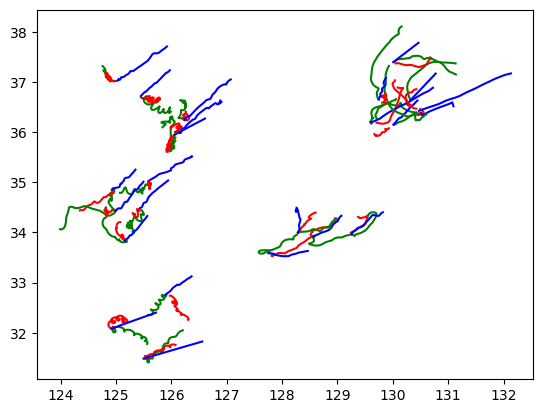

In [52]:
sum_LSTM_NCLS, sum_BaseModel_NCLS, sum_LSTM_lon_mae, sum_LSTM_lat_mae, sum_BaseModel_lon_mae, sum_BaseModel_lat_mae = 0, 0, 0, 0, 0, 0
# basemodel_lon_mae, basemodel_lat_mae, LSTM_lon_mae, LSTM_lat_mae, basemodel_NCLS, LSTM_NCLS
# 모델 
# 특징인자 
for i in range(len(dataset_list)): 
    model_list[i].drift_trajection_show()
    print('------------------Model',i+1,'-------------------')
    print('BaseModel의 lon_mae : ',evaluation_list[i][0])
    print('BaseModel의 lat_mae : ',evaluation_list[i][1])
    print('LSTM의 lon_mae :  : ',evaluation_list[i][2])
    print('LSTM의 lon_mae : ',evaluation_list[i][3])
    
    print('BaseModel의 NCLS : ',evaluation_list[i][4])
    print('LSTM의 NCLS : ',evaluation_list[i][5])
    
    # 평균 구하기
    sum_BaseModel_lon_mae += evaluation_list[i][0]
    sum_BaseModel_lat_mae += evaluation_list[i][1]
    sum_LSTM_lon_mae += evaluation_list[i][2]
    sum_LSTM_lat_mae += evaluation_list[i][3]
    sum_LSTM_NCLS += evaluation_list[i][4]
    sum_BaseModel_NCLS += evaluation_list[i][5]
    print('----------------------------------------')
    print('')

print('BaseModel의 lon_mae 평균 : ', sum_BaseModel_lon_mae/len(evaluation_list))
print('BaseModel의 lat_mae NCLS 평균 : ', sum_BaseModel_lat_mae/len(evaluation_list))
print('LSTM의 lon_mae 평균 : ', sum_LSTM_lon_mae/len(evaluation_list))
print('LSTM의 lat_mae 평균 : ', sum_LSTM_lat_mae/len(evaluation_list))
print('LSTM의 NCLS 평균 : ', sum_LSTM_NCLS/len(evaluation_list))
print('BaseModel의 NCLS 평균 : ', sum_BaseModel_NCLS/len(evaluation_list))


LSTM의 NCLS 0.3717150470083672
baseline의 NCLS의 NCLS 0


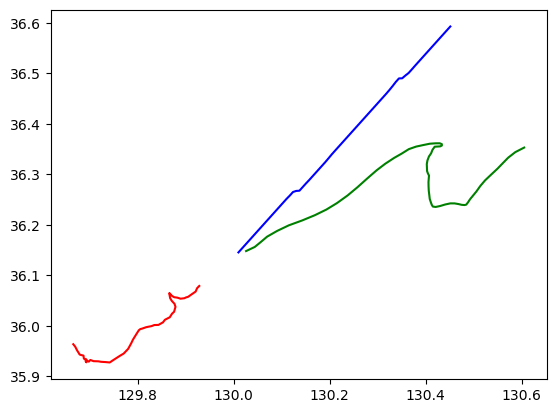

In [127]:
print('LSTM의 NCLS',evaluation_list[1][3])
print('baseline의 NCLS의 NCLS',evaluation_list[1][2])
model_list[1].drift_trajection_show()

LSTM의 NCLS 0.577549124550915
baseline의 NCLS의 NCLS 0


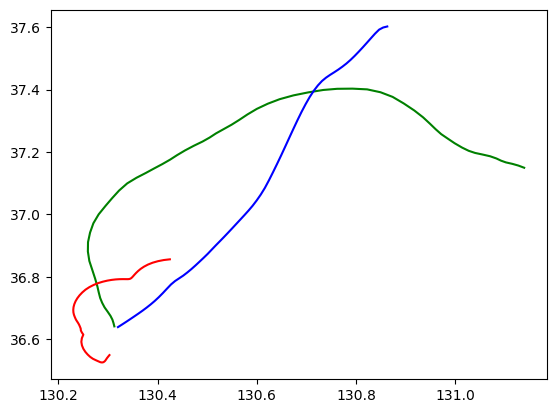

In [128]:
print('LSTM의 NCLS',evaluation_list[2][3])
print('baseline의 NCLS의 NCLS',evaluation_list[2][2])
model_list[2].drift_trajection_show()

LSTM의 NCLS 0.4585063731616238
baseline의 NCLS의 NCLS 0.4369279041003248


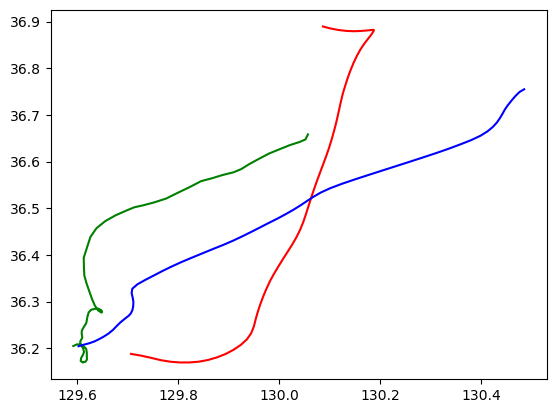

In [129]:
print('LSTM의 NCLS',evaluation_list[3][3])
print('baseline의 NCLS의 NCLS',evaluation_list[3][2])
model_list[3].drift_trajection_show()

LSTM의 NCLS 0.5241515534649479
baseline의 NCLS의 NCLS 0.4048533068018004


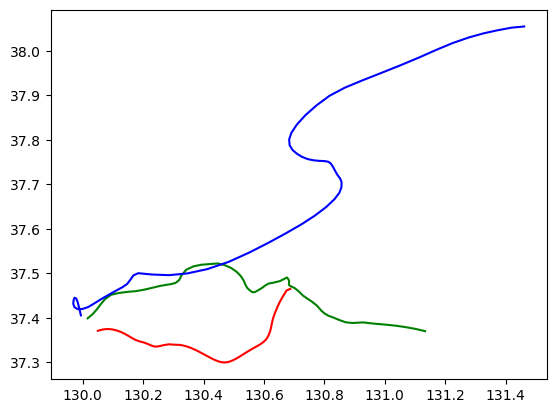

In [92]:
print('LSTM의 NCLS',evaluation_list[5][3])
print('baseline의 NCLS의 NCLS',evaluation_list[5][2])
model_list[5].drift_trajection_show()

In [301]:
LSTM_avg = 0
baseline_avg = 0
for i in range(len(evaluation_list)):
    LSTM_avg += evaluation_list[i][3]
    baseline_avg += evaluation_list[i][2]    
print('LSTM_avg = ', LSTM_avg/24)
print('baseline_avg = ', baseline_avg/24)

LSTM_avg =  0.9533415700787377
baseline_avg =  0.4253995390417693


LSTM의 NCLS 0.5054730399331206
baseline의 NCLS의 NCLS 0


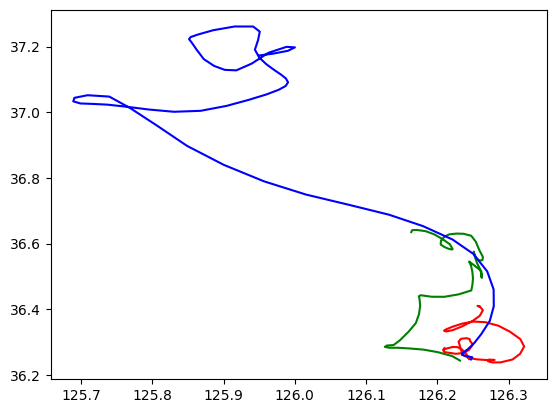

In [94]:
print('LSTM의 NCLS',evaluation_list[8][3])
print('baseline의 NCLS의 NCLS',evaluation_list[8][2])
model_list[8].drift_trajection_show()

LSTM의 NCLS 0.2586528109260895
baseline의 NCLS의 NCLS 0.6431632972106718


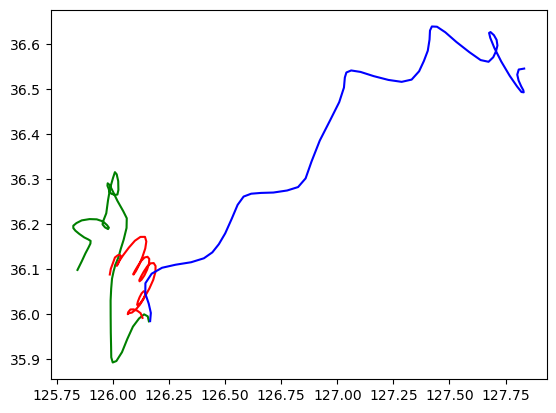

In [93]:
print('LSTM의 NCLS',evaluation_list[9][3])
print('baseline의 NCLS의 NCLS',evaluation_list[9][2])
model_list[9].drift_trajection_show()

In [ ]:
from keras.models import load_model
model_list[6].model_lon.save('LSTM_best_NCLS_lon_model.h5')
model_list[6].model_lat.save('LSTM_best_NCLS_lat_model.h5')

In [175]:
# 태훈 연구생과 비교함수 (NCLS 동일한 것을 확인했다.)
def baseline_NCLS_score(test_dataset): 
    # 실제값 # (72,)
    value_lon = test_dataset['obs_x1_lon']
    value_lon = np.array(value_lon)
    value_lat = test_dataset['obs_x1_lat']
    value_lat = np.array(value_lat)
    
    # 예측값 구하기 # (72,)
    pre_lon = test_dataset['model_x2_lon']
    pre_lon = np.array(pre_lon)
    pre_lat = test_dataset['model_x2_lat']
    pre_lat = np.array(pre_lat)
    print('pre_lon = ', pre_lon.shape)
    
    # d_i 구하기
    d_list = list()
    for i in range(1,value_lon.shape[0]):
        # 위도 1도는 111.321 # 경도 1도는 55.802km
        height = value_lon[i] - pre_lon[i]
        d_lon = 55.802 * height  
        
        width = value_lat[i] - pre_lat[i]
        d_lat = 111.321 * width 
        
        # 거리 구하기
        point_distance = np.sqrt(np.power(d_lon,2) + np.power(d_lat,2))
        d_list.append(point_distance)

    # dl_i 구하기 
    dl_list = list()
    for i in range(1,pre_lon.shape[0]):
        # 위도 1도는 111.321  # 경도 1도는 55.802km
        height = pre_lon[i] - pre_lon[i-1]
        d_lon = 55.802 * height  
        width = pre_lat[i] - pre_lat[i-1]
        d_lat = 111.321 * width 
        # 거리 구하기
        point_distance = np.sqrt(np.power(d_lon,2) + np.power(d_lat,2))
        dl_list.append(point_distance)
    # s 구하기
    dl_sum,d_sum, o_sum, s = [], 0, 0, 0
    
    for i in range(len(d_list)):
        d_sum += d_list[i]

    # dl list
    for i in range(len(dl_list)):
        temp = 0
        for j in range(i+1):
            temp += dl_list[j]
        dl_sum.append(temp)
    
    for i in range(len(dl_sum)):
        o_sum += dl_sum[i]
    
    s = d_sum/o_sum
    ss_score = 1-s
    return s, ss_score

In [184]:
s, ss_score = baseline_NCLS_score(dataset_list[5])
print(s)
print(ss_score)

pre_lon =  (72,)
0.4915782176328391
0.5084217823671608


In [ ]:
li = [1,2,3,4,5]
li[]